## NLP Steam Reviews - Data Cleaning & EDA

In this notebook, we'll start cleaning the data to remove nonsence records as well as perform some EDA to get an idea of the sentiments within the reviews.

In [2]:
import numpy as np
import pandas as pd
import pprint
from IPython.display import Image
import stylecloud
import matplotlib.pyplot as plt
import seaborn as sns

import time
import re
import os
import ast
import time
import json
import sys
import gensim
from gensim import corpora, models, similarities, downloader
import nltk
import spacy
from collections import Counter, defaultdict
from itertools import chain
from sklearn.pipeline import Pipeline

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

import warnings
warnings.filterwarnings('ignore')

In [3]:
elden_ring_reviews = pd.read_csv("elden_ring_reviews.csv")
elden_ring_reviews.drop(columns='Unnamed: 0', inplace=True)

In [4]:
elden_ring_reviews.head()

,recommendationid,author,language,review,timestamp_created,timestamp_updated,voted_up,votes_up,votes_funny,weighted_vote_score,comment_count,steam_purchase,received_for_free,written_during_early_access
0,112052982,"{'steamid': '76561197971854668', 'num_games_ow...",english,First time with a Dark Souls type game and lov...,1647106589,1647106589,True,13373,1063,0.969001,0,True,False,False
1,111180228,"{'steamid': '76561198142415989', 'num_games_ow...",english,"The note said ""chest ahead"" at the edge of a c...",1645984692,1645984692,True,10448,6200,0.968309,144,True,False,False
2,111834761,"{'steamid': '76561197996565477', 'num_games_ow...",english,you can hug a woman,1646786974,1646786974,True,7580,2737,0.965731,81,False,False,False
3,111321870,"{'steamid': '76561197977618010', 'num_games_ow...",english,If you rush you can make it the hardest Souls ...,1646160050,1646160090,True,4839,63,0.965078,0,True,False,False
4,112422103,"{'steamid': '76561198191736422', 'num_games_ow...",english,First game in a long time where you get exactl...,1647625058,1647625058,True,4968,80,0.963619,0,True,False,False


In [5]:
#It looks like not every review has text, we'll have to impute them.

elden_ring_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 240100 entries, 0 to 240099
Data columns (total 14 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   recommendationid             240100 non-null  int64  
 1   author                       240100 non-null  object 
 2   language                     240100 non-null  object 
 3   review                       239450 non-null  object 
 4   timestamp_created            240100 non-null  int64  
 5   timestamp_updated            240100 non-null  int64  
 6   voted_up                     240100 non-null  bool   
 7   votes_up                     240100 non-null  int64  
 8   votes_funny                  240100 non-null  int64  
 9   weighted_vote_score          240100 non-null  float64
 10  comment_count                240100 non-null  int64  
 11  steam_purchase               240100 non-null  bool   
 12  received_for_free            240100 non-null  bool   
 13 

<i>review</i> is the only column where we have missing values. Since we only want to tokenize reviews that are not blank or null, I will impute them after tokenization. We have 650 missing reviews, so imputing them with something noticeable shouldn't throw off the EDA we perform. If it does, we'll simply skip over them.

In [6]:
nlp = spacy.load('en_core_web_sm')

extra_stop_words = ['\n', '\t'] #a list where if we find any particular stop words we wish to add, add here and update them

In [7]:
texts = elden_ring_reviews.loc[:, 'review'].tolist()

In [8]:
texts[:10]

["First time with a Dark Souls type game and loving it. I am 52 so apparently it's never too late to get good.",
 'The note said "chest ahead" at the edge of a cliff with nothing in sight...there were plenty of bloodstains but they must\'ve missed the jump... I had to be sure\n',
 'you can hug a woman',
 'If you rush you can make it the hardest Souls game you\'ve ever played. \nIf you take it a bit slower, it will be similar in difficulty to the old games. \nIf you take it very slow and out-level content it also fits the bit more casual player, although don\'t think it will be easy.\n\nThe open world and "questing system" are the new benchmark for the entire genre. For me it\'s one of the best games I\'ve ever played.\n\nOpinion might change along the way as I am only half way, will update accordingly.',
 'First game in a long time where you get exactly what you payed for and exactly what was advertised, no micro transactions, no battle pass, just a massive playground where the only on

In [18]:
#adding \n and \t to stopwords to eliminate these from the data

nlp.Defaults.stop_words.update(extra_stop_words)

In [19]:
#tokenizer function to process the reviews data into lowercase, lemmatized text, as well as
#filtering out words that are stopwords, puncuation, and ensuring they are alpha-numeric to get
#rid of special characters.

def review_tokenizer(text):
    return [token.lemma_.lower() for token in nlp(text) if not token.is_stop and not token.is_punct and str(token).isalnum()]



In [20]:
tokenized_texts = []

#This is going to take a while..
for i, text in enumerate(texts):
    #print(review_tokenizer(text))
    print('Text ', i)
    
    if pd.isnull(text):
        tokenized_texts.append(['NO REVIEW']) #maybe dashes are better than a word in order to distinguish
    else:
        tokenized_texts.append(review_tokenizer(text))

Text  0
Text  1
Text  2
Text  3
Text  4
Text  5
Text  6
Text  7
Text  8
Text  9
Text  10
Text  11
Text  12
Text  13
Text  14
Text  15
Text  16
Text  17
Text  18
Text  19
Text  20
Text  21
Text  22
Text  23
Text  24
Text  25
Text  26
Text  27
Text  28
Text  29
Text  30
Text  31
Text  32
Text  33
Text  34
Text  35
Text  36
Text  37
Text  38
Text  39
Text  40
Text  41
Text  42
Text  43
Text  44
Text  45
Text  46
Text  47
Text  48
Text  49
Text  50
Text  51
Text  52
Text  53
Text  54
Text  55
Text  56
Text  57
Text  58
Text  59
Text  60
Text  61
Text  62
Text  63
Text  64
Text  65
Text  66
Text  67
Text  68
Text  69
Text  70
Text  71
Text  72
Text  73
Text  74
Text  75
Text  76
Text  77
Text  78
Text  79
Text  80
Text  81
Text  82
Text  83
Text  84
Text  85
Text  86
Text  87
Text  88
Text  89
Text  90
Text  91
Text  92
Text  93
Text  94
Text  95
Text  96
Text  97
Text  98
Text  99
Text  100
Text  101
Text  102
Text  103
Text  104
Text  105
Text  106
Text  107
Text  108
Text  109
Text  110


Text  830
Text  831
Text  832
Text  833
Text  834
Text  835
Text  836
Text  837
Text  838
Text  839
Text  840
Text  841
Text  842
Text  843
Text  844
Text  845
Text  846
Text  847
Text  848
Text  849
Text  850
Text  851
Text  852
Text  853
Text  854
Text  855
Text  856
Text  857
Text  858
Text  859
Text  860
Text  861
Text  862
Text  863
Text  864
Text  865
Text  866
Text  867
Text  868
Text  869
Text  870
Text  871
Text  872
Text  873
Text  874
Text  875
Text  876
Text  877
Text  878
Text  879
Text  880
Text  881
Text  882
Text  883
Text  884
Text  885
Text  886
Text  887
Text  888
Text  889
Text  890
Text  891
Text  892
Text  893
Text  894
Text  895
Text  896
Text  897
Text  898
Text  899
Text  900
Text  901
Text  902
Text  903
Text  904
Text  905
Text  906
Text  907
Text  908
Text  909
Text  910
Text  911
Text  912
Text  913
Text  914
Text  915
Text  916
Text  917
Text  918
Text  919
Text  920
Text  921
Text  922
Text  923
Text  924
Text  925
Text  926
Text  927
Text  928
Text  929


Text  1590
Text  1591
Text  1592
Text  1593
Text  1594
Text  1595
Text  1596
Text  1597
Text  1598
Text  1599
Text  1600
Text  1601
Text  1602
Text  1603
Text  1604
Text  1605
Text  1606
Text  1607
Text  1608
Text  1609
Text  1610
Text  1611
Text  1612
Text  1613
Text  1614
Text  1615
Text  1616
Text  1617
Text  1618
Text  1619
Text  1620
Text  1621
Text  1622
Text  1623
Text  1624
Text  1625
Text  1626
Text  1627
Text  1628
Text  1629
Text  1630
Text  1631
Text  1632
Text  1633
Text  1634
Text  1635
Text  1636
Text  1637
Text  1638
Text  1639
Text  1640
Text  1641
Text  1642
Text  1643
Text  1644
Text  1645
Text  1646
Text  1647
Text  1648
Text  1649
Text  1650
Text  1651
Text  1652
Text  1653
Text  1654
Text  1655
Text  1656
Text  1657
Text  1658
Text  1659
Text  1660
Text  1661
Text  1662
Text  1663
Text  1664
Text  1665
Text  1666
Text  1667
Text  1668
Text  1669
Text  1670
Text  1671
Text  1672
Text  1673
Text  1674
Text  1675
Text  1676
Text  1677
Text  1678
Text  1679
Text  1680

Text  2334
Text  2335
Text  2336
Text  2337
Text  2338
Text  2339
Text  2340
Text  2341
Text  2342
Text  2343
Text  2344
Text  2345
Text  2346
Text  2347
Text  2348
Text  2349
Text  2350
Text  2351
Text  2352
Text  2353
Text  2354
Text  2355
Text  2356
Text  2357
Text  2358
Text  2359
Text  2360
Text  2361
Text  2362
Text  2363
Text  2364
Text  2365
Text  2366
Text  2367
Text  2368
Text  2369
Text  2370
Text  2371
Text  2372
Text  2373
Text  2374
Text  2375
Text  2376
Text  2377
Text  2378
Text  2379
Text  2380
Text  2381
Text  2382
Text  2383
Text  2384
Text  2385
Text  2386
Text  2387
Text  2388
Text  2389
Text  2390
Text  2391
Text  2392
Text  2393
Text  2394
Text  2395
Text  2396
Text  2397
Text  2398
Text  2399
Text  2400
Text  2401
Text  2402
Text  2403
Text  2404
Text  2405
Text  2406
Text  2407
Text  2408
Text  2409
Text  2410
Text  2411
Text  2412
Text  2413
Text  2414
Text  2415
Text  2416
Text  2417
Text  2418
Text  2419
Text  2420
Text  2421
Text  2422
Text  2423
Text  2424

Text  3078
Text  3079
Text  3080
Text  3081
Text  3082
Text  3083
Text  3084
Text  3085
Text  3086
Text  3087
Text  3088
Text  3089
Text  3090
Text  3091
Text  3092
Text  3093
Text  3094
Text  3095
Text  3096
Text  3097
Text  3098
Text  3099
Text  3100
Text  3101
Text  3102
Text  3103
Text  3104
Text  3105
Text  3106
Text  3107
Text  3108
Text  3109
Text  3110
Text  3111
Text  3112
Text  3113
Text  3114
Text  3115
Text  3116
Text  3117
Text  3118
Text  3119
Text  3120
Text  3121
Text  3122
Text  3123
Text  3124
Text  3125
Text  3126
Text  3127
Text  3128
Text  3129
Text  3130
Text  3131
Text  3132
Text  3133
Text  3134
Text  3135
Text  3136
Text  3137
Text  3138
Text  3139
Text  3140
Text  3141
Text  3142
Text  3143
Text  3144
Text  3145
Text  3146
Text  3147
Text  3148
Text  3149
Text  3150
Text  3151
Text  3152
Text  3153
Text  3154
Text  3155
Text  3156
Text  3157
Text  3158
Text  3159
Text  3160
Text  3161
Text  3162
Text  3163
Text  3164
Text  3165
Text  3166
Text  3167
Text  3168

Text  3822
Text  3823
Text  3824
Text  3825
Text  3826
Text  3827
Text  3828
Text  3829
Text  3830
Text  3831
Text  3832
Text  3833
Text  3834
Text  3835
Text  3836
Text  3837
Text  3838
Text  3839
Text  3840
Text  3841
Text  3842
Text  3843
Text  3844
Text  3845
Text  3846
Text  3847
Text  3848
Text  3849
Text  3850
Text  3851
Text  3852
Text  3853
Text  3854
Text  3855
Text  3856
Text  3857
Text  3858
Text  3859
Text  3860
Text  3861
Text  3862
Text  3863
Text  3864
Text  3865
Text  3866
Text  3867
Text  3868
Text  3869
Text  3870
Text  3871
Text  3872
Text  3873
Text  3874
Text  3875
Text  3876
Text  3877
Text  3878
Text  3879
Text  3880
Text  3881
Text  3882
Text  3883
Text  3884
Text  3885
Text  3886
Text  3887
Text  3888
Text  3889
Text  3890
Text  3891
Text  3892
Text  3893
Text  3894
Text  3895
Text  3896
Text  3897
Text  3898
Text  3899
Text  3900
Text  3901
Text  3902
Text  3903
Text  3904
Text  3905
Text  3906
Text  3907
Text  3908
Text  3909
Text  3910
Text  3911
Text  3912

Text  4566
Text  4567
Text  4568
Text  4569
Text  4570
Text  4571
Text  4572
Text  4573
Text  4574
Text  4575
Text  4576
Text  4577
Text  4578
Text  4579
Text  4580
Text  4581
Text  4582
Text  4583
Text  4584
Text  4585
Text  4586
Text  4587
Text  4588
Text  4589
Text  4590
Text  4591
Text  4592
Text  4593
Text  4594
Text  4595
Text  4596
Text  4597
Text  4598
Text  4599
Text  4600
Text  4601
Text  4602
Text  4603
Text  4604
Text  4605
Text  4606
Text  4607
Text  4608
Text  4609
Text  4610
Text  4611
Text  4612
Text  4613
Text  4614
Text  4615
Text  4616
Text  4617
Text  4618
Text  4619
Text  4620
Text  4621
Text  4622
Text  4623
Text  4624
Text  4625
Text  4626
Text  4627
Text  4628
Text  4629
Text  4630
Text  4631
Text  4632
Text  4633
Text  4634
Text  4635
Text  4636
Text  4637
Text  4638
Text  4639
Text  4640
Text  4641
Text  4642
Text  4643
Text  4644
Text  4645
Text  4646
Text  4647
Text  4648
Text  4649
Text  4650
Text  4651
Text  4652
Text  4653
Text  4654
Text  4655
Text  4656

Text  5310
Text  5311
Text  5312
Text  5313
Text  5314
Text  5315
Text  5316
Text  5317
Text  5318
Text  5319
Text  5320
Text  5321
Text  5322
Text  5323
Text  5324
Text  5325
Text  5326
Text  5327
Text  5328
Text  5329
Text  5330
Text  5331
Text  5332
Text  5333
Text  5334
Text  5335
Text  5336
Text  5337
Text  5338
Text  5339
Text  5340
Text  5341
Text  5342
Text  5343
Text  5344
Text  5345
Text  5346
Text  5347
Text  5348
Text  5349
Text  5350
Text  5351
Text  5352
Text  5353
Text  5354
Text  5355
Text  5356
Text  5357
Text  5358
Text  5359
Text  5360
Text  5361
Text  5362
Text  5363
Text  5364
Text  5365
Text  5366
Text  5367
Text  5368
Text  5369
Text  5370
Text  5371
Text  5372
Text  5373
Text  5374
Text  5375
Text  5376
Text  5377
Text  5378
Text  5379
Text  5380
Text  5381
Text  5382
Text  5383
Text  5384
Text  5385
Text  5386
Text  5387
Text  5388
Text  5389
Text  5390
Text  5391
Text  5392
Text  5393
Text  5394
Text  5395
Text  5396
Text  5397
Text  5398
Text  5399
Text  5400

Text  6054
Text  6055
Text  6056
Text  6057
Text  6058
Text  6059
Text  6060
Text  6061
Text  6062
Text  6063
Text  6064
Text  6065
Text  6066
Text  6067
Text  6068
Text  6069
Text  6070
Text  6071
Text  6072
Text  6073
Text  6074
Text  6075
Text  6076
Text  6077
Text  6078
Text  6079
Text  6080
Text  6081
Text  6082
Text  6083
Text  6084
Text  6085
Text  6086
Text  6087
Text  6088
Text  6089
Text  6090
Text  6091
Text  6092
Text  6093
Text  6094
Text  6095
Text  6096
Text  6097
Text  6098
Text  6099
Text  6100
Text  6101
Text  6102
Text  6103
Text  6104
Text  6105
Text  6106
Text  6107
Text  6108
Text  6109
Text  6110
Text  6111
Text  6112
Text  6113
Text  6114
Text  6115
Text  6116
Text  6117
Text  6118
Text  6119
Text  6120
Text  6121
Text  6122
Text  6123
Text  6124
Text  6125
Text  6126
Text  6127
Text  6128
Text  6129
Text  6130
Text  6131
Text  6132
Text  6133
Text  6134
Text  6135
Text  6136
Text  6137
Text  6138
Text  6139
Text  6140
Text  6141
Text  6142
Text  6143
Text  6144

Text  6798
Text  6799
Text  6800
Text  6801
Text  6802
Text  6803
Text  6804
Text  6805
Text  6806
Text  6807
Text  6808
Text  6809
Text  6810
Text  6811
Text  6812
Text  6813
Text  6814
Text  6815
Text  6816
Text  6817
Text  6818
Text  6819
Text  6820
Text  6821
Text  6822
Text  6823
Text  6824
Text  6825
Text  6826
Text  6827
Text  6828
Text  6829
Text  6830
Text  6831
Text  6832
Text  6833
Text  6834
Text  6835
Text  6836
Text  6837
Text  6838
Text  6839
Text  6840
Text  6841
Text  6842
Text  6843
Text  6844
Text  6845
Text  6846
Text  6847
Text  6848
Text  6849
Text  6850
Text  6851
Text  6852
Text  6853
Text  6854
Text  6855
Text  6856
Text  6857
Text  6858
Text  6859
Text  6860
Text  6861
Text  6862
Text  6863
Text  6864
Text  6865
Text  6866
Text  6867
Text  6868
Text  6869
Text  6870
Text  6871
Text  6872
Text  6873
Text  6874
Text  6875
Text  6876
Text  6877
Text  6878
Text  6879
Text  6880
Text  6881
Text  6882
Text  6883
Text  6884
Text  6885
Text  6886
Text  6887
Text  6888

Text  7542
Text  7543
Text  7544
Text  7545
Text  7546
Text  7547
Text  7548
Text  7549
Text  7550
Text  7551
Text  7552
Text  7553
Text  7554
Text  7555
Text  7556
Text  7557
Text  7558
Text  7559
Text  7560
Text  7561
Text  7562
Text  7563
Text  7564
Text  7565
Text  7566
Text  7567
Text  7568
Text  7569
Text  7570
Text  7571
Text  7572
Text  7573
Text  7574
Text  7575
Text  7576
Text  7577
Text  7578
Text  7579
Text  7580
Text  7581
Text  7582
Text  7583
Text  7584
Text  7585
Text  7586
Text  7587
Text  7588
Text  7589
Text  7590
Text  7591
Text  7592
Text  7593
Text  7594
Text  7595
Text  7596
Text  7597
Text  7598
Text  7599
Text  7600
Text  7601
Text  7602
Text  7603
Text  7604
Text  7605
Text  7606
Text  7607
Text  7608
Text  7609
Text  7610
Text  7611
Text  7612
Text  7613
Text  7614
Text  7615
Text  7616
Text  7617
Text  7618
Text  7619
Text  7620
Text  7621
Text  7622
Text  7623
Text  7624
Text  7625
Text  7626
Text  7627
Text  7628
Text  7629
Text  7630
Text  7631
Text  7632

Text  8286
Text  8287
Text  8288
Text  8289
Text  8290
Text  8291
Text  8292
Text  8293
Text  8294
Text  8295
Text  8296
Text  8297
Text  8298
Text  8299
Text  8300
Text  8301
Text  8302
Text  8303
Text  8304
Text  8305
Text  8306
Text  8307
Text  8308
Text  8309
Text  8310
Text  8311
Text  8312
Text  8313
Text  8314
Text  8315
Text  8316
Text  8317
Text  8318
Text  8319
Text  8320
Text  8321
Text  8322
Text  8323
Text  8324
Text  8325
Text  8326
Text  8327
Text  8328
Text  8329
Text  8330
Text  8331
Text  8332
Text  8333
Text  8334
Text  8335
Text  8336
Text  8337
Text  8338
Text  8339
Text  8340
Text  8341
Text  8342
Text  8343
Text  8344
Text  8345
Text  8346
Text  8347
Text  8348
Text  8349
Text  8350
Text  8351
Text  8352
Text  8353
Text  8354
Text  8355
Text  8356
Text  8357
Text  8358
Text  8359
Text  8360
Text  8361
Text  8362
Text  8363
Text  8364
Text  8365
Text  8366
Text  8367
Text  8368
Text  8369
Text  8370
Text  8371
Text  8372
Text  8373
Text  8374
Text  8375
Text  8376

Text  9030
Text  9031
Text  9032
Text  9033
Text  9034
Text  9035
Text  9036
Text  9037
Text  9038
Text  9039
Text  9040
Text  9041
Text  9042
Text  9043
Text  9044
Text  9045
Text  9046
Text  9047
Text  9048
Text  9049
Text  9050
Text  9051
Text  9052
Text  9053
Text  9054
Text  9055
Text  9056
Text  9057
Text  9058
Text  9059
Text  9060
Text  9061
Text  9062
Text  9063
Text  9064
Text  9065
Text  9066
Text  9067
Text  9068
Text  9069
Text  9070
Text  9071
Text  9072
Text  9073
Text  9074
Text  9075
Text  9076
Text  9077
Text  9078
Text  9079
Text  9080
Text  9081
Text  9082
Text  9083
Text  9084
Text  9085
Text  9086
Text  9087
Text  9088
Text  9089
Text  9090
Text  9091
Text  9092
Text  9093
Text  9094
Text  9095
Text  9096
Text  9097
Text  9098
Text  9099
Text  9100
Text  9101
Text  9102
Text  9103
Text  9104
Text  9105
Text  9106
Text  9107
Text  9108
Text  9109
Text  9110
Text  9111
Text  9112
Text  9113
Text  9114
Text  9115
Text  9116
Text  9117
Text  9118
Text  9119
Text  9120

Text  9774
Text  9775
Text  9776
Text  9777
Text  9778
Text  9779
Text  9780
Text  9781
Text  9782
Text  9783
Text  9784
Text  9785
Text  9786
Text  9787
Text  9788
Text  9789
Text  9790
Text  9791
Text  9792
Text  9793
Text  9794
Text  9795
Text  9796
Text  9797
Text  9798
Text  9799
Text  9800
Text  9801
Text  9802
Text  9803
Text  9804
Text  9805
Text  9806
Text  9807
Text  9808
Text  9809
Text  9810
Text  9811
Text  9812
Text  9813
Text  9814
Text  9815
Text  9816
Text  9817
Text  9818
Text  9819
Text  9820
Text  9821
Text  9822
Text  9823
Text  9824
Text  9825
Text  9826
Text  9827
Text  9828
Text  9829
Text  9830
Text  9831
Text  9832
Text  9833
Text  9834
Text  9835
Text  9836
Text  9837
Text  9838
Text  9839
Text  9840
Text  9841
Text  9842
Text  9843
Text  9844
Text  9845
Text  9846
Text  9847
Text  9848
Text  9849
Text  9850
Text  9851
Text  9852
Text  9853
Text  9854
Text  9855
Text  9856
Text  9857
Text  9858
Text  9859
Text  9860
Text  9861
Text  9862
Text  9863
Text  9864

Text  10475
Text  10476
Text  10477
Text  10478
Text  10479
Text  10480
Text  10481
Text  10482
Text  10483
Text  10484
Text  10485
Text  10486
Text  10487
Text  10488
Text  10489
Text  10490
Text  10491
Text  10492
Text  10493
Text  10494
Text  10495
Text  10496
Text  10497
Text  10498
Text  10499
Text  10500
Text  10501
Text  10502
Text  10503
Text  10504
Text  10505
Text  10506
Text  10507
Text  10508
Text  10509
Text  10510
Text  10511
Text  10512
Text  10513
Text  10514
Text  10515
Text  10516
Text  10517
Text  10518
Text  10519
Text  10520
Text  10521
Text  10522
Text  10523
Text  10524
Text  10525
Text  10526
Text  10527
Text  10528
Text  10529
Text  10530
Text  10531
Text  10532
Text  10533
Text  10534
Text  10535
Text  10536
Text  10537
Text  10538
Text  10539
Text  10540
Text  10541
Text  10542
Text  10543
Text  10544
Text  10545
Text  10546
Text  10547
Text  10548
Text  10549
Text  10550
Text  10551
Text  10552
Text  10553
Text  10554
Text  10555
Text  10556
Text  10557
Text

Text  11157
Text  11158
Text  11159
Text  11160
Text  11161
Text  11162
Text  11163
Text  11164
Text  11165
Text  11166
Text  11167
Text  11168
Text  11169
Text  11170
Text  11171
Text  11172
Text  11173
Text  11174
Text  11175
Text  11176
Text  11177
Text  11178
Text  11179
Text  11180
Text  11181
Text  11182
Text  11183
Text  11184
Text  11185
Text  11186
Text  11187
Text  11188
Text  11189
Text  11190
Text  11191
Text  11192
Text  11193
Text  11194
Text  11195
Text  11196
Text  11197
Text  11198
Text  11199
Text  11200
Text  11201
Text  11202
Text  11203
Text  11204
Text  11205
Text  11206
Text  11207
Text  11208
Text  11209
Text  11210
Text  11211
Text  11212
Text  11213
Text  11214
Text  11215
Text  11216
Text  11217
Text  11218
Text  11219
Text  11220
Text  11221
Text  11222
Text  11223
Text  11224
Text  11225
Text  11226
Text  11227
Text  11228
Text  11229
Text  11230
Text  11231
Text  11232
Text  11233
Text  11234
Text  11235
Text  11236
Text  11237
Text  11238
Text  11239
Text

Text  11839
Text  11840
Text  11841
Text  11842
Text  11843
Text  11844
Text  11845
Text  11846
Text  11847
Text  11848
Text  11849
Text  11850
Text  11851
Text  11852
Text  11853
Text  11854
Text  11855
Text  11856
Text  11857
Text  11858
Text  11859
Text  11860
Text  11861
Text  11862
Text  11863
Text  11864
Text  11865
Text  11866
Text  11867
Text  11868
Text  11869
Text  11870
Text  11871
Text  11872
Text  11873
Text  11874
Text  11875
Text  11876
Text  11877
Text  11878
Text  11879
Text  11880
Text  11881
Text  11882
Text  11883
Text  11884
Text  11885
Text  11886
Text  11887
Text  11888
Text  11889
Text  11890
Text  11891
Text  11892
Text  11893
Text  11894
Text  11895
Text  11896
Text  11897
Text  11898
Text  11899
Text  11900
Text  11901
Text  11902
Text  11903
Text  11904
Text  11905
Text  11906
Text  11907
Text  11908
Text  11909
Text  11910
Text  11911
Text  11912
Text  11913
Text  11914
Text  11915
Text  11916
Text  11917
Text  11918
Text  11919
Text  11920
Text  11921
Text

Text  12521
Text  12522
Text  12523
Text  12524
Text  12525
Text  12526
Text  12527
Text  12528
Text  12529
Text  12530
Text  12531
Text  12532
Text  12533
Text  12534
Text  12535
Text  12536
Text  12537
Text  12538
Text  12539
Text  12540
Text  12541
Text  12542
Text  12543
Text  12544
Text  12545
Text  12546
Text  12547
Text  12548
Text  12549
Text  12550
Text  12551
Text  12552
Text  12553
Text  12554
Text  12555
Text  12556
Text  12557
Text  12558
Text  12559
Text  12560
Text  12561
Text  12562
Text  12563
Text  12564
Text  12565
Text  12566
Text  12567
Text  12568
Text  12569
Text  12570
Text  12571
Text  12572
Text  12573
Text  12574
Text  12575
Text  12576
Text  12577
Text  12578
Text  12579
Text  12580
Text  12581
Text  12582
Text  12583
Text  12584
Text  12585
Text  12586
Text  12587
Text  12588
Text  12589
Text  12590
Text  12591
Text  12592
Text  12593
Text  12594
Text  12595
Text  12596
Text  12597
Text  12598
Text  12599
Text  12600
Text  12601
Text  12602
Text  12603
Text

Text  13203
Text  13204
Text  13205
Text  13206
Text  13207
Text  13208
Text  13209
Text  13210
Text  13211
Text  13212
Text  13213
Text  13214
Text  13215
Text  13216
Text  13217
Text  13218
Text  13219
Text  13220
Text  13221
Text  13222
Text  13223
Text  13224
Text  13225
Text  13226
Text  13227
Text  13228
Text  13229
Text  13230
Text  13231
Text  13232
Text  13233
Text  13234
Text  13235
Text  13236
Text  13237
Text  13238
Text  13239
Text  13240
Text  13241
Text  13242
Text  13243
Text  13244
Text  13245
Text  13246
Text  13247
Text  13248
Text  13249
Text  13250
Text  13251
Text  13252
Text  13253
Text  13254
Text  13255
Text  13256
Text  13257
Text  13258
Text  13259
Text  13260
Text  13261
Text  13262
Text  13263
Text  13264
Text  13265
Text  13266
Text  13267
Text  13268
Text  13269
Text  13270
Text  13271
Text  13272
Text  13273
Text  13274
Text  13275
Text  13276
Text  13277
Text  13278
Text  13279
Text  13280
Text  13281
Text  13282
Text  13283
Text  13284
Text  13285
Text

Text  13885
Text  13886
Text  13887
Text  13888
Text  13889
Text  13890
Text  13891
Text  13892
Text  13893
Text  13894
Text  13895
Text  13896
Text  13897
Text  13898
Text  13899
Text  13900
Text  13901
Text  13902
Text  13903
Text  13904
Text  13905
Text  13906
Text  13907
Text  13908
Text  13909
Text  13910
Text  13911
Text  13912
Text  13913
Text  13914
Text  13915
Text  13916
Text  13917
Text  13918
Text  13919
Text  13920
Text  13921
Text  13922
Text  13923
Text  13924
Text  13925
Text  13926
Text  13927
Text  13928
Text  13929
Text  13930
Text  13931
Text  13932
Text  13933
Text  13934
Text  13935
Text  13936
Text  13937
Text  13938
Text  13939
Text  13940
Text  13941
Text  13942
Text  13943
Text  13944
Text  13945
Text  13946
Text  13947
Text  13948
Text  13949
Text  13950
Text  13951
Text  13952
Text  13953
Text  13954
Text  13955
Text  13956
Text  13957
Text  13958
Text  13959
Text  13960
Text  13961
Text  13962
Text  13963
Text  13964
Text  13965
Text  13966
Text  13967
Text

Text  14567
Text  14568
Text  14569
Text  14570
Text  14571
Text  14572
Text  14573
Text  14574
Text  14575
Text  14576
Text  14577
Text  14578
Text  14579
Text  14580
Text  14581
Text  14582
Text  14583
Text  14584
Text  14585
Text  14586
Text  14587
Text  14588
Text  14589
Text  14590
Text  14591
Text  14592
Text  14593
Text  14594
Text  14595
Text  14596
Text  14597
Text  14598
Text  14599
Text  14600
Text  14601
Text  14602
Text  14603
Text  14604
Text  14605
Text  14606
Text  14607
Text  14608
Text  14609
Text  14610
Text  14611
Text  14612
Text  14613
Text  14614
Text  14615
Text  14616
Text  14617
Text  14618
Text  14619
Text  14620
Text  14621
Text  14622
Text  14623
Text  14624
Text  14625
Text  14626
Text  14627
Text  14628
Text  14629
Text  14630
Text  14631
Text  14632
Text  14633
Text  14634
Text  14635
Text  14636
Text  14637
Text  14638
Text  14639
Text  14640
Text  14641
Text  14642
Text  14643
Text  14644
Text  14645
Text  14646
Text  14647
Text  14648
Text  14649
Text

Text  15249
Text  15250
Text  15251
Text  15252
Text  15253
Text  15254
Text  15255
Text  15256
Text  15257
Text  15258
Text  15259
Text  15260
Text  15261
Text  15262
Text  15263
Text  15264
Text  15265
Text  15266
Text  15267
Text  15268
Text  15269
Text  15270
Text  15271
Text  15272
Text  15273
Text  15274
Text  15275
Text  15276
Text  15277
Text  15278
Text  15279
Text  15280
Text  15281
Text  15282
Text  15283
Text  15284
Text  15285
Text  15286
Text  15287
Text  15288
Text  15289
Text  15290
Text  15291
Text  15292
Text  15293
Text  15294
Text  15295
Text  15296
Text  15297
Text  15298
Text  15299
Text  15300
Text  15301
Text  15302
Text  15303
Text  15304
Text  15305
Text  15306
Text  15307
Text  15308
Text  15309
Text  15310
Text  15311
Text  15312
Text  15313
Text  15314
Text  15315
Text  15316
Text  15317
Text  15318
Text  15319
Text  15320
Text  15321
Text  15322
Text  15323
Text  15324
Text  15325
Text  15326
Text  15327
Text  15328
Text  15329
Text  15330
Text  15331
Text

Text  15931
Text  15932
Text  15933
Text  15934
Text  15935
Text  15936
Text  15937
Text  15938
Text  15939
Text  15940
Text  15941
Text  15942
Text  15943
Text  15944
Text  15945
Text  15946
Text  15947
Text  15948
Text  15949
Text  15950
Text  15951
Text  15952
Text  15953
Text  15954
Text  15955
Text  15956
Text  15957
Text  15958
Text  15959
Text  15960
Text  15961
Text  15962
Text  15963
Text  15964
Text  15965
Text  15966
Text  15967
Text  15968
Text  15969
Text  15970
Text  15971
Text  15972
Text  15973
Text  15974
Text  15975
Text  15976
Text  15977
Text  15978
Text  15979
Text  15980
Text  15981
Text  15982
Text  15983
Text  15984
Text  15985
Text  15986
Text  15987
Text  15988
Text  15989
Text  15990
Text  15991
Text  15992
Text  15993
Text  15994
Text  15995
Text  15996
Text  15997
Text  15998
Text  15999
Text  16000
Text  16001
Text  16002
Text  16003
Text  16004
Text  16005
Text  16006
Text  16007
Text  16008
Text  16009
Text  16010
Text  16011
Text  16012
Text  16013
Text

Text  16613
Text  16614
Text  16615
Text  16616
Text  16617
Text  16618
Text  16619
Text  16620
Text  16621
Text  16622
Text  16623
Text  16624
Text  16625
Text  16626
Text  16627
Text  16628
Text  16629
Text  16630
Text  16631
Text  16632
Text  16633
Text  16634
Text  16635
Text  16636
Text  16637
Text  16638
Text  16639
Text  16640
Text  16641
Text  16642
Text  16643
Text  16644
Text  16645
Text  16646
Text  16647
Text  16648
Text  16649
Text  16650
Text  16651
Text  16652
Text  16653
Text  16654
Text  16655
Text  16656
Text  16657
Text  16658
Text  16659
Text  16660
Text  16661
Text  16662
Text  16663
Text  16664
Text  16665
Text  16666
Text  16667
Text  16668
Text  16669
Text  16670
Text  16671
Text  16672
Text  16673
Text  16674
Text  16675
Text  16676
Text  16677
Text  16678
Text  16679
Text  16680
Text  16681
Text  16682
Text  16683
Text  16684
Text  16685
Text  16686
Text  16687
Text  16688
Text  16689
Text  16690
Text  16691
Text  16692
Text  16693
Text  16694
Text  16695
Text

Text  17295
Text  17296
Text  17297
Text  17298
Text  17299
Text  17300
Text  17301
Text  17302
Text  17303
Text  17304
Text  17305
Text  17306
Text  17307
Text  17308
Text  17309
Text  17310
Text  17311
Text  17312
Text  17313
Text  17314
Text  17315
Text  17316
Text  17317
Text  17318
Text  17319
Text  17320
Text  17321
Text  17322
Text  17323
Text  17324
Text  17325
Text  17326
Text  17327
Text  17328
Text  17329
Text  17330
Text  17331
Text  17332
Text  17333
Text  17334
Text  17335
Text  17336
Text  17337
Text  17338
Text  17339
Text  17340
Text  17341
Text  17342
Text  17343
Text  17344
Text  17345
Text  17346
Text  17347
Text  17348
Text  17349
Text  17350
Text  17351
Text  17352
Text  17353
Text  17354
Text  17355
Text  17356
Text  17357
Text  17358
Text  17359
Text  17360
Text  17361
Text  17362
Text  17363
Text  17364
Text  17365
Text  17366
Text  17367
Text  17368
Text  17369
Text  17370
Text  17371
Text  17372
Text  17373
Text  17374
Text  17375
Text  17376
Text  17377
Text

Text  17977
Text  17978
Text  17979
Text  17980
Text  17981
Text  17982
Text  17983
Text  17984
Text  17985
Text  17986
Text  17987
Text  17988
Text  17989
Text  17990
Text  17991
Text  17992
Text  17993
Text  17994
Text  17995
Text  17996
Text  17997
Text  17998
Text  17999
Text  18000
Text  18001
Text  18002
Text  18003
Text  18004
Text  18005
Text  18006
Text  18007
Text  18008
Text  18009
Text  18010
Text  18011
Text  18012
Text  18013
Text  18014
Text  18015
Text  18016
Text  18017
Text  18018
Text  18019
Text  18020
Text  18021
Text  18022
Text  18023
Text  18024
Text  18025
Text  18026
Text  18027
Text  18028
Text  18029
Text  18030
Text  18031
Text  18032
Text  18033
Text  18034
Text  18035
Text  18036
Text  18037
Text  18038
Text  18039
Text  18040
Text  18041
Text  18042
Text  18043
Text  18044
Text  18045
Text  18046
Text  18047
Text  18048
Text  18049
Text  18050
Text  18051
Text  18052
Text  18053
Text  18054
Text  18055
Text  18056
Text  18057
Text  18058
Text  18059
Text

Text  18659
Text  18660
Text  18661
Text  18662
Text  18663
Text  18664
Text  18665
Text  18666
Text  18667
Text  18668
Text  18669
Text  18670
Text  18671
Text  18672
Text  18673
Text  18674
Text  18675
Text  18676
Text  18677
Text  18678
Text  18679
Text  18680
Text  18681
Text  18682
Text  18683
Text  18684
Text  18685
Text  18686
Text  18687
Text  18688
Text  18689
Text  18690
Text  18691
Text  18692
Text  18693
Text  18694
Text  18695
Text  18696
Text  18697
Text  18698
Text  18699
Text  18700
Text  18701
Text  18702
Text  18703
Text  18704
Text  18705
Text  18706
Text  18707
Text  18708
Text  18709
Text  18710
Text  18711
Text  18712
Text  18713
Text  18714
Text  18715
Text  18716
Text  18717
Text  18718
Text  18719
Text  18720
Text  18721
Text  18722
Text  18723
Text  18724
Text  18725
Text  18726
Text  18727
Text  18728
Text  18729
Text  18730
Text  18731
Text  18732
Text  18733
Text  18734
Text  18735
Text  18736
Text  18737
Text  18738
Text  18739
Text  18740
Text  18741
Text

Text  19341
Text  19342
Text  19343
Text  19344
Text  19345
Text  19346
Text  19347
Text  19348
Text  19349
Text  19350
Text  19351
Text  19352
Text  19353
Text  19354
Text  19355
Text  19356
Text  19357
Text  19358
Text  19359
Text  19360
Text  19361
Text  19362
Text  19363
Text  19364
Text  19365
Text  19366
Text  19367
Text  19368
Text  19369
Text  19370
Text  19371
Text  19372
Text  19373
Text  19374
Text  19375
Text  19376
Text  19377
Text  19378
Text  19379
Text  19380
Text  19381
Text  19382
Text  19383
Text  19384
Text  19385
Text  19386
Text  19387
Text  19388
Text  19389
Text  19390
Text  19391
Text  19392
Text  19393
Text  19394
Text  19395
Text  19396
Text  19397
Text  19398
Text  19399
Text  19400
Text  19401
Text  19402
Text  19403
Text  19404
Text  19405
Text  19406
Text  19407
Text  19408
Text  19409
Text  19410
Text  19411
Text  19412
Text  19413
Text  19414
Text  19415
Text  19416
Text  19417
Text  19418
Text  19419
Text  19420
Text  19421
Text  19422
Text  19423
Text

Text  20023
Text  20024
Text  20025
Text  20026
Text  20027
Text  20028
Text  20029
Text  20030
Text  20031
Text  20032
Text  20033
Text  20034
Text  20035
Text  20036
Text  20037
Text  20038
Text  20039
Text  20040
Text  20041
Text  20042
Text  20043
Text  20044
Text  20045
Text  20046
Text  20047
Text  20048
Text  20049
Text  20050
Text  20051
Text  20052
Text  20053
Text  20054
Text  20055
Text  20056
Text  20057
Text  20058
Text  20059
Text  20060
Text  20061
Text  20062
Text  20063
Text  20064
Text  20065
Text  20066
Text  20067
Text  20068
Text  20069
Text  20070
Text  20071
Text  20072
Text  20073
Text  20074
Text  20075
Text  20076
Text  20077
Text  20078
Text  20079
Text  20080
Text  20081
Text  20082
Text  20083
Text  20084
Text  20085
Text  20086
Text  20087
Text  20088
Text  20089
Text  20090
Text  20091
Text  20092
Text  20093
Text  20094
Text  20095
Text  20096
Text  20097
Text  20098
Text  20099
Text  20100
Text  20101
Text  20102
Text  20103
Text  20104
Text  20105
Text

Text  20705
Text  20706
Text  20707
Text  20708
Text  20709
Text  20710
Text  20711
Text  20712
Text  20713
Text  20714
Text  20715
Text  20716
Text  20717
Text  20718
Text  20719
Text  20720
Text  20721
Text  20722
Text  20723
Text  20724
Text  20725
Text  20726
Text  20727
Text  20728
Text  20729
Text  20730
Text  20731
Text  20732
Text  20733
Text  20734
Text  20735
Text  20736
Text  20737
Text  20738
Text  20739
Text  20740
Text  20741
Text  20742
Text  20743
Text  20744
Text  20745
Text  20746
Text  20747
Text  20748
Text  20749
Text  20750
Text  20751
Text  20752
Text  20753
Text  20754
Text  20755
Text  20756
Text  20757
Text  20758
Text  20759
Text  20760
Text  20761
Text  20762
Text  20763
Text  20764
Text  20765
Text  20766
Text  20767
Text  20768
Text  20769
Text  20770
Text  20771
Text  20772
Text  20773
Text  20774
Text  20775
Text  20776
Text  20777
Text  20778
Text  20779
Text  20780
Text  20781
Text  20782
Text  20783
Text  20784
Text  20785
Text  20786
Text  20787
Text

Text  21387
Text  21388
Text  21389
Text  21390
Text  21391
Text  21392
Text  21393
Text  21394
Text  21395
Text  21396
Text  21397
Text  21398
Text  21399
Text  21400
Text  21401
Text  21402
Text  21403
Text  21404
Text  21405
Text  21406
Text  21407
Text  21408
Text  21409
Text  21410
Text  21411
Text  21412
Text  21413
Text  21414
Text  21415
Text  21416
Text  21417
Text  21418
Text  21419
Text  21420
Text  21421
Text  21422
Text  21423
Text  21424
Text  21425
Text  21426
Text  21427
Text  21428
Text  21429
Text  21430
Text  21431
Text  21432
Text  21433
Text  21434
Text  21435
Text  21436
Text  21437
Text  21438
Text  21439
Text  21440
Text  21441
Text  21442
Text  21443
Text  21444
Text  21445
Text  21446
Text  21447
Text  21448
Text  21449
Text  21450
Text  21451
Text  21452
Text  21453
Text  21454
Text  21455
Text  21456
Text  21457
Text  21458
Text  21459
Text  21460
Text  21461
Text  21462
Text  21463
Text  21464
Text  21465
Text  21466
Text  21467
Text  21468
Text  21469
Text

Text  22069
Text  22070
Text  22071
Text  22072
Text  22073
Text  22074
Text  22075
Text  22076
Text  22077
Text  22078
Text  22079
Text  22080
Text  22081
Text  22082
Text  22083
Text  22084
Text  22085
Text  22086
Text  22087
Text  22088
Text  22089
Text  22090
Text  22091
Text  22092
Text  22093
Text  22094
Text  22095
Text  22096
Text  22097
Text  22098
Text  22099
Text  22100
Text  22101
Text  22102
Text  22103
Text  22104
Text  22105
Text  22106
Text  22107
Text  22108
Text  22109
Text  22110
Text  22111
Text  22112
Text  22113
Text  22114
Text  22115
Text  22116
Text  22117
Text  22118
Text  22119
Text  22120
Text  22121
Text  22122
Text  22123
Text  22124
Text  22125
Text  22126
Text  22127
Text  22128
Text  22129
Text  22130
Text  22131
Text  22132
Text  22133
Text  22134
Text  22135
Text  22136
Text  22137
Text  22138
Text  22139
Text  22140
Text  22141
Text  22142
Text  22143
Text  22144
Text  22145
Text  22146
Text  22147
Text  22148
Text  22149
Text  22150
Text  22151
Text

Text  22751
Text  22752
Text  22753
Text  22754
Text  22755
Text  22756
Text  22757
Text  22758
Text  22759
Text  22760
Text  22761
Text  22762
Text  22763
Text  22764
Text  22765
Text  22766
Text  22767
Text  22768
Text  22769
Text  22770
Text  22771
Text  22772
Text  22773
Text  22774
Text  22775
Text  22776
Text  22777
Text  22778
Text  22779
Text  22780
Text  22781
Text  22782
Text  22783
Text  22784
Text  22785
Text  22786
Text  22787
Text  22788
Text  22789
Text  22790
Text  22791
Text  22792
Text  22793
Text  22794
Text  22795
Text  22796
Text  22797
Text  22798
Text  22799
Text  22800
Text  22801
Text  22802
Text  22803
Text  22804
Text  22805
Text  22806
Text  22807
Text  22808
Text  22809
Text  22810
Text  22811
Text  22812
Text  22813
Text  22814
Text  22815
Text  22816
Text  22817
Text  22818
Text  22819
Text  22820
Text  22821
Text  22822
Text  22823
Text  22824
Text  22825
Text  22826
Text  22827
Text  22828
Text  22829
Text  22830
Text  22831
Text  22832
Text  22833
Text

Text  23433
Text  23434
Text  23435
Text  23436
Text  23437
Text  23438
Text  23439
Text  23440
Text  23441
Text  23442
Text  23443
Text  23444
Text  23445
Text  23446
Text  23447
Text  23448
Text  23449
Text  23450
Text  23451
Text  23452
Text  23453
Text  23454
Text  23455
Text  23456
Text  23457
Text  23458
Text  23459
Text  23460
Text  23461
Text  23462
Text  23463
Text  23464
Text  23465
Text  23466
Text  23467
Text  23468
Text  23469
Text  23470
Text  23471
Text  23472
Text  23473
Text  23474
Text  23475
Text  23476
Text  23477
Text  23478
Text  23479
Text  23480
Text  23481
Text  23482
Text  23483
Text  23484
Text  23485
Text  23486
Text  23487
Text  23488
Text  23489
Text  23490
Text  23491
Text  23492
Text  23493
Text  23494
Text  23495
Text  23496
Text  23497
Text  23498
Text  23499
Text  23500
Text  23501
Text  23502
Text  23503
Text  23504
Text  23505
Text  23506
Text  23507
Text  23508
Text  23509
Text  23510
Text  23511
Text  23512
Text  23513
Text  23514
Text  23515
Text

Text  24115
Text  24116
Text  24117
Text  24118
Text  24119
Text  24120
Text  24121
Text  24122
Text  24123
Text  24124
Text  24125
Text  24126
Text  24127
Text  24128
Text  24129
Text  24130
Text  24131
Text  24132
Text  24133
Text  24134
Text  24135
Text  24136
Text  24137
Text  24138
Text  24139
Text  24140
Text  24141
Text  24142
Text  24143
Text  24144
Text  24145
Text  24146
Text  24147
Text  24148
Text  24149
Text  24150
Text  24151
Text  24152
Text  24153
Text  24154
Text  24155
Text  24156
Text  24157
Text  24158
Text  24159
Text  24160
Text  24161
Text  24162
Text  24163
Text  24164
Text  24165
Text  24166
Text  24167
Text  24168
Text  24169
Text  24170
Text  24171
Text  24172
Text  24173
Text  24174
Text  24175
Text  24176
Text  24177
Text  24178
Text  24179
Text  24180
Text  24181
Text  24182
Text  24183
Text  24184
Text  24185
Text  24186
Text  24187
Text  24188
Text  24189
Text  24190
Text  24191
Text  24192
Text  24193
Text  24194
Text  24195
Text  24196
Text  24197
Text

Text  24797
Text  24798
Text  24799
Text  24800
Text  24801
Text  24802
Text  24803
Text  24804
Text  24805
Text  24806
Text  24807
Text  24808
Text  24809
Text  24810
Text  24811
Text  24812
Text  24813
Text  24814
Text  24815
Text  24816
Text  24817
Text  24818
Text  24819
Text  24820
Text  24821
Text  24822
Text  24823
Text  24824
Text  24825
Text  24826
Text  24827
Text  24828
Text  24829
Text  24830
Text  24831
Text  24832
Text  24833
Text  24834
Text  24835
Text  24836
Text  24837
Text  24838
Text  24839
Text  24840
Text  24841
Text  24842
Text  24843
Text  24844
Text  24845
Text  24846
Text  24847
Text  24848
Text  24849
Text  24850
Text  24851
Text  24852
Text  24853
Text  24854
Text  24855
Text  24856
Text  24857
Text  24858
Text  24859
Text  24860
Text  24861
Text  24862
Text  24863
Text  24864
Text  24865
Text  24866
Text  24867
Text  24868
Text  24869
Text  24870
Text  24871
Text  24872
Text  24873
Text  24874
Text  24875
Text  24876
Text  24877
Text  24878
Text  24879
Text

Text  25479
Text  25480
Text  25481
Text  25482
Text  25483
Text  25484
Text  25485
Text  25486
Text  25487
Text  25488
Text  25489
Text  25490
Text  25491
Text  25492
Text  25493
Text  25494
Text  25495
Text  25496
Text  25497
Text  25498
Text  25499
Text  25500
Text  25501
Text  25502
Text  25503
Text  25504
Text  25505
Text  25506
Text  25507
Text  25508
Text  25509
Text  25510
Text  25511
Text  25512
Text  25513
Text  25514
Text  25515
Text  25516
Text  25517
Text  25518
Text  25519
Text  25520
Text  25521
Text  25522
Text  25523
Text  25524
Text  25525
Text  25526
Text  25527
Text  25528
Text  25529
Text  25530
Text  25531
Text  25532
Text  25533
Text  25534
Text  25535
Text  25536
Text  25537
Text  25538
Text  25539
Text  25540
Text  25541
Text  25542
Text  25543
Text  25544
Text  25545
Text  25546
Text  25547
Text  25548
Text  25549
Text  25550
Text  25551
Text  25552
Text  25553
Text  25554
Text  25555
Text  25556
Text  25557
Text  25558
Text  25559
Text  25560
Text  25561
Text

Text  26161
Text  26162
Text  26163
Text  26164
Text  26165
Text  26166
Text  26167
Text  26168
Text  26169
Text  26170
Text  26171
Text  26172
Text  26173
Text  26174
Text  26175
Text  26176
Text  26177
Text  26178
Text  26179
Text  26180
Text  26181
Text  26182
Text  26183
Text  26184
Text  26185
Text  26186
Text  26187
Text  26188
Text  26189
Text  26190
Text  26191
Text  26192
Text  26193
Text  26194
Text  26195
Text  26196
Text  26197
Text  26198
Text  26199
Text  26200
Text  26201
Text  26202
Text  26203
Text  26204
Text  26205
Text  26206
Text  26207
Text  26208
Text  26209
Text  26210
Text  26211
Text  26212
Text  26213
Text  26214
Text  26215
Text  26216
Text  26217
Text  26218
Text  26219
Text  26220
Text  26221
Text  26222
Text  26223
Text  26224
Text  26225
Text  26226
Text  26227
Text  26228
Text  26229
Text  26230
Text  26231
Text  26232
Text  26233
Text  26234
Text  26235
Text  26236
Text  26237
Text  26238
Text  26239
Text  26240
Text  26241
Text  26242
Text  26243
Text

Text  26843
Text  26844
Text  26845
Text  26846
Text  26847
Text  26848
Text  26849
Text  26850
Text  26851
Text  26852
Text  26853
Text  26854
Text  26855
Text  26856
Text  26857
Text  26858
Text  26859
Text  26860
Text  26861
Text  26862
Text  26863
Text  26864
Text  26865
Text  26866
Text  26867
Text  26868
Text  26869
Text  26870
Text  26871
Text  26872
Text  26873
Text  26874
Text  26875
Text  26876
Text  26877
Text  26878
Text  26879
Text  26880
Text  26881
Text  26882
Text  26883
Text  26884
Text  26885
Text  26886
Text  26887
Text  26888
Text  26889
Text  26890
Text  26891
Text  26892
Text  26893
Text  26894
Text  26895
Text  26896
Text  26897
Text  26898
Text  26899
Text  26900
Text  26901
Text  26902
Text  26903
Text  26904
Text  26905
Text  26906
Text  26907
Text  26908
Text  26909
Text  26910
Text  26911
Text  26912
Text  26913
Text  26914
Text  26915
Text  26916
Text  26917
Text  26918
Text  26919
Text  26920
Text  26921
Text  26922
Text  26923
Text  26924
Text  26925
Text

Text  27525
Text  27526
Text  27527
Text  27528
Text  27529
Text  27530
Text  27531
Text  27532
Text  27533
Text  27534
Text  27535
Text  27536
Text  27537
Text  27538
Text  27539
Text  27540
Text  27541
Text  27542
Text  27543
Text  27544
Text  27545
Text  27546
Text  27547
Text  27548
Text  27549
Text  27550
Text  27551
Text  27552
Text  27553
Text  27554
Text  27555
Text  27556
Text  27557
Text  27558
Text  27559
Text  27560
Text  27561
Text  27562
Text  27563
Text  27564
Text  27565
Text  27566
Text  27567
Text  27568
Text  27569
Text  27570
Text  27571
Text  27572
Text  27573
Text  27574
Text  27575
Text  27576
Text  27577
Text  27578
Text  27579
Text  27580
Text  27581
Text  27582
Text  27583
Text  27584
Text  27585
Text  27586
Text  27587
Text  27588
Text  27589
Text  27590
Text  27591
Text  27592
Text  27593
Text  27594
Text  27595
Text  27596
Text  27597
Text  27598
Text  27599
Text  27600
Text  27601
Text  27602
Text  27603
Text  27604
Text  27605
Text  27606
Text  27607
Text

Text  28207
Text  28208
Text  28209
Text  28210
Text  28211
Text  28212
Text  28213
Text  28214
Text  28215
Text  28216
Text  28217
Text  28218
Text  28219
Text  28220
Text  28221
Text  28222
Text  28223
Text  28224
Text  28225
Text  28226
Text  28227
Text  28228
Text  28229
Text  28230
Text  28231
Text  28232
Text  28233
Text  28234
Text  28235
Text  28236
Text  28237
Text  28238
Text  28239
Text  28240
Text  28241
Text  28242
Text  28243
Text  28244
Text  28245
Text  28246
Text  28247
Text  28248
Text  28249
Text  28250
Text  28251
Text  28252
Text  28253
Text  28254
Text  28255
Text  28256
Text  28257
Text  28258
Text  28259
Text  28260
Text  28261
Text  28262
Text  28263
Text  28264
Text  28265
Text  28266
Text  28267
Text  28268
Text  28269
Text  28270
Text  28271
Text  28272
Text  28273
Text  28274
Text  28275
Text  28276
Text  28277
Text  28278
Text  28279
Text  28280
Text  28281
Text  28282
Text  28283
Text  28284
Text  28285
Text  28286
Text  28287
Text  28288
Text  28289
Text

Text  28889
Text  28890
Text  28891
Text  28892
Text  28893
Text  28894
Text  28895
Text  28896
Text  28897
Text  28898
Text  28899
Text  28900
Text  28901
Text  28902
Text  28903
Text  28904
Text  28905
Text  28906
Text  28907
Text  28908
Text  28909
Text  28910
Text  28911
Text  28912
Text  28913
Text  28914
Text  28915
Text  28916
Text  28917
Text  28918
Text  28919
Text  28920
Text  28921
Text  28922
Text  28923
Text  28924
Text  28925
Text  28926
Text  28927
Text  28928
Text  28929
Text  28930
Text  28931
Text  28932
Text  28933
Text  28934
Text  28935
Text  28936
Text  28937
Text  28938
Text  28939
Text  28940
Text  28941
Text  28942
Text  28943
Text  28944
Text  28945
Text  28946
Text  28947
Text  28948
Text  28949
Text  28950
Text  28951
Text  28952
Text  28953
Text  28954
Text  28955
Text  28956
Text  28957
Text  28958
Text  28959
Text  28960
Text  28961
Text  28962
Text  28963
Text  28964
Text  28965
Text  28966
Text  28967
Text  28968
Text  28969
Text  28970
Text  28971
Text

Text  29571
Text  29572
Text  29573
Text  29574
Text  29575
Text  29576
Text  29577
Text  29578
Text  29579
Text  29580
Text  29581
Text  29582
Text  29583
Text  29584
Text  29585
Text  29586
Text  29587
Text  29588
Text  29589
Text  29590
Text  29591
Text  29592
Text  29593
Text  29594
Text  29595
Text  29596
Text  29597
Text  29598
Text  29599
Text  29600
Text  29601
Text  29602
Text  29603
Text  29604
Text  29605
Text  29606
Text  29607
Text  29608
Text  29609
Text  29610
Text  29611
Text  29612
Text  29613
Text  29614
Text  29615
Text  29616
Text  29617
Text  29618
Text  29619
Text  29620
Text  29621
Text  29622
Text  29623
Text  29624
Text  29625
Text  29626
Text  29627
Text  29628
Text  29629
Text  29630
Text  29631
Text  29632
Text  29633
Text  29634
Text  29635
Text  29636
Text  29637
Text  29638
Text  29639
Text  29640
Text  29641
Text  29642
Text  29643
Text  29644
Text  29645
Text  29646
Text  29647
Text  29648
Text  29649
Text  29650
Text  29651
Text  29652
Text  29653
Text

Text  30253
Text  30254
Text  30255
Text  30256
Text  30257
Text  30258
Text  30259
Text  30260
Text  30261
Text  30262
Text  30263
Text  30264
Text  30265
Text  30266
Text  30267
Text  30268
Text  30269
Text  30270
Text  30271
Text  30272
Text  30273
Text  30274
Text  30275
Text  30276
Text  30277
Text  30278
Text  30279
Text  30280
Text  30281
Text  30282
Text  30283
Text  30284
Text  30285
Text  30286
Text  30287
Text  30288
Text  30289
Text  30290
Text  30291
Text  30292
Text  30293
Text  30294
Text  30295
Text  30296
Text  30297
Text  30298
Text  30299
Text  30300
Text  30301
Text  30302
Text  30303
Text  30304
Text  30305
Text  30306
Text  30307
Text  30308
Text  30309
Text  30310
Text  30311
Text  30312
Text  30313
Text  30314
Text  30315
Text  30316
Text  30317
Text  30318
Text  30319
Text  30320
Text  30321
Text  30322
Text  30323
Text  30324
Text  30325
Text  30326
Text  30327
Text  30328
Text  30329
Text  30330
Text  30331
Text  30332
Text  30333
Text  30334
Text  30335
Text

Text  30935
Text  30936
Text  30937
Text  30938
Text  30939
Text  30940
Text  30941
Text  30942
Text  30943
Text  30944
Text  30945
Text  30946
Text  30947
Text  30948
Text  30949
Text  30950
Text  30951
Text  30952
Text  30953
Text  30954
Text  30955
Text  30956
Text  30957
Text  30958
Text  30959
Text  30960
Text  30961
Text  30962
Text  30963
Text  30964
Text  30965
Text  30966
Text  30967
Text  30968
Text  30969
Text  30970
Text  30971
Text  30972
Text  30973
Text  30974
Text  30975
Text  30976
Text  30977
Text  30978
Text  30979
Text  30980
Text  30981
Text  30982
Text  30983
Text  30984
Text  30985
Text  30986
Text  30987
Text  30988
Text  30989
Text  30990
Text  30991
Text  30992
Text  30993
Text  30994
Text  30995
Text  30996
Text  30997
Text  30998
Text  30999
Text  31000
Text  31001
Text  31002
Text  31003
Text  31004
Text  31005
Text  31006
Text  31007
Text  31008
Text  31009
Text  31010
Text  31011
Text  31012
Text  31013
Text  31014
Text  31015
Text  31016
Text  31017
Text

Text  31617
Text  31618
Text  31619
Text  31620
Text  31621
Text  31622
Text  31623
Text  31624
Text  31625
Text  31626
Text  31627
Text  31628
Text  31629
Text  31630
Text  31631
Text  31632
Text  31633
Text  31634
Text  31635
Text  31636
Text  31637
Text  31638
Text  31639
Text  31640
Text  31641
Text  31642
Text  31643
Text  31644
Text  31645
Text  31646
Text  31647
Text  31648
Text  31649
Text  31650
Text  31651
Text  31652
Text  31653
Text  31654
Text  31655
Text  31656
Text  31657
Text  31658
Text  31659
Text  31660
Text  31661
Text  31662
Text  31663
Text  31664
Text  31665
Text  31666
Text  31667
Text  31668
Text  31669
Text  31670
Text  31671
Text  31672
Text  31673
Text  31674
Text  31675
Text  31676
Text  31677
Text  31678
Text  31679
Text  31680
Text  31681
Text  31682
Text  31683
Text  31684
Text  31685
Text  31686
Text  31687
Text  31688
Text  31689
Text  31690
Text  31691
Text  31692
Text  31693
Text  31694
Text  31695
Text  31696
Text  31697
Text  31698
Text  31699
Text

Text  32299
Text  32300
Text  32301
Text  32302
Text  32303
Text  32304
Text  32305
Text  32306
Text  32307
Text  32308
Text  32309
Text  32310
Text  32311
Text  32312
Text  32313
Text  32314
Text  32315
Text  32316
Text  32317
Text  32318
Text  32319
Text  32320
Text  32321
Text  32322
Text  32323
Text  32324
Text  32325
Text  32326
Text  32327
Text  32328
Text  32329
Text  32330
Text  32331
Text  32332
Text  32333
Text  32334
Text  32335
Text  32336
Text  32337
Text  32338
Text  32339
Text  32340
Text  32341
Text  32342
Text  32343
Text  32344
Text  32345
Text  32346
Text  32347
Text  32348
Text  32349
Text  32350
Text  32351
Text  32352
Text  32353
Text  32354
Text  32355
Text  32356
Text  32357
Text  32358
Text  32359
Text  32360
Text  32361
Text  32362
Text  32363
Text  32364
Text  32365
Text  32366
Text  32367
Text  32368
Text  32369
Text  32370
Text  32371
Text  32372
Text  32373
Text  32374
Text  32375
Text  32376
Text  32377
Text  32378
Text  32379
Text  32380
Text  32381
Text

Text  32981
Text  32982
Text  32983
Text  32984
Text  32985
Text  32986
Text  32987
Text  32988
Text  32989
Text  32990
Text  32991
Text  32992
Text  32993
Text  32994
Text  32995
Text  32996
Text  32997
Text  32998
Text  32999
Text  33000
Text  33001
Text  33002
Text  33003
Text  33004
Text  33005
Text  33006
Text  33007
Text  33008
Text  33009
Text  33010
Text  33011
Text  33012
Text  33013
Text  33014
Text  33015
Text  33016
Text  33017
Text  33018
Text  33019
Text  33020
Text  33021
Text  33022
Text  33023
Text  33024
Text  33025
Text  33026
Text  33027
Text  33028
Text  33029
Text  33030
Text  33031
Text  33032
Text  33033
Text  33034
Text  33035
Text  33036
Text  33037
Text  33038
Text  33039
Text  33040
Text  33041
Text  33042
Text  33043
Text  33044
Text  33045
Text  33046
Text  33047
Text  33048
Text  33049
Text  33050
Text  33051
Text  33052
Text  33053
Text  33054
Text  33055
Text  33056
Text  33057
Text  33058
Text  33059
Text  33060
Text  33061
Text  33062
Text  33063
Text

Text  33663
Text  33664
Text  33665
Text  33666
Text  33667
Text  33668
Text  33669
Text  33670
Text  33671
Text  33672
Text  33673
Text  33674
Text  33675
Text  33676
Text  33677
Text  33678
Text  33679
Text  33680
Text  33681
Text  33682
Text  33683
Text  33684
Text  33685
Text  33686
Text  33687
Text  33688
Text  33689
Text  33690
Text  33691
Text  33692
Text  33693
Text  33694
Text  33695
Text  33696
Text  33697
Text  33698
Text  33699
Text  33700
Text  33701
Text  33702
Text  33703
Text  33704
Text  33705
Text  33706
Text  33707
Text  33708
Text  33709
Text  33710
Text  33711
Text  33712
Text  33713
Text  33714
Text  33715
Text  33716
Text  33717
Text  33718
Text  33719
Text  33720
Text  33721
Text  33722
Text  33723
Text  33724
Text  33725
Text  33726
Text  33727
Text  33728
Text  33729
Text  33730
Text  33731
Text  33732
Text  33733
Text  33734
Text  33735
Text  33736
Text  33737
Text  33738
Text  33739
Text  33740
Text  33741
Text  33742
Text  33743
Text  33744
Text  33745
Text

Text  34345
Text  34346
Text  34347
Text  34348
Text  34349
Text  34350
Text  34351
Text  34352
Text  34353
Text  34354
Text  34355
Text  34356
Text  34357
Text  34358
Text  34359
Text  34360
Text  34361
Text  34362
Text  34363
Text  34364
Text  34365
Text  34366
Text  34367
Text  34368
Text  34369
Text  34370
Text  34371
Text  34372
Text  34373
Text  34374
Text  34375
Text  34376
Text  34377
Text  34378
Text  34379
Text  34380
Text  34381
Text  34382
Text  34383
Text  34384
Text  34385
Text  34386
Text  34387
Text  34388
Text  34389
Text  34390
Text  34391
Text  34392
Text  34393
Text  34394
Text  34395
Text  34396
Text  34397
Text  34398
Text  34399
Text  34400
Text  34401
Text  34402
Text  34403
Text  34404
Text  34405
Text  34406
Text  34407
Text  34408
Text  34409
Text  34410
Text  34411
Text  34412
Text  34413
Text  34414
Text  34415
Text  34416
Text  34417
Text  34418
Text  34419
Text  34420
Text  34421
Text  34422
Text  34423
Text  34424
Text  34425
Text  34426
Text  34427
Text

Text  35027
Text  35028
Text  35029
Text  35030
Text  35031
Text  35032
Text  35033
Text  35034
Text  35035
Text  35036
Text  35037
Text  35038
Text  35039
Text  35040
Text  35041
Text  35042
Text  35043
Text  35044
Text  35045
Text  35046
Text  35047
Text  35048
Text  35049
Text  35050
Text  35051
Text  35052
Text  35053
Text  35054
Text  35055
Text  35056
Text  35057
Text  35058
Text  35059
Text  35060
Text  35061
Text  35062
Text  35063
Text  35064
Text  35065
Text  35066
Text  35067
Text  35068
Text  35069
Text  35070
Text  35071
Text  35072
Text  35073
Text  35074
Text  35075
Text  35076
Text  35077
Text  35078
Text  35079
Text  35080
Text  35081
Text  35082
Text  35083
Text  35084
Text  35085
Text  35086
Text  35087
Text  35088
Text  35089
Text  35090
Text  35091
Text  35092
Text  35093
Text  35094
Text  35095
Text  35096
Text  35097
Text  35098
Text  35099
Text  35100
Text  35101
Text  35102
Text  35103
Text  35104
Text  35105
Text  35106
Text  35107
Text  35108
Text  35109
Text

Text  35709
Text  35710
Text  35711
Text  35712
Text  35713
Text  35714
Text  35715
Text  35716
Text  35717
Text  35718
Text  35719
Text  35720
Text  35721
Text  35722
Text  35723
Text  35724
Text  35725
Text  35726
Text  35727
Text  35728
Text  35729
Text  35730
Text  35731
Text  35732
Text  35733
Text  35734
Text  35735
Text  35736
Text  35737
Text  35738
Text  35739
Text  35740
Text  35741
Text  35742
Text  35743
Text  35744
Text  35745
Text  35746
Text  35747
Text  35748
Text  35749
Text  35750
Text  35751
Text  35752
Text  35753
Text  35754
Text  35755
Text  35756
Text  35757
Text  35758
Text  35759
Text  35760
Text  35761
Text  35762
Text  35763
Text  35764
Text  35765
Text  35766
Text  35767
Text  35768
Text  35769
Text  35770
Text  35771
Text  35772
Text  35773
Text  35774
Text  35775
Text  35776
Text  35777
Text  35778
Text  35779
Text  35780
Text  35781
Text  35782
Text  35783
Text  35784
Text  35785
Text  35786
Text  35787
Text  35788
Text  35789
Text  35790
Text  35791
Text

Text  36391
Text  36392
Text  36393
Text  36394
Text  36395
Text  36396
Text  36397
Text  36398
Text  36399
Text  36400
Text  36401
Text  36402
Text  36403
Text  36404
Text  36405
Text  36406
Text  36407
Text  36408
Text  36409
Text  36410
Text  36411
Text  36412
Text  36413
Text  36414
Text  36415
Text  36416
Text  36417
Text  36418
Text  36419
Text  36420
Text  36421
Text  36422
Text  36423
Text  36424
Text  36425
Text  36426
Text  36427
Text  36428
Text  36429
Text  36430
Text  36431
Text  36432
Text  36433
Text  36434
Text  36435
Text  36436
Text  36437
Text  36438
Text  36439
Text  36440
Text  36441
Text  36442
Text  36443
Text  36444
Text  36445
Text  36446
Text  36447
Text  36448
Text  36449
Text  36450
Text  36451
Text  36452
Text  36453
Text  36454
Text  36455
Text  36456
Text  36457
Text  36458
Text  36459
Text  36460
Text  36461
Text  36462
Text  36463
Text  36464
Text  36465
Text  36466
Text  36467
Text  36468
Text  36469
Text  36470
Text  36471
Text  36472
Text  36473
Text

Text  37073
Text  37074
Text  37075
Text  37076
Text  37077
Text  37078
Text  37079
Text  37080
Text  37081
Text  37082
Text  37083
Text  37084
Text  37085
Text  37086
Text  37087
Text  37088
Text  37089
Text  37090
Text  37091
Text  37092
Text  37093
Text  37094
Text  37095
Text  37096
Text  37097
Text  37098
Text  37099
Text  37100
Text  37101
Text  37102
Text  37103
Text  37104
Text  37105
Text  37106
Text  37107
Text  37108
Text  37109
Text  37110
Text  37111
Text  37112
Text  37113
Text  37114
Text  37115
Text  37116
Text  37117
Text  37118
Text  37119
Text  37120
Text  37121
Text  37122
Text  37123
Text  37124
Text  37125
Text  37126
Text  37127
Text  37128
Text  37129
Text  37130
Text  37131
Text  37132
Text  37133
Text  37134
Text  37135
Text  37136
Text  37137
Text  37138
Text  37139
Text  37140
Text  37141
Text  37142
Text  37143
Text  37144
Text  37145
Text  37146
Text  37147
Text  37148
Text  37149
Text  37150
Text  37151
Text  37152
Text  37153
Text  37154
Text  37155
Text

Text  37755
Text  37756
Text  37757
Text  37758
Text  37759
Text  37760
Text  37761
Text  37762
Text  37763
Text  37764
Text  37765
Text  37766
Text  37767
Text  37768
Text  37769
Text  37770
Text  37771
Text  37772
Text  37773
Text  37774
Text  37775
Text  37776
Text  37777
Text  37778
Text  37779
Text  37780
Text  37781
Text  37782
Text  37783
Text  37784
Text  37785
Text  37786
Text  37787
Text  37788
Text  37789
Text  37790
Text  37791
Text  37792
Text  37793
Text  37794
Text  37795
Text  37796
Text  37797
Text  37798
Text  37799
Text  37800
Text  37801
Text  37802
Text  37803
Text  37804
Text  37805
Text  37806
Text  37807
Text  37808
Text  37809
Text  37810
Text  37811
Text  37812
Text  37813
Text  37814
Text  37815
Text  37816
Text  37817
Text  37818
Text  37819
Text  37820
Text  37821
Text  37822
Text  37823
Text  37824
Text  37825
Text  37826
Text  37827
Text  37828
Text  37829
Text  37830
Text  37831
Text  37832
Text  37833
Text  37834
Text  37835
Text  37836
Text  37837
Text

Text  38437
Text  38438
Text  38439
Text  38440
Text  38441
Text  38442
Text  38443
Text  38444
Text  38445
Text  38446
Text  38447
Text  38448
Text  38449
Text  38450
Text  38451
Text  38452
Text  38453
Text  38454
Text  38455
Text  38456
Text  38457
Text  38458
Text  38459
Text  38460
Text  38461
Text  38462
Text  38463
Text  38464
Text  38465
Text  38466
Text  38467
Text  38468
Text  38469
Text  38470
Text  38471
Text  38472
Text  38473
Text  38474
Text  38475
Text  38476
Text  38477
Text  38478
Text  38479
Text  38480
Text  38481
Text  38482
Text  38483
Text  38484
Text  38485
Text  38486
Text  38487
Text  38488
Text  38489
Text  38490
Text  38491
Text  38492
Text  38493
Text  38494
Text  38495
Text  38496
Text  38497
Text  38498
Text  38499
Text  38500
Text  38501
Text  38502
Text  38503
Text  38504
Text  38505
Text  38506
Text  38507
Text  38508
Text  38509
Text  38510
Text  38511
Text  38512
Text  38513
Text  38514
Text  38515
Text  38516
Text  38517
Text  38518
Text  38519
Text

Text  39119
Text  39120
Text  39121
Text  39122
Text  39123
Text  39124
Text  39125
Text  39126
Text  39127
Text  39128
Text  39129
Text  39130
Text  39131
Text  39132
Text  39133
Text  39134
Text  39135
Text  39136
Text  39137
Text  39138
Text  39139
Text  39140
Text  39141
Text  39142
Text  39143
Text  39144
Text  39145
Text  39146
Text  39147
Text  39148
Text  39149
Text  39150
Text  39151
Text  39152
Text  39153
Text  39154
Text  39155
Text  39156
Text  39157
Text  39158
Text  39159
Text  39160
Text  39161
Text  39162
Text  39163
Text  39164
Text  39165
Text  39166
Text  39167
Text  39168
Text  39169
Text  39170
Text  39171
Text  39172
Text  39173
Text  39174
Text  39175
Text  39176
Text  39177
Text  39178
Text  39179
Text  39180
Text  39181
Text  39182
Text  39183
Text  39184
Text  39185
Text  39186
Text  39187
Text  39188
Text  39189
Text  39190
Text  39191
Text  39192
Text  39193
Text  39194
Text  39195
Text  39196
Text  39197
Text  39198
Text  39199
Text  39200
Text  39201
Text

Text  39801
Text  39802
Text  39803
Text  39804
Text  39805
Text  39806
Text  39807
Text  39808
Text  39809
Text  39810
Text  39811
Text  39812
Text  39813
Text  39814
Text  39815
Text  39816
Text  39817
Text  39818
Text  39819
Text  39820
Text  39821
Text  39822
Text  39823
Text  39824
Text  39825
Text  39826
Text  39827
Text  39828
Text  39829
Text  39830
Text  39831
Text  39832
Text  39833
Text  39834
Text  39835
Text  39836
Text  39837
Text  39838
Text  39839
Text  39840
Text  39841
Text  39842
Text  39843
Text  39844
Text  39845
Text  39846
Text  39847
Text  39848
Text  39849
Text  39850
Text  39851
Text  39852
Text  39853
Text  39854
Text  39855
Text  39856
Text  39857
Text  39858
Text  39859
Text  39860
Text  39861
Text  39862
Text  39863
Text  39864
Text  39865
Text  39866
Text  39867
Text  39868
Text  39869
Text  39870
Text  39871
Text  39872
Text  39873
Text  39874
Text  39875
Text  39876
Text  39877
Text  39878
Text  39879
Text  39880
Text  39881
Text  39882
Text  39883
Text

Text  40483
Text  40484
Text  40485
Text  40486
Text  40487
Text  40488
Text  40489
Text  40490
Text  40491
Text  40492
Text  40493
Text  40494
Text  40495
Text  40496
Text  40497
Text  40498
Text  40499
Text  40500
Text  40501
Text  40502
Text  40503
Text  40504
Text  40505
Text  40506
Text  40507
Text  40508
Text  40509
Text  40510
Text  40511
Text  40512
Text  40513
Text  40514
Text  40515
Text  40516
Text  40517
Text  40518
Text  40519
Text  40520
Text  40521
Text  40522
Text  40523
Text  40524
Text  40525
Text  40526
Text  40527
Text  40528
Text  40529
Text  40530
Text  40531
Text  40532
Text  40533
Text  40534
Text  40535
Text  40536
Text  40537
Text  40538
Text  40539
Text  40540
Text  40541
Text  40542
Text  40543
Text  40544
Text  40545
Text  40546
Text  40547
Text  40548
Text  40549
Text  40550
Text  40551
Text  40552
Text  40553
Text  40554
Text  40555
Text  40556
Text  40557
Text  40558
Text  40559
Text  40560
Text  40561
Text  40562
Text  40563
Text  40564
Text  40565
Text

Text  41165
Text  41166
Text  41167
Text  41168
Text  41169
Text  41170
Text  41171
Text  41172
Text  41173
Text  41174
Text  41175
Text  41176
Text  41177
Text  41178
Text  41179
Text  41180
Text  41181
Text  41182
Text  41183
Text  41184
Text  41185
Text  41186
Text  41187
Text  41188
Text  41189
Text  41190
Text  41191
Text  41192
Text  41193
Text  41194
Text  41195
Text  41196
Text  41197
Text  41198
Text  41199
Text  41200
Text  41201
Text  41202
Text  41203
Text  41204
Text  41205
Text  41206
Text  41207
Text  41208
Text  41209
Text  41210
Text  41211
Text  41212
Text  41213
Text  41214
Text  41215
Text  41216
Text  41217
Text  41218
Text  41219
Text  41220
Text  41221
Text  41222
Text  41223
Text  41224
Text  41225
Text  41226
Text  41227
Text  41228
Text  41229
Text  41230
Text  41231
Text  41232
Text  41233
Text  41234
Text  41235
Text  41236
Text  41237
Text  41238
Text  41239
Text  41240
Text  41241
Text  41242
Text  41243
Text  41244
Text  41245
Text  41246
Text  41247
Text

Text  41847
Text  41848
Text  41849
Text  41850
Text  41851
Text  41852
Text  41853
Text  41854
Text  41855
Text  41856
Text  41857
Text  41858
Text  41859
Text  41860
Text  41861
Text  41862
Text  41863
Text  41864
Text  41865
Text  41866
Text  41867
Text  41868
Text  41869
Text  41870
Text  41871
Text  41872
Text  41873
Text  41874
Text  41875
Text  41876
Text  41877
Text  41878
Text  41879
Text  41880
Text  41881
Text  41882
Text  41883
Text  41884
Text  41885
Text  41886
Text  41887
Text  41888
Text  41889
Text  41890
Text  41891
Text  41892
Text  41893
Text  41894
Text  41895
Text  41896
Text  41897
Text  41898
Text  41899
Text  41900
Text  41901
Text  41902
Text  41903
Text  41904
Text  41905
Text  41906
Text  41907
Text  41908
Text  41909
Text  41910
Text  41911
Text  41912
Text  41913
Text  41914
Text  41915
Text  41916
Text  41917
Text  41918
Text  41919
Text  41920
Text  41921
Text  41922
Text  41923
Text  41924
Text  41925
Text  41926
Text  41927
Text  41928
Text  41929
Text

Text  42529
Text  42530
Text  42531
Text  42532
Text  42533
Text  42534
Text  42535
Text  42536
Text  42537
Text  42538
Text  42539
Text  42540
Text  42541
Text  42542
Text  42543
Text  42544
Text  42545
Text  42546
Text  42547
Text  42548
Text  42549
Text  42550
Text  42551
Text  42552
Text  42553
Text  42554
Text  42555
Text  42556
Text  42557
Text  42558
Text  42559
Text  42560
Text  42561
Text  42562
Text  42563
Text  42564
Text  42565
Text  42566
Text  42567
Text  42568
Text  42569
Text  42570
Text  42571
Text  42572
Text  42573
Text  42574
Text  42575
Text  42576
Text  42577
Text  42578
Text  42579
Text  42580
Text  42581
Text  42582
Text  42583
Text  42584
Text  42585
Text  42586
Text  42587
Text  42588
Text  42589
Text  42590
Text  42591
Text  42592
Text  42593
Text  42594
Text  42595
Text  42596
Text  42597
Text  42598
Text  42599
Text  42600
Text  42601
Text  42602
Text  42603
Text  42604
Text  42605
Text  42606
Text  42607
Text  42608
Text  42609
Text  42610
Text  42611
Text

Text  43211
Text  43212
Text  43213
Text  43214
Text  43215
Text  43216
Text  43217
Text  43218
Text  43219
Text  43220
Text  43221
Text  43222
Text  43223
Text  43224
Text  43225
Text  43226
Text  43227
Text  43228
Text  43229
Text  43230
Text  43231
Text  43232
Text  43233
Text  43234
Text  43235
Text  43236
Text  43237
Text  43238
Text  43239
Text  43240
Text  43241
Text  43242
Text  43243
Text  43244
Text  43245
Text  43246
Text  43247
Text  43248
Text  43249
Text  43250
Text  43251
Text  43252
Text  43253
Text  43254
Text  43255
Text  43256
Text  43257
Text  43258
Text  43259
Text  43260
Text  43261
Text  43262
Text  43263
Text  43264
Text  43265
Text  43266
Text  43267
Text  43268
Text  43269
Text  43270
Text  43271
Text  43272
Text  43273
Text  43274
Text  43275
Text  43276
Text  43277
Text  43278
Text  43279
Text  43280
Text  43281
Text  43282
Text  43283
Text  43284
Text  43285
Text  43286
Text  43287
Text  43288
Text  43289
Text  43290
Text  43291
Text  43292
Text  43293
Text

Text  43893
Text  43894
Text  43895
Text  43896
Text  43897
Text  43898
Text  43899
Text  43900
Text  43901
Text  43902
Text  43903
Text  43904
Text  43905
Text  43906
Text  43907
Text  43908
Text  43909
Text  43910
Text  43911
Text  43912
Text  43913
Text  43914
Text  43915
Text  43916
Text  43917
Text  43918
Text  43919
Text  43920
Text  43921
Text  43922
Text  43923
Text  43924
Text  43925
Text  43926
Text  43927
Text  43928
Text  43929
Text  43930
Text  43931
Text  43932
Text  43933
Text  43934
Text  43935
Text  43936
Text  43937
Text  43938
Text  43939
Text  43940
Text  43941
Text  43942
Text  43943
Text  43944
Text  43945
Text  43946
Text  43947
Text  43948
Text  43949
Text  43950
Text  43951
Text  43952
Text  43953
Text  43954
Text  43955
Text  43956
Text  43957
Text  43958
Text  43959
Text  43960
Text  43961
Text  43962
Text  43963
Text  43964
Text  43965
Text  43966
Text  43967
Text  43968
Text  43969
Text  43970
Text  43971
Text  43972
Text  43973
Text  43974
Text  43975
Text

Text  44575
Text  44576
Text  44577
Text  44578
Text  44579
Text  44580
Text  44581
Text  44582
Text  44583
Text  44584
Text  44585
Text  44586
Text  44587
Text  44588
Text  44589
Text  44590
Text  44591
Text  44592
Text  44593
Text  44594
Text  44595
Text  44596
Text  44597
Text  44598
Text  44599
Text  44600
Text  44601
Text  44602
Text  44603
Text  44604
Text  44605
Text  44606
Text  44607
Text  44608
Text  44609
Text  44610
Text  44611
Text  44612
Text  44613
Text  44614
Text  44615
Text  44616
Text  44617
Text  44618
Text  44619
Text  44620
Text  44621
Text  44622
Text  44623
Text  44624
Text  44625
Text  44626
Text  44627
Text  44628
Text  44629
Text  44630
Text  44631
Text  44632
Text  44633
Text  44634
Text  44635
Text  44636
Text  44637
Text  44638
Text  44639
Text  44640
Text  44641
Text  44642
Text  44643
Text  44644
Text  44645
Text  44646
Text  44647
Text  44648
Text  44649
Text  44650
Text  44651
Text  44652
Text  44653
Text  44654
Text  44655
Text  44656
Text  44657
Text

Text  45257
Text  45258
Text  45259
Text  45260
Text  45261
Text  45262
Text  45263
Text  45264
Text  45265
Text  45266
Text  45267
Text  45268
Text  45269
Text  45270
Text  45271
Text  45272
Text  45273
Text  45274
Text  45275
Text  45276
Text  45277
Text  45278
Text  45279
Text  45280
Text  45281
Text  45282
Text  45283
Text  45284
Text  45285
Text  45286
Text  45287
Text  45288
Text  45289
Text  45290
Text  45291
Text  45292
Text  45293
Text  45294
Text  45295
Text  45296
Text  45297
Text  45298
Text  45299
Text  45300
Text  45301
Text  45302
Text  45303
Text  45304
Text  45305
Text  45306
Text  45307
Text  45308
Text  45309
Text  45310
Text  45311
Text  45312
Text  45313
Text  45314
Text  45315
Text  45316
Text  45317
Text  45318
Text  45319
Text  45320
Text  45321
Text  45322
Text  45323
Text  45324
Text  45325
Text  45326
Text  45327
Text  45328
Text  45329
Text  45330
Text  45331
Text  45332
Text  45333
Text  45334
Text  45335
Text  45336
Text  45337
Text  45338
Text  45339
Text

Text  45939
Text  45940
Text  45941
Text  45942
Text  45943
Text  45944
Text  45945
Text  45946
Text  45947
Text  45948
Text  45949
Text  45950
Text  45951
Text  45952
Text  45953
Text  45954
Text  45955
Text  45956
Text  45957
Text  45958
Text  45959
Text  45960
Text  45961
Text  45962
Text  45963
Text  45964
Text  45965
Text  45966
Text  45967
Text  45968
Text  45969
Text  45970
Text  45971
Text  45972
Text  45973
Text  45974
Text  45975
Text  45976
Text  45977
Text  45978
Text  45979
Text  45980
Text  45981
Text  45982
Text  45983
Text  45984
Text  45985
Text  45986
Text  45987
Text  45988
Text  45989
Text  45990
Text  45991
Text  45992
Text  45993
Text  45994
Text  45995
Text  45996
Text  45997
Text  45998
Text  45999
Text  46000
Text  46001
Text  46002
Text  46003
Text  46004
Text  46005
Text  46006
Text  46007
Text  46008
Text  46009
Text  46010
Text  46011
Text  46012
Text  46013
Text  46014
Text  46015
Text  46016
Text  46017
Text  46018
Text  46019
Text  46020
Text  46021
Text

Text  46621
Text  46622
Text  46623
Text  46624
Text  46625
Text  46626
Text  46627
Text  46628
Text  46629
Text  46630
Text  46631
Text  46632
Text  46633
Text  46634
Text  46635
Text  46636
Text  46637
Text  46638
Text  46639
Text  46640
Text  46641
Text  46642
Text  46643
Text  46644
Text  46645
Text  46646
Text  46647
Text  46648
Text  46649
Text  46650
Text  46651
Text  46652
Text  46653
Text  46654
Text  46655
Text  46656
Text  46657
Text  46658
Text  46659
Text  46660
Text  46661
Text  46662
Text  46663
Text  46664
Text  46665
Text  46666
Text  46667
Text  46668
Text  46669
Text  46670
Text  46671
Text  46672
Text  46673
Text  46674
Text  46675
Text  46676
Text  46677
Text  46678
Text  46679
Text  46680
Text  46681
Text  46682
Text  46683
Text  46684
Text  46685
Text  46686
Text  46687
Text  46688
Text  46689
Text  46690
Text  46691
Text  46692
Text  46693
Text  46694
Text  46695
Text  46696
Text  46697
Text  46698
Text  46699
Text  46700
Text  46701
Text  46702
Text  46703
Text

Text  47303
Text  47304
Text  47305
Text  47306
Text  47307
Text  47308
Text  47309
Text  47310
Text  47311
Text  47312
Text  47313
Text  47314
Text  47315
Text  47316
Text  47317
Text  47318
Text  47319
Text  47320
Text  47321
Text  47322
Text  47323
Text  47324
Text  47325
Text  47326
Text  47327
Text  47328
Text  47329
Text  47330
Text  47331
Text  47332
Text  47333
Text  47334
Text  47335
Text  47336
Text  47337
Text  47338
Text  47339
Text  47340
Text  47341
Text  47342
Text  47343
Text  47344
Text  47345
Text  47346
Text  47347
Text  47348
Text  47349
Text  47350
Text  47351
Text  47352
Text  47353
Text  47354
Text  47355
Text  47356
Text  47357
Text  47358
Text  47359
Text  47360
Text  47361
Text  47362
Text  47363
Text  47364
Text  47365
Text  47366
Text  47367
Text  47368
Text  47369
Text  47370
Text  47371
Text  47372
Text  47373
Text  47374
Text  47375
Text  47376
Text  47377
Text  47378
Text  47379
Text  47380
Text  47381
Text  47382
Text  47383
Text  47384
Text  47385
Text

Text  47985
Text  47986
Text  47987
Text  47988
Text  47989
Text  47990
Text  47991
Text  47992
Text  47993
Text  47994
Text  47995
Text  47996
Text  47997
Text  47998
Text  47999
Text  48000
Text  48001
Text  48002
Text  48003
Text  48004
Text  48005
Text  48006
Text  48007
Text  48008
Text  48009
Text  48010
Text  48011
Text  48012
Text  48013
Text  48014
Text  48015
Text  48016
Text  48017
Text  48018
Text  48019
Text  48020
Text  48021
Text  48022
Text  48023
Text  48024
Text  48025
Text  48026
Text  48027
Text  48028
Text  48029
Text  48030
Text  48031
Text  48032
Text  48033
Text  48034
Text  48035
Text  48036
Text  48037
Text  48038
Text  48039
Text  48040
Text  48041
Text  48042
Text  48043
Text  48044
Text  48045
Text  48046
Text  48047
Text  48048
Text  48049
Text  48050
Text  48051
Text  48052
Text  48053
Text  48054
Text  48055
Text  48056
Text  48057
Text  48058
Text  48059
Text  48060
Text  48061
Text  48062
Text  48063
Text  48064
Text  48065
Text  48066
Text  48067
Text

Text  48667
Text  48668
Text  48669
Text  48670
Text  48671
Text  48672
Text  48673
Text  48674
Text  48675
Text  48676
Text  48677
Text  48678
Text  48679
Text  48680
Text  48681
Text  48682
Text  48683
Text  48684
Text  48685
Text  48686
Text  48687
Text  48688
Text  48689
Text  48690
Text  48691
Text  48692
Text  48693
Text  48694
Text  48695
Text  48696
Text  48697
Text  48698
Text  48699
Text  48700
Text  48701
Text  48702
Text  48703
Text  48704
Text  48705
Text  48706
Text  48707
Text  48708
Text  48709
Text  48710
Text  48711
Text  48712
Text  48713
Text  48714
Text  48715
Text  48716
Text  48717
Text  48718
Text  48719
Text  48720
Text  48721
Text  48722
Text  48723
Text  48724
Text  48725
Text  48726
Text  48727
Text  48728
Text  48729
Text  48730
Text  48731
Text  48732
Text  48733
Text  48734
Text  48735
Text  48736
Text  48737
Text  48738
Text  48739
Text  48740
Text  48741
Text  48742
Text  48743
Text  48744
Text  48745
Text  48746
Text  48747
Text  48748
Text  48749
Text

Text  49349
Text  49350
Text  49351
Text  49352
Text  49353
Text  49354
Text  49355
Text  49356
Text  49357
Text  49358
Text  49359
Text  49360
Text  49361
Text  49362
Text  49363
Text  49364
Text  49365
Text  49366
Text  49367
Text  49368
Text  49369
Text  49370
Text  49371
Text  49372
Text  49373
Text  49374
Text  49375
Text  49376
Text  49377
Text  49378
Text  49379
Text  49380
Text  49381
Text  49382
Text  49383
Text  49384
Text  49385
Text  49386
Text  49387
Text  49388
Text  49389
Text  49390
Text  49391
Text  49392
Text  49393
Text  49394
Text  49395
Text  49396
Text  49397
Text  49398
Text  49399
Text  49400
Text  49401
Text  49402
Text  49403
Text  49404
Text  49405
Text  49406
Text  49407
Text  49408
Text  49409
Text  49410
Text  49411
Text  49412
Text  49413
Text  49414
Text  49415
Text  49416
Text  49417
Text  49418
Text  49419
Text  49420
Text  49421
Text  49422
Text  49423
Text  49424
Text  49425
Text  49426
Text  49427
Text  49428
Text  49429
Text  49430
Text  49431
Text

Text  50031
Text  50032
Text  50033
Text  50034
Text  50035
Text  50036
Text  50037
Text  50038
Text  50039
Text  50040
Text  50041
Text  50042
Text  50043
Text  50044
Text  50045
Text  50046
Text  50047
Text  50048
Text  50049
Text  50050
Text  50051
Text  50052
Text  50053
Text  50054
Text  50055
Text  50056
Text  50057
Text  50058
Text  50059
Text  50060
Text  50061
Text  50062
Text  50063
Text  50064
Text  50065
Text  50066
Text  50067
Text  50068
Text  50069
Text  50070
Text  50071
Text  50072
Text  50073
Text  50074
Text  50075
Text  50076
Text  50077
Text  50078
Text  50079
Text  50080
Text  50081
Text  50082
Text  50083
Text  50084
Text  50085
Text  50086
Text  50087
Text  50088
Text  50089
Text  50090
Text  50091
Text  50092
Text  50093
Text  50094
Text  50095
Text  50096
Text  50097
Text  50098
Text  50099
Text  50100
Text  50101
Text  50102
Text  50103
Text  50104
Text  50105
Text  50106
Text  50107
Text  50108
Text  50109
Text  50110
Text  50111
Text  50112
Text  50113
Text

Text  50713
Text  50714
Text  50715
Text  50716
Text  50717
Text  50718
Text  50719
Text  50720
Text  50721
Text  50722
Text  50723
Text  50724
Text  50725
Text  50726
Text  50727
Text  50728
Text  50729
Text  50730
Text  50731
Text  50732
Text  50733
Text  50734
Text  50735
Text  50736
Text  50737
Text  50738
Text  50739
Text  50740
Text  50741
Text  50742
Text  50743
Text  50744
Text  50745
Text  50746
Text  50747
Text  50748
Text  50749
Text  50750
Text  50751
Text  50752
Text  50753
Text  50754
Text  50755
Text  50756
Text  50757
Text  50758
Text  50759
Text  50760
Text  50761
Text  50762
Text  50763
Text  50764
Text  50765
Text  50766
Text  50767
Text  50768
Text  50769
Text  50770
Text  50771
Text  50772
Text  50773
Text  50774
Text  50775
Text  50776
Text  50777
Text  50778
Text  50779
Text  50780
Text  50781
Text  50782
Text  50783
Text  50784
Text  50785
Text  50786
Text  50787
Text  50788
Text  50789
Text  50790
Text  50791
Text  50792
Text  50793
Text  50794
Text  50795
Text

Text  51395
Text  51396
Text  51397
Text  51398
Text  51399
Text  51400
Text  51401
Text  51402
Text  51403
Text  51404
Text  51405
Text  51406
Text  51407
Text  51408
Text  51409
Text  51410
Text  51411
Text  51412
Text  51413
Text  51414
Text  51415
Text  51416
Text  51417
Text  51418
Text  51419
Text  51420
Text  51421
Text  51422
Text  51423
Text  51424
Text  51425
Text  51426
Text  51427
Text  51428
Text  51429
Text  51430
Text  51431
Text  51432
Text  51433
Text  51434
Text  51435
Text  51436
Text  51437
Text  51438
Text  51439
Text  51440
Text  51441
Text  51442
Text  51443
Text  51444
Text  51445
Text  51446
Text  51447
Text  51448
Text  51449
Text  51450
Text  51451
Text  51452
Text  51453
Text  51454
Text  51455
Text  51456
Text  51457
Text  51458
Text  51459
Text  51460
Text  51461
Text  51462
Text  51463
Text  51464
Text  51465
Text  51466
Text  51467
Text  51468
Text  51469
Text  51470
Text  51471
Text  51472
Text  51473
Text  51474
Text  51475
Text  51476
Text  51477
Text

Text  52077
Text  52078
Text  52079
Text  52080
Text  52081
Text  52082
Text  52083
Text  52084
Text  52085
Text  52086
Text  52087
Text  52088
Text  52089
Text  52090
Text  52091
Text  52092
Text  52093
Text  52094
Text  52095
Text  52096
Text  52097
Text  52098
Text  52099
Text  52100
Text  52101
Text  52102
Text  52103
Text  52104
Text  52105
Text  52106
Text  52107
Text  52108
Text  52109
Text  52110
Text  52111
Text  52112
Text  52113
Text  52114
Text  52115
Text  52116
Text  52117
Text  52118
Text  52119
Text  52120
Text  52121
Text  52122
Text  52123
Text  52124
Text  52125
Text  52126
Text  52127
Text  52128
Text  52129
Text  52130
Text  52131
Text  52132
Text  52133
Text  52134
Text  52135
Text  52136
Text  52137
Text  52138
Text  52139
Text  52140
Text  52141
Text  52142
Text  52143
Text  52144
Text  52145
Text  52146
Text  52147
Text  52148
Text  52149
Text  52150
Text  52151
Text  52152
Text  52153
Text  52154
Text  52155
Text  52156
Text  52157
Text  52158
Text  52159
Text

Text  52759
Text  52760
Text  52761
Text  52762
Text  52763
Text  52764
Text  52765
Text  52766
Text  52767
Text  52768
Text  52769
Text  52770
Text  52771
Text  52772
Text  52773
Text  52774
Text  52775
Text  52776
Text  52777
Text  52778
Text  52779
Text  52780
Text  52781
Text  52782
Text  52783
Text  52784
Text  52785
Text  52786
Text  52787
Text  52788
Text  52789
Text  52790
Text  52791
Text  52792
Text  52793
Text  52794
Text  52795
Text  52796
Text  52797
Text  52798
Text  52799
Text  52800
Text  52801
Text  52802
Text  52803
Text  52804
Text  52805
Text  52806
Text  52807
Text  52808
Text  52809
Text  52810
Text  52811
Text  52812
Text  52813
Text  52814
Text  52815
Text  52816
Text  52817
Text  52818
Text  52819
Text  52820
Text  52821
Text  52822
Text  52823
Text  52824
Text  52825
Text  52826
Text  52827
Text  52828
Text  52829
Text  52830
Text  52831
Text  52832
Text  52833
Text  52834
Text  52835
Text  52836
Text  52837
Text  52838
Text  52839
Text  52840
Text  52841
Text

Text  53441
Text  53442
Text  53443
Text  53444
Text  53445
Text  53446
Text  53447
Text  53448
Text  53449
Text  53450
Text  53451
Text  53452
Text  53453
Text  53454
Text  53455
Text  53456
Text  53457
Text  53458
Text  53459
Text  53460
Text  53461
Text  53462
Text  53463
Text  53464
Text  53465
Text  53466
Text  53467
Text  53468
Text  53469
Text  53470
Text  53471
Text  53472
Text  53473
Text  53474
Text  53475
Text  53476
Text  53477
Text  53478
Text  53479
Text  53480
Text  53481
Text  53482
Text  53483
Text  53484
Text  53485
Text  53486
Text  53487
Text  53488
Text  53489
Text  53490
Text  53491
Text  53492
Text  53493
Text  53494
Text  53495
Text  53496
Text  53497
Text  53498
Text  53499
Text  53500
Text  53501
Text  53502
Text  53503
Text  53504
Text  53505
Text  53506
Text  53507
Text  53508
Text  53509
Text  53510
Text  53511
Text  53512
Text  53513
Text  53514
Text  53515
Text  53516
Text  53517
Text  53518
Text  53519
Text  53520
Text  53521
Text  53522
Text  53523
Text

Text  54123
Text  54124
Text  54125
Text  54126
Text  54127
Text  54128
Text  54129
Text  54130
Text  54131
Text  54132
Text  54133
Text  54134
Text  54135
Text  54136
Text  54137
Text  54138
Text  54139
Text  54140
Text  54141
Text  54142
Text  54143
Text  54144
Text  54145
Text  54146
Text  54147
Text  54148
Text  54149
Text  54150
Text  54151
Text  54152
Text  54153
Text  54154
Text  54155
Text  54156
Text  54157
Text  54158
Text  54159
Text  54160
Text  54161
Text  54162
Text  54163
Text  54164
Text  54165
Text  54166
Text  54167
Text  54168
Text  54169
Text  54170
Text  54171
Text  54172
Text  54173
Text  54174
Text  54175
Text  54176
Text  54177
Text  54178
Text  54179
Text  54180
Text  54181
Text  54182
Text  54183
Text  54184
Text  54185
Text  54186
Text  54187
Text  54188
Text  54189
Text  54190
Text  54191
Text  54192
Text  54193
Text  54194
Text  54195
Text  54196
Text  54197
Text  54198
Text  54199
Text  54200
Text  54201
Text  54202
Text  54203
Text  54204
Text  54205
Text

Text  54805
Text  54806
Text  54807
Text  54808
Text  54809
Text  54810
Text  54811
Text  54812
Text  54813
Text  54814
Text  54815
Text  54816
Text  54817
Text  54818
Text  54819
Text  54820
Text  54821
Text  54822
Text  54823
Text  54824
Text  54825
Text  54826
Text  54827
Text  54828
Text  54829
Text  54830
Text  54831
Text  54832
Text  54833
Text  54834
Text  54835
Text  54836
Text  54837
Text  54838
Text  54839
Text  54840
Text  54841
Text  54842
Text  54843
Text  54844
Text  54845
Text  54846
Text  54847
Text  54848
Text  54849
Text  54850
Text  54851
Text  54852
Text  54853
Text  54854
Text  54855
Text  54856
Text  54857
Text  54858
Text  54859
Text  54860
Text  54861
Text  54862
Text  54863
Text  54864
Text  54865
Text  54866
Text  54867
Text  54868
Text  54869
Text  54870
Text  54871
Text  54872
Text  54873
Text  54874
Text  54875
Text  54876
Text  54877
Text  54878
Text  54879
Text  54880
Text  54881
Text  54882
Text  54883
Text  54884
Text  54885
Text  54886
Text  54887
Text

Text  55487
Text  55488
Text  55489
Text  55490
Text  55491
Text  55492
Text  55493
Text  55494
Text  55495
Text  55496
Text  55497
Text  55498
Text  55499
Text  55500
Text  55501
Text  55502
Text  55503
Text  55504
Text  55505
Text  55506
Text  55507
Text  55508
Text  55509
Text  55510
Text  55511
Text  55512
Text  55513
Text  55514
Text  55515
Text  55516
Text  55517
Text  55518
Text  55519
Text  55520
Text  55521
Text  55522
Text  55523
Text  55524
Text  55525
Text  55526
Text  55527
Text  55528
Text  55529
Text  55530
Text  55531
Text  55532
Text  55533
Text  55534
Text  55535
Text  55536
Text  55537
Text  55538
Text  55539
Text  55540
Text  55541
Text  55542
Text  55543
Text  55544
Text  55545
Text  55546
Text  55547
Text  55548
Text  55549
Text  55550
Text  55551
Text  55552
Text  55553
Text  55554
Text  55555
Text  55556
Text  55557
Text  55558
Text  55559
Text  55560
Text  55561
Text  55562
Text  55563
Text  55564
Text  55565
Text  55566
Text  55567
Text  55568
Text  55569
Text

Text  56169
Text  56170
Text  56171
Text  56172
Text  56173
Text  56174
Text  56175
Text  56176
Text  56177
Text  56178
Text  56179
Text  56180
Text  56181
Text  56182
Text  56183
Text  56184
Text  56185
Text  56186
Text  56187
Text  56188
Text  56189
Text  56190
Text  56191
Text  56192
Text  56193
Text  56194
Text  56195
Text  56196
Text  56197
Text  56198
Text  56199
Text  56200
Text  56201
Text  56202
Text  56203
Text  56204
Text  56205
Text  56206
Text  56207
Text  56208
Text  56209
Text  56210
Text  56211
Text  56212
Text  56213
Text  56214
Text  56215
Text  56216
Text  56217
Text  56218
Text  56219
Text  56220
Text  56221
Text  56222
Text  56223
Text  56224
Text  56225
Text  56226
Text  56227
Text  56228
Text  56229
Text  56230
Text  56231
Text  56232
Text  56233
Text  56234
Text  56235
Text  56236
Text  56237
Text  56238
Text  56239
Text  56240
Text  56241
Text  56242
Text  56243
Text  56244
Text  56245
Text  56246
Text  56247
Text  56248
Text  56249
Text  56250
Text  56251
Text

Text  56851
Text  56852
Text  56853
Text  56854
Text  56855
Text  56856
Text  56857
Text  56858
Text  56859
Text  56860
Text  56861
Text  56862
Text  56863
Text  56864
Text  56865
Text  56866
Text  56867
Text  56868
Text  56869
Text  56870
Text  56871
Text  56872
Text  56873
Text  56874
Text  56875
Text  56876
Text  56877
Text  56878
Text  56879
Text  56880
Text  56881
Text  56882
Text  56883
Text  56884
Text  56885
Text  56886
Text  56887
Text  56888
Text  56889
Text  56890
Text  56891
Text  56892
Text  56893
Text  56894
Text  56895
Text  56896
Text  56897
Text  56898
Text  56899
Text  56900
Text  56901
Text  56902
Text  56903
Text  56904
Text  56905
Text  56906
Text  56907
Text  56908
Text  56909
Text  56910
Text  56911
Text  56912
Text  56913
Text  56914
Text  56915
Text  56916
Text  56917
Text  56918
Text  56919
Text  56920
Text  56921
Text  56922
Text  56923
Text  56924
Text  56925
Text  56926
Text  56927
Text  56928
Text  56929
Text  56930
Text  56931
Text  56932
Text  56933
Text

Text  57533
Text  57534
Text  57535
Text  57536
Text  57537
Text  57538
Text  57539
Text  57540
Text  57541
Text  57542
Text  57543
Text  57544
Text  57545
Text  57546
Text  57547
Text  57548
Text  57549
Text  57550
Text  57551
Text  57552
Text  57553
Text  57554
Text  57555
Text  57556
Text  57557
Text  57558
Text  57559
Text  57560
Text  57561
Text  57562
Text  57563
Text  57564
Text  57565
Text  57566
Text  57567
Text  57568
Text  57569
Text  57570
Text  57571
Text  57572
Text  57573
Text  57574
Text  57575
Text  57576
Text  57577
Text  57578
Text  57579
Text  57580
Text  57581
Text  57582
Text  57583
Text  57584
Text  57585
Text  57586
Text  57587
Text  57588
Text  57589
Text  57590
Text  57591
Text  57592
Text  57593
Text  57594
Text  57595
Text  57596
Text  57597
Text  57598
Text  57599
Text  57600
Text  57601
Text  57602
Text  57603
Text  57604
Text  57605
Text  57606
Text  57607
Text  57608
Text  57609
Text  57610
Text  57611
Text  57612
Text  57613
Text  57614
Text  57615
Text

Text  58215
Text  58216
Text  58217
Text  58218
Text  58219
Text  58220
Text  58221
Text  58222
Text  58223
Text  58224
Text  58225
Text  58226
Text  58227
Text  58228
Text  58229
Text  58230
Text  58231
Text  58232
Text  58233
Text  58234
Text  58235
Text  58236
Text  58237
Text  58238
Text  58239
Text  58240
Text  58241
Text  58242
Text  58243
Text  58244
Text  58245
Text  58246
Text  58247
Text  58248
Text  58249
Text  58250
Text  58251
Text  58252
Text  58253
Text  58254
Text  58255
Text  58256
Text  58257
Text  58258
Text  58259
Text  58260
Text  58261
Text  58262
Text  58263
Text  58264
Text  58265
Text  58266
Text  58267
Text  58268
Text  58269
Text  58270
Text  58271
Text  58272
Text  58273
Text  58274
Text  58275
Text  58276
Text  58277
Text  58278
Text  58279
Text  58280
Text  58281
Text  58282
Text  58283
Text  58284
Text  58285
Text  58286
Text  58287
Text  58288
Text  58289
Text  58290
Text  58291
Text  58292
Text  58293
Text  58294
Text  58295
Text  58296
Text  58297
Text

Text  58897
Text  58898
Text  58899
Text  58900
Text  58901
Text  58902
Text  58903
Text  58904
Text  58905
Text  58906
Text  58907
Text  58908
Text  58909
Text  58910
Text  58911
Text  58912
Text  58913
Text  58914
Text  58915
Text  58916
Text  58917
Text  58918
Text  58919
Text  58920
Text  58921
Text  58922
Text  58923
Text  58924
Text  58925
Text  58926
Text  58927
Text  58928
Text  58929
Text  58930
Text  58931
Text  58932
Text  58933
Text  58934
Text  58935
Text  58936
Text  58937
Text  58938
Text  58939
Text  58940
Text  58941
Text  58942
Text  58943
Text  58944
Text  58945
Text  58946
Text  58947
Text  58948
Text  58949
Text  58950
Text  58951
Text  58952
Text  58953
Text  58954
Text  58955
Text  58956
Text  58957
Text  58958
Text  58959
Text  58960
Text  58961
Text  58962
Text  58963
Text  58964
Text  58965
Text  58966
Text  58967
Text  58968
Text  58969
Text  58970
Text  58971
Text  58972
Text  58973
Text  58974
Text  58975
Text  58976
Text  58977
Text  58978
Text  58979
Text

Text  59579
Text  59580
Text  59581
Text  59582
Text  59583
Text  59584
Text  59585
Text  59586
Text  59587
Text  59588
Text  59589
Text  59590
Text  59591
Text  59592
Text  59593
Text  59594
Text  59595
Text  59596
Text  59597
Text  59598
Text  59599
Text  59600
Text  59601
Text  59602
Text  59603
Text  59604
Text  59605
Text  59606
Text  59607
Text  59608
Text  59609
Text  59610
Text  59611
Text  59612
Text  59613
Text  59614
Text  59615
Text  59616
Text  59617
Text  59618
Text  59619
Text  59620
Text  59621
Text  59622
Text  59623
Text  59624
Text  59625
Text  59626
Text  59627
Text  59628
Text  59629
Text  59630
Text  59631
Text  59632
Text  59633
Text  59634
Text  59635
Text  59636
Text  59637
Text  59638
Text  59639
Text  59640
Text  59641
Text  59642
Text  59643
Text  59644
Text  59645
Text  59646
Text  59647
Text  59648
Text  59649
Text  59650
Text  59651
Text  59652
Text  59653
Text  59654
Text  59655
Text  59656
Text  59657
Text  59658
Text  59659
Text  59660
Text  59661
Text

Text  60261
Text  60262
Text  60263
Text  60264
Text  60265
Text  60266
Text  60267
Text  60268
Text  60269
Text  60270
Text  60271
Text  60272
Text  60273
Text  60274
Text  60275
Text  60276
Text  60277
Text  60278
Text  60279
Text  60280
Text  60281
Text  60282
Text  60283
Text  60284
Text  60285
Text  60286
Text  60287
Text  60288
Text  60289
Text  60290
Text  60291
Text  60292
Text  60293
Text  60294
Text  60295
Text  60296
Text  60297
Text  60298
Text  60299
Text  60300
Text  60301
Text  60302
Text  60303
Text  60304
Text  60305
Text  60306
Text  60307
Text  60308
Text  60309
Text  60310
Text  60311
Text  60312
Text  60313
Text  60314
Text  60315
Text  60316
Text  60317
Text  60318
Text  60319
Text  60320
Text  60321
Text  60322
Text  60323
Text  60324
Text  60325
Text  60326
Text  60327
Text  60328
Text  60329
Text  60330
Text  60331
Text  60332
Text  60333
Text  60334
Text  60335
Text  60336
Text  60337
Text  60338
Text  60339
Text  60340
Text  60341
Text  60342
Text  60343
Text

Text  60943
Text  60944
Text  60945
Text  60946
Text  60947
Text  60948
Text  60949
Text  60950
Text  60951
Text  60952
Text  60953
Text  60954
Text  60955
Text  60956
Text  60957
Text  60958
Text  60959
Text  60960
Text  60961
Text  60962
Text  60963
Text  60964
Text  60965
Text  60966
Text  60967
Text  60968
Text  60969
Text  60970
Text  60971
Text  60972
Text  60973
Text  60974
Text  60975
Text  60976
Text  60977
Text  60978
Text  60979
Text  60980
Text  60981
Text  60982
Text  60983
Text  60984
Text  60985
Text  60986
Text  60987
Text  60988
Text  60989
Text  60990
Text  60991
Text  60992
Text  60993
Text  60994
Text  60995
Text  60996
Text  60997
Text  60998
Text  60999
Text  61000
Text  61001
Text  61002
Text  61003
Text  61004
Text  61005
Text  61006
Text  61007
Text  61008
Text  61009
Text  61010
Text  61011
Text  61012
Text  61013
Text  61014
Text  61015
Text  61016
Text  61017
Text  61018
Text  61019
Text  61020
Text  61021
Text  61022
Text  61023
Text  61024
Text  61025
Text

Text  61625
Text  61626
Text  61627
Text  61628
Text  61629
Text  61630
Text  61631
Text  61632
Text  61633
Text  61634
Text  61635
Text  61636
Text  61637
Text  61638
Text  61639
Text  61640
Text  61641
Text  61642
Text  61643
Text  61644
Text  61645
Text  61646
Text  61647
Text  61648
Text  61649
Text  61650
Text  61651
Text  61652
Text  61653
Text  61654
Text  61655
Text  61656
Text  61657
Text  61658
Text  61659
Text  61660
Text  61661
Text  61662
Text  61663
Text  61664
Text  61665
Text  61666
Text  61667
Text  61668
Text  61669
Text  61670
Text  61671
Text  61672
Text  61673
Text  61674
Text  61675
Text  61676
Text  61677
Text  61678
Text  61679
Text  61680
Text  61681
Text  61682
Text  61683
Text  61684
Text  61685
Text  61686
Text  61687
Text  61688
Text  61689
Text  61690
Text  61691
Text  61692
Text  61693
Text  61694
Text  61695
Text  61696
Text  61697
Text  61698
Text  61699
Text  61700
Text  61701
Text  61702
Text  61703
Text  61704
Text  61705
Text  61706
Text  61707
Text

Text  62307
Text  62308
Text  62309
Text  62310
Text  62311
Text  62312
Text  62313
Text  62314
Text  62315
Text  62316
Text  62317
Text  62318
Text  62319
Text  62320
Text  62321
Text  62322
Text  62323
Text  62324
Text  62325
Text  62326
Text  62327
Text  62328
Text  62329
Text  62330
Text  62331
Text  62332
Text  62333
Text  62334
Text  62335
Text  62336
Text  62337
Text  62338
Text  62339
Text  62340
Text  62341
Text  62342
Text  62343
Text  62344
Text  62345
Text  62346
Text  62347
Text  62348
Text  62349
Text  62350
Text  62351
Text  62352
Text  62353
Text  62354
Text  62355
Text  62356
Text  62357
Text  62358
Text  62359
Text  62360
Text  62361
Text  62362
Text  62363
Text  62364
Text  62365
Text  62366
Text  62367
Text  62368
Text  62369
Text  62370
Text  62371
Text  62372
Text  62373
Text  62374
Text  62375
Text  62376
Text  62377
Text  62378
Text  62379
Text  62380
Text  62381
Text  62382
Text  62383
Text  62384
Text  62385
Text  62386
Text  62387
Text  62388
Text  62389
Text

Text  62989
Text  62990
Text  62991
Text  62992
Text  62993
Text  62994
Text  62995
Text  62996
Text  62997
Text  62998
Text  62999
Text  63000
Text  63001
Text  63002
Text  63003
Text  63004
Text  63005
Text  63006
Text  63007
Text  63008
Text  63009
Text  63010
Text  63011
Text  63012
Text  63013
Text  63014
Text  63015
Text  63016
Text  63017
Text  63018
Text  63019
Text  63020
Text  63021
Text  63022
Text  63023
Text  63024
Text  63025
Text  63026
Text  63027
Text  63028
Text  63029
Text  63030
Text  63031
Text  63032
Text  63033
Text  63034
Text  63035
Text  63036
Text  63037
Text  63038
Text  63039
Text  63040
Text  63041
Text  63042
Text  63043
Text  63044
Text  63045
Text  63046
Text  63047
Text  63048
Text  63049
Text  63050
Text  63051
Text  63052
Text  63053
Text  63054
Text  63055
Text  63056
Text  63057
Text  63058
Text  63059
Text  63060
Text  63061
Text  63062
Text  63063
Text  63064
Text  63065
Text  63066
Text  63067
Text  63068
Text  63069
Text  63070
Text  63071
Text

Text  63671
Text  63672
Text  63673
Text  63674
Text  63675
Text  63676
Text  63677
Text  63678
Text  63679
Text  63680
Text  63681
Text  63682
Text  63683
Text  63684
Text  63685
Text  63686
Text  63687
Text  63688
Text  63689
Text  63690
Text  63691
Text  63692
Text  63693
Text  63694
Text  63695
Text  63696
Text  63697
Text  63698
Text  63699
Text  63700
Text  63701
Text  63702
Text  63703
Text  63704
Text  63705
Text  63706
Text  63707
Text  63708
Text  63709
Text  63710
Text  63711
Text  63712
Text  63713
Text  63714
Text  63715
Text  63716
Text  63717
Text  63718
Text  63719
Text  63720
Text  63721
Text  63722
Text  63723
Text  63724
Text  63725
Text  63726
Text  63727
Text  63728
Text  63729
Text  63730
Text  63731
Text  63732
Text  63733
Text  63734
Text  63735
Text  63736
Text  63737
Text  63738
Text  63739
Text  63740
Text  63741
Text  63742
Text  63743
Text  63744
Text  63745
Text  63746
Text  63747
Text  63748
Text  63749
Text  63750
Text  63751
Text  63752
Text  63753
Text

Text  64353
Text  64354
Text  64355
Text  64356
Text  64357
Text  64358
Text  64359
Text  64360
Text  64361
Text  64362
Text  64363
Text  64364
Text  64365
Text  64366
Text  64367
Text  64368
Text  64369
Text  64370
Text  64371
Text  64372
Text  64373
Text  64374
Text  64375
Text  64376
Text  64377
Text  64378
Text  64379
Text  64380
Text  64381
Text  64382
Text  64383
Text  64384
Text  64385
Text  64386
Text  64387
Text  64388
Text  64389
Text  64390
Text  64391
Text  64392
Text  64393
Text  64394
Text  64395
Text  64396
Text  64397
Text  64398
Text  64399
Text  64400
Text  64401
Text  64402
Text  64403
Text  64404
Text  64405
Text  64406
Text  64407
Text  64408
Text  64409
Text  64410
Text  64411
Text  64412
Text  64413
Text  64414
Text  64415
Text  64416
Text  64417
Text  64418
Text  64419
Text  64420
Text  64421
Text  64422
Text  64423
Text  64424
Text  64425
Text  64426
Text  64427
Text  64428
Text  64429
Text  64430
Text  64431
Text  64432
Text  64433
Text  64434
Text  64435
Text

Text  65035
Text  65036
Text  65037
Text  65038
Text  65039
Text  65040
Text  65041
Text  65042
Text  65043
Text  65044
Text  65045
Text  65046
Text  65047
Text  65048
Text  65049
Text  65050
Text  65051
Text  65052
Text  65053
Text  65054
Text  65055
Text  65056
Text  65057
Text  65058
Text  65059
Text  65060
Text  65061
Text  65062
Text  65063
Text  65064
Text  65065
Text  65066
Text  65067
Text  65068
Text  65069
Text  65070
Text  65071
Text  65072
Text  65073
Text  65074
Text  65075
Text  65076
Text  65077
Text  65078
Text  65079
Text  65080
Text  65081
Text  65082
Text  65083
Text  65084
Text  65085
Text  65086
Text  65087
Text  65088
Text  65089
Text  65090
Text  65091
Text  65092
Text  65093
Text  65094
Text  65095
Text  65096
Text  65097
Text  65098
Text  65099
Text  65100
Text  65101
Text  65102
Text  65103
Text  65104
Text  65105
Text  65106
Text  65107
Text  65108
Text  65109
Text  65110
Text  65111
Text  65112
Text  65113
Text  65114
Text  65115
Text  65116
Text  65117
Text

Text  65717
Text  65718
Text  65719
Text  65720
Text  65721
Text  65722
Text  65723
Text  65724
Text  65725
Text  65726
Text  65727
Text  65728
Text  65729
Text  65730
Text  65731
Text  65732
Text  65733
Text  65734
Text  65735
Text  65736
Text  65737
Text  65738
Text  65739
Text  65740
Text  65741
Text  65742
Text  65743
Text  65744
Text  65745
Text  65746
Text  65747
Text  65748
Text  65749
Text  65750
Text  65751
Text  65752
Text  65753
Text  65754
Text  65755
Text  65756
Text  65757
Text  65758
Text  65759
Text  65760
Text  65761
Text  65762
Text  65763
Text  65764
Text  65765
Text  65766
Text  65767
Text  65768
Text  65769
Text  65770
Text  65771
Text  65772
Text  65773
Text  65774
Text  65775
Text  65776
Text  65777
Text  65778
Text  65779
Text  65780
Text  65781
Text  65782
Text  65783
Text  65784
Text  65785
Text  65786
Text  65787
Text  65788
Text  65789
Text  65790
Text  65791
Text  65792
Text  65793
Text  65794
Text  65795
Text  65796
Text  65797
Text  65798
Text  65799
Text

Text  66399
Text  66400
Text  66401
Text  66402
Text  66403
Text  66404
Text  66405
Text  66406
Text  66407
Text  66408
Text  66409
Text  66410
Text  66411
Text  66412
Text  66413
Text  66414
Text  66415
Text  66416
Text  66417
Text  66418
Text  66419
Text  66420
Text  66421
Text  66422
Text  66423
Text  66424
Text  66425
Text  66426
Text  66427
Text  66428
Text  66429
Text  66430
Text  66431
Text  66432
Text  66433
Text  66434
Text  66435
Text  66436
Text  66437
Text  66438
Text  66439
Text  66440
Text  66441
Text  66442
Text  66443
Text  66444
Text  66445
Text  66446
Text  66447
Text  66448
Text  66449
Text  66450
Text  66451
Text  66452
Text  66453
Text  66454
Text  66455
Text  66456
Text  66457
Text  66458
Text  66459
Text  66460
Text  66461
Text  66462
Text  66463
Text  66464
Text  66465
Text  66466
Text  66467
Text  66468
Text  66469
Text  66470
Text  66471
Text  66472
Text  66473
Text  66474
Text  66475
Text  66476
Text  66477
Text  66478
Text  66479
Text  66480
Text  66481
Text

Text  67081
Text  67082
Text  67083
Text  67084
Text  67085
Text  67086
Text  67087
Text  67088
Text  67089
Text  67090
Text  67091
Text  67092
Text  67093
Text  67094
Text  67095
Text  67096
Text  67097
Text  67098
Text  67099
Text  67100
Text  67101
Text  67102
Text  67103
Text  67104
Text  67105
Text  67106
Text  67107
Text  67108
Text  67109
Text  67110
Text  67111
Text  67112
Text  67113
Text  67114
Text  67115
Text  67116
Text  67117
Text  67118
Text  67119
Text  67120
Text  67121
Text  67122
Text  67123
Text  67124
Text  67125
Text  67126
Text  67127
Text  67128
Text  67129
Text  67130
Text  67131
Text  67132
Text  67133
Text  67134
Text  67135
Text  67136
Text  67137
Text  67138
Text  67139
Text  67140
Text  67141
Text  67142
Text  67143
Text  67144
Text  67145
Text  67146
Text  67147
Text  67148
Text  67149
Text  67150
Text  67151
Text  67152
Text  67153
Text  67154
Text  67155
Text  67156
Text  67157
Text  67158
Text  67159
Text  67160
Text  67161
Text  67162
Text  67163
Text

Text  67763
Text  67764
Text  67765
Text  67766
Text  67767
Text  67768
Text  67769
Text  67770
Text  67771
Text  67772
Text  67773
Text  67774
Text  67775
Text  67776
Text  67777
Text  67778
Text  67779
Text  67780
Text  67781
Text  67782
Text  67783
Text  67784
Text  67785
Text  67786
Text  67787
Text  67788
Text  67789
Text  67790
Text  67791
Text  67792
Text  67793
Text  67794
Text  67795
Text  67796
Text  67797
Text  67798
Text  67799
Text  67800
Text  67801
Text  67802
Text  67803
Text  67804
Text  67805
Text  67806
Text  67807
Text  67808
Text  67809
Text  67810
Text  67811
Text  67812
Text  67813
Text  67814
Text  67815
Text  67816
Text  67817
Text  67818
Text  67819
Text  67820
Text  67821
Text  67822
Text  67823
Text  67824
Text  67825
Text  67826
Text  67827
Text  67828
Text  67829
Text  67830
Text  67831
Text  67832
Text  67833
Text  67834
Text  67835
Text  67836
Text  67837
Text  67838
Text  67839
Text  67840
Text  67841
Text  67842
Text  67843
Text  67844
Text  67845
Text

Text  68445
Text  68446
Text  68447
Text  68448
Text  68449
Text  68450
Text  68451
Text  68452
Text  68453
Text  68454
Text  68455
Text  68456
Text  68457
Text  68458
Text  68459
Text  68460
Text  68461
Text  68462
Text  68463
Text  68464
Text  68465
Text  68466
Text  68467
Text  68468
Text  68469
Text  68470
Text  68471
Text  68472
Text  68473
Text  68474
Text  68475
Text  68476
Text  68477
Text  68478
Text  68479
Text  68480
Text  68481
Text  68482
Text  68483
Text  68484
Text  68485
Text  68486
Text  68487
Text  68488
Text  68489
Text  68490
Text  68491
Text  68492
Text  68493
Text  68494
Text  68495
Text  68496
Text  68497
Text  68498
Text  68499
Text  68500
Text  68501
Text  68502
Text  68503
Text  68504
Text  68505
Text  68506
Text  68507
Text  68508
Text  68509
Text  68510
Text  68511
Text  68512
Text  68513
Text  68514
Text  68515
Text  68516
Text  68517
Text  68518
Text  68519
Text  68520
Text  68521
Text  68522
Text  68523
Text  68524
Text  68525
Text  68526
Text  68527
Text

Text  69127
Text  69128
Text  69129
Text  69130
Text  69131
Text  69132
Text  69133
Text  69134
Text  69135
Text  69136
Text  69137
Text  69138
Text  69139
Text  69140
Text  69141
Text  69142
Text  69143
Text  69144
Text  69145
Text  69146
Text  69147
Text  69148
Text  69149
Text  69150
Text  69151
Text  69152
Text  69153
Text  69154
Text  69155
Text  69156
Text  69157
Text  69158
Text  69159
Text  69160
Text  69161
Text  69162
Text  69163
Text  69164
Text  69165
Text  69166
Text  69167
Text  69168
Text  69169
Text  69170
Text  69171
Text  69172
Text  69173
Text  69174
Text  69175
Text  69176
Text  69177
Text  69178
Text  69179
Text  69180
Text  69181
Text  69182
Text  69183
Text  69184
Text  69185
Text  69186
Text  69187
Text  69188
Text  69189
Text  69190
Text  69191
Text  69192
Text  69193
Text  69194
Text  69195
Text  69196
Text  69197
Text  69198
Text  69199
Text  69200
Text  69201
Text  69202
Text  69203
Text  69204
Text  69205
Text  69206
Text  69207
Text  69208
Text  69209
Text

Text  69809
Text  69810
Text  69811
Text  69812
Text  69813
Text  69814
Text  69815
Text  69816
Text  69817
Text  69818
Text  69819
Text  69820
Text  69821
Text  69822
Text  69823
Text  69824
Text  69825
Text  69826
Text  69827
Text  69828
Text  69829
Text  69830
Text  69831
Text  69832
Text  69833
Text  69834
Text  69835
Text  69836
Text  69837
Text  69838
Text  69839
Text  69840
Text  69841
Text  69842
Text  69843
Text  69844
Text  69845
Text  69846
Text  69847
Text  69848
Text  69849
Text  69850
Text  69851
Text  69852
Text  69853
Text  69854
Text  69855
Text  69856
Text  69857
Text  69858
Text  69859
Text  69860
Text  69861
Text  69862
Text  69863
Text  69864
Text  69865
Text  69866
Text  69867
Text  69868
Text  69869
Text  69870
Text  69871
Text  69872
Text  69873
Text  69874
Text  69875
Text  69876
Text  69877
Text  69878
Text  69879
Text  69880
Text  69881
Text  69882
Text  69883
Text  69884
Text  69885
Text  69886
Text  69887
Text  69888
Text  69889
Text  69890
Text  69891
Text

Text  70491
Text  70492
Text  70493
Text  70494
Text  70495
Text  70496
Text  70497
Text  70498
Text  70499
Text  70500
Text  70501
Text  70502
Text  70503
Text  70504
Text  70505
Text  70506
Text  70507
Text  70508
Text  70509
Text  70510
Text  70511
Text  70512
Text  70513
Text  70514
Text  70515
Text  70516
Text  70517
Text  70518
Text  70519
Text  70520
Text  70521
Text  70522
Text  70523
Text  70524
Text  70525
Text  70526
Text  70527
Text  70528
Text  70529
Text  70530
Text  70531
Text  70532
Text  70533
Text  70534
Text  70535
Text  70536
Text  70537
Text  70538
Text  70539
Text  70540
Text  70541
Text  70542
Text  70543
Text  70544
Text  70545
Text  70546
Text  70547
Text  70548
Text  70549
Text  70550
Text  70551
Text  70552
Text  70553
Text  70554
Text  70555
Text  70556
Text  70557
Text  70558
Text  70559
Text  70560
Text  70561
Text  70562
Text  70563
Text  70564
Text  70565
Text  70566
Text  70567
Text  70568
Text  70569
Text  70570
Text  70571
Text  70572
Text  70573
Text

Text  71173
Text  71174
Text  71175
Text  71176
Text  71177
Text  71178
Text  71179
Text  71180
Text  71181
Text  71182
Text  71183
Text  71184
Text  71185
Text  71186
Text  71187
Text  71188
Text  71189
Text  71190
Text  71191
Text  71192
Text  71193
Text  71194
Text  71195
Text  71196
Text  71197
Text  71198
Text  71199
Text  71200
Text  71201
Text  71202
Text  71203
Text  71204
Text  71205
Text  71206
Text  71207
Text  71208
Text  71209
Text  71210
Text  71211
Text  71212
Text  71213
Text  71214
Text  71215
Text  71216
Text  71217
Text  71218
Text  71219
Text  71220
Text  71221
Text  71222
Text  71223
Text  71224
Text  71225
Text  71226
Text  71227
Text  71228
Text  71229
Text  71230
Text  71231
Text  71232
Text  71233
Text  71234
Text  71235
Text  71236
Text  71237
Text  71238
Text  71239
Text  71240
Text  71241
Text  71242
Text  71243
Text  71244
Text  71245
Text  71246
Text  71247
Text  71248
Text  71249
Text  71250
Text  71251
Text  71252
Text  71253
Text  71254
Text  71255
Text

Text  71855
Text  71856
Text  71857
Text  71858
Text  71859
Text  71860
Text  71861
Text  71862
Text  71863
Text  71864
Text  71865
Text  71866
Text  71867
Text  71868
Text  71869
Text  71870
Text  71871
Text  71872
Text  71873
Text  71874
Text  71875
Text  71876
Text  71877
Text  71878
Text  71879
Text  71880
Text  71881
Text  71882
Text  71883
Text  71884
Text  71885
Text  71886
Text  71887
Text  71888
Text  71889
Text  71890
Text  71891
Text  71892
Text  71893
Text  71894
Text  71895
Text  71896
Text  71897
Text  71898
Text  71899
Text  71900
Text  71901
Text  71902
Text  71903
Text  71904
Text  71905
Text  71906
Text  71907
Text  71908
Text  71909
Text  71910
Text  71911
Text  71912
Text  71913
Text  71914
Text  71915
Text  71916
Text  71917
Text  71918
Text  71919
Text  71920
Text  71921
Text  71922
Text  71923
Text  71924
Text  71925
Text  71926
Text  71927
Text  71928
Text  71929
Text  71930
Text  71931
Text  71932
Text  71933
Text  71934
Text  71935
Text  71936
Text  71937
Text

Text  72537
Text  72538
Text  72539
Text  72540
Text  72541
Text  72542
Text  72543
Text  72544
Text  72545
Text  72546
Text  72547
Text  72548
Text  72549
Text  72550
Text  72551
Text  72552
Text  72553
Text  72554
Text  72555
Text  72556
Text  72557
Text  72558
Text  72559
Text  72560
Text  72561
Text  72562
Text  72563
Text  72564
Text  72565
Text  72566
Text  72567
Text  72568
Text  72569
Text  72570
Text  72571
Text  72572
Text  72573
Text  72574
Text  72575
Text  72576
Text  72577
Text  72578
Text  72579
Text  72580
Text  72581
Text  72582
Text  72583
Text  72584
Text  72585
Text  72586
Text  72587
Text  72588
Text  72589
Text  72590
Text  72591
Text  72592
Text  72593
Text  72594
Text  72595
Text  72596
Text  72597
Text  72598
Text  72599
Text  72600
Text  72601
Text  72602
Text  72603
Text  72604
Text  72605
Text  72606
Text  72607
Text  72608
Text  72609
Text  72610
Text  72611
Text  72612
Text  72613
Text  72614
Text  72615
Text  72616
Text  72617
Text  72618
Text  72619
Text

Text  73219
Text  73220
Text  73221
Text  73222
Text  73223
Text  73224
Text  73225
Text  73226
Text  73227
Text  73228
Text  73229
Text  73230
Text  73231
Text  73232
Text  73233
Text  73234
Text  73235
Text  73236
Text  73237
Text  73238
Text  73239
Text  73240
Text  73241
Text  73242
Text  73243
Text  73244
Text  73245
Text  73246
Text  73247
Text  73248
Text  73249
Text  73250
Text  73251
Text  73252
Text  73253
Text  73254
Text  73255
Text  73256
Text  73257
Text  73258
Text  73259
Text  73260
Text  73261
Text  73262
Text  73263
Text  73264
Text  73265
Text  73266
Text  73267
Text  73268
Text  73269
Text  73270
Text  73271
Text  73272
Text  73273
Text  73274
Text  73275
Text  73276
Text  73277
Text  73278
Text  73279
Text  73280
Text  73281
Text  73282
Text  73283
Text  73284
Text  73285
Text  73286
Text  73287
Text  73288
Text  73289
Text  73290
Text  73291
Text  73292
Text  73293
Text  73294
Text  73295
Text  73296
Text  73297
Text  73298
Text  73299
Text  73300
Text  73301
Text

Text  73901
Text  73902
Text  73903
Text  73904
Text  73905
Text  73906
Text  73907
Text  73908
Text  73909
Text  73910
Text  73911
Text  73912
Text  73913
Text  73914
Text  73915
Text  73916
Text  73917
Text  73918
Text  73919
Text  73920
Text  73921
Text  73922
Text  73923
Text  73924
Text  73925
Text  73926
Text  73927
Text  73928
Text  73929
Text  73930
Text  73931
Text  73932
Text  73933
Text  73934
Text  73935
Text  73936
Text  73937
Text  73938
Text  73939
Text  73940
Text  73941
Text  73942
Text  73943
Text  73944
Text  73945
Text  73946
Text  73947
Text  73948
Text  73949
Text  73950
Text  73951
Text  73952
Text  73953
Text  73954
Text  73955
Text  73956
Text  73957
Text  73958
Text  73959
Text  73960
Text  73961
Text  73962
Text  73963
Text  73964
Text  73965
Text  73966
Text  73967
Text  73968
Text  73969
Text  73970
Text  73971
Text  73972
Text  73973
Text  73974
Text  73975
Text  73976
Text  73977
Text  73978
Text  73979
Text  73980
Text  73981
Text  73982
Text  73983
Text

Text  74583
Text  74584
Text  74585
Text  74586
Text  74587
Text  74588
Text  74589
Text  74590
Text  74591
Text  74592
Text  74593
Text  74594
Text  74595
Text  74596
Text  74597
Text  74598
Text  74599
Text  74600
Text  74601
Text  74602
Text  74603
Text  74604
Text  74605
Text  74606
Text  74607
Text  74608
Text  74609
Text  74610
Text  74611
Text  74612
Text  74613
Text  74614
Text  74615
Text  74616
Text  74617
Text  74618
Text  74619
Text  74620
Text  74621
Text  74622
Text  74623
Text  74624
Text  74625
Text  74626
Text  74627
Text  74628
Text  74629
Text  74630
Text  74631
Text  74632
Text  74633
Text  74634
Text  74635
Text  74636
Text  74637
Text  74638
Text  74639
Text  74640
Text  74641
Text  74642
Text  74643
Text  74644
Text  74645
Text  74646
Text  74647
Text  74648
Text  74649
Text  74650
Text  74651
Text  74652
Text  74653
Text  74654
Text  74655
Text  74656
Text  74657
Text  74658
Text  74659
Text  74660
Text  74661
Text  74662
Text  74663
Text  74664
Text  74665
Text

Text  75265
Text  75266
Text  75267
Text  75268
Text  75269
Text  75270
Text  75271
Text  75272
Text  75273
Text  75274
Text  75275
Text  75276
Text  75277
Text  75278
Text  75279
Text  75280
Text  75281
Text  75282
Text  75283
Text  75284
Text  75285
Text  75286
Text  75287
Text  75288
Text  75289
Text  75290
Text  75291
Text  75292
Text  75293
Text  75294
Text  75295
Text  75296
Text  75297
Text  75298
Text  75299
Text  75300
Text  75301
Text  75302
Text  75303
Text  75304
Text  75305
Text  75306
Text  75307
Text  75308
Text  75309
Text  75310
Text  75311
Text  75312
Text  75313
Text  75314
Text  75315
Text  75316
Text  75317
Text  75318
Text  75319
Text  75320
Text  75321
Text  75322
Text  75323
Text  75324
Text  75325
Text  75326
Text  75327
Text  75328
Text  75329
Text  75330
Text  75331
Text  75332
Text  75333
Text  75334
Text  75335
Text  75336
Text  75337
Text  75338
Text  75339
Text  75340
Text  75341
Text  75342
Text  75343
Text  75344
Text  75345
Text  75346
Text  75347
Text

Text  75947
Text  75948
Text  75949
Text  75950
Text  75951
Text  75952
Text  75953
Text  75954
Text  75955
Text  75956
Text  75957
Text  75958
Text  75959
Text  75960
Text  75961
Text  75962
Text  75963
Text  75964
Text  75965
Text  75966
Text  75967
Text  75968
Text  75969
Text  75970
Text  75971
Text  75972
Text  75973
Text  75974
Text  75975
Text  75976
Text  75977
Text  75978
Text  75979
Text  75980
Text  75981
Text  75982
Text  75983
Text  75984
Text  75985
Text  75986
Text  75987
Text  75988
Text  75989
Text  75990
Text  75991
Text  75992
Text  75993
Text  75994
Text  75995
Text  75996
Text  75997
Text  75998
Text  75999
Text  76000
Text  76001
Text  76002
Text  76003
Text  76004
Text  76005
Text  76006
Text  76007
Text  76008
Text  76009
Text  76010
Text  76011
Text  76012
Text  76013
Text  76014
Text  76015
Text  76016
Text  76017
Text  76018
Text  76019
Text  76020
Text  76021
Text  76022
Text  76023
Text  76024
Text  76025
Text  76026
Text  76027
Text  76028
Text  76029
Text

Text  76629
Text  76630
Text  76631
Text  76632
Text  76633
Text  76634
Text  76635
Text  76636
Text  76637
Text  76638
Text  76639
Text  76640
Text  76641
Text  76642
Text  76643
Text  76644
Text  76645
Text  76646
Text  76647
Text  76648
Text  76649
Text  76650
Text  76651
Text  76652
Text  76653
Text  76654
Text  76655
Text  76656
Text  76657
Text  76658
Text  76659
Text  76660
Text  76661
Text  76662
Text  76663
Text  76664
Text  76665
Text  76666
Text  76667
Text  76668
Text  76669
Text  76670
Text  76671
Text  76672
Text  76673
Text  76674
Text  76675
Text  76676
Text  76677
Text  76678
Text  76679
Text  76680
Text  76681
Text  76682
Text  76683
Text  76684
Text  76685
Text  76686
Text  76687
Text  76688
Text  76689
Text  76690
Text  76691
Text  76692
Text  76693
Text  76694
Text  76695
Text  76696
Text  76697
Text  76698
Text  76699
Text  76700
Text  76701
Text  76702
Text  76703
Text  76704
Text  76705
Text  76706
Text  76707
Text  76708
Text  76709
Text  76710
Text  76711
Text

Text  77311
Text  77312
Text  77313
Text  77314
Text  77315
Text  77316
Text  77317
Text  77318
Text  77319
Text  77320
Text  77321
Text  77322
Text  77323
Text  77324
Text  77325
Text  77326
Text  77327
Text  77328
Text  77329
Text  77330
Text  77331
Text  77332
Text  77333
Text  77334
Text  77335
Text  77336
Text  77337
Text  77338
Text  77339
Text  77340
Text  77341
Text  77342
Text  77343
Text  77344
Text  77345
Text  77346
Text  77347
Text  77348
Text  77349
Text  77350
Text  77351
Text  77352
Text  77353
Text  77354
Text  77355
Text  77356
Text  77357
Text  77358
Text  77359
Text  77360
Text  77361
Text  77362
Text  77363
Text  77364
Text  77365
Text  77366
Text  77367
Text  77368
Text  77369
Text  77370
Text  77371
Text  77372
Text  77373
Text  77374
Text  77375
Text  77376
Text  77377
Text  77378
Text  77379
Text  77380
Text  77381
Text  77382
Text  77383
Text  77384
Text  77385
Text  77386
Text  77387
Text  77388
Text  77389
Text  77390
Text  77391
Text  77392
Text  77393
Text

Text  77993
Text  77994
Text  77995
Text  77996
Text  77997
Text  77998
Text  77999
Text  78000
Text  78001
Text  78002
Text  78003
Text  78004
Text  78005
Text  78006
Text  78007
Text  78008
Text  78009
Text  78010
Text  78011
Text  78012
Text  78013
Text  78014
Text  78015
Text  78016
Text  78017
Text  78018
Text  78019
Text  78020
Text  78021
Text  78022
Text  78023
Text  78024
Text  78025
Text  78026
Text  78027
Text  78028
Text  78029
Text  78030
Text  78031
Text  78032
Text  78033
Text  78034
Text  78035
Text  78036
Text  78037
Text  78038
Text  78039
Text  78040
Text  78041
Text  78042
Text  78043
Text  78044
Text  78045
Text  78046
Text  78047
Text  78048
Text  78049
Text  78050
Text  78051
Text  78052
Text  78053
Text  78054
Text  78055
Text  78056
Text  78057
Text  78058
Text  78059
Text  78060
Text  78061
Text  78062
Text  78063
Text  78064
Text  78065
Text  78066
Text  78067
Text  78068
Text  78069
Text  78070
Text  78071
Text  78072
Text  78073
Text  78074
Text  78075
Text

Text  78675
Text  78676
Text  78677
Text  78678
Text  78679
Text  78680
Text  78681
Text  78682
Text  78683
Text  78684
Text  78685
Text  78686
Text  78687
Text  78688
Text  78689
Text  78690
Text  78691
Text  78692
Text  78693
Text  78694
Text  78695
Text  78696
Text  78697
Text  78698
Text  78699
Text  78700
Text  78701
Text  78702
Text  78703
Text  78704
Text  78705
Text  78706
Text  78707
Text  78708
Text  78709
Text  78710
Text  78711
Text  78712
Text  78713
Text  78714
Text  78715
Text  78716
Text  78717
Text  78718
Text  78719
Text  78720
Text  78721
Text  78722
Text  78723
Text  78724
Text  78725
Text  78726
Text  78727
Text  78728
Text  78729
Text  78730
Text  78731
Text  78732
Text  78733
Text  78734
Text  78735
Text  78736
Text  78737
Text  78738
Text  78739
Text  78740
Text  78741
Text  78742
Text  78743
Text  78744
Text  78745
Text  78746
Text  78747
Text  78748
Text  78749
Text  78750
Text  78751
Text  78752
Text  78753
Text  78754
Text  78755
Text  78756
Text  78757
Text

Text  79357
Text  79358
Text  79359
Text  79360
Text  79361
Text  79362
Text  79363
Text  79364
Text  79365
Text  79366
Text  79367
Text  79368
Text  79369
Text  79370
Text  79371
Text  79372
Text  79373
Text  79374
Text  79375
Text  79376
Text  79377
Text  79378
Text  79379
Text  79380
Text  79381
Text  79382
Text  79383
Text  79384
Text  79385
Text  79386
Text  79387
Text  79388
Text  79389
Text  79390
Text  79391
Text  79392
Text  79393
Text  79394
Text  79395
Text  79396
Text  79397
Text  79398
Text  79399
Text  79400
Text  79401
Text  79402
Text  79403
Text  79404
Text  79405
Text  79406
Text  79407
Text  79408
Text  79409
Text  79410
Text  79411
Text  79412
Text  79413
Text  79414
Text  79415
Text  79416
Text  79417
Text  79418
Text  79419
Text  79420
Text  79421
Text  79422
Text  79423
Text  79424
Text  79425
Text  79426
Text  79427
Text  79428
Text  79429
Text  79430
Text  79431
Text  79432
Text  79433
Text  79434
Text  79435
Text  79436
Text  79437
Text  79438
Text  79439
Text

Text  80039
Text  80040
Text  80041
Text  80042
Text  80043
Text  80044
Text  80045
Text  80046
Text  80047
Text  80048
Text  80049
Text  80050
Text  80051
Text  80052
Text  80053
Text  80054
Text  80055
Text  80056
Text  80057
Text  80058
Text  80059
Text  80060
Text  80061
Text  80062
Text  80063
Text  80064
Text  80065
Text  80066
Text  80067
Text  80068
Text  80069
Text  80070
Text  80071
Text  80072
Text  80073
Text  80074
Text  80075
Text  80076
Text  80077
Text  80078
Text  80079
Text  80080
Text  80081
Text  80082
Text  80083
Text  80084
Text  80085
Text  80086
Text  80087
Text  80088
Text  80089
Text  80090
Text  80091
Text  80092
Text  80093
Text  80094
Text  80095
Text  80096
Text  80097
Text  80098
Text  80099
Text  80100
Text  80101
Text  80102
Text  80103
Text  80104
Text  80105
Text  80106
Text  80107
Text  80108
Text  80109
Text  80110
Text  80111
Text  80112
Text  80113
Text  80114
Text  80115
Text  80116
Text  80117
Text  80118
Text  80119
Text  80120
Text  80121
Text

Text  80721
Text  80722
Text  80723
Text  80724
Text  80725
Text  80726
Text  80727
Text  80728
Text  80729
Text  80730
Text  80731
Text  80732
Text  80733
Text  80734
Text  80735
Text  80736
Text  80737
Text  80738
Text  80739
Text  80740
Text  80741
Text  80742
Text  80743
Text  80744
Text  80745
Text  80746
Text  80747
Text  80748
Text  80749
Text  80750
Text  80751
Text  80752
Text  80753
Text  80754
Text  80755
Text  80756
Text  80757
Text  80758
Text  80759
Text  80760
Text  80761
Text  80762
Text  80763
Text  80764
Text  80765
Text  80766
Text  80767
Text  80768
Text  80769
Text  80770
Text  80771
Text  80772
Text  80773
Text  80774
Text  80775
Text  80776
Text  80777
Text  80778
Text  80779
Text  80780
Text  80781
Text  80782
Text  80783
Text  80784
Text  80785
Text  80786
Text  80787
Text  80788
Text  80789
Text  80790
Text  80791
Text  80792
Text  80793
Text  80794
Text  80795
Text  80796
Text  80797
Text  80798
Text  80799
Text  80800
Text  80801
Text  80802
Text  80803
Text

Text  81403
Text  81404
Text  81405
Text  81406
Text  81407
Text  81408
Text  81409
Text  81410
Text  81411
Text  81412
Text  81413
Text  81414
Text  81415
Text  81416
Text  81417
Text  81418
Text  81419
Text  81420
Text  81421
Text  81422
Text  81423
Text  81424
Text  81425
Text  81426
Text  81427
Text  81428
Text  81429
Text  81430
Text  81431
Text  81432
Text  81433
Text  81434
Text  81435
Text  81436
Text  81437
Text  81438
Text  81439
Text  81440
Text  81441
Text  81442
Text  81443
Text  81444
Text  81445
Text  81446
Text  81447
Text  81448
Text  81449
Text  81450
Text  81451
Text  81452
Text  81453
Text  81454
Text  81455
Text  81456
Text  81457
Text  81458
Text  81459
Text  81460
Text  81461
Text  81462
Text  81463
Text  81464
Text  81465
Text  81466
Text  81467
Text  81468
Text  81469
Text  81470
Text  81471
Text  81472
Text  81473
Text  81474
Text  81475
Text  81476
Text  81477
Text  81478
Text  81479
Text  81480
Text  81481
Text  81482
Text  81483
Text  81484
Text  81485
Text

Text  82085
Text  82086
Text  82087
Text  82088
Text  82089
Text  82090
Text  82091
Text  82092
Text  82093
Text  82094
Text  82095
Text  82096
Text  82097
Text  82098
Text  82099
Text  82100
Text  82101
Text  82102
Text  82103
Text  82104
Text  82105
Text  82106
Text  82107
Text  82108
Text  82109
Text  82110
Text  82111
Text  82112
Text  82113
Text  82114
Text  82115
Text  82116
Text  82117
Text  82118
Text  82119
Text  82120
Text  82121
Text  82122
Text  82123
Text  82124
Text  82125
Text  82126
Text  82127
Text  82128
Text  82129
Text  82130
Text  82131
Text  82132
Text  82133
Text  82134
Text  82135
Text  82136
Text  82137
Text  82138
Text  82139
Text  82140
Text  82141
Text  82142
Text  82143
Text  82144
Text  82145
Text  82146
Text  82147
Text  82148
Text  82149
Text  82150
Text  82151
Text  82152
Text  82153
Text  82154
Text  82155
Text  82156
Text  82157
Text  82158
Text  82159
Text  82160
Text  82161
Text  82162
Text  82163
Text  82164
Text  82165
Text  82166
Text  82167
Text

Text  82767
Text  82768
Text  82769
Text  82770
Text  82771
Text  82772
Text  82773
Text  82774
Text  82775
Text  82776
Text  82777
Text  82778
Text  82779
Text  82780
Text  82781
Text  82782
Text  82783
Text  82784
Text  82785
Text  82786
Text  82787
Text  82788
Text  82789
Text  82790
Text  82791
Text  82792
Text  82793
Text  82794
Text  82795
Text  82796
Text  82797
Text  82798
Text  82799
Text  82800
Text  82801
Text  82802
Text  82803
Text  82804
Text  82805
Text  82806
Text  82807
Text  82808
Text  82809
Text  82810
Text  82811
Text  82812
Text  82813
Text  82814
Text  82815
Text  82816
Text  82817
Text  82818
Text  82819
Text  82820
Text  82821
Text  82822
Text  82823
Text  82824
Text  82825
Text  82826
Text  82827
Text  82828
Text  82829
Text  82830
Text  82831
Text  82832
Text  82833
Text  82834
Text  82835
Text  82836
Text  82837
Text  82838
Text  82839
Text  82840
Text  82841
Text  82842
Text  82843
Text  82844
Text  82845
Text  82846
Text  82847
Text  82848
Text  82849
Text

Text  83449
Text  83450
Text  83451
Text  83452
Text  83453
Text  83454
Text  83455
Text  83456
Text  83457
Text  83458
Text  83459
Text  83460
Text  83461
Text  83462
Text  83463
Text  83464
Text  83465
Text  83466
Text  83467
Text  83468
Text  83469
Text  83470
Text  83471
Text  83472
Text  83473
Text  83474
Text  83475
Text  83476
Text  83477
Text  83478
Text  83479
Text  83480
Text  83481
Text  83482
Text  83483
Text  83484
Text  83485
Text  83486
Text  83487
Text  83488
Text  83489
Text  83490
Text  83491
Text  83492
Text  83493
Text  83494
Text  83495
Text  83496
Text  83497
Text  83498
Text  83499
Text  83500
Text  83501
Text  83502
Text  83503
Text  83504
Text  83505
Text  83506
Text  83507
Text  83508
Text  83509
Text  83510
Text  83511
Text  83512
Text  83513
Text  83514
Text  83515
Text  83516
Text  83517
Text  83518
Text  83519
Text  83520
Text  83521
Text  83522
Text  83523
Text  83524
Text  83525
Text  83526
Text  83527
Text  83528
Text  83529
Text  83530
Text  83531
Text

Text  84131
Text  84132
Text  84133
Text  84134
Text  84135
Text  84136
Text  84137
Text  84138
Text  84139
Text  84140
Text  84141
Text  84142
Text  84143
Text  84144
Text  84145
Text  84146
Text  84147
Text  84148
Text  84149
Text  84150
Text  84151
Text  84152
Text  84153
Text  84154
Text  84155
Text  84156
Text  84157
Text  84158
Text  84159
Text  84160
Text  84161
Text  84162
Text  84163
Text  84164
Text  84165
Text  84166
Text  84167
Text  84168
Text  84169
Text  84170
Text  84171
Text  84172
Text  84173
Text  84174
Text  84175
Text  84176
Text  84177
Text  84178
Text  84179
Text  84180
Text  84181
Text  84182
Text  84183
Text  84184
Text  84185
Text  84186
Text  84187
Text  84188
Text  84189
Text  84190
Text  84191
Text  84192
Text  84193
Text  84194
Text  84195
Text  84196
Text  84197
Text  84198
Text  84199
Text  84200
Text  84201
Text  84202
Text  84203
Text  84204
Text  84205
Text  84206
Text  84207
Text  84208
Text  84209
Text  84210
Text  84211
Text  84212
Text  84213
Text

Text  84813
Text  84814
Text  84815
Text  84816
Text  84817
Text  84818
Text  84819
Text  84820
Text  84821
Text  84822
Text  84823
Text  84824
Text  84825
Text  84826
Text  84827
Text  84828
Text  84829
Text  84830
Text  84831
Text  84832
Text  84833
Text  84834
Text  84835
Text  84836
Text  84837
Text  84838
Text  84839
Text  84840
Text  84841
Text  84842
Text  84843
Text  84844
Text  84845
Text  84846
Text  84847
Text  84848
Text  84849
Text  84850
Text  84851
Text  84852
Text  84853
Text  84854
Text  84855
Text  84856
Text  84857
Text  84858
Text  84859
Text  84860
Text  84861
Text  84862
Text  84863
Text  84864
Text  84865
Text  84866
Text  84867
Text  84868
Text  84869
Text  84870
Text  84871
Text  84872
Text  84873
Text  84874
Text  84875
Text  84876
Text  84877
Text  84878
Text  84879
Text  84880
Text  84881
Text  84882
Text  84883
Text  84884
Text  84885
Text  84886
Text  84887
Text  84888
Text  84889
Text  84890
Text  84891
Text  84892
Text  84893
Text  84894
Text  84895
Text

Text  85495
Text  85496
Text  85497
Text  85498
Text  85499
Text  85500
Text  85501
Text  85502
Text  85503
Text  85504
Text  85505
Text  85506
Text  85507
Text  85508
Text  85509
Text  85510
Text  85511
Text  85512
Text  85513
Text  85514
Text  85515
Text  85516
Text  85517
Text  85518
Text  85519
Text  85520
Text  85521
Text  85522
Text  85523
Text  85524
Text  85525
Text  85526
Text  85527
Text  85528
Text  85529
Text  85530
Text  85531
Text  85532
Text  85533
Text  85534
Text  85535
Text  85536
Text  85537
Text  85538
Text  85539
Text  85540
Text  85541
Text  85542
Text  85543
Text  85544
Text  85545
Text  85546
Text  85547
Text  85548
Text  85549
Text  85550
Text  85551
Text  85552
Text  85553
Text  85554
Text  85555
Text  85556
Text  85557
Text  85558
Text  85559
Text  85560
Text  85561
Text  85562
Text  85563
Text  85564
Text  85565
Text  85566
Text  85567
Text  85568
Text  85569
Text  85570
Text  85571
Text  85572
Text  85573
Text  85574
Text  85575
Text  85576
Text  85577
Text

Text  86177
Text  86178
Text  86179
Text  86180
Text  86181
Text  86182
Text  86183
Text  86184
Text  86185
Text  86186
Text  86187
Text  86188
Text  86189
Text  86190
Text  86191
Text  86192
Text  86193
Text  86194
Text  86195
Text  86196
Text  86197
Text  86198
Text  86199
Text  86200
Text  86201
Text  86202
Text  86203
Text  86204
Text  86205
Text  86206
Text  86207
Text  86208
Text  86209
Text  86210
Text  86211
Text  86212
Text  86213
Text  86214
Text  86215
Text  86216
Text  86217
Text  86218
Text  86219
Text  86220
Text  86221
Text  86222
Text  86223
Text  86224
Text  86225
Text  86226
Text  86227
Text  86228
Text  86229
Text  86230
Text  86231
Text  86232
Text  86233
Text  86234
Text  86235
Text  86236
Text  86237
Text  86238
Text  86239
Text  86240
Text  86241
Text  86242
Text  86243
Text  86244
Text  86245
Text  86246
Text  86247
Text  86248
Text  86249
Text  86250
Text  86251
Text  86252
Text  86253
Text  86254
Text  86255
Text  86256
Text  86257
Text  86258
Text  86259
Text

Text  86859
Text  86860
Text  86861
Text  86862
Text  86863
Text  86864
Text  86865
Text  86866
Text  86867
Text  86868
Text  86869
Text  86870
Text  86871
Text  86872
Text  86873
Text  86874
Text  86875
Text  86876
Text  86877
Text  86878
Text  86879
Text  86880
Text  86881
Text  86882
Text  86883
Text  86884
Text  86885
Text  86886
Text  86887
Text  86888
Text  86889
Text  86890
Text  86891
Text  86892
Text  86893
Text  86894
Text  86895
Text  86896
Text  86897
Text  86898
Text  86899
Text  86900
Text  86901
Text  86902
Text  86903
Text  86904
Text  86905
Text  86906
Text  86907
Text  86908
Text  86909
Text  86910
Text  86911
Text  86912
Text  86913
Text  86914
Text  86915
Text  86916
Text  86917
Text  86918
Text  86919
Text  86920
Text  86921
Text  86922
Text  86923
Text  86924
Text  86925
Text  86926
Text  86927
Text  86928
Text  86929
Text  86930
Text  86931
Text  86932
Text  86933
Text  86934
Text  86935
Text  86936
Text  86937
Text  86938
Text  86939
Text  86940
Text  86941
Text

Text  87541
Text  87542
Text  87543
Text  87544
Text  87545
Text  87546
Text  87547
Text  87548
Text  87549
Text  87550
Text  87551
Text  87552
Text  87553
Text  87554
Text  87555
Text  87556
Text  87557
Text  87558
Text  87559
Text  87560
Text  87561
Text  87562
Text  87563
Text  87564
Text  87565
Text  87566
Text  87567
Text  87568
Text  87569
Text  87570
Text  87571
Text  87572
Text  87573
Text  87574
Text  87575
Text  87576
Text  87577
Text  87578
Text  87579
Text  87580
Text  87581
Text  87582
Text  87583
Text  87584
Text  87585
Text  87586
Text  87587
Text  87588
Text  87589
Text  87590
Text  87591
Text  87592
Text  87593
Text  87594
Text  87595
Text  87596
Text  87597
Text  87598
Text  87599
Text  87600
Text  87601
Text  87602
Text  87603
Text  87604
Text  87605
Text  87606
Text  87607
Text  87608
Text  87609
Text  87610
Text  87611
Text  87612
Text  87613
Text  87614
Text  87615
Text  87616
Text  87617
Text  87618
Text  87619
Text  87620
Text  87621
Text  87622
Text  87623
Text

Text  88223
Text  88224
Text  88225
Text  88226
Text  88227
Text  88228
Text  88229
Text  88230
Text  88231
Text  88232
Text  88233
Text  88234
Text  88235
Text  88236
Text  88237
Text  88238
Text  88239
Text  88240
Text  88241
Text  88242
Text  88243
Text  88244
Text  88245
Text  88246
Text  88247
Text  88248
Text  88249
Text  88250
Text  88251
Text  88252
Text  88253
Text  88254
Text  88255
Text  88256
Text  88257
Text  88258
Text  88259
Text  88260
Text  88261
Text  88262
Text  88263
Text  88264
Text  88265
Text  88266
Text  88267
Text  88268
Text  88269
Text  88270
Text  88271
Text  88272
Text  88273
Text  88274
Text  88275
Text  88276
Text  88277
Text  88278
Text  88279
Text  88280
Text  88281
Text  88282
Text  88283
Text  88284
Text  88285
Text  88286
Text  88287
Text  88288
Text  88289
Text  88290
Text  88291
Text  88292
Text  88293
Text  88294
Text  88295
Text  88296
Text  88297
Text  88298
Text  88299
Text  88300
Text  88301
Text  88302
Text  88303
Text  88304
Text  88305
Text

Text  88905
Text  88906
Text  88907
Text  88908
Text  88909
Text  88910
Text  88911
Text  88912
Text  88913
Text  88914
Text  88915
Text  88916
Text  88917
Text  88918
Text  88919
Text  88920
Text  88921
Text  88922
Text  88923
Text  88924
Text  88925
Text  88926
Text  88927
Text  88928
Text  88929
Text  88930
Text  88931
Text  88932
Text  88933
Text  88934
Text  88935
Text  88936
Text  88937
Text  88938
Text  88939
Text  88940
Text  88941
Text  88942
Text  88943
Text  88944
Text  88945
Text  88946
Text  88947
Text  88948
Text  88949
Text  88950
Text  88951
Text  88952
Text  88953
Text  88954
Text  88955
Text  88956
Text  88957
Text  88958
Text  88959
Text  88960
Text  88961
Text  88962
Text  88963
Text  88964
Text  88965
Text  88966
Text  88967
Text  88968
Text  88969
Text  88970
Text  88971
Text  88972
Text  88973
Text  88974
Text  88975
Text  88976
Text  88977
Text  88978
Text  88979
Text  88980
Text  88981
Text  88982
Text  88983
Text  88984
Text  88985
Text  88986
Text  88987
Text

Text  89587
Text  89588
Text  89589
Text  89590
Text  89591
Text  89592
Text  89593
Text  89594
Text  89595
Text  89596
Text  89597
Text  89598
Text  89599
Text  89600
Text  89601
Text  89602
Text  89603
Text  89604
Text  89605
Text  89606
Text  89607
Text  89608
Text  89609
Text  89610
Text  89611
Text  89612
Text  89613
Text  89614
Text  89615
Text  89616
Text  89617
Text  89618
Text  89619
Text  89620
Text  89621
Text  89622
Text  89623
Text  89624
Text  89625
Text  89626
Text  89627
Text  89628
Text  89629
Text  89630
Text  89631
Text  89632
Text  89633
Text  89634
Text  89635
Text  89636
Text  89637
Text  89638
Text  89639
Text  89640
Text  89641
Text  89642
Text  89643
Text  89644
Text  89645
Text  89646
Text  89647
Text  89648
Text  89649
Text  89650
Text  89651
Text  89652
Text  89653
Text  89654
Text  89655
Text  89656
Text  89657
Text  89658
Text  89659
Text  89660
Text  89661
Text  89662
Text  89663
Text  89664
Text  89665
Text  89666
Text  89667
Text  89668
Text  89669
Text

Text  90269
Text  90270
Text  90271
Text  90272
Text  90273
Text  90274
Text  90275
Text  90276
Text  90277
Text  90278
Text  90279
Text  90280
Text  90281
Text  90282
Text  90283
Text  90284
Text  90285
Text  90286
Text  90287
Text  90288
Text  90289
Text  90290
Text  90291
Text  90292
Text  90293
Text  90294
Text  90295
Text  90296
Text  90297
Text  90298
Text  90299
Text  90300
Text  90301
Text  90302
Text  90303
Text  90304
Text  90305
Text  90306
Text  90307
Text  90308
Text  90309
Text  90310
Text  90311
Text  90312
Text  90313
Text  90314
Text  90315
Text  90316
Text  90317
Text  90318
Text  90319
Text  90320
Text  90321
Text  90322
Text  90323
Text  90324
Text  90325
Text  90326
Text  90327
Text  90328
Text  90329
Text  90330
Text  90331
Text  90332
Text  90333
Text  90334
Text  90335
Text  90336
Text  90337
Text  90338
Text  90339
Text  90340
Text  90341
Text  90342
Text  90343
Text  90344
Text  90345
Text  90346
Text  90347
Text  90348
Text  90349
Text  90350
Text  90351
Text

Text  90951
Text  90952
Text  90953
Text  90954
Text  90955
Text  90956
Text  90957
Text  90958
Text  90959
Text  90960
Text  90961
Text  90962
Text  90963
Text  90964
Text  90965
Text  90966
Text  90967
Text  90968
Text  90969
Text  90970
Text  90971
Text  90972
Text  90973
Text  90974
Text  90975
Text  90976
Text  90977
Text  90978
Text  90979
Text  90980
Text  90981
Text  90982
Text  90983
Text  90984
Text  90985
Text  90986
Text  90987
Text  90988
Text  90989
Text  90990
Text  90991
Text  90992
Text  90993
Text  90994
Text  90995
Text  90996
Text  90997
Text  90998
Text  90999
Text  91000
Text  91001
Text  91002
Text  91003
Text  91004
Text  91005
Text  91006
Text  91007
Text  91008
Text  91009
Text  91010
Text  91011
Text  91012
Text  91013
Text  91014
Text  91015
Text  91016
Text  91017
Text  91018
Text  91019
Text  91020
Text  91021
Text  91022
Text  91023
Text  91024
Text  91025
Text  91026
Text  91027
Text  91028
Text  91029
Text  91030
Text  91031
Text  91032
Text  91033
Text

Text  91633
Text  91634
Text  91635
Text  91636
Text  91637
Text  91638
Text  91639
Text  91640
Text  91641
Text  91642
Text  91643
Text  91644
Text  91645
Text  91646
Text  91647
Text  91648
Text  91649
Text  91650
Text  91651
Text  91652
Text  91653
Text  91654
Text  91655
Text  91656
Text  91657
Text  91658
Text  91659
Text  91660
Text  91661
Text  91662
Text  91663
Text  91664
Text  91665
Text  91666
Text  91667
Text  91668
Text  91669
Text  91670
Text  91671
Text  91672
Text  91673
Text  91674
Text  91675
Text  91676
Text  91677
Text  91678
Text  91679
Text  91680
Text  91681
Text  91682
Text  91683
Text  91684
Text  91685
Text  91686
Text  91687
Text  91688
Text  91689
Text  91690
Text  91691
Text  91692
Text  91693
Text  91694
Text  91695
Text  91696
Text  91697
Text  91698
Text  91699
Text  91700
Text  91701
Text  91702
Text  91703
Text  91704
Text  91705
Text  91706
Text  91707
Text  91708
Text  91709
Text  91710
Text  91711
Text  91712
Text  91713
Text  91714
Text  91715
Text

Text  92315
Text  92316
Text  92317
Text  92318
Text  92319
Text  92320
Text  92321
Text  92322
Text  92323
Text  92324
Text  92325
Text  92326
Text  92327
Text  92328
Text  92329
Text  92330
Text  92331
Text  92332
Text  92333
Text  92334
Text  92335
Text  92336
Text  92337
Text  92338
Text  92339
Text  92340
Text  92341
Text  92342
Text  92343
Text  92344
Text  92345
Text  92346
Text  92347
Text  92348
Text  92349
Text  92350
Text  92351
Text  92352
Text  92353
Text  92354
Text  92355
Text  92356
Text  92357
Text  92358
Text  92359
Text  92360
Text  92361
Text  92362
Text  92363
Text  92364
Text  92365
Text  92366
Text  92367
Text  92368
Text  92369
Text  92370
Text  92371
Text  92372
Text  92373
Text  92374
Text  92375
Text  92376
Text  92377
Text  92378
Text  92379
Text  92380
Text  92381
Text  92382
Text  92383
Text  92384
Text  92385
Text  92386
Text  92387
Text  92388
Text  92389
Text  92390
Text  92391
Text  92392
Text  92393
Text  92394
Text  92395
Text  92396
Text  92397
Text

Text  92997
Text  92998
Text  92999
Text  93000
Text  93001
Text  93002
Text  93003
Text  93004
Text  93005
Text  93006
Text  93007
Text  93008
Text  93009
Text  93010
Text  93011
Text  93012
Text  93013
Text  93014
Text  93015
Text  93016
Text  93017
Text  93018
Text  93019
Text  93020
Text  93021
Text  93022
Text  93023
Text  93024
Text  93025
Text  93026
Text  93027
Text  93028
Text  93029
Text  93030
Text  93031
Text  93032
Text  93033
Text  93034
Text  93035
Text  93036
Text  93037
Text  93038
Text  93039
Text  93040
Text  93041
Text  93042
Text  93043
Text  93044
Text  93045
Text  93046
Text  93047
Text  93048
Text  93049
Text  93050
Text  93051
Text  93052
Text  93053
Text  93054
Text  93055
Text  93056
Text  93057
Text  93058
Text  93059
Text  93060
Text  93061
Text  93062
Text  93063
Text  93064
Text  93065
Text  93066
Text  93067
Text  93068
Text  93069
Text  93070
Text  93071
Text  93072
Text  93073
Text  93074
Text  93075
Text  93076
Text  93077
Text  93078
Text  93079
Text

Text  93679
Text  93680
Text  93681
Text  93682
Text  93683
Text  93684
Text  93685
Text  93686
Text  93687
Text  93688
Text  93689
Text  93690
Text  93691
Text  93692
Text  93693
Text  93694
Text  93695
Text  93696
Text  93697
Text  93698
Text  93699
Text  93700
Text  93701
Text  93702
Text  93703
Text  93704
Text  93705
Text  93706
Text  93707
Text  93708
Text  93709
Text  93710
Text  93711
Text  93712
Text  93713
Text  93714
Text  93715
Text  93716
Text  93717
Text  93718
Text  93719
Text  93720
Text  93721
Text  93722
Text  93723
Text  93724
Text  93725
Text  93726
Text  93727
Text  93728
Text  93729
Text  93730
Text  93731
Text  93732
Text  93733
Text  93734
Text  93735
Text  93736
Text  93737
Text  93738
Text  93739
Text  93740
Text  93741
Text  93742
Text  93743
Text  93744
Text  93745
Text  93746
Text  93747
Text  93748
Text  93749
Text  93750
Text  93751
Text  93752
Text  93753
Text  93754
Text  93755
Text  93756
Text  93757
Text  93758
Text  93759
Text  93760
Text  93761
Text

Text  94361
Text  94362
Text  94363
Text  94364
Text  94365
Text  94366
Text  94367
Text  94368
Text  94369
Text  94370
Text  94371
Text  94372
Text  94373
Text  94374
Text  94375
Text  94376
Text  94377
Text  94378
Text  94379
Text  94380
Text  94381
Text  94382
Text  94383
Text  94384
Text  94385
Text  94386
Text  94387
Text  94388
Text  94389
Text  94390
Text  94391
Text  94392
Text  94393
Text  94394
Text  94395
Text  94396
Text  94397
Text  94398
Text  94399
Text  94400
Text  94401
Text  94402
Text  94403
Text  94404
Text  94405
Text  94406
Text  94407
Text  94408
Text  94409
Text  94410
Text  94411
Text  94412
Text  94413
Text  94414
Text  94415
Text  94416
Text  94417
Text  94418
Text  94419
Text  94420
Text  94421
Text  94422
Text  94423
Text  94424
Text  94425
Text  94426
Text  94427
Text  94428
Text  94429
Text  94430
Text  94431
Text  94432
Text  94433
Text  94434
Text  94435
Text  94436
Text  94437
Text  94438
Text  94439
Text  94440
Text  94441
Text  94442
Text  94443
Text

Text  95043
Text  95044
Text  95045
Text  95046
Text  95047
Text  95048
Text  95049
Text  95050
Text  95051
Text  95052
Text  95053
Text  95054
Text  95055
Text  95056
Text  95057
Text  95058
Text  95059
Text  95060
Text  95061
Text  95062
Text  95063
Text  95064
Text  95065
Text  95066
Text  95067
Text  95068
Text  95069
Text  95070
Text  95071
Text  95072
Text  95073
Text  95074
Text  95075
Text  95076
Text  95077
Text  95078
Text  95079
Text  95080
Text  95081
Text  95082
Text  95083
Text  95084
Text  95085
Text  95086
Text  95087
Text  95088
Text  95089
Text  95090
Text  95091
Text  95092
Text  95093
Text  95094
Text  95095
Text  95096
Text  95097
Text  95098
Text  95099
Text  95100
Text  95101
Text  95102
Text  95103
Text  95104
Text  95105
Text  95106
Text  95107
Text  95108
Text  95109
Text  95110
Text  95111
Text  95112
Text  95113
Text  95114
Text  95115
Text  95116
Text  95117
Text  95118
Text  95119
Text  95120
Text  95121
Text  95122
Text  95123
Text  95124
Text  95125
Text

Text  95725
Text  95726
Text  95727
Text  95728
Text  95729
Text  95730
Text  95731
Text  95732
Text  95733
Text  95734
Text  95735
Text  95736
Text  95737
Text  95738
Text  95739
Text  95740
Text  95741
Text  95742
Text  95743
Text  95744
Text  95745
Text  95746
Text  95747
Text  95748
Text  95749
Text  95750
Text  95751
Text  95752
Text  95753
Text  95754
Text  95755
Text  95756
Text  95757
Text  95758
Text  95759
Text  95760
Text  95761
Text  95762
Text  95763
Text  95764
Text  95765
Text  95766
Text  95767
Text  95768
Text  95769
Text  95770
Text  95771
Text  95772
Text  95773
Text  95774
Text  95775
Text  95776
Text  95777
Text  95778
Text  95779
Text  95780
Text  95781
Text  95782
Text  95783
Text  95784
Text  95785
Text  95786
Text  95787
Text  95788
Text  95789
Text  95790
Text  95791
Text  95792
Text  95793
Text  95794
Text  95795
Text  95796
Text  95797
Text  95798
Text  95799
Text  95800
Text  95801
Text  95802
Text  95803
Text  95804
Text  95805
Text  95806
Text  95807
Text

Text  96407
Text  96408
Text  96409
Text  96410
Text  96411
Text  96412
Text  96413
Text  96414
Text  96415
Text  96416
Text  96417
Text  96418
Text  96419
Text  96420
Text  96421
Text  96422
Text  96423
Text  96424
Text  96425
Text  96426
Text  96427
Text  96428
Text  96429
Text  96430
Text  96431
Text  96432
Text  96433
Text  96434
Text  96435
Text  96436
Text  96437
Text  96438
Text  96439
Text  96440
Text  96441
Text  96442
Text  96443
Text  96444
Text  96445
Text  96446
Text  96447
Text  96448
Text  96449
Text  96450
Text  96451
Text  96452
Text  96453
Text  96454
Text  96455
Text  96456
Text  96457
Text  96458
Text  96459
Text  96460
Text  96461
Text  96462
Text  96463
Text  96464
Text  96465
Text  96466
Text  96467
Text  96468
Text  96469
Text  96470
Text  96471
Text  96472
Text  96473
Text  96474
Text  96475
Text  96476
Text  96477
Text  96478
Text  96479
Text  96480
Text  96481
Text  96482
Text  96483
Text  96484
Text  96485
Text  96486
Text  96487
Text  96488
Text  96489
Text

Text  97089
Text  97090
Text  97091
Text  97092
Text  97093
Text  97094
Text  97095
Text  97096
Text  97097
Text  97098
Text  97099
Text  97100
Text  97101
Text  97102
Text  97103
Text  97104
Text  97105
Text  97106
Text  97107
Text  97108
Text  97109
Text  97110
Text  97111
Text  97112
Text  97113
Text  97114
Text  97115
Text  97116
Text  97117
Text  97118
Text  97119
Text  97120
Text  97121
Text  97122
Text  97123
Text  97124
Text  97125
Text  97126
Text  97127
Text  97128
Text  97129
Text  97130
Text  97131
Text  97132
Text  97133
Text  97134
Text  97135
Text  97136
Text  97137
Text  97138
Text  97139
Text  97140
Text  97141
Text  97142
Text  97143
Text  97144
Text  97145
Text  97146
Text  97147
Text  97148
Text  97149
Text  97150
Text  97151
Text  97152
Text  97153
Text  97154
Text  97155
Text  97156
Text  97157
Text  97158
Text  97159
Text  97160
Text  97161
Text  97162
Text  97163
Text  97164
Text  97165
Text  97166
Text  97167
Text  97168
Text  97169
Text  97170
Text  97171
Text

Text  97771
Text  97772
Text  97773
Text  97774
Text  97775
Text  97776
Text  97777
Text  97778
Text  97779
Text  97780
Text  97781
Text  97782
Text  97783
Text  97784
Text  97785
Text  97786
Text  97787
Text  97788
Text  97789
Text  97790
Text  97791
Text  97792
Text  97793
Text  97794
Text  97795
Text  97796
Text  97797
Text  97798
Text  97799
Text  97800
Text  97801
Text  97802
Text  97803
Text  97804
Text  97805
Text  97806
Text  97807
Text  97808
Text  97809
Text  97810
Text  97811
Text  97812
Text  97813
Text  97814
Text  97815
Text  97816
Text  97817
Text  97818
Text  97819
Text  97820
Text  97821
Text  97822
Text  97823
Text  97824
Text  97825
Text  97826
Text  97827
Text  97828
Text  97829
Text  97830
Text  97831
Text  97832
Text  97833
Text  97834
Text  97835
Text  97836
Text  97837
Text  97838
Text  97839
Text  97840
Text  97841
Text  97842
Text  97843
Text  97844
Text  97845
Text  97846
Text  97847
Text  97848
Text  97849
Text  97850
Text  97851
Text  97852
Text  97853
Text

Text  98453
Text  98454
Text  98455
Text  98456
Text  98457
Text  98458
Text  98459
Text  98460
Text  98461
Text  98462
Text  98463
Text  98464
Text  98465
Text  98466
Text  98467
Text  98468
Text  98469
Text  98470
Text  98471
Text  98472
Text  98473
Text  98474
Text  98475
Text  98476
Text  98477
Text  98478
Text  98479
Text  98480
Text  98481
Text  98482
Text  98483
Text  98484
Text  98485
Text  98486
Text  98487
Text  98488
Text  98489
Text  98490
Text  98491
Text  98492
Text  98493
Text  98494
Text  98495
Text  98496
Text  98497
Text  98498
Text  98499
Text  98500
Text  98501
Text  98502
Text  98503
Text  98504
Text  98505
Text  98506
Text  98507
Text  98508
Text  98509
Text  98510
Text  98511
Text  98512
Text  98513
Text  98514
Text  98515
Text  98516
Text  98517
Text  98518
Text  98519
Text  98520
Text  98521
Text  98522
Text  98523
Text  98524
Text  98525
Text  98526
Text  98527
Text  98528
Text  98529
Text  98530
Text  98531
Text  98532
Text  98533
Text  98534
Text  98535
Text

Text  99135
Text  99136
Text  99137
Text  99138
Text  99139
Text  99140
Text  99141
Text  99142
Text  99143
Text  99144
Text  99145
Text  99146
Text  99147
Text  99148
Text  99149
Text  99150
Text  99151
Text  99152
Text  99153
Text  99154
Text  99155
Text  99156
Text  99157
Text  99158
Text  99159
Text  99160
Text  99161
Text  99162
Text  99163
Text  99164
Text  99165
Text  99166
Text  99167
Text  99168
Text  99169
Text  99170
Text  99171
Text  99172
Text  99173
Text  99174
Text  99175
Text  99176
Text  99177
Text  99178
Text  99179
Text  99180
Text  99181
Text  99182
Text  99183
Text  99184
Text  99185
Text  99186
Text  99187
Text  99188
Text  99189
Text  99190
Text  99191
Text  99192
Text  99193
Text  99194
Text  99195
Text  99196
Text  99197
Text  99198
Text  99199
Text  99200
Text  99201
Text  99202
Text  99203
Text  99204
Text  99205
Text  99206
Text  99207
Text  99208
Text  99209
Text  99210
Text  99211
Text  99212
Text  99213
Text  99214
Text  99215
Text  99216
Text  99217
Text

Text  99817
Text  99818
Text  99819
Text  99820
Text  99821
Text  99822
Text  99823
Text  99824
Text  99825
Text  99826
Text  99827
Text  99828
Text  99829
Text  99830
Text  99831
Text  99832
Text  99833
Text  99834
Text  99835
Text  99836
Text  99837
Text  99838
Text  99839
Text  99840
Text  99841
Text  99842
Text  99843
Text  99844
Text  99845
Text  99846
Text  99847
Text  99848
Text  99849
Text  99850
Text  99851
Text  99852
Text  99853
Text  99854
Text  99855
Text  99856
Text  99857
Text  99858
Text  99859
Text  99860
Text  99861
Text  99862
Text  99863
Text  99864
Text  99865
Text  99866
Text  99867
Text  99868
Text  99869
Text  99870
Text  99871
Text  99872
Text  99873
Text  99874
Text  99875
Text  99876
Text  99877
Text  99878
Text  99879
Text  99880
Text  99881
Text  99882
Text  99883
Text  99884
Text  99885
Text  99886
Text  99887
Text  99888
Text  99889
Text  99890
Text  99891
Text  99892
Text  99893
Text  99894
Text  99895
Text  99896
Text  99897
Text  99898
Text  99899
Text

Text  100461
Text  100462
Text  100463
Text  100464
Text  100465
Text  100466
Text  100467
Text  100468
Text  100469
Text  100470
Text  100471
Text  100472
Text  100473
Text  100474
Text  100475
Text  100476
Text  100477
Text  100478
Text  100479
Text  100480
Text  100481
Text  100482
Text  100483
Text  100484
Text  100485
Text  100486
Text  100487
Text  100488
Text  100489
Text  100490
Text  100491
Text  100492
Text  100493
Text  100494
Text  100495
Text  100496
Text  100497
Text  100498
Text  100499
Text  100500
Text  100501
Text  100502
Text  100503
Text  100504
Text  100505
Text  100506
Text  100507
Text  100508
Text  100509
Text  100510
Text  100511
Text  100512
Text  100513
Text  100514
Text  100515
Text  100516
Text  100517
Text  100518
Text  100519
Text  100520
Text  100521
Text  100522
Text  100523
Text  100524
Text  100525
Text  100526
Text  100527
Text  100528
Text  100529
Text  100530
Text  100531
Text  100532
Text  100533
Text  100534
Text  100535
Text  100536
Text  100537

Text  101091
Text  101092
Text  101093
Text  101094
Text  101095
Text  101096
Text  101097
Text  101098
Text  101099
Text  101100
Text  101101
Text  101102
Text  101103
Text  101104
Text  101105
Text  101106
Text  101107
Text  101108
Text  101109
Text  101110
Text  101111
Text  101112
Text  101113
Text  101114
Text  101115
Text  101116
Text  101117
Text  101118
Text  101119
Text  101120
Text  101121
Text  101122
Text  101123
Text  101124
Text  101125
Text  101126
Text  101127
Text  101128
Text  101129
Text  101130
Text  101131
Text  101132
Text  101133
Text  101134
Text  101135
Text  101136
Text  101137
Text  101138
Text  101139
Text  101140
Text  101141
Text  101142
Text  101143
Text  101144
Text  101145
Text  101146
Text  101147
Text  101148
Text  101149
Text  101150
Text  101151
Text  101152
Text  101153
Text  101154
Text  101155
Text  101156
Text  101157
Text  101158
Text  101159
Text  101160
Text  101161
Text  101162
Text  101163
Text  101164
Text  101165
Text  101166
Text  101167

Text  101721
Text  101722
Text  101723
Text  101724
Text  101725
Text  101726
Text  101727
Text  101728
Text  101729
Text  101730
Text  101731
Text  101732
Text  101733
Text  101734
Text  101735
Text  101736
Text  101737
Text  101738
Text  101739
Text  101740
Text  101741
Text  101742
Text  101743
Text  101744
Text  101745
Text  101746
Text  101747
Text  101748
Text  101749
Text  101750
Text  101751
Text  101752
Text  101753
Text  101754
Text  101755
Text  101756
Text  101757
Text  101758
Text  101759
Text  101760
Text  101761
Text  101762
Text  101763
Text  101764
Text  101765
Text  101766
Text  101767
Text  101768
Text  101769
Text  101770
Text  101771
Text  101772
Text  101773
Text  101774
Text  101775
Text  101776
Text  101777
Text  101778
Text  101779
Text  101780
Text  101781
Text  101782
Text  101783
Text  101784
Text  101785
Text  101786
Text  101787
Text  101788
Text  101789
Text  101790
Text  101791
Text  101792
Text  101793
Text  101794
Text  101795
Text  101796
Text  101797

Text  102351
Text  102352
Text  102353
Text  102354
Text  102355
Text  102356
Text  102357
Text  102358
Text  102359
Text  102360
Text  102361
Text  102362
Text  102363
Text  102364
Text  102365
Text  102366
Text  102367
Text  102368
Text  102369
Text  102370
Text  102371
Text  102372
Text  102373
Text  102374
Text  102375
Text  102376
Text  102377
Text  102378
Text  102379
Text  102380
Text  102381
Text  102382
Text  102383
Text  102384
Text  102385
Text  102386
Text  102387
Text  102388
Text  102389
Text  102390
Text  102391
Text  102392
Text  102393
Text  102394
Text  102395
Text  102396
Text  102397
Text  102398
Text  102399
Text  102400
Text  102401
Text  102402
Text  102403
Text  102404
Text  102405
Text  102406
Text  102407
Text  102408
Text  102409
Text  102410
Text  102411
Text  102412
Text  102413
Text  102414
Text  102415
Text  102416
Text  102417
Text  102418
Text  102419
Text  102420
Text  102421
Text  102422
Text  102423
Text  102424
Text  102425
Text  102426
Text  102427

Text  102981
Text  102982
Text  102983
Text  102984
Text  102985
Text  102986
Text  102987
Text  102988
Text  102989
Text  102990
Text  102991
Text  102992
Text  102993
Text  102994
Text  102995
Text  102996
Text  102997
Text  102998
Text  102999
Text  103000
Text  103001
Text  103002
Text  103003
Text  103004
Text  103005
Text  103006
Text  103007
Text  103008
Text  103009
Text  103010
Text  103011
Text  103012
Text  103013
Text  103014
Text  103015
Text  103016
Text  103017
Text  103018
Text  103019
Text  103020
Text  103021
Text  103022
Text  103023
Text  103024
Text  103025
Text  103026
Text  103027
Text  103028
Text  103029
Text  103030
Text  103031
Text  103032
Text  103033
Text  103034
Text  103035
Text  103036
Text  103037
Text  103038
Text  103039
Text  103040
Text  103041
Text  103042
Text  103043
Text  103044
Text  103045
Text  103046
Text  103047
Text  103048
Text  103049
Text  103050
Text  103051
Text  103052
Text  103053
Text  103054
Text  103055
Text  103056
Text  103057

Text  103611
Text  103612
Text  103613
Text  103614
Text  103615
Text  103616
Text  103617
Text  103618
Text  103619
Text  103620
Text  103621
Text  103622
Text  103623
Text  103624
Text  103625
Text  103626
Text  103627
Text  103628
Text  103629
Text  103630
Text  103631
Text  103632
Text  103633
Text  103634
Text  103635
Text  103636
Text  103637
Text  103638
Text  103639
Text  103640
Text  103641
Text  103642
Text  103643
Text  103644
Text  103645
Text  103646
Text  103647
Text  103648
Text  103649
Text  103650
Text  103651
Text  103652
Text  103653
Text  103654
Text  103655
Text  103656
Text  103657
Text  103658
Text  103659
Text  103660
Text  103661
Text  103662
Text  103663
Text  103664
Text  103665
Text  103666
Text  103667
Text  103668
Text  103669
Text  103670
Text  103671
Text  103672
Text  103673
Text  103674
Text  103675
Text  103676
Text  103677
Text  103678
Text  103679
Text  103680
Text  103681
Text  103682
Text  103683
Text  103684
Text  103685
Text  103686
Text  103687

Text  104241
Text  104242
Text  104243
Text  104244
Text  104245
Text  104246
Text  104247
Text  104248
Text  104249
Text  104250
Text  104251
Text  104252
Text  104253
Text  104254
Text  104255
Text  104256
Text  104257
Text  104258
Text  104259
Text  104260
Text  104261
Text  104262
Text  104263
Text  104264
Text  104265
Text  104266
Text  104267
Text  104268
Text  104269
Text  104270
Text  104271
Text  104272
Text  104273
Text  104274
Text  104275
Text  104276
Text  104277
Text  104278
Text  104279
Text  104280
Text  104281
Text  104282
Text  104283
Text  104284
Text  104285
Text  104286
Text  104287
Text  104288
Text  104289
Text  104290
Text  104291
Text  104292
Text  104293
Text  104294
Text  104295
Text  104296
Text  104297
Text  104298
Text  104299
Text  104300
Text  104301
Text  104302
Text  104303
Text  104304
Text  104305
Text  104306
Text  104307
Text  104308
Text  104309
Text  104310
Text  104311
Text  104312
Text  104313
Text  104314
Text  104315
Text  104316
Text  104317

Text  104871
Text  104872
Text  104873
Text  104874
Text  104875
Text  104876
Text  104877
Text  104878
Text  104879
Text  104880
Text  104881
Text  104882
Text  104883
Text  104884
Text  104885
Text  104886
Text  104887
Text  104888
Text  104889
Text  104890
Text  104891
Text  104892
Text  104893
Text  104894
Text  104895
Text  104896
Text  104897
Text  104898
Text  104899
Text  104900
Text  104901
Text  104902
Text  104903
Text  104904
Text  104905
Text  104906
Text  104907
Text  104908
Text  104909
Text  104910
Text  104911
Text  104912
Text  104913
Text  104914
Text  104915
Text  104916
Text  104917
Text  104918
Text  104919
Text  104920
Text  104921
Text  104922
Text  104923
Text  104924
Text  104925
Text  104926
Text  104927
Text  104928
Text  104929
Text  104930
Text  104931
Text  104932
Text  104933
Text  104934
Text  104935
Text  104936
Text  104937
Text  104938
Text  104939
Text  104940
Text  104941
Text  104942
Text  104943
Text  104944
Text  104945
Text  104946
Text  104947

Text  105501
Text  105502
Text  105503
Text  105504
Text  105505
Text  105506
Text  105507
Text  105508
Text  105509
Text  105510
Text  105511
Text  105512
Text  105513
Text  105514
Text  105515
Text  105516
Text  105517
Text  105518
Text  105519
Text  105520
Text  105521
Text  105522
Text  105523
Text  105524
Text  105525
Text  105526
Text  105527
Text  105528
Text  105529
Text  105530
Text  105531
Text  105532
Text  105533
Text  105534
Text  105535
Text  105536
Text  105537
Text  105538
Text  105539
Text  105540
Text  105541
Text  105542
Text  105543
Text  105544
Text  105545
Text  105546
Text  105547
Text  105548
Text  105549
Text  105550
Text  105551
Text  105552
Text  105553
Text  105554
Text  105555
Text  105556
Text  105557
Text  105558
Text  105559
Text  105560
Text  105561
Text  105562
Text  105563
Text  105564
Text  105565
Text  105566
Text  105567
Text  105568
Text  105569
Text  105570
Text  105571
Text  105572
Text  105573
Text  105574
Text  105575
Text  105576
Text  105577

Text  106131
Text  106132
Text  106133
Text  106134
Text  106135
Text  106136
Text  106137
Text  106138
Text  106139
Text  106140
Text  106141
Text  106142
Text  106143
Text  106144
Text  106145
Text  106146
Text  106147
Text  106148
Text  106149
Text  106150
Text  106151
Text  106152
Text  106153
Text  106154
Text  106155
Text  106156
Text  106157
Text  106158
Text  106159
Text  106160
Text  106161
Text  106162
Text  106163
Text  106164
Text  106165
Text  106166
Text  106167
Text  106168
Text  106169
Text  106170
Text  106171
Text  106172
Text  106173
Text  106174
Text  106175
Text  106176
Text  106177
Text  106178
Text  106179
Text  106180
Text  106181
Text  106182
Text  106183
Text  106184
Text  106185
Text  106186
Text  106187
Text  106188
Text  106189
Text  106190
Text  106191
Text  106192
Text  106193
Text  106194
Text  106195
Text  106196
Text  106197
Text  106198
Text  106199
Text  106200
Text  106201
Text  106202
Text  106203
Text  106204
Text  106205
Text  106206
Text  106207

Text  106761
Text  106762
Text  106763
Text  106764
Text  106765
Text  106766
Text  106767
Text  106768
Text  106769
Text  106770
Text  106771
Text  106772
Text  106773
Text  106774
Text  106775
Text  106776
Text  106777
Text  106778
Text  106779
Text  106780
Text  106781
Text  106782
Text  106783
Text  106784
Text  106785
Text  106786
Text  106787
Text  106788
Text  106789
Text  106790
Text  106791
Text  106792
Text  106793
Text  106794
Text  106795
Text  106796
Text  106797
Text  106798
Text  106799
Text  106800
Text  106801
Text  106802
Text  106803
Text  106804
Text  106805
Text  106806
Text  106807
Text  106808
Text  106809
Text  106810
Text  106811
Text  106812
Text  106813
Text  106814
Text  106815
Text  106816
Text  106817
Text  106818
Text  106819
Text  106820
Text  106821
Text  106822
Text  106823
Text  106824
Text  106825
Text  106826
Text  106827
Text  106828
Text  106829
Text  106830
Text  106831
Text  106832
Text  106833
Text  106834
Text  106835
Text  106836
Text  106837

Text  107391
Text  107392
Text  107393
Text  107394
Text  107395
Text  107396
Text  107397
Text  107398
Text  107399
Text  107400
Text  107401
Text  107402
Text  107403
Text  107404
Text  107405
Text  107406
Text  107407
Text  107408
Text  107409
Text  107410
Text  107411
Text  107412
Text  107413
Text  107414
Text  107415
Text  107416
Text  107417
Text  107418
Text  107419
Text  107420
Text  107421
Text  107422
Text  107423
Text  107424
Text  107425
Text  107426
Text  107427
Text  107428
Text  107429
Text  107430
Text  107431
Text  107432
Text  107433
Text  107434
Text  107435
Text  107436
Text  107437
Text  107438
Text  107439
Text  107440
Text  107441
Text  107442
Text  107443
Text  107444
Text  107445
Text  107446
Text  107447
Text  107448
Text  107449
Text  107450
Text  107451
Text  107452
Text  107453
Text  107454
Text  107455
Text  107456
Text  107457
Text  107458
Text  107459
Text  107460
Text  107461
Text  107462
Text  107463
Text  107464
Text  107465
Text  107466
Text  107467

Text  108021
Text  108022
Text  108023
Text  108024
Text  108025
Text  108026
Text  108027
Text  108028
Text  108029
Text  108030
Text  108031
Text  108032
Text  108033
Text  108034
Text  108035
Text  108036
Text  108037
Text  108038
Text  108039
Text  108040
Text  108041
Text  108042
Text  108043
Text  108044
Text  108045
Text  108046
Text  108047
Text  108048
Text  108049
Text  108050
Text  108051
Text  108052
Text  108053
Text  108054
Text  108055
Text  108056
Text  108057
Text  108058
Text  108059
Text  108060
Text  108061
Text  108062
Text  108063
Text  108064
Text  108065
Text  108066
Text  108067
Text  108068
Text  108069
Text  108070
Text  108071
Text  108072
Text  108073
Text  108074
Text  108075
Text  108076
Text  108077
Text  108078
Text  108079
Text  108080
Text  108081
Text  108082
Text  108083
Text  108084
Text  108085
Text  108086
Text  108087
Text  108088
Text  108089
Text  108090
Text  108091
Text  108092
Text  108093
Text  108094
Text  108095
Text  108096
Text  108097

Text  108651
Text  108652
Text  108653
Text  108654
Text  108655
Text  108656
Text  108657
Text  108658
Text  108659
Text  108660
Text  108661
Text  108662
Text  108663
Text  108664
Text  108665
Text  108666
Text  108667
Text  108668
Text  108669
Text  108670
Text  108671
Text  108672
Text  108673
Text  108674
Text  108675
Text  108676
Text  108677
Text  108678
Text  108679
Text  108680
Text  108681
Text  108682
Text  108683
Text  108684
Text  108685
Text  108686
Text  108687
Text  108688
Text  108689
Text  108690
Text  108691
Text  108692
Text  108693
Text  108694
Text  108695
Text  108696
Text  108697
Text  108698
Text  108699
Text  108700
Text  108701
Text  108702
Text  108703
Text  108704
Text  108705
Text  108706
Text  108707
Text  108708
Text  108709
Text  108710
Text  108711
Text  108712
Text  108713
Text  108714
Text  108715
Text  108716
Text  108717
Text  108718
Text  108719
Text  108720
Text  108721
Text  108722
Text  108723
Text  108724
Text  108725
Text  108726
Text  108727

Text  109281
Text  109282
Text  109283
Text  109284
Text  109285
Text  109286
Text  109287
Text  109288
Text  109289
Text  109290
Text  109291
Text  109292
Text  109293
Text  109294
Text  109295
Text  109296
Text  109297
Text  109298
Text  109299
Text  109300
Text  109301
Text  109302
Text  109303
Text  109304
Text  109305
Text  109306
Text  109307
Text  109308
Text  109309
Text  109310
Text  109311
Text  109312
Text  109313
Text  109314
Text  109315
Text  109316
Text  109317
Text  109318
Text  109319
Text  109320
Text  109321
Text  109322
Text  109323
Text  109324
Text  109325
Text  109326
Text  109327
Text  109328
Text  109329
Text  109330
Text  109331
Text  109332
Text  109333
Text  109334
Text  109335
Text  109336
Text  109337
Text  109338
Text  109339
Text  109340
Text  109341
Text  109342
Text  109343
Text  109344
Text  109345
Text  109346
Text  109347
Text  109348
Text  109349
Text  109350
Text  109351
Text  109352
Text  109353
Text  109354
Text  109355
Text  109356
Text  109357

Text  109911
Text  109912
Text  109913
Text  109914
Text  109915
Text  109916
Text  109917
Text  109918
Text  109919
Text  109920
Text  109921
Text  109922
Text  109923
Text  109924
Text  109925
Text  109926
Text  109927
Text  109928
Text  109929
Text  109930
Text  109931
Text  109932
Text  109933
Text  109934
Text  109935
Text  109936
Text  109937
Text  109938
Text  109939
Text  109940
Text  109941
Text  109942
Text  109943
Text  109944
Text  109945
Text  109946
Text  109947
Text  109948
Text  109949
Text  109950
Text  109951
Text  109952
Text  109953
Text  109954
Text  109955
Text  109956
Text  109957
Text  109958
Text  109959
Text  109960
Text  109961
Text  109962
Text  109963
Text  109964
Text  109965
Text  109966
Text  109967
Text  109968
Text  109969
Text  109970
Text  109971
Text  109972
Text  109973
Text  109974
Text  109975
Text  109976
Text  109977
Text  109978
Text  109979
Text  109980
Text  109981
Text  109982
Text  109983
Text  109984
Text  109985
Text  109986
Text  109987

Text  110541
Text  110542
Text  110543
Text  110544
Text  110545
Text  110546
Text  110547
Text  110548
Text  110549
Text  110550
Text  110551
Text  110552
Text  110553
Text  110554
Text  110555
Text  110556
Text  110557
Text  110558
Text  110559
Text  110560
Text  110561
Text  110562
Text  110563
Text  110564
Text  110565
Text  110566
Text  110567
Text  110568
Text  110569
Text  110570
Text  110571
Text  110572
Text  110573
Text  110574
Text  110575
Text  110576
Text  110577
Text  110578
Text  110579
Text  110580
Text  110581
Text  110582
Text  110583
Text  110584
Text  110585
Text  110586
Text  110587
Text  110588
Text  110589
Text  110590
Text  110591
Text  110592
Text  110593
Text  110594
Text  110595
Text  110596
Text  110597
Text  110598
Text  110599
Text  110600
Text  110601
Text  110602
Text  110603
Text  110604
Text  110605
Text  110606
Text  110607
Text  110608
Text  110609
Text  110610
Text  110611
Text  110612
Text  110613
Text  110614
Text  110615
Text  110616
Text  110617

Text  111171
Text  111172
Text  111173
Text  111174
Text  111175
Text  111176
Text  111177
Text  111178
Text  111179
Text  111180
Text  111181
Text  111182
Text  111183
Text  111184
Text  111185
Text  111186
Text  111187
Text  111188
Text  111189
Text  111190
Text  111191
Text  111192
Text  111193
Text  111194
Text  111195
Text  111196
Text  111197
Text  111198
Text  111199
Text  111200
Text  111201
Text  111202
Text  111203
Text  111204
Text  111205
Text  111206
Text  111207
Text  111208
Text  111209
Text  111210
Text  111211
Text  111212
Text  111213
Text  111214
Text  111215
Text  111216
Text  111217
Text  111218
Text  111219
Text  111220
Text  111221
Text  111222
Text  111223
Text  111224
Text  111225
Text  111226
Text  111227
Text  111228
Text  111229
Text  111230
Text  111231
Text  111232
Text  111233
Text  111234
Text  111235
Text  111236
Text  111237
Text  111238
Text  111239
Text  111240
Text  111241
Text  111242
Text  111243
Text  111244
Text  111245
Text  111246
Text  111247

Text  111801
Text  111802
Text  111803
Text  111804
Text  111805
Text  111806
Text  111807
Text  111808
Text  111809
Text  111810
Text  111811
Text  111812
Text  111813
Text  111814
Text  111815
Text  111816
Text  111817
Text  111818
Text  111819
Text  111820
Text  111821
Text  111822
Text  111823
Text  111824
Text  111825
Text  111826
Text  111827
Text  111828
Text  111829
Text  111830
Text  111831
Text  111832
Text  111833
Text  111834
Text  111835
Text  111836
Text  111837
Text  111838
Text  111839
Text  111840
Text  111841
Text  111842
Text  111843
Text  111844
Text  111845
Text  111846
Text  111847
Text  111848
Text  111849
Text  111850
Text  111851
Text  111852
Text  111853
Text  111854
Text  111855
Text  111856
Text  111857
Text  111858
Text  111859
Text  111860
Text  111861
Text  111862
Text  111863
Text  111864
Text  111865
Text  111866
Text  111867
Text  111868
Text  111869
Text  111870
Text  111871
Text  111872
Text  111873
Text  111874
Text  111875
Text  111876
Text  111877

Text  112431
Text  112432
Text  112433
Text  112434
Text  112435
Text  112436
Text  112437
Text  112438
Text  112439
Text  112440
Text  112441
Text  112442
Text  112443
Text  112444
Text  112445
Text  112446
Text  112447
Text  112448
Text  112449
Text  112450
Text  112451
Text  112452
Text  112453
Text  112454
Text  112455
Text  112456
Text  112457
Text  112458
Text  112459
Text  112460
Text  112461
Text  112462
Text  112463
Text  112464
Text  112465
Text  112466
Text  112467
Text  112468
Text  112469
Text  112470
Text  112471
Text  112472
Text  112473
Text  112474
Text  112475
Text  112476
Text  112477
Text  112478
Text  112479
Text  112480
Text  112481
Text  112482
Text  112483
Text  112484
Text  112485
Text  112486
Text  112487
Text  112488
Text  112489
Text  112490
Text  112491
Text  112492
Text  112493
Text  112494
Text  112495
Text  112496
Text  112497
Text  112498
Text  112499
Text  112500
Text  112501
Text  112502
Text  112503
Text  112504
Text  112505
Text  112506
Text  112507

Text  113061
Text  113062
Text  113063
Text  113064
Text  113065
Text  113066
Text  113067
Text  113068
Text  113069
Text  113070
Text  113071
Text  113072
Text  113073
Text  113074
Text  113075
Text  113076
Text  113077
Text  113078
Text  113079
Text  113080
Text  113081
Text  113082
Text  113083
Text  113084
Text  113085
Text  113086
Text  113087
Text  113088
Text  113089
Text  113090
Text  113091
Text  113092
Text  113093
Text  113094
Text  113095
Text  113096
Text  113097
Text  113098
Text  113099
Text  113100
Text  113101
Text  113102
Text  113103
Text  113104
Text  113105
Text  113106
Text  113107
Text  113108
Text  113109
Text  113110
Text  113111
Text  113112
Text  113113
Text  113114
Text  113115
Text  113116
Text  113117
Text  113118
Text  113119
Text  113120
Text  113121
Text  113122
Text  113123
Text  113124
Text  113125
Text  113126
Text  113127
Text  113128
Text  113129
Text  113130
Text  113131
Text  113132
Text  113133
Text  113134
Text  113135
Text  113136
Text  113137

Text  113691
Text  113692
Text  113693
Text  113694
Text  113695
Text  113696
Text  113697
Text  113698
Text  113699
Text  113700
Text  113701
Text  113702
Text  113703
Text  113704
Text  113705
Text  113706
Text  113707
Text  113708
Text  113709
Text  113710
Text  113711
Text  113712
Text  113713
Text  113714
Text  113715
Text  113716
Text  113717
Text  113718
Text  113719
Text  113720
Text  113721
Text  113722
Text  113723
Text  113724
Text  113725
Text  113726
Text  113727
Text  113728
Text  113729
Text  113730
Text  113731
Text  113732
Text  113733
Text  113734
Text  113735
Text  113736
Text  113737
Text  113738
Text  113739
Text  113740
Text  113741
Text  113742
Text  113743
Text  113744
Text  113745
Text  113746
Text  113747
Text  113748
Text  113749
Text  113750
Text  113751
Text  113752
Text  113753
Text  113754
Text  113755
Text  113756
Text  113757
Text  113758
Text  113759
Text  113760
Text  113761
Text  113762
Text  113763
Text  113764
Text  113765
Text  113766
Text  113767

Text  114321
Text  114322
Text  114323
Text  114324
Text  114325
Text  114326
Text  114327
Text  114328
Text  114329
Text  114330
Text  114331
Text  114332
Text  114333
Text  114334
Text  114335
Text  114336
Text  114337
Text  114338
Text  114339
Text  114340
Text  114341
Text  114342
Text  114343
Text  114344
Text  114345
Text  114346
Text  114347
Text  114348
Text  114349
Text  114350
Text  114351
Text  114352
Text  114353
Text  114354
Text  114355
Text  114356
Text  114357
Text  114358
Text  114359
Text  114360
Text  114361
Text  114362
Text  114363
Text  114364
Text  114365
Text  114366
Text  114367
Text  114368
Text  114369
Text  114370
Text  114371
Text  114372
Text  114373
Text  114374
Text  114375
Text  114376
Text  114377
Text  114378
Text  114379
Text  114380
Text  114381
Text  114382
Text  114383
Text  114384
Text  114385
Text  114386
Text  114387
Text  114388
Text  114389
Text  114390
Text  114391
Text  114392
Text  114393
Text  114394
Text  114395
Text  114396
Text  114397

Text  114951
Text  114952
Text  114953
Text  114954
Text  114955
Text  114956
Text  114957
Text  114958
Text  114959
Text  114960
Text  114961
Text  114962
Text  114963
Text  114964
Text  114965
Text  114966
Text  114967
Text  114968
Text  114969
Text  114970
Text  114971
Text  114972
Text  114973
Text  114974
Text  114975
Text  114976
Text  114977
Text  114978
Text  114979
Text  114980
Text  114981
Text  114982
Text  114983
Text  114984
Text  114985
Text  114986
Text  114987
Text  114988
Text  114989
Text  114990
Text  114991
Text  114992
Text  114993
Text  114994
Text  114995
Text  114996
Text  114997
Text  114998
Text  114999
Text  115000
Text  115001
Text  115002
Text  115003
Text  115004
Text  115005
Text  115006
Text  115007
Text  115008
Text  115009
Text  115010
Text  115011
Text  115012
Text  115013
Text  115014
Text  115015
Text  115016
Text  115017
Text  115018
Text  115019
Text  115020
Text  115021
Text  115022
Text  115023
Text  115024
Text  115025
Text  115026
Text  115027

Text  115581
Text  115582
Text  115583
Text  115584
Text  115585
Text  115586
Text  115587
Text  115588
Text  115589
Text  115590
Text  115591
Text  115592
Text  115593
Text  115594
Text  115595
Text  115596
Text  115597
Text  115598
Text  115599
Text  115600
Text  115601
Text  115602
Text  115603
Text  115604
Text  115605
Text  115606
Text  115607
Text  115608
Text  115609
Text  115610
Text  115611
Text  115612
Text  115613
Text  115614
Text  115615
Text  115616
Text  115617
Text  115618
Text  115619
Text  115620
Text  115621
Text  115622
Text  115623
Text  115624
Text  115625
Text  115626
Text  115627
Text  115628
Text  115629
Text  115630
Text  115631
Text  115632
Text  115633
Text  115634
Text  115635
Text  115636
Text  115637
Text  115638
Text  115639
Text  115640
Text  115641
Text  115642
Text  115643
Text  115644
Text  115645
Text  115646
Text  115647
Text  115648
Text  115649
Text  115650
Text  115651
Text  115652
Text  115653
Text  115654
Text  115655
Text  115656
Text  115657

Text  116211
Text  116212
Text  116213
Text  116214
Text  116215
Text  116216
Text  116217
Text  116218
Text  116219
Text  116220
Text  116221
Text  116222
Text  116223
Text  116224
Text  116225
Text  116226
Text  116227
Text  116228
Text  116229
Text  116230
Text  116231
Text  116232
Text  116233
Text  116234
Text  116235
Text  116236
Text  116237
Text  116238
Text  116239
Text  116240
Text  116241
Text  116242
Text  116243
Text  116244
Text  116245
Text  116246
Text  116247
Text  116248
Text  116249
Text  116250
Text  116251
Text  116252
Text  116253
Text  116254
Text  116255
Text  116256
Text  116257
Text  116258
Text  116259
Text  116260
Text  116261
Text  116262
Text  116263
Text  116264
Text  116265
Text  116266
Text  116267
Text  116268
Text  116269
Text  116270
Text  116271
Text  116272
Text  116273
Text  116274
Text  116275
Text  116276
Text  116277
Text  116278
Text  116279
Text  116280
Text  116281
Text  116282
Text  116283
Text  116284
Text  116285
Text  116286
Text  116287

Text  116841
Text  116842
Text  116843
Text  116844
Text  116845
Text  116846
Text  116847
Text  116848
Text  116849
Text  116850
Text  116851
Text  116852
Text  116853
Text  116854
Text  116855
Text  116856
Text  116857
Text  116858
Text  116859
Text  116860
Text  116861
Text  116862
Text  116863
Text  116864
Text  116865
Text  116866
Text  116867
Text  116868
Text  116869
Text  116870
Text  116871
Text  116872
Text  116873
Text  116874
Text  116875
Text  116876
Text  116877
Text  116878
Text  116879
Text  116880
Text  116881
Text  116882
Text  116883
Text  116884
Text  116885
Text  116886
Text  116887
Text  116888
Text  116889
Text  116890
Text  116891
Text  116892
Text  116893
Text  116894
Text  116895
Text  116896
Text  116897
Text  116898
Text  116899
Text  116900
Text  116901
Text  116902
Text  116903
Text  116904
Text  116905
Text  116906
Text  116907
Text  116908
Text  116909
Text  116910
Text  116911
Text  116912
Text  116913
Text  116914
Text  116915
Text  116916
Text  116917

Text  117471
Text  117472
Text  117473
Text  117474
Text  117475
Text  117476
Text  117477
Text  117478
Text  117479
Text  117480
Text  117481
Text  117482
Text  117483
Text  117484
Text  117485
Text  117486
Text  117487
Text  117488
Text  117489
Text  117490
Text  117491
Text  117492
Text  117493
Text  117494
Text  117495
Text  117496
Text  117497
Text  117498
Text  117499
Text  117500
Text  117501
Text  117502
Text  117503
Text  117504
Text  117505
Text  117506
Text  117507
Text  117508
Text  117509
Text  117510
Text  117511
Text  117512
Text  117513
Text  117514
Text  117515
Text  117516
Text  117517
Text  117518
Text  117519
Text  117520
Text  117521
Text  117522
Text  117523
Text  117524
Text  117525
Text  117526
Text  117527
Text  117528
Text  117529
Text  117530
Text  117531
Text  117532
Text  117533
Text  117534
Text  117535
Text  117536
Text  117537
Text  117538
Text  117539
Text  117540
Text  117541
Text  117542
Text  117543
Text  117544
Text  117545
Text  117546
Text  117547

Text  118101
Text  118102
Text  118103
Text  118104
Text  118105
Text  118106
Text  118107
Text  118108
Text  118109
Text  118110
Text  118111
Text  118112
Text  118113
Text  118114
Text  118115
Text  118116
Text  118117
Text  118118
Text  118119
Text  118120
Text  118121
Text  118122
Text  118123
Text  118124
Text  118125
Text  118126
Text  118127
Text  118128
Text  118129
Text  118130
Text  118131
Text  118132
Text  118133
Text  118134
Text  118135
Text  118136
Text  118137
Text  118138
Text  118139
Text  118140
Text  118141
Text  118142
Text  118143
Text  118144
Text  118145
Text  118146
Text  118147
Text  118148
Text  118149
Text  118150
Text  118151
Text  118152
Text  118153
Text  118154
Text  118155
Text  118156
Text  118157
Text  118158
Text  118159
Text  118160
Text  118161
Text  118162
Text  118163
Text  118164
Text  118165
Text  118166
Text  118167
Text  118168
Text  118169
Text  118170
Text  118171
Text  118172
Text  118173
Text  118174
Text  118175
Text  118176
Text  118177

Text  118731
Text  118732
Text  118733
Text  118734
Text  118735
Text  118736
Text  118737
Text  118738
Text  118739
Text  118740
Text  118741
Text  118742
Text  118743
Text  118744
Text  118745
Text  118746
Text  118747
Text  118748
Text  118749
Text  118750
Text  118751
Text  118752
Text  118753
Text  118754
Text  118755
Text  118756
Text  118757
Text  118758
Text  118759
Text  118760
Text  118761
Text  118762
Text  118763
Text  118764
Text  118765
Text  118766
Text  118767
Text  118768
Text  118769
Text  118770
Text  118771
Text  118772
Text  118773
Text  118774
Text  118775
Text  118776
Text  118777
Text  118778
Text  118779
Text  118780
Text  118781
Text  118782
Text  118783
Text  118784
Text  118785
Text  118786
Text  118787
Text  118788
Text  118789
Text  118790
Text  118791
Text  118792
Text  118793
Text  118794
Text  118795
Text  118796
Text  118797
Text  118798
Text  118799
Text  118800
Text  118801
Text  118802
Text  118803
Text  118804
Text  118805
Text  118806
Text  118807

Text  119361
Text  119362
Text  119363
Text  119364
Text  119365
Text  119366
Text  119367
Text  119368
Text  119369
Text  119370
Text  119371
Text  119372
Text  119373
Text  119374
Text  119375
Text  119376
Text  119377
Text  119378
Text  119379
Text  119380
Text  119381
Text  119382
Text  119383
Text  119384
Text  119385
Text  119386
Text  119387
Text  119388
Text  119389
Text  119390
Text  119391
Text  119392
Text  119393
Text  119394
Text  119395
Text  119396
Text  119397
Text  119398
Text  119399
Text  119400
Text  119401
Text  119402
Text  119403
Text  119404
Text  119405
Text  119406
Text  119407
Text  119408
Text  119409
Text  119410
Text  119411
Text  119412
Text  119413
Text  119414
Text  119415
Text  119416
Text  119417
Text  119418
Text  119419
Text  119420
Text  119421
Text  119422
Text  119423
Text  119424
Text  119425
Text  119426
Text  119427
Text  119428
Text  119429
Text  119430
Text  119431
Text  119432
Text  119433
Text  119434
Text  119435
Text  119436
Text  119437

Text  119991
Text  119992
Text  119993
Text  119994
Text  119995
Text  119996
Text  119997
Text  119998
Text  119999
Text  120000
Text  120001
Text  120002
Text  120003
Text  120004
Text  120005
Text  120006
Text  120007
Text  120008
Text  120009
Text  120010
Text  120011
Text  120012
Text  120013
Text  120014
Text  120015
Text  120016
Text  120017
Text  120018
Text  120019
Text  120020
Text  120021
Text  120022
Text  120023
Text  120024
Text  120025
Text  120026
Text  120027
Text  120028
Text  120029
Text  120030
Text  120031
Text  120032
Text  120033
Text  120034
Text  120035
Text  120036
Text  120037
Text  120038
Text  120039
Text  120040
Text  120041
Text  120042
Text  120043
Text  120044
Text  120045
Text  120046
Text  120047
Text  120048
Text  120049
Text  120050
Text  120051
Text  120052
Text  120053
Text  120054
Text  120055
Text  120056
Text  120057
Text  120058
Text  120059
Text  120060
Text  120061
Text  120062
Text  120063
Text  120064
Text  120065
Text  120066
Text  120067

Text  120621
Text  120622
Text  120623
Text  120624
Text  120625
Text  120626
Text  120627
Text  120628
Text  120629
Text  120630
Text  120631
Text  120632
Text  120633
Text  120634
Text  120635
Text  120636
Text  120637
Text  120638
Text  120639
Text  120640
Text  120641
Text  120642
Text  120643
Text  120644
Text  120645
Text  120646
Text  120647
Text  120648
Text  120649
Text  120650
Text  120651
Text  120652
Text  120653
Text  120654
Text  120655
Text  120656
Text  120657
Text  120658
Text  120659
Text  120660
Text  120661
Text  120662
Text  120663
Text  120664
Text  120665
Text  120666
Text  120667
Text  120668
Text  120669
Text  120670
Text  120671
Text  120672
Text  120673
Text  120674
Text  120675
Text  120676
Text  120677
Text  120678
Text  120679
Text  120680
Text  120681
Text  120682
Text  120683
Text  120684
Text  120685
Text  120686
Text  120687
Text  120688
Text  120689
Text  120690
Text  120691
Text  120692
Text  120693
Text  120694
Text  120695
Text  120696
Text  120697

Text  121251
Text  121252
Text  121253
Text  121254
Text  121255
Text  121256
Text  121257
Text  121258
Text  121259
Text  121260
Text  121261
Text  121262
Text  121263
Text  121264
Text  121265
Text  121266
Text  121267
Text  121268
Text  121269
Text  121270
Text  121271
Text  121272
Text  121273
Text  121274
Text  121275
Text  121276
Text  121277
Text  121278
Text  121279
Text  121280
Text  121281
Text  121282
Text  121283
Text  121284
Text  121285
Text  121286
Text  121287
Text  121288
Text  121289
Text  121290
Text  121291
Text  121292
Text  121293
Text  121294
Text  121295
Text  121296
Text  121297
Text  121298
Text  121299
Text  121300
Text  121301
Text  121302
Text  121303
Text  121304
Text  121305
Text  121306
Text  121307
Text  121308
Text  121309
Text  121310
Text  121311
Text  121312
Text  121313
Text  121314
Text  121315
Text  121316
Text  121317
Text  121318
Text  121319
Text  121320
Text  121321
Text  121322
Text  121323
Text  121324
Text  121325
Text  121326
Text  121327

Text  121881
Text  121882
Text  121883
Text  121884
Text  121885
Text  121886
Text  121887
Text  121888
Text  121889
Text  121890
Text  121891
Text  121892
Text  121893
Text  121894
Text  121895
Text  121896
Text  121897
Text  121898
Text  121899
Text  121900
Text  121901
Text  121902
Text  121903
Text  121904
Text  121905
Text  121906
Text  121907
Text  121908
Text  121909
Text  121910
Text  121911
Text  121912
Text  121913
Text  121914
Text  121915
Text  121916
Text  121917
Text  121918
Text  121919
Text  121920
Text  121921
Text  121922
Text  121923
Text  121924
Text  121925
Text  121926
Text  121927
Text  121928
Text  121929
Text  121930
Text  121931
Text  121932
Text  121933
Text  121934
Text  121935
Text  121936
Text  121937
Text  121938
Text  121939
Text  121940
Text  121941
Text  121942
Text  121943
Text  121944
Text  121945
Text  121946
Text  121947
Text  121948
Text  121949
Text  121950
Text  121951
Text  121952
Text  121953
Text  121954
Text  121955
Text  121956
Text  121957

Text  122511
Text  122512
Text  122513
Text  122514
Text  122515
Text  122516
Text  122517
Text  122518
Text  122519
Text  122520
Text  122521
Text  122522
Text  122523
Text  122524
Text  122525
Text  122526
Text  122527
Text  122528
Text  122529
Text  122530
Text  122531
Text  122532
Text  122533
Text  122534
Text  122535
Text  122536
Text  122537
Text  122538
Text  122539
Text  122540
Text  122541
Text  122542
Text  122543
Text  122544
Text  122545
Text  122546
Text  122547
Text  122548
Text  122549
Text  122550
Text  122551
Text  122552
Text  122553
Text  122554
Text  122555
Text  122556
Text  122557
Text  122558
Text  122559
Text  122560
Text  122561
Text  122562
Text  122563
Text  122564
Text  122565
Text  122566
Text  122567
Text  122568
Text  122569
Text  122570
Text  122571
Text  122572
Text  122573
Text  122574
Text  122575
Text  122576
Text  122577
Text  122578
Text  122579
Text  122580
Text  122581
Text  122582
Text  122583
Text  122584
Text  122585
Text  122586
Text  122587

Text  123141
Text  123142
Text  123143
Text  123144
Text  123145
Text  123146
Text  123147
Text  123148
Text  123149
Text  123150
Text  123151
Text  123152
Text  123153
Text  123154
Text  123155
Text  123156
Text  123157
Text  123158
Text  123159
Text  123160
Text  123161
Text  123162
Text  123163
Text  123164
Text  123165
Text  123166
Text  123167
Text  123168
Text  123169
Text  123170
Text  123171
Text  123172
Text  123173
Text  123174
Text  123175
Text  123176
Text  123177
Text  123178
Text  123179
Text  123180
Text  123181
Text  123182
Text  123183
Text  123184
Text  123185
Text  123186
Text  123187
Text  123188
Text  123189
Text  123190
Text  123191
Text  123192
Text  123193
Text  123194
Text  123195
Text  123196
Text  123197
Text  123198
Text  123199
Text  123200
Text  123201
Text  123202
Text  123203
Text  123204
Text  123205
Text  123206
Text  123207
Text  123208
Text  123209
Text  123210
Text  123211
Text  123212
Text  123213
Text  123214
Text  123215
Text  123216
Text  123217

Text  123771
Text  123772
Text  123773
Text  123774
Text  123775
Text  123776
Text  123777
Text  123778
Text  123779
Text  123780
Text  123781
Text  123782
Text  123783
Text  123784
Text  123785
Text  123786
Text  123787
Text  123788
Text  123789
Text  123790
Text  123791
Text  123792
Text  123793
Text  123794
Text  123795
Text  123796
Text  123797
Text  123798
Text  123799
Text  123800
Text  123801
Text  123802
Text  123803
Text  123804
Text  123805
Text  123806
Text  123807
Text  123808
Text  123809
Text  123810
Text  123811
Text  123812
Text  123813
Text  123814
Text  123815
Text  123816
Text  123817
Text  123818
Text  123819
Text  123820
Text  123821
Text  123822
Text  123823
Text  123824
Text  123825
Text  123826
Text  123827
Text  123828
Text  123829
Text  123830
Text  123831
Text  123832
Text  123833
Text  123834
Text  123835
Text  123836
Text  123837
Text  123838
Text  123839
Text  123840
Text  123841
Text  123842
Text  123843
Text  123844
Text  123845
Text  123846
Text  123847

Text  124401
Text  124402
Text  124403
Text  124404
Text  124405
Text  124406
Text  124407
Text  124408
Text  124409
Text  124410
Text  124411
Text  124412
Text  124413
Text  124414
Text  124415
Text  124416
Text  124417
Text  124418
Text  124419
Text  124420
Text  124421
Text  124422
Text  124423
Text  124424
Text  124425
Text  124426
Text  124427
Text  124428
Text  124429
Text  124430
Text  124431
Text  124432
Text  124433
Text  124434
Text  124435
Text  124436
Text  124437
Text  124438
Text  124439
Text  124440
Text  124441
Text  124442
Text  124443
Text  124444
Text  124445
Text  124446
Text  124447
Text  124448
Text  124449
Text  124450
Text  124451
Text  124452
Text  124453
Text  124454
Text  124455
Text  124456
Text  124457
Text  124458
Text  124459
Text  124460
Text  124461
Text  124462
Text  124463
Text  124464
Text  124465
Text  124466
Text  124467
Text  124468
Text  124469
Text  124470
Text  124471
Text  124472
Text  124473
Text  124474
Text  124475
Text  124476
Text  124477

Text  125031
Text  125032
Text  125033
Text  125034
Text  125035
Text  125036
Text  125037
Text  125038
Text  125039
Text  125040
Text  125041
Text  125042
Text  125043
Text  125044
Text  125045
Text  125046
Text  125047
Text  125048
Text  125049
Text  125050
Text  125051
Text  125052
Text  125053
Text  125054
Text  125055
Text  125056
Text  125057
Text  125058
Text  125059
Text  125060
Text  125061
Text  125062
Text  125063
Text  125064
Text  125065
Text  125066
Text  125067
Text  125068
Text  125069
Text  125070
Text  125071
Text  125072
Text  125073
Text  125074
Text  125075
Text  125076
Text  125077
Text  125078
Text  125079
Text  125080
Text  125081
Text  125082
Text  125083
Text  125084
Text  125085
Text  125086
Text  125087
Text  125088
Text  125089
Text  125090
Text  125091
Text  125092
Text  125093
Text  125094
Text  125095
Text  125096
Text  125097
Text  125098
Text  125099
Text  125100
Text  125101
Text  125102
Text  125103
Text  125104
Text  125105
Text  125106
Text  125107

Text  125661
Text  125662
Text  125663
Text  125664
Text  125665
Text  125666
Text  125667
Text  125668
Text  125669
Text  125670
Text  125671
Text  125672
Text  125673
Text  125674
Text  125675
Text  125676
Text  125677
Text  125678
Text  125679
Text  125680
Text  125681
Text  125682
Text  125683
Text  125684
Text  125685
Text  125686
Text  125687
Text  125688
Text  125689
Text  125690
Text  125691
Text  125692
Text  125693
Text  125694
Text  125695
Text  125696
Text  125697
Text  125698
Text  125699
Text  125700
Text  125701
Text  125702
Text  125703
Text  125704
Text  125705
Text  125706
Text  125707
Text  125708
Text  125709
Text  125710
Text  125711
Text  125712
Text  125713
Text  125714
Text  125715
Text  125716
Text  125717
Text  125718
Text  125719
Text  125720
Text  125721
Text  125722
Text  125723
Text  125724
Text  125725
Text  125726
Text  125727
Text  125728
Text  125729
Text  125730
Text  125731
Text  125732
Text  125733
Text  125734
Text  125735
Text  125736
Text  125737

Text  126291
Text  126292
Text  126293
Text  126294
Text  126295
Text  126296
Text  126297
Text  126298
Text  126299
Text  126300
Text  126301
Text  126302
Text  126303
Text  126304
Text  126305
Text  126306
Text  126307
Text  126308
Text  126309
Text  126310
Text  126311
Text  126312
Text  126313
Text  126314
Text  126315
Text  126316
Text  126317
Text  126318
Text  126319
Text  126320
Text  126321
Text  126322
Text  126323
Text  126324
Text  126325
Text  126326
Text  126327
Text  126328
Text  126329
Text  126330
Text  126331
Text  126332
Text  126333
Text  126334
Text  126335
Text  126336
Text  126337
Text  126338
Text  126339
Text  126340
Text  126341
Text  126342
Text  126343
Text  126344
Text  126345
Text  126346
Text  126347
Text  126348
Text  126349
Text  126350
Text  126351
Text  126352
Text  126353
Text  126354
Text  126355
Text  126356
Text  126357
Text  126358
Text  126359
Text  126360
Text  126361
Text  126362
Text  126363
Text  126364
Text  126365
Text  126366
Text  126367

Text  126921
Text  126922
Text  126923
Text  126924
Text  126925
Text  126926
Text  126927
Text  126928
Text  126929
Text  126930
Text  126931
Text  126932
Text  126933
Text  126934
Text  126935
Text  126936
Text  126937
Text  126938
Text  126939
Text  126940
Text  126941
Text  126942
Text  126943
Text  126944
Text  126945
Text  126946
Text  126947
Text  126948
Text  126949
Text  126950
Text  126951
Text  126952
Text  126953
Text  126954
Text  126955
Text  126956
Text  126957
Text  126958
Text  126959
Text  126960
Text  126961
Text  126962
Text  126963
Text  126964
Text  126965
Text  126966
Text  126967
Text  126968
Text  126969
Text  126970
Text  126971
Text  126972
Text  126973
Text  126974
Text  126975
Text  126976
Text  126977
Text  126978
Text  126979
Text  126980
Text  126981
Text  126982
Text  126983
Text  126984
Text  126985
Text  126986
Text  126987
Text  126988
Text  126989
Text  126990
Text  126991
Text  126992
Text  126993
Text  126994
Text  126995
Text  126996
Text  126997

Text  127551
Text  127552
Text  127553
Text  127554
Text  127555
Text  127556
Text  127557
Text  127558
Text  127559
Text  127560
Text  127561
Text  127562
Text  127563
Text  127564
Text  127565
Text  127566
Text  127567
Text  127568
Text  127569
Text  127570
Text  127571
Text  127572
Text  127573
Text  127574
Text  127575
Text  127576
Text  127577
Text  127578
Text  127579
Text  127580
Text  127581
Text  127582
Text  127583
Text  127584
Text  127585
Text  127586
Text  127587
Text  127588
Text  127589
Text  127590
Text  127591
Text  127592
Text  127593
Text  127594
Text  127595
Text  127596
Text  127597
Text  127598
Text  127599
Text  127600
Text  127601
Text  127602
Text  127603
Text  127604
Text  127605
Text  127606
Text  127607
Text  127608
Text  127609
Text  127610
Text  127611
Text  127612
Text  127613
Text  127614
Text  127615
Text  127616
Text  127617
Text  127618
Text  127619
Text  127620
Text  127621
Text  127622
Text  127623
Text  127624
Text  127625
Text  127626
Text  127627

Text  128181
Text  128182
Text  128183
Text  128184
Text  128185
Text  128186
Text  128187
Text  128188
Text  128189
Text  128190
Text  128191
Text  128192
Text  128193
Text  128194
Text  128195
Text  128196
Text  128197
Text  128198
Text  128199
Text  128200
Text  128201
Text  128202
Text  128203
Text  128204
Text  128205
Text  128206
Text  128207
Text  128208
Text  128209
Text  128210
Text  128211
Text  128212
Text  128213
Text  128214
Text  128215
Text  128216
Text  128217
Text  128218
Text  128219
Text  128220
Text  128221
Text  128222
Text  128223
Text  128224
Text  128225
Text  128226
Text  128227
Text  128228
Text  128229
Text  128230
Text  128231
Text  128232
Text  128233
Text  128234
Text  128235
Text  128236
Text  128237
Text  128238
Text  128239
Text  128240
Text  128241
Text  128242
Text  128243
Text  128244
Text  128245
Text  128246
Text  128247
Text  128248
Text  128249
Text  128250
Text  128251
Text  128252
Text  128253
Text  128254
Text  128255
Text  128256
Text  128257

Text  128811
Text  128812
Text  128813
Text  128814
Text  128815
Text  128816
Text  128817
Text  128818
Text  128819
Text  128820
Text  128821
Text  128822
Text  128823
Text  128824
Text  128825
Text  128826
Text  128827
Text  128828
Text  128829
Text  128830
Text  128831
Text  128832
Text  128833
Text  128834
Text  128835
Text  128836
Text  128837
Text  128838
Text  128839
Text  128840
Text  128841
Text  128842
Text  128843
Text  128844
Text  128845
Text  128846
Text  128847
Text  128848
Text  128849
Text  128850
Text  128851
Text  128852
Text  128853
Text  128854
Text  128855
Text  128856
Text  128857
Text  128858
Text  128859
Text  128860
Text  128861
Text  128862
Text  128863
Text  128864
Text  128865
Text  128866
Text  128867
Text  128868
Text  128869
Text  128870
Text  128871
Text  128872
Text  128873
Text  128874
Text  128875
Text  128876
Text  128877
Text  128878
Text  128879
Text  128880
Text  128881
Text  128882
Text  128883
Text  128884
Text  128885
Text  128886
Text  128887

Text  129441
Text  129442
Text  129443
Text  129444
Text  129445
Text  129446
Text  129447
Text  129448
Text  129449
Text  129450
Text  129451
Text  129452
Text  129453
Text  129454
Text  129455
Text  129456
Text  129457
Text  129458
Text  129459
Text  129460
Text  129461
Text  129462
Text  129463
Text  129464
Text  129465
Text  129466
Text  129467
Text  129468
Text  129469
Text  129470
Text  129471
Text  129472
Text  129473
Text  129474
Text  129475
Text  129476
Text  129477
Text  129478
Text  129479
Text  129480
Text  129481
Text  129482
Text  129483
Text  129484
Text  129485
Text  129486
Text  129487
Text  129488
Text  129489
Text  129490
Text  129491
Text  129492
Text  129493
Text  129494
Text  129495
Text  129496
Text  129497
Text  129498
Text  129499
Text  129500
Text  129501
Text  129502
Text  129503
Text  129504
Text  129505
Text  129506
Text  129507
Text  129508
Text  129509
Text  129510
Text  129511
Text  129512
Text  129513
Text  129514
Text  129515
Text  129516
Text  129517

Text  130071
Text  130072
Text  130073
Text  130074
Text  130075
Text  130076
Text  130077
Text  130078
Text  130079
Text  130080
Text  130081
Text  130082
Text  130083
Text  130084
Text  130085
Text  130086
Text  130087
Text  130088
Text  130089
Text  130090
Text  130091
Text  130092
Text  130093
Text  130094
Text  130095
Text  130096
Text  130097
Text  130098
Text  130099
Text  130100
Text  130101
Text  130102
Text  130103
Text  130104
Text  130105
Text  130106
Text  130107
Text  130108
Text  130109
Text  130110
Text  130111
Text  130112
Text  130113
Text  130114
Text  130115
Text  130116
Text  130117
Text  130118
Text  130119
Text  130120
Text  130121
Text  130122
Text  130123
Text  130124
Text  130125
Text  130126
Text  130127
Text  130128
Text  130129
Text  130130
Text  130131
Text  130132
Text  130133
Text  130134
Text  130135
Text  130136
Text  130137
Text  130138
Text  130139
Text  130140
Text  130141
Text  130142
Text  130143
Text  130144
Text  130145
Text  130146
Text  130147

Text  130701
Text  130702
Text  130703
Text  130704
Text  130705
Text  130706
Text  130707
Text  130708
Text  130709
Text  130710
Text  130711
Text  130712
Text  130713
Text  130714
Text  130715
Text  130716
Text  130717
Text  130718
Text  130719
Text  130720
Text  130721
Text  130722
Text  130723
Text  130724
Text  130725
Text  130726
Text  130727
Text  130728
Text  130729
Text  130730
Text  130731
Text  130732
Text  130733
Text  130734
Text  130735
Text  130736
Text  130737
Text  130738
Text  130739
Text  130740
Text  130741
Text  130742
Text  130743
Text  130744
Text  130745
Text  130746
Text  130747
Text  130748
Text  130749
Text  130750
Text  130751
Text  130752
Text  130753
Text  130754
Text  130755
Text  130756
Text  130757
Text  130758
Text  130759
Text  130760
Text  130761
Text  130762
Text  130763
Text  130764
Text  130765
Text  130766
Text  130767
Text  130768
Text  130769
Text  130770
Text  130771
Text  130772
Text  130773
Text  130774
Text  130775
Text  130776
Text  130777

Text  131331
Text  131332
Text  131333
Text  131334
Text  131335
Text  131336
Text  131337
Text  131338
Text  131339
Text  131340
Text  131341
Text  131342
Text  131343
Text  131344
Text  131345
Text  131346
Text  131347
Text  131348
Text  131349
Text  131350
Text  131351
Text  131352
Text  131353
Text  131354
Text  131355
Text  131356
Text  131357
Text  131358
Text  131359
Text  131360
Text  131361
Text  131362
Text  131363
Text  131364
Text  131365
Text  131366
Text  131367
Text  131368
Text  131369
Text  131370
Text  131371
Text  131372
Text  131373
Text  131374
Text  131375
Text  131376
Text  131377
Text  131378
Text  131379
Text  131380
Text  131381
Text  131382
Text  131383
Text  131384
Text  131385
Text  131386
Text  131387
Text  131388
Text  131389
Text  131390
Text  131391
Text  131392
Text  131393
Text  131394
Text  131395
Text  131396
Text  131397
Text  131398
Text  131399
Text  131400
Text  131401
Text  131402
Text  131403
Text  131404
Text  131405
Text  131406
Text  131407

Text  131961
Text  131962
Text  131963
Text  131964
Text  131965
Text  131966
Text  131967
Text  131968
Text  131969
Text  131970
Text  131971
Text  131972
Text  131973
Text  131974
Text  131975
Text  131976
Text  131977
Text  131978
Text  131979
Text  131980
Text  131981
Text  131982
Text  131983
Text  131984
Text  131985
Text  131986
Text  131987
Text  131988
Text  131989
Text  131990
Text  131991
Text  131992
Text  131993
Text  131994
Text  131995
Text  131996
Text  131997
Text  131998
Text  131999
Text  132000
Text  132001
Text  132002
Text  132003
Text  132004
Text  132005
Text  132006
Text  132007
Text  132008
Text  132009
Text  132010
Text  132011
Text  132012
Text  132013
Text  132014
Text  132015
Text  132016
Text  132017
Text  132018
Text  132019
Text  132020
Text  132021
Text  132022
Text  132023
Text  132024
Text  132025
Text  132026
Text  132027
Text  132028
Text  132029
Text  132030
Text  132031
Text  132032
Text  132033
Text  132034
Text  132035
Text  132036
Text  132037

Text  132591
Text  132592
Text  132593
Text  132594
Text  132595
Text  132596
Text  132597
Text  132598
Text  132599
Text  132600
Text  132601
Text  132602
Text  132603
Text  132604
Text  132605
Text  132606
Text  132607
Text  132608
Text  132609
Text  132610
Text  132611
Text  132612
Text  132613
Text  132614
Text  132615
Text  132616
Text  132617
Text  132618
Text  132619
Text  132620
Text  132621
Text  132622
Text  132623
Text  132624
Text  132625
Text  132626
Text  132627
Text  132628
Text  132629
Text  132630
Text  132631
Text  132632
Text  132633
Text  132634
Text  132635
Text  132636
Text  132637
Text  132638
Text  132639
Text  132640
Text  132641
Text  132642
Text  132643
Text  132644
Text  132645
Text  132646
Text  132647
Text  132648
Text  132649
Text  132650
Text  132651
Text  132652
Text  132653
Text  132654
Text  132655
Text  132656
Text  132657
Text  132658
Text  132659
Text  132660
Text  132661
Text  132662
Text  132663
Text  132664
Text  132665
Text  132666
Text  132667

Text  133221
Text  133222
Text  133223
Text  133224
Text  133225
Text  133226
Text  133227
Text  133228
Text  133229
Text  133230
Text  133231
Text  133232
Text  133233
Text  133234
Text  133235
Text  133236
Text  133237
Text  133238
Text  133239
Text  133240
Text  133241
Text  133242
Text  133243
Text  133244
Text  133245
Text  133246
Text  133247
Text  133248
Text  133249
Text  133250
Text  133251
Text  133252
Text  133253
Text  133254
Text  133255
Text  133256
Text  133257
Text  133258
Text  133259
Text  133260
Text  133261
Text  133262
Text  133263
Text  133264
Text  133265
Text  133266
Text  133267
Text  133268
Text  133269
Text  133270
Text  133271
Text  133272
Text  133273
Text  133274
Text  133275
Text  133276
Text  133277
Text  133278
Text  133279
Text  133280
Text  133281
Text  133282
Text  133283
Text  133284
Text  133285
Text  133286
Text  133287
Text  133288
Text  133289
Text  133290
Text  133291
Text  133292
Text  133293
Text  133294
Text  133295
Text  133296
Text  133297

Text  133851
Text  133852
Text  133853
Text  133854
Text  133855
Text  133856
Text  133857
Text  133858
Text  133859
Text  133860
Text  133861
Text  133862
Text  133863
Text  133864
Text  133865
Text  133866
Text  133867
Text  133868
Text  133869
Text  133870
Text  133871
Text  133872
Text  133873
Text  133874
Text  133875
Text  133876
Text  133877
Text  133878
Text  133879
Text  133880
Text  133881
Text  133882
Text  133883
Text  133884
Text  133885
Text  133886
Text  133887
Text  133888
Text  133889
Text  133890
Text  133891
Text  133892
Text  133893
Text  133894
Text  133895
Text  133896
Text  133897
Text  133898
Text  133899
Text  133900
Text  133901
Text  133902
Text  133903
Text  133904
Text  133905
Text  133906
Text  133907
Text  133908
Text  133909
Text  133910
Text  133911
Text  133912
Text  133913
Text  133914
Text  133915
Text  133916
Text  133917
Text  133918
Text  133919
Text  133920
Text  133921
Text  133922
Text  133923
Text  133924
Text  133925
Text  133926
Text  133927

Text  134481
Text  134482
Text  134483
Text  134484
Text  134485
Text  134486
Text  134487
Text  134488
Text  134489
Text  134490
Text  134491
Text  134492
Text  134493
Text  134494
Text  134495
Text  134496
Text  134497
Text  134498
Text  134499
Text  134500
Text  134501
Text  134502
Text  134503
Text  134504
Text  134505
Text  134506
Text  134507
Text  134508
Text  134509
Text  134510
Text  134511
Text  134512
Text  134513
Text  134514
Text  134515
Text  134516
Text  134517
Text  134518
Text  134519
Text  134520
Text  134521
Text  134522
Text  134523
Text  134524
Text  134525
Text  134526
Text  134527
Text  134528
Text  134529
Text  134530
Text  134531
Text  134532
Text  134533
Text  134534
Text  134535
Text  134536
Text  134537
Text  134538
Text  134539
Text  134540
Text  134541
Text  134542
Text  134543
Text  134544
Text  134545
Text  134546
Text  134547
Text  134548
Text  134549
Text  134550
Text  134551
Text  134552
Text  134553
Text  134554
Text  134555
Text  134556
Text  134557

Text  135111
Text  135112
Text  135113
Text  135114
Text  135115
Text  135116
Text  135117
Text  135118
Text  135119
Text  135120
Text  135121
Text  135122
Text  135123
Text  135124
Text  135125
Text  135126
Text  135127
Text  135128
Text  135129
Text  135130
Text  135131
Text  135132
Text  135133
Text  135134
Text  135135
Text  135136
Text  135137
Text  135138
Text  135139
Text  135140
Text  135141
Text  135142
Text  135143
Text  135144
Text  135145
Text  135146
Text  135147
Text  135148
Text  135149
Text  135150
Text  135151
Text  135152
Text  135153
Text  135154
Text  135155
Text  135156
Text  135157
Text  135158
Text  135159
Text  135160
Text  135161
Text  135162
Text  135163
Text  135164
Text  135165
Text  135166
Text  135167
Text  135168
Text  135169
Text  135170
Text  135171
Text  135172
Text  135173
Text  135174
Text  135175
Text  135176
Text  135177
Text  135178
Text  135179
Text  135180
Text  135181
Text  135182
Text  135183
Text  135184
Text  135185
Text  135186
Text  135187

Text  135741
Text  135742
Text  135743
Text  135744
Text  135745
Text  135746
Text  135747
Text  135748
Text  135749
Text  135750
Text  135751
Text  135752
Text  135753
Text  135754
Text  135755
Text  135756
Text  135757
Text  135758
Text  135759
Text  135760
Text  135761
Text  135762
Text  135763
Text  135764
Text  135765
Text  135766
Text  135767
Text  135768
Text  135769
Text  135770
Text  135771
Text  135772
Text  135773
Text  135774
Text  135775
Text  135776
Text  135777
Text  135778
Text  135779
Text  135780
Text  135781
Text  135782
Text  135783
Text  135784
Text  135785
Text  135786
Text  135787
Text  135788
Text  135789
Text  135790
Text  135791
Text  135792
Text  135793
Text  135794
Text  135795
Text  135796
Text  135797
Text  135798
Text  135799
Text  135800
Text  135801
Text  135802
Text  135803
Text  135804
Text  135805
Text  135806
Text  135807
Text  135808
Text  135809
Text  135810
Text  135811
Text  135812
Text  135813
Text  135814
Text  135815
Text  135816
Text  135817

Text  136371
Text  136372
Text  136373
Text  136374
Text  136375
Text  136376
Text  136377
Text  136378
Text  136379
Text  136380
Text  136381
Text  136382
Text  136383
Text  136384
Text  136385
Text  136386
Text  136387
Text  136388
Text  136389
Text  136390
Text  136391
Text  136392
Text  136393
Text  136394
Text  136395
Text  136396
Text  136397
Text  136398
Text  136399
Text  136400
Text  136401
Text  136402
Text  136403
Text  136404
Text  136405
Text  136406
Text  136407
Text  136408
Text  136409
Text  136410
Text  136411
Text  136412
Text  136413
Text  136414
Text  136415
Text  136416
Text  136417
Text  136418
Text  136419
Text  136420
Text  136421
Text  136422
Text  136423
Text  136424
Text  136425
Text  136426
Text  136427
Text  136428
Text  136429
Text  136430
Text  136431
Text  136432
Text  136433
Text  136434
Text  136435
Text  136436
Text  136437
Text  136438
Text  136439
Text  136440
Text  136441
Text  136442
Text  136443
Text  136444
Text  136445
Text  136446
Text  136447

Text  137001
Text  137002
Text  137003
Text  137004
Text  137005
Text  137006
Text  137007
Text  137008
Text  137009
Text  137010
Text  137011
Text  137012
Text  137013
Text  137014
Text  137015
Text  137016
Text  137017
Text  137018
Text  137019
Text  137020
Text  137021
Text  137022
Text  137023
Text  137024
Text  137025
Text  137026
Text  137027
Text  137028
Text  137029
Text  137030
Text  137031
Text  137032
Text  137033
Text  137034
Text  137035
Text  137036
Text  137037
Text  137038
Text  137039
Text  137040
Text  137041
Text  137042
Text  137043
Text  137044
Text  137045
Text  137046
Text  137047
Text  137048
Text  137049
Text  137050
Text  137051
Text  137052
Text  137053
Text  137054
Text  137055
Text  137056
Text  137057
Text  137058
Text  137059
Text  137060
Text  137061
Text  137062
Text  137063
Text  137064
Text  137065
Text  137066
Text  137067
Text  137068
Text  137069
Text  137070
Text  137071
Text  137072
Text  137073
Text  137074
Text  137075
Text  137076
Text  137077

Text  137631
Text  137632
Text  137633
Text  137634
Text  137635
Text  137636
Text  137637
Text  137638
Text  137639
Text  137640
Text  137641
Text  137642
Text  137643
Text  137644
Text  137645
Text  137646
Text  137647
Text  137648
Text  137649
Text  137650
Text  137651
Text  137652
Text  137653
Text  137654
Text  137655
Text  137656
Text  137657
Text  137658
Text  137659
Text  137660
Text  137661
Text  137662
Text  137663
Text  137664
Text  137665
Text  137666
Text  137667
Text  137668
Text  137669
Text  137670
Text  137671
Text  137672
Text  137673
Text  137674
Text  137675
Text  137676
Text  137677
Text  137678
Text  137679
Text  137680
Text  137681
Text  137682
Text  137683
Text  137684
Text  137685
Text  137686
Text  137687
Text  137688
Text  137689
Text  137690
Text  137691
Text  137692
Text  137693
Text  137694
Text  137695
Text  137696
Text  137697
Text  137698
Text  137699
Text  137700
Text  137701
Text  137702
Text  137703
Text  137704
Text  137705
Text  137706
Text  137707

Text  138261
Text  138262
Text  138263
Text  138264
Text  138265
Text  138266
Text  138267
Text  138268
Text  138269
Text  138270
Text  138271
Text  138272
Text  138273
Text  138274
Text  138275
Text  138276
Text  138277
Text  138278
Text  138279
Text  138280
Text  138281
Text  138282
Text  138283
Text  138284
Text  138285
Text  138286
Text  138287
Text  138288
Text  138289
Text  138290
Text  138291
Text  138292
Text  138293
Text  138294
Text  138295
Text  138296
Text  138297
Text  138298
Text  138299
Text  138300
Text  138301
Text  138302
Text  138303
Text  138304
Text  138305
Text  138306
Text  138307
Text  138308
Text  138309
Text  138310
Text  138311
Text  138312
Text  138313
Text  138314
Text  138315
Text  138316
Text  138317
Text  138318
Text  138319
Text  138320
Text  138321
Text  138322
Text  138323
Text  138324
Text  138325
Text  138326
Text  138327
Text  138328
Text  138329
Text  138330
Text  138331
Text  138332
Text  138333
Text  138334
Text  138335
Text  138336
Text  138337

Text  138891
Text  138892
Text  138893
Text  138894
Text  138895
Text  138896
Text  138897
Text  138898
Text  138899
Text  138900
Text  138901
Text  138902
Text  138903
Text  138904
Text  138905
Text  138906
Text  138907
Text  138908
Text  138909
Text  138910
Text  138911
Text  138912
Text  138913
Text  138914
Text  138915
Text  138916
Text  138917
Text  138918
Text  138919
Text  138920
Text  138921
Text  138922
Text  138923
Text  138924
Text  138925
Text  138926
Text  138927
Text  138928
Text  138929
Text  138930
Text  138931
Text  138932
Text  138933
Text  138934
Text  138935
Text  138936
Text  138937
Text  138938
Text  138939
Text  138940
Text  138941
Text  138942
Text  138943
Text  138944
Text  138945
Text  138946
Text  138947
Text  138948
Text  138949
Text  138950
Text  138951
Text  138952
Text  138953
Text  138954
Text  138955
Text  138956
Text  138957
Text  138958
Text  138959
Text  138960
Text  138961
Text  138962
Text  138963
Text  138964
Text  138965
Text  138966
Text  138967

Text  139521
Text  139522
Text  139523
Text  139524
Text  139525
Text  139526
Text  139527
Text  139528
Text  139529
Text  139530
Text  139531
Text  139532
Text  139533
Text  139534
Text  139535
Text  139536
Text  139537
Text  139538
Text  139539
Text  139540
Text  139541
Text  139542
Text  139543
Text  139544
Text  139545
Text  139546
Text  139547
Text  139548
Text  139549
Text  139550
Text  139551
Text  139552
Text  139553
Text  139554
Text  139555
Text  139556
Text  139557
Text  139558
Text  139559
Text  139560
Text  139561
Text  139562
Text  139563
Text  139564
Text  139565
Text  139566
Text  139567
Text  139568
Text  139569
Text  139570
Text  139571
Text  139572
Text  139573
Text  139574
Text  139575
Text  139576
Text  139577
Text  139578
Text  139579
Text  139580
Text  139581
Text  139582
Text  139583
Text  139584
Text  139585
Text  139586
Text  139587
Text  139588
Text  139589
Text  139590
Text  139591
Text  139592
Text  139593
Text  139594
Text  139595
Text  139596
Text  139597

Text  140151
Text  140152
Text  140153
Text  140154
Text  140155
Text  140156
Text  140157
Text  140158
Text  140159
Text  140160
Text  140161
Text  140162
Text  140163
Text  140164
Text  140165
Text  140166
Text  140167
Text  140168
Text  140169
Text  140170
Text  140171
Text  140172
Text  140173
Text  140174
Text  140175
Text  140176
Text  140177
Text  140178
Text  140179
Text  140180
Text  140181
Text  140182
Text  140183
Text  140184
Text  140185
Text  140186
Text  140187
Text  140188
Text  140189
Text  140190
Text  140191
Text  140192
Text  140193
Text  140194
Text  140195
Text  140196
Text  140197
Text  140198
Text  140199
Text  140200
Text  140201
Text  140202
Text  140203
Text  140204
Text  140205
Text  140206
Text  140207
Text  140208
Text  140209
Text  140210
Text  140211
Text  140212
Text  140213
Text  140214
Text  140215
Text  140216
Text  140217
Text  140218
Text  140219
Text  140220
Text  140221
Text  140222
Text  140223
Text  140224
Text  140225
Text  140226
Text  140227

Text  140781
Text  140782
Text  140783
Text  140784
Text  140785
Text  140786
Text  140787
Text  140788
Text  140789
Text  140790
Text  140791
Text  140792
Text  140793
Text  140794
Text  140795
Text  140796
Text  140797
Text  140798
Text  140799
Text  140800
Text  140801
Text  140802
Text  140803
Text  140804
Text  140805
Text  140806
Text  140807
Text  140808
Text  140809
Text  140810
Text  140811
Text  140812
Text  140813
Text  140814
Text  140815
Text  140816
Text  140817
Text  140818
Text  140819
Text  140820
Text  140821
Text  140822
Text  140823
Text  140824
Text  140825
Text  140826
Text  140827
Text  140828
Text  140829
Text  140830
Text  140831
Text  140832
Text  140833
Text  140834
Text  140835
Text  140836
Text  140837
Text  140838
Text  140839
Text  140840
Text  140841
Text  140842
Text  140843
Text  140844
Text  140845
Text  140846
Text  140847
Text  140848
Text  140849
Text  140850
Text  140851
Text  140852
Text  140853
Text  140854
Text  140855
Text  140856
Text  140857

Text  141411
Text  141412
Text  141413
Text  141414
Text  141415
Text  141416
Text  141417
Text  141418
Text  141419
Text  141420
Text  141421
Text  141422
Text  141423
Text  141424
Text  141425
Text  141426
Text  141427
Text  141428
Text  141429
Text  141430
Text  141431
Text  141432
Text  141433
Text  141434
Text  141435
Text  141436
Text  141437
Text  141438
Text  141439
Text  141440
Text  141441
Text  141442
Text  141443
Text  141444
Text  141445
Text  141446
Text  141447
Text  141448
Text  141449
Text  141450
Text  141451
Text  141452
Text  141453
Text  141454
Text  141455
Text  141456
Text  141457
Text  141458
Text  141459
Text  141460
Text  141461
Text  141462
Text  141463
Text  141464
Text  141465
Text  141466
Text  141467
Text  141468
Text  141469
Text  141470
Text  141471
Text  141472
Text  141473
Text  141474
Text  141475
Text  141476
Text  141477
Text  141478
Text  141479
Text  141480
Text  141481
Text  141482
Text  141483
Text  141484
Text  141485
Text  141486
Text  141487

Text  142041
Text  142042
Text  142043
Text  142044
Text  142045
Text  142046
Text  142047
Text  142048
Text  142049
Text  142050
Text  142051
Text  142052
Text  142053
Text  142054
Text  142055
Text  142056
Text  142057
Text  142058
Text  142059
Text  142060
Text  142061
Text  142062
Text  142063
Text  142064
Text  142065
Text  142066
Text  142067
Text  142068
Text  142069
Text  142070
Text  142071
Text  142072
Text  142073
Text  142074
Text  142075
Text  142076
Text  142077
Text  142078
Text  142079
Text  142080
Text  142081
Text  142082
Text  142083
Text  142084
Text  142085
Text  142086
Text  142087
Text  142088
Text  142089
Text  142090
Text  142091
Text  142092
Text  142093
Text  142094
Text  142095
Text  142096
Text  142097
Text  142098
Text  142099
Text  142100
Text  142101
Text  142102
Text  142103
Text  142104
Text  142105
Text  142106
Text  142107
Text  142108
Text  142109
Text  142110
Text  142111
Text  142112
Text  142113
Text  142114
Text  142115
Text  142116
Text  142117

Text  142671
Text  142672
Text  142673
Text  142674
Text  142675
Text  142676
Text  142677
Text  142678
Text  142679
Text  142680
Text  142681
Text  142682
Text  142683
Text  142684
Text  142685
Text  142686
Text  142687
Text  142688
Text  142689
Text  142690
Text  142691
Text  142692
Text  142693
Text  142694
Text  142695
Text  142696
Text  142697
Text  142698
Text  142699
Text  142700
Text  142701
Text  142702
Text  142703
Text  142704
Text  142705
Text  142706
Text  142707
Text  142708
Text  142709
Text  142710
Text  142711
Text  142712
Text  142713
Text  142714
Text  142715
Text  142716
Text  142717
Text  142718
Text  142719
Text  142720
Text  142721
Text  142722
Text  142723
Text  142724
Text  142725
Text  142726
Text  142727
Text  142728
Text  142729
Text  142730
Text  142731
Text  142732
Text  142733
Text  142734
Text  142735
Text  142736
Text  142737
Text  142738
Text  142739
Text  142740
Text  142741
Text  142742
Text  142743
Text  142744
Text  142745
Text  142746
Text  142747

Text  143301
Text  143302
Text  143303
Text  143304
Text  143305
Text  143306
Text  143307
Text  143308
Text  143309
Text  143310
Text  143311
Text  143312
Text  143313
Text  143314
Text  143315
Text  143316
Text  143317
Text  143318
Text  143319
Text  143320
Text  143321
Text  143322
Text  143323
Text  143324
Text  143325
Text  143326
Text  143327
Text  143328
Text  143329
Text  143330
Text  143331
Text  143332
Text  143333
Text  143334
Text  143335
Text  143336
Text  143337
Text  143338
Text  143339
Text  143340
Text  143341
Text  143342
Text  143343
Text  143344
Text  143345
Text  143346
Text  143347
Text  143348
Text  143349
Text  143350
Text  143351
Text  143352
Text  143353
Text  143354
Text  143355
Text  143356
Text  143357
Text  143358
Text  143359
Text  143360
Text  143361
Text  143362
Text  143363
Text  143364
Text  143365
Text  143366
Text  143367
Text  143368
Text  143369
Text  143370
Text  143371
Text  143372
Text  143373
Text  143374
Text  143375
Text  143376
Text  143377

Text  143931
Text  143932
Text  143933
Text  143934
Text  143935
Text  143936
Text  143937
Text  143938
Text  143939
Text  143940
Text  143941
Text  143942
Text  143943
Text  143944
Text  143945
Text  143946
Text  143947
Text  143948
Text  143949
Text  143950
Text  143951
Text  143952
Text  143953
Text  143954
Text  143955
Text  143956
Text  143957
Text  143958
Text  143959
Text  143960
Text  143961
Text  143962
Text  143963
Text  143964
Text  143965
Text  143966
Text  143967
Text  143968
Text  143969
Text  143970
Text  143971
Text  143972
Text  143973
Text  143974
Text  143975
Text  143976
Text  143977
Text  143978
Text  143979
Text  143980
Text  143981
Text  143982
Text  143983
Text  143984
Text  143985
Text  143986
Text  143987
Text  143988
Text  143989
Text  143990
Text  143991
Text  143992
Text  143993
Text  143994
Text  143995
Text  143996
Text  143997
Text  143998
Text  143999
Text  144000
Text  144001
Text  144002
Text  144003
Text  144004
Text  144005
Text  144006
Text  144007

Text  144561
Text  144562
Text  144563
Text  144564
Text  144565
Text  144566
Text  144567
Text  144568
Text  144569
Text  144570
Text  144571
Text  144572
Text  144573
Text  144574
Text  144575
Text  144576
Text  144577
Text  144578
Text  144579
Text  144580
Text  144581
Text  144582
Text  144583
Text  144584
Text  144585
Text  144586
Text  144587
Text  144588
Text  144589
Text  144590
Text  144591
Text  144592
Text  144593
Text  144594
Text  144595
Text  144596
Text  144597
Text  144598
Text  144599
Text  144600
Text  144601
Text  144602
Text  144603
Text  144604
Text  144605
Text  144606
Text  144607
Text  144608
Text  144609
Text  144610
Text  144611
Text  144612
Text  144613
Text  144614
Text  144615
Text  144616
Text  144617
Text  144618
Text  144619
Text  144620
Text  144621
Text  144622
Text  144623
Text  144624
Text  144625
Text  144626
Text  144627
Text  144628
Text  144629
Text  144630
Text  144631
Text  144632
Text  144633
Text  144634
Text  144635
Text  144636
Text  144637

Text  145191
Text  145192
Text  145193
Text  145194
Text  145195
Text  145196
Text  145197
Text  145198
Text  145199
Text  145200
Text  145201
Text  145202
Text  145203
Text  145204
Text  145205
Text  145206
Text  145207
Text  145208
Text  145209
Text  145210
Text  145211
Text  145212
Text  145213
Text  145214
Text  145215
Text  145216
Text  145217
Text  145218
Text  145219
Text  145220
Text  145221
Text  145222
Text  145223
Text  145224
Text  145225
Text  145226
Text  145227
Text  145228
Text  145229
Text  145230
Text  145231
Text  145232
Text  145233
Text  145234
Text  145235
Text  145236
Text  145237
Text  145238
Text  145239
Text  145240
Text  145241
Text  145242
Text  145243
Text  145244
Text  145245
Text  145246
Text  145247
Text  145248
Text  145249
Text  145250
Text  145251
Text  145252
Text  145253
Text  145254
Text  145255
Text  145256
Text  145257
Text  145258
Text  145259
Text  145260
Text  145261
Text  145262
Text  145263
Text  145264
Text  145265
Text  145266
Text  145267

Text  145821
Text  145822
Text  145823
Text  145824
Text  145825
Text  145826
Text  145827
Text  145828
Text  145829
Text  145830
Text  145831
Text  145832
Text  145833
Text  145834
Text  145835
Text  145836
Text  145837
Text  145838
Text  145839
Text  145840
Text  145841
Text  145842
Text  145843
Text  145844
Text  145845
Text  145846
Text  145847
Text  145848
Text  145849
Text  145850
Text  145851
Text  145852
Text  145853
Text  145854
Text  145855
Text  145856
Text  145857
Text  145858
Text  145859
Text  145860
Text  145861
Text  145862
Text  145863
Text  145864
Text  145865
Text  145866
Text  145867
Text  145868
Text  145869
Text  145870
Text  145871
Text  145872
Text  145873
Text  145874
Text  145875
Text  145876
Text  145877
Text  145878
Text  145879
Text  145880
Text  145881
Text  145882
Text  145883
Text  145884
Text  145885
Text  145886
Text  145887
Text  145888
Text  145889
Text  145890
Text  145891
Text  145892
Text  145893
Text  145894
Text  145895
Text  145896
Text  145897

Text  146451
Text  146452
Text  146453
Text  146454
Text  146455
Text  146456
Text  146457
Text  146458
Text  146459
Text  146460
Text  146461
Text  146462
Text  146463
Text  146464
Text  146465
Text  146466
Text  146467
Text  146468
Text  146469
Text  146470
Text  146471
Text  146472
Text  146473
Text  146474
Text  146475
Text  146476
Text  146477
Text  146478
Text  146479
Text  146480
Text  146481
Text  146482
Text  146483
Text  146484
Text  146485
Text  146486
Text  146487
Text  146488
Text  146489
Text  146490
Text  146491
Text  146492
Text  146493
Text  146494
Text  146495
Text  146496
Text  146497
Text  146498
Text  146499
Text  146500
Text  146501
Text  146502
Text  146503
Text  146504
Text  146505
Text  146506
Text  146507
Text  146508
Text  146509
Text  146510
Text  146511
Text  146512
Text  146513
Text  146514
Text  146515
Text  146516
Text  146517
Text  146518
Text  146519
Text  146520
Text  146521
Text  146522
Text  146523
Text  146524
Text  146525
Text  146526
Text  146527

Text  147081
Text  147082
Text  147083
Text  147084
Text  147085
Text  147086
Text  147087
Text  147088
Text  147089
Text  147090
Text  147091
Text  147092
Text  147093
Text  147094
Text  147095
Text  147096
Text  147097
Text  147098
Text  147099
Text  147100
Text  147101
Text  147102
Text  147103
Text  147104
Text  147105
Text  147106
Text  147107
Text  147108
Text  147109
Text  147110
Text  147111
Text  147112
Text  147113
Text  147114
Text  147115
Text  147116
Text  147117
Text  147118
Text  147119
Text  147120
Text  147121
Text  147122
Text  147123
Text  147124
Text  147125
Text  147126
Text  147127
Text  147128
Text  147129
Text  147130
Text  147131
Text  147132
Text  147133
Text  147134
Text  147135
Text  147136
Text  147137
Text  147138
Text  147139
Text  147140
Text  147141
Text  147142
Text  147143
Text  147144
Text  147145
Text  147146
Text  147147
Text  147148
Text  147149
Text  147150
Text  147151
Text  147152
Text  147153
Text  147154
Text  147155
Text  147156
Text  147157

Text  147711
Text  147712
Text  147713
Text  147714
Text  147715
Text  147716
Text  147717
Text  147718
Text  147719
Text  147720
Text  147721
Text  147722
Text  147723
Text  147724
Text  147725
Text  147726
Text  147727
Text  147728
Text  147729
Text  147730
Text  147731
Text  147732
Text  147733
Text  147734
Text  147735
Text  147736
Text  147737
Text  147738
Text  147739
Text  147740
Text  147741
Text  147742
Text  147743
Text  147744
Text  147745
Text  147746
Text  147747
Text  147748
Text  147749
Text  147750
Text  147751
Text  147752
Text  147753
Text  147754
Text  147755
Text  147756
Text  147757
Text  147758
Text  147759
Text  147760
Text  147761
Text  147762
Text  147763
Text  147764
Text  147765
Text  147766
Text  147767
Text  147768
Text  147769
Text  147770
Text  147771
Text  147772
Text  147773
Text  147774
Text  147775
Text  147776
Text  147777
Text  147778
Text  147779
Text  147780
Text  147781
Text  147782
Text  147783
Text  147784
Text  147785
Text  147786
Text  147787

Text  148341
Text  148342
Text  148343
Text  148344
Text  148345
Text  148346
Text  148347
Text  148348
Text  148349
Text  148350
Text  148351
Text  148352
Text  148353
Text  148354
Text  148355
Text  148356
Text  148357
Text  148358
Text  148359
Text  148360
Text  148361
Text  148362
Text  148363
Text  148364
Text  148365
Text  148366
Text  148367
Text  148368
Text  148369
Text  148370
Text  148371
Text  148372
Text  148373
Text  148374
Text  148375
Text  148376
Text  148377
Text  148378
Text  148379
Text  148380
Text  148381
Text  148382
Text  148383
Text  148384
Text  148385
Text  148386
Text  148387
Text  148388
Text  148389
Text  148390
Text  148391
Text  148392
Text  148393
Text  148394
Text  148395
Text  148396
Text  148397
Text  148398
Text  148399
Text  148400
Text  148401
Text  148402
Text  148403
Text  148404
Text  148405
Text  148406
Text  148407
Text  148408
Text  148409
Text  148410
Text  148411
Text  148412
Text  148413
Text  148414
Text  148415
Text  148416
Text  148417

Text  148971
Text  148972
Text  148973
Text  148974
Text  148975
Text  148976
Text  148977
Text  148978
Text  148979
Text  148980
Text  148981
Text  148982
Text  148983
Text  148984
Text  148985
Text  148986
Text  148987
Text  148988
Text  148989
Text  148990
Text  148991
Text  148992
Text  148993
Text  148994
Text  148995
Text  148996
Text  148997
Text  148998
Text  148999
Text  149000
Text  149001
Text  149002
Text  149003
Text  149004
Text  149005
Text  149006
Text  149007
Text  149008
Text  149009
Text  149010
Text  149011
Text  149012
Text  149013
Text  149014
Text  149015
Text  149016
Text  149017
Text  149018
Text  149019
Text  149020
Text  149021
Text  149022
Text  149023
Text  149024
Text  149025
Text  149026
Text  149027
Text  149028
Text  149029
Text  149030
Text  149031
Text  149032
Text  149033
Text  149034
Text  149035
Text  149036
Text  149037
Text  149038
Text  149039
Text  149040
Text  149041
Text  149042
Text  149043
Text  149044
Text  149045
Text  149046
Text  149047

Text  149601
Text  149602
Text  149603
Text  149604
Text  149605
Text  149606
Text  149607
Text  149608
Text  149609
Text  149610
Text  149611
Text  149612
Text  149613
Text  149614
Text  149615
Text  149616
Text  149617
Text  149618
Text  149619
Text  149620
Text  149621
Text  149622
Text  149623
Text  149624
Text  149625
Text  149626
Text  149627
Text  149628
Text  149629
Text  149630
Text  149631
Text  149632
Text  149633
Text  149634
Text  149635
Text  149636
Text  149637
Text  149638
Text  149639
Text  149640
Text  149641
Text  149642
Text  149643
Text  149644
Text  149645
Text  149646
Text  149647
Text  149648
Text  149649
Text  149650
Text  149651
Text  149652
Text  149653
Text  149654
Text  149655
Text  149656
Text  149657
Text  149658
Text  149659
Text  149660
Text  149661
Text  149662
Text  149663
Text  149664
Text  149665
Text  149666
Text  149667
Text  149668
Text  149669
Text  149670
Text  149671
Text  149672
Text  149673
Text  149674
Text  149675
Text  149676
Text  149677

Text  150231
Text  150232
Text  150233
Text  150234
Text  150235
Text  150236
Text  150237
Text  150238
Text  150239
Text  150240
Text  150241
Text  150242
Text  150243
Text  150244
Text  150245
Text  150246
Text  150247
Text  150248
Text  150249
Text  150250
Text  150251
Text  150252
Text  150253
Text  150254
Text  150255
Text  150256
Text  150257
Text  150258
Text  150259
Text  150260
Text  150261
Text  150262
Text  150263
Text  150264
Text  150265
Text  150266
Text  150267
Text  150268
Text  150269
Text  150270
Text  150271
Text  150272
Text  150273
Text  150274
Text  150275
Text  150276
Text  150277
Text  150278
Text  150279
Text  150280
Text  150281
Text  150282
Text  150283
Text  150284
Text  150285
Text  150286
Text  150287
Text  150288
Text  150289
Text  150290
Text  150291
Text  150292
Text  150293
Text  150294
Text  150295
Text  150296
Text  150297
Text  150298
Text  150299
Text  150300
Text  150301
Text  150302
Text  150303
Text  150304
Text  150305
Text  150306
Text  150307

Text  150861
Text  150862
Text  150863
Text  150864
Text  150865
Text  150866
Text  150867
Text  150868
Text  150869
Text  150870
Text  150871
Text  150872
Text  150873
Text  150874
Text  150875
Text  150876
Text  150877
Text  150878
Text  150879
Text  150880
Text  150881
Text  150882
Text  150883
Text  150884
Text  150885
Text  150886
Text  150887
Text  150888
Text  150889
Text  150890
Text  150891
Text  150892
Text  150893
Text  150894
Text  150895
Text  150896
Text  150897
Text  150898
Text  150899
Text  150900
Text  150901
Text  150902
Text  150903
Text  150904
Text  150905
Text  150906
Text  150907
Text  150908
Text  150909
Text  150910
Text  150911
Text  150912
Text  150913
Text  150914
Text  150915
Text  150916
Text  150917
Text  150918
Text  150919
Text  150920
Text  150921
Text  150922
Text  150923
Text  150924
Text  150925
Text  150926
Text  150927
Text  150928
Text  150929
Text  150930
Text  150931
Text  150932
Text  150933
Text  150934
Text  150935
Text  150936
Text  150937

Text  151491
Text  151492
Text  151493
Text  151494
Text  151495
Text  151496
Text  151497
Text  151498
Text  151499
Text  151500
Text  151501
Text  151502
Text  151503
Text  151504
Text  151505
Text  151506
Text  151507
Text  151508
Text  151509
Text  151510
Text  151511
Text  151512
Text  151513
Text  151514
Text  151515
Text  151516
Text  151517
Text  151518
Text  151519
Text  151520
Text  151521
Text  151522
Text  151523
Text  151524
Text  151525
Text  151526
Text  151527
Text  151528
Text  151529
Text  151530
Text  151531
Text  151532
Text  151533
Text  151534
Text  151535
Text  151536
Text  151537
Text  151538
Text  151539
Text  151540
Text  151541
Text  151542
Text  151543
Text  151544
Text  151545
Text  151546
Text  151547
Text  151548
Text  151549
Text  151550
Text  151551
Text  151552
Text  151553
Text  151554
Text  151555
Text  151556
Text  151557
Text  151558
Text  151559
Text  151560
Text  151561
Text  151562
Text  151563
Text  151564
Text  151565
Text  151566
Text  151567

Text  152121
Text  152122
Text  152123
Text  152124
Text  152125
Text  152126
Text  152127
Text  152128
Text  152129
Text  152130
Text  152131
Text  152132
Text  152133
Text  152134
Text  152135
Text  152136
Text  152137
Text  152138
Text  152139
Text  152140
Text  152141
Text  152142
Text  152143
Text  152144
Text  152145
Text  152146
Text  152147
Text  152148
Text  152149
Text  152150
Text  152151
Text  152152
Text  152153
Text  152154
Text  152155
Text  152156
Text  152157
Text  152158
Text  152159
Text  152160
Text  152161
Text  152162
Text  152163
Text  152164
Text  152165
Text  152166
Text  152167
Text  152168
Text  152169
Text  152170
Text  152171
Text  152172
Text  152173
Text  152174
Text  152175
Text  152176
Text  152177
Text  152178
Text  152179
Text  152180
Text  152181
Text  152182
Text  152183
Text  152184
Text  152185
Text  152186
Text  152187
Text  152188
Text  152189
Text  152190
Text  152191
Text  152192
Text  152193
Text  152194
Text  152195
Text  152196
Text  152197

Text  152751
Text  152752
Text  152753
Text  152754
Text  152755
Text  152756
Text  152757
Text  152758
Text  152759
Text  152760
Text  152761
Text  152762
Text  152763
Text  152764
Text  152765
Text  152766
Text  152767
Text  152768
Text  152769
Text  152770
Text  152771
Text  152772
Text  152773
Text  152774
Text  152775
Text  152776
Text  152777
Text  152778
Text  152779
Text  152780
Text  152781
Text  152782
Text  152783
Text  152784
Text  152785
Text  152786
Text  152787
Text  152788
Text  152789
Text  152790
Text  152791
Text  152792
Text  152793
Text  152794
Text  152795
Text  152796
Text  152797
Text  152798
Text  152799
Text  152800
Text  152801
Text  152802
Text  152803
Text  152804
Text  152805
Text  152806
Text  152807
Text  152808
Text  152809
Text  152810
Text  152811
Text  152812
Text  152813
Text  152814
Text  152815
Text  152816
Text  152817
Text  152818
Text  152819
Text  152820
Text  152821
Text  152822
Text  152823
Text  152824
Text  152825
Text  152826
Text  152827

Text  153381
Text  153382
Text  153383
Text  153384
Text  153385
Text  153386
Text  153387
Text  153388
Text  153389
Text  153390
Text  153391
Text  153392
Text  153393
Text  153394
Text  153395
Text  153396
Text  153397
Text  153398
Text  153399
Text  153400
Text  153401
Text  153402
Text  153403
Text  153404
Text  153405
Text  153406
Text  153407
Text  153408
Text  153409
Text  153410
Text  153411
Text  153412
Text  153413
Text  153414
Text  153415
Text  153416
Text  153417
Text  153418
Text  153419
Text  153420
Text  153421
Text  153422
Text  153423
Text  153424
Text  153425
Text  153426
Text  153427
Text  153428
Text  153429
Text  153430
Text  153431
Text  153432
Text  153433
Text  153434
Text  153435
Text  153436
Text  153437
Text  153438
Text  153439
Text  153440
Text  153441
Text  153442
Text  153443
Text  153444
Text  153445
Text  153446
Text  153447
Text  153448
Text  153449
Text  153450
Text  153451
Text  153452
Text  153453
Text  153454
Text  153455
Text  153456
Text  153457

Text  154011
Text  154012
Text  154013
Text  154014
Text  154015
Text  154016
Text  154017
Text  154018
Text  154019
Text  154020
Text  154021
Text  154022
Text  154023
Text  154024
Text  154025
Text  154026
Text  154027
Text  154028
Text  154029
Text  154030
Text  154031
Text  154032
Text  154033
Text  154034
Text  154035
Text  154036
Text  154037
Text  154038
Text  154039
Text  154040
Text  154041
Text  154042
Text  154043
Text  154044
Text  154045
Text  154046
Text  154047
Text  154048
Text  154049
Text  154050
Text  154051
Text  154052
Text  154053
Text  154054
Text  154055
Text  154056
Text  154057
Text  154058
Text  154059
Text  154060
Text  154061
Text  154062
Text  154063
Text  154064
Text  154065
Text  154066
Text  154067
Text  154068
Text  154069
Text  154070
Text  154071
Text  154072
Text  154073
Text  154074
Text  154075
Text  154076
Text  154077
Text  154078
Text  154079
Text  154080
Text  154081
Text  154082
Text  154083
Text  154084
Text  154085
Text  154086
Text  154087

Text  154641
Text  154642
Text  154643
Text  154644
Text  154645
Text  154646
Text  154647
Text  154648
Text  154649
Text  154650
Text  154651
Text  154652
Text  154653
Text  154654
Text  154655
Text  154656
Text  154657
Text  154658
Text  154659
Text  154660
Text  154661
Text  154662
Text  154663
Text  154664
Text  154665
Text  154666
Text  154667
Text  154668
Text  154669
Text  154670
Text  154671
Text  154672
Text  154673
Text  154674
Text  154675
Text  154676
Text  154677
Text  154678
Text  154679
Text  154680
Text  154681
Text  154682
Text  154683
Text  154684
Text  154685
Text  154686
Text  154687
Text  154688
Text  154689
Text  154690
Text  154691
Text  154692
Text  154693
Text  154694
Text  154695
Text  154696
Text  154697
Text  154698
Text  154699
Text  154700
Text  154701
Text  154702
Text  154703
Text  154704
Text  154705
Text  154706
Text  154707
Text  154708
Text  154709
Text  154710
Text  154711
Text  154712
Text  154713
Text  154714
Text  154715
Text  154716
Text  154717

Text  155271
Text  155272
Text  155273
Text  155274
Text  155275
Text  155276
Text  155277
Text  155278
Text  155279
Text  155280
Text  155281
Text  155282
Text  155283
Text  155284
Text  155285
Text  155286
Text  155287
Text  155288
Text  155289
Text  155290
Text  155291
Text  155292
Text  155293
Text  155294
Text  155295
Text  155296
Text  155297
Text  155298
Text  155299
Text  155300
Text  155301
Text  155302
Text  155303
Text  155304
Text  155305
Text  155306
Text  155307
Text  155308
Text  155309
Text  155310
Text  155311
Text  155312
Text  155313
Text  155314
Text  155315
Text  155316
Text  155317
Text  155318
Text  155319
Text  155320
Text  155321
Text  155322
Text  155323
Text  155324
Text  155325
Text  155326
Text  155327
Text  155328
Text  155329
Text  155330
Text  155331
Text  155332
Text  155333
Text  155334
Text  155335
Text  155336
Text  155337
Text  155338
Text  155339
Text  155340
Text  155341
Text  155342
Text  155343
Text  155344
Text  155345
Text  155346
Text  155347

Text  155901
Text  155902
Text  155903
Text  155904
Text  155905
Text  155906
Text  155907
Text  155908
Text  155909
Text  155910
Text  155911
Text  155912
Text  155913
Text  155914
Text  155915
Text  155916
Text  155917
Text  155918
Text  155919
Text  155920
Text  155921
Text  155922
Text  155923
Text  155924
Text  155925
Text  155926
Text  155927
Text  155928
Text  155929
Text  155930
Text  155931
Text  155932
Text  155933
Text  155934
Text  155935
Text  155936
Text  155937
Text  155938
Text  155939
Text  155940
Text  155941
Text  155942
Text  155943
Text  155944
Text  155945
Text  155946
Text  155947
Text  155948
Text  155949
Text  155950
Text  155951
Text  155952
Text  155953
Text  155954
Text  155955
Text  155956
Text  155957
Text  155958
Text  155959
Text  155960
Text  155961
Text  155962
Text  155963
Text  155964
Text  155965
Text  155966
Text  155967
Text  155968
Text  155969
Text  155970
Text  155971
Text  155972
Text  155973
Text  155974
Text  155975
Text  155976
Text  155977

Text  156531
Text  156532
Text  156533
Text  156534
Text  156535
Text  156536
Text  156537
Text  156538
Text  156539
Text  156540
Text  156541
Text  156542
Text  156543
Text  156544
Text  156545
Text  156546
Text  156547
Text  156548
Text  156549
Text  156550
Text  156551
Text  156552
Text  156553
Text  156554
Text  156555
Text  156556
Text  156557
Text  156558
Text  156559
Text  156560
Text  156561
Text  156562
Text  156563
Text  156564
Text  156565
Text  156566
Text  156567
Text  156568
Text  156569
Text  156570
Text  156571
Text  156572
Text  156573
Text  156574
Text  156575
Text  156576
Text  156577
Text  156578
Text  156579
Text  156580
Text  156581
Text  156582
Text  156583
Text  156584
Text  156585
Text  156586
Text  156587
Text  156588
Text  156589
Text  156590
Text  156591
Text  156592
Text  156593
Text  156594
Text  156595
Text  156596
Text  156597
Text  156598
Text  156599
Text  156600
Text  156601
Text  156602
Text  156603
Text  156604
Text  156605
Text  156606
Text  156607

Text  157161
Text  157162
Text  157163
Text  157164
Text  157165
Text  157166
Text  157167
Text  157168
Text  157169
Text  157170
Text  157171
Text  157172
Text  157173
Text  157174
Text  157175
Text  157176
Text  157177
Text  157178
Text  157179
Text  157180
Text  157181
Text  157182
Text  157183
Text  157184
Text  157185
Text  157186
Text  157187
Text  157188
Text  157189
Text  157190
Text  157191
Text  157192
Text  157193
Text  157194
Text  157195
Text  157196
Text  157197
Text  157198
Text  157199
Text  157200
Text  157201
Text  157202
Text  157203
Text  157204
Text  157205
Text  157206
Text  157207
Text  157208
Text  157209
Text  157210
Text  157211
Text  157212
Text  157213
Text  157214
Text  157215
Text  157216
Text  157217
Text  157218
Text  157219
Text  157220
Text  157221
Text  157222
Text  157223
Text  157224
Text  157225
Text  157226
Text  157227
Text  157228
Text  157229
Text  157230
Text  157231
Text  157232
Text  157233
Text  157234
Text  157235
Text  157236
Text  157237

Text  157791
Text  157792
Text  157793
Text  157794
Text  157795
Text  157796
Text  157797
Text  157798
Text  157799
Text  157800
Text  157801
Text  157802
Text  157803
Text  157804
Text  157805
Text  157806
Text  157807
Text  157808
Text  157809
Text  157810
Text  157811
Text  157812
Text  157813
Text  157814
Text  157815
Text  157816
Text  157817
Text  157818
Text  157819
Text  157820
Text  157821
Text  157822
Text  157823
Text  157824
Text  157825
Text  157826
Text  157827
Text  157828
Text  157829
Text  157830
Text  157831
Text  157832
Text  157833
Text  157834
Text  157835
Text  157836
Text  157837
Text  157838
Text  157839
Text  157840
Text  157841
Text  157842
Text  157843
Text  157844
Text  157845
Text  157846
Text  157847
Text  157848
Text  157849
Text  157850
Text  157851
Text  157852
Text  157853
Text  157854
Text  157855
Text  157856
Text  157857
Text  157858
Text  157859
Text  157860
Text  157861
Text  157862
Text  157863
Text  157864
Text  157865
Text  157866
Text  157867

Text  158421
Text  158422
Text  158423
Text  158424
Text  158425
Text  158426
Text  158427
Text  158428
Text  158429
Text  158430
Text  158431
Text  158432
Text  158433
Text  158434
Text  158435
Text  158436
Text  158437
Text  158438
Text  158439
Text  158440
Text  158441
Text  158442
Text  158443
Text  158444
Text  158445
Text  158446
Text  158447
Text  158448
Text  158449
Text  158450
Text  158451
Text  158452
Text  158453
Text  158454
Text  158455
Text  158456
Text  158457
Text  158458
Text  158459
Text  158460
Text  158461
Text  158462
Text  158463
Text  158464
Text  158465
Text  158466
Text  158467
Text  158468
Text  158469
Text  158470
Text  158471
Text  158472
Text  158473
Text  158474
Text  158475
Text  158476
Text  158477
Text  158478
Text  158479
Text  158480
Text  158481
Text  158482
Text  158483
Text  158484
Text  158485
Text  158486
Text  158487
Text  158488
Text  158489
Text  158490
Text  158491
Text  158492
Text  158493
Text  158494
Text  158495
Text  158496
Text  158497

Text  159051
Text  159052
Text  159053
Text  159054
Text  159055
Text  159056
Text  159057
Text  159058
Text  159059
Text  159060
Text  159061
Text  159062
Text  159063
Text  159064
Text  159065
Text  159066
Text  159067
Text  159068
Text  159069
Text  159070
Text  159071
Text  159072
Text  159073
Text  159074
Text  159075
Text  159076
Text  159077
Text  159078
Text  159079
Text  159080
Text  159081
Text  159082
Text  159083
Text  159084
Text  159085
Text  159086
Text  159087
Text  159088
Text  159089
Text  159090
Text  159091
Text  159092
Text  159093
Text  159094
Text  159095
Text  159096
Text  159097
Text  159098
Text  159099
Text  159100
Text  159101
Text  159102
Text  159103
Text  159104
Text  159105
Text  159106
Text  159107
Text  159108
Text  159109
Text  159110
Text  159111
Text  159112
Text  159113
Text  159114
Text  159115
Text  159116
Text  159117
Text  159118
Text  159119
Text  159120
Text  159121
Text  159122
Text  159123
Text  159124
Text  159125
Text  159126
Text  159127

Text  159681
Text  159682
Text  159683
Text  159684
Text  159685
Text  159686
Text  159687
Text  159688
Text  159689
Text  159690
Text  159691
Text  159692
Text  159693
Text  159694
Text  159695
Text  159696
Text  159697
Text  159698
Text  159699
Text  159700
Text  159701
Text  159702
Text  159703
Text  159704
Text  159705
Text  159706
Text  159707
Text  159708
Text  159709
Text  159710
Text  159711
Text  159712
Text  159713
Text  159714
Text  159715
Text  159716
Text  159717
Text  159718
Text  159719
Text  159720
Text  159721
Text  159722
Text  159723
Text  159724
Text  159725
Text  159726
Text  159727
Text  159728
Text  159729
Text  159730
Text  159731
Text  159732
Text  159733
Text  159734
Text  159735
Text  159736
Text  159737
Text  159738
Text  159739
Text  159740
Text  159741
Text  159742
Text  159743
Text  159744
Text  159745
Text  159746
Text  159747
Text  159748
Text  159749
Text  159750
Text  159751
Text  159752
Text  159753
Text  159754
Text  159755
Text  159756
Text  159757

Text  160311
Text  160312
Text  160313
Text  160314
Text  160315
Text  160316
Text  160317
Text  160318
Text  160319
Text  160320
Text  160321
Text  160322
Text  160323
Text  160324
Text  160325
Text  160326
Text  160327
Text  160328
Text  160329
Text  160330
Text  160331
Text  160332
Text  160333
Text  160334
Text  160335
Text  160336
Text  160337
Text  160338
Text  160339
Text  160340
Text  160341
Text  160342
Text  160343
Text  160344
Text  160345
Text  160346
Text  160347
Text  160348
Text  160349
Text  160350
Text  160351
Text  160352
Text  160353
Text  160354
Text  160355
Text  160356
Text  160357
Text  160358
Text  160359
Text  160360
Text  160361
Text  160362
Text  160363
Text  160364
Text  160365
Text  160366
Text  160367
Text  160368
Text  160369
Text  160370
Text  160371
Text  160372
Text  160373
Text  160374
Text  160375
Text  160376
Text  160377
Text  160378
Text  160379
Text  160380
Text  160381
Text  160382
Text  160383
Text  160384
Text  160385
Text  160386
Text  160387

Text  160941
Text  160942
Text  160943
Text  160944
Text  160945
Text  160946
Text  160947
Text  160948
Text  160949
Text  160950
Text  160951
Text  160952
Text  160953
Text  160954
Text  160955
Text  160956
Text  160957
Text  160958
Text  160959
Text  160960
Text  160961
Text  160962
Text  160963
Text  160964
Text  160965
Text  160966
Text  160967
Text  160968
Text  160969
Text  160970
Text  160971
Text  160972
Text  160973
Text  160974
Text  160975
Text  160976
Text  160977
Text  160978
Text  160979
Text  160980
Text  160981
Text  160982
Text  160983
Text  160984
Text  160985
Text  160986
Text  160987
Text  160988
Text  160989
Text  160990
Text  160991
Text  160992
Text  160993
Text  160994
Text  160995
Text  160996
Text  160997
Text  160998
Text  160999
Text  161000
Text  161001
Text  161002
Text  161003
Text  161004
Text  161005
Text  161006
Text  161007
Text  161008
Text  161009
Text  161010
Text  161011
Text  161012
Text  161013
Text  161014
Text  161015
Text  161016
Text  161017

Text  161571
Text  161572
Text  161573
Text  161574
Text  161575
Text  161576
Text  161577
Text  161578
Text  161579
Text  161580
Text  161581
Text  161582
Text  161583
Text  161584
Text  161585
Text  161586
Text  161587
Text  161588
Text  161589
Text  161590
Text  161591
Text  161592
Text  161593
Text  161594
Text  161595
Text  161596
Text  161597
Text  161598
Text  161599
Text  161600
Text  161601
Text  161602
Text  161603
Text  161604
Text  161605
Text  161606
Text  161607
Text  161608
Text  161609
Text  161610
Text  161611
Text  161612
Text  161613
Text  161614
Text  161615
Text  161616
Text  161617
Text  161618
Text  161619
Text  161620
Text  161621
Text  161622
Text  161623
Text  161624
Text  161625
Text  161626
Text  161627
Text  161628
Text  161629
Text  161630
Text  161631
Text  161632
Text  161633
Text  161634
Text  161635
Text  161636
Text  161637
Text  161638
Text  161639
Text  161640
Text  161641
Text  161642
Text  161643
Text  161644
Text  161645
Text  161646
Text  161647

Text  162201
Text  162202
Text  162203
Text  162204
Text  162205
Text  162206
Text  162207
Text  162208
Text  162209
Text  162210
Text  162211
Text  162212
Text  162213
Text  162214
Text  162215
Text  162216
Text  162217
Text  162218
Text  162219
Text  162220
Text  162221
Text  162222
Text  162223
Text  162224
Text  162225
Text  162226
Text  162227
Text  162228
Text  162229
Text  162230
Text  162231
Text  162232
Text  162233
Text  162234
Text  162235
Text  162236
Text  162237
Text  162238
Text  162239
Text  162240
Text  162241
Text  162242
Text  162243
Text  162244
Text  162245
Text  162246
Text  162247
Text  162248
Text  162249
Text  162250
Text  162251
Text  162252
Text  162253
Text  162254
Text  162255
Text  162256
Text  162257
Text  162258
Text  162259
Text  162260
Text  162261
Text  162262
Text  162263
Text  162264
Text  162265
Text  162266
Text  162267
Text  162268
Text  162269
Text  162270
Text  162271
Text  162272
Text  162273
Text  162274
Text  162275
Text  162276
Text  162277

Text  162831
Text  162832
Text  162833
Text  162834
Text  162835
Text  162836
Text  162837
Text  162838
Text  162839
Text  162840
Text  162841
Text  162842
Text  162843
Text  162844
Text  162845
Text  162846
Text  162847
Text  162848
Text  162849
Text  162850
Text  162851
Text  162852
Text  162853
Text  162854
Text  162855
Text  162856
Text  162857
Text  162858
Text  162859
Text  162860
Text  162861
Text  162862
Text  162863
Text  162864
Text  162865
Text  162866
Text  162867
Text  162868
Text  162869
Text  162870
Text  162871
Text  162872
Text  162873
Text  162874
Text  162875
Text  162876
Text  162877
Text  162878
Text  162879
Text  162880
Text  162881
Text  162882
Text  162883
Text  162884
Text  162885
Text  162886
Text  162887
Text  162888
Text  162889
Text  162890
Text  162891
Text  162892
Text  162893
Text  162894
Text  162895
Text  162896
Text  162897
Text  162898
Text  162899
Text  162900
Text  162901
Text  162902
Text  162903
Text  162904
Text  162905
Text  162906
Text  162907

Text  163461
Text  163462
Text  163463
Text  163464
Text  163465
Text  163466
Text  163467
Text  163468
Text  163469
Text  163470
Text  163471
Text  163472
Text  163473
Text  163474
Text  163475
Text  163476
Text  163477
Text  163478
Text  163479
Text  163480
Text  163481
Text  163482
Text  163483
Text  163484
Text  163485
Text  163486
Text  163487
Text  163488
Text  163489
Text  163490
Text  163491
Text  163492
Text  163493
Text  163494
Text  163495
Text  163496
Text  163497
Text  163498
Text  163499
Text  163500
Text  163501
Text  163502
Text  163503
Text  163504
Text  163505
Text  163506
Text  163507
Text  163508
Text  163509
Text  163510
Text  163511
Text  163512
Text  163513
Text  163514
Text  163515
Text  163516
Text  163517
Text  163518
Text  163519
Text  163520
Text  163521
Text  163522
Text  163523
Text  163524
Text  163525
Text  163526
Text  163527
Text  163528
Text  163529
Text  163530
Text  163531
Text  163532
Text  163533
Text  163534
Text  163535
Text  163536
Text  163537

Text  164091
Text  164092
Text  164093
Text  164094
Text  164095
Text  164096
Text  164097
Text  164098
Text  164099
Text  164100
Text  164101
Text  164102
Text  164103
Text  164104
Text  164105
Text  164106
Text  164107
Text  164108
Text  164109
Text  164110
Text  164111
Text  164112
Text  164113
Text  164114
Text  164115
Text  164116
Text  164117
Text  164118
Text  164119
Text  164120
Text  164121
Text  164122
Text  164123
Text  164124
Text  164125
Text  164126
Text  164127
Text  164128
Text  164129
Text  164130
Text  164131
Text  164132
Text  164133
Text  164134
Text  164135
Text  164136
Text  164137
Text  164138
Text  164139
Text  164140
Text  164141
Text  164142
Text  164143
Text  164144
Text  164145
Text  164146
Text  164147
Text  164148
Text  164149
Text  164150
Text  164151
Text  164152
Text  164153
Text  164154
Text  164155
Text  164156
Text  164157
Text  164158
Text  164159
Text  164160
Text  164161
Text  164162
Text  164163
Text  164164
Text  164165
Text  164166
Text  164167

Text  164721
Text  164722
Text  164723
Text  164724
Text  164725
Text  164726
Text  164727
Text  164728
Text  164729
Text  164730
Text  164731
Text  164732
Text  164733
Text  164734
Text  164735
Text  164736
Text  164737
Text  164738
Text  164739
Text  164740
Text  164741
Text  164742
Text  164743
Text  164744
Text  164745
Text  164746
Text  164747
Text  164748
Text  164749
Text  164750
Text  164751
Text  164752
Text  164753
Text  164754
Text  164755
Text  164756
Text  164757
Text  164758
Text  164759
Text  164760
Text  164761
Text  164762
Text  164763
Text  164764
Text  164765
Text  164766
Text  164767
Text  164768
Text  164769
Text  164770
Text  164771
Text  164772
Text  164773
Text  164774
Text  164775
Text  164776
Text  164777
Text  164778
Text  164779
Text  164780
Text  164781
Text  164782
Text  164783
Text  164784
Text  164785
Text  164786
Text  164787
Text  164788
Text  164789
Text  164790
Text  164791
Text  164792
Text  164793
Text  164794
Text  164795
Text  164796
Text  164797

Text  165351
Text  165352
Text  165353
Text  165354
Text  165355
Text  165356
Text  165357
Text  165358
Text  165359
Text  165360
Text  165361
Text  165362
Text  165363
Text  165364
Text  165365
Text  165366
Text  165367
Text  165368
Text  165369
Text  165370
Text  165371
Text  165372
Text  165373
Text  165374
Text  165375
Text  165376
Text  165377
Text  165378
Text  165379
Text  165380
Text  165381
Text  165382
Text  165383
Text  165384
Text  165385
Text  165386
Text  165387
Text  165388
Text  165389
Text  165390
Text  165391
Text  165392
Text  165393
Text  165394
Text  165395
Text  165396
Text  165397
Text  165398
Text  165399
Text  165400
Text  165401
Text  165402
Text  165403
Text  165404
Text  165405
Text  165406
Text  165407
Text  165408
Text  165409
Text  165410
Text  165411
Text  165412
Text  165413
Text  165414
Text  165415
Text  165416
Text  165417
Text  165418
Text  165419
Text  165420
Text  165421
Text  165422
Text  165423
Text  165424
Text  165425
Text  165426
Text  165427

Text  165981
Text  165982
Text  165983
Text  165984
Text  165985
Text  165986
Text  165987
Text  165988
Text  165989
Text  165990
Text  165991
Text  165992
Text  165993
Text  165994
Text  165995
Text  165996
Text  165997
Text  165998
Text  165999
Text  166000
Text  166001
Text  166002
Text  166003
Text  166004
Text  166005
Text  166006
Text  166007
Text  166008
Text  166009
Text  166010
Text  166011
Text  166012
Text  166013
Text  166014
Text  166015
Text  166016
Text  166017
Text  166018
Text  166019
Text  166020
Text  166021
Text  166022
Text  166023
Text  166024
Text  166025
Text  166026
Text  166027
Text  166028
Text  166029
Text  166030
Text  166031
Text  166032
Text  166033
Text  166034
Text  166035
Text  166036
Text  166037
Text  166038
Text  166039
Text  166040
Text  166041
Text  166042
Text  166043
Text  166044
Text  166045
Text  166046
Text  166047
Text  166048
Text  166049
Text  166050
Text  166051
Text  166052
Text  166053
Text  166054
Text  166055
Text  166056
Text  166057

Text  166611
Text  166612
Text  166613
Text  166614
Text  166615
Text  166616
Text  166617
Text  166618
Text  166619
Text  166620
Text  166621
Text  166622
Text  166623
Text  166624
Text  166625
Text  166626
Text  166627
Text  166628
Text  166629
Text  166630
Text  166631
Text  166632
Text  166633
Text  166634
Text  166635
Text  166636
Text  166637
Text  166638
Text  166639
Text  166640
Text  166641
Text  166642
Text  166643
Text  166644
Text  166645
Text  166646
Text  166647
Text  166648
Text  166649
Text  166650
Text  166651
Text  166652
Text  166653
Text  166654
Text  166655
Text  166656
Text  166657
Text  166658
Text  166659
Text  166660
Text  166661
Text  166662
Text  166663
Text  166664
Text  166665
Text  166666
Text  166667
Text  166668
Text  166669
Text  166670
Text  166671
Text  166672
Text  166673
Text  166674
Text  166675
Text  166676
Text  166677
Text  166678
Text  166679
Text  166680
Text  166681
Text  166682
Text  166683
Text  166684
Text  166685
Text  166686
Text  166687

Text  167241
Text  167242
Text  167243
Text  167244
Text  167245
Text  167246
Text  167247
Text  167248
Text  167249
Text  167250
Text  167251
Text  167252
Text  167253
Text  167254
Text  167255
Text  167256
Text  167257
Text  167258
Text  167259
Text  167260
Text  167261
Text  167262
Text  167263
Text  167264
Text  167265
Text  167266
Text  167267
Text  167268
Text  167269
Text  167270
Text  167271
Text  167272
Text  167273
Text  167274
Text  167275
Text  167276
Text  167277
Text  167278
Text  167279
Text  167280
Text  167281
Text  167282
Text  167283
Text  167284
Text  167285
Text  167286
Text  167287
Text  167288
Text  167289
Text  167290
Text  167291
Text  167292
Text  167293
Text  167294
Text  167295
Text  167296
Text  167297
Text  167298
Text  167299
Text  167300
Text  167301
Text  167302
Text  167303
Text  167304
Text  167305
Text  167306
Text  167307
Text  167308
Text  167309
Text  167310
Text  167311
Text  167312
Text  167313
Text  167314
Text  167315
Text  167316
Text  167317

Text  167871
Text  167872
Text  167873
Text  167874
Text  167875
Text  167876
Text  167877
Text  167878
Text  167879
Text  167880
Text  167881
Text  167882
Text  167883
Text  167884
Text  167885
Text  167886
Text  167887
Text  167888
Text  167889
Text  167890
Text  167891
Text  167892
Text  167893
Text  167894
Text  167895
Text  167896
Text  167897
Text  167898
Text  167899
Text  167900
Text  167901
Text  167902
Text  167903
Text  167904
Text  167905
Text  167906
Text  167907
Text  167908
Text  167909
Text  167910
Text  167911
Text  167912
Text  167913
Text  167914
Text  167915
Text  167916
Text  167917
Text  167918
Text  167919
Text  167920
Text  167921
Text  167922
Text  167923
Text  167924
Text  167925
Text  167926
Text  167927
Text  167928
Text  167929
Text  167930
Text  167931
Text  167932
Text  167933
Text  167934
Text  167935
Text  167936
Text  167937
Text  167938
Text  167939
Text  167940
Text  167941
Text  167942
Text  167943
Text  167944
Text  167945
Text  167946
Text  167947

Text  168501
Text  168502
Text  168503
Text  168504
Text  168505
Text  168506
Text  168507
Text  168508
Text  168509
Text  168510
Text  168511
Text  168512
Text  168513
Text  168514
Text  168515
Text  168516
Text  168517
Text  168518
Text  168519
Text  168520
Text  168521
Text  168522
Text  168523
Text  168524
Text  168525
Text  168526
Text  168527
Text  168528
Text  168529
Text  168530
Text  168531
Text  168532
Text  168533
Text  168534
Text  168535
Text  168536
Text  168537
Text  168538
Text  168539
Text  168540
Text  168541
Text  168542
Text  168543
Text  168544
Text  168545
Text  168546
Text  168547
Text  168548
Text  168549
Text  168550
Text  168551
Text  168552
Text  168553
Text  168554
Text  168555
Text  168556
Text  168557
Text  168558
Text  168559
Text  168560
Text  168561
Text  168562
Text  168563
Text  168564
Text  168565
Text  168566
Text  168567
Text  168568
Text  168569
Text  168570
Text  168571
Text  168572
Text  168573
Text  168574
Text  168575
Text  168576
Text  168577

Text  169131
Text  169132
Text  169133
Text  169134
Text  169135
Text  169136
Text  169137
Text  169138
Text  169139
Text  169140
Text  169141
Text  169142
Text  169143
Text  169144
Text  169145
Text  169146
Text  169147
Text  169148
Text  169149
Text  169150
Text  169151
Text  169152
Text  169153
Text  169154
Text  169155
Text  169156
Text  169157
Text  169158
Text  169159
Text  169160
Text  169161
Text  169162
Text  169163
Text  169164
Text  169165
Text  169166
Text  169167
Text  169168
Text  169169
Text  169170
Text  169171
Text  169172
Text  169173
Text  169174
Text  169175
Text  169176
Text  169177
Text  169178
Text  169179
Text  169180
Text  169181
Text  169182
Text  169183
Text  169184
Text  169185
Text  169186
Text  169187
Text  169188
Text  169189
Text  169190
Text  169191
Text  169192
Text  169193
Text  169194
Text  169195
Text  169196
Text  169197
Text  169198
Text  169199
Text  169200
Text  169201
Text  169202
Text  169203
Text  169204
Text  169205
Text  169206
Text  169207

Text  169761
Text  169762
Text  169763
Text  169764
Text  169765
Text  169766
Text  169767
Text  169768
Text  169769
Text  169770
Text  169771
Text  169772
Text  169773
Text  169774
Text  169775
Text  169776
Text  169777
Text  169778
Text  169779
Text  169780
Text  169781
Text  169782
Text  169783
Text  169784
Text  169785
Text  169786
Text  169787
Text  169788
Text  169789
Text  169790
Text  169791
Text  169792
Text  169793
Text  169794
Text  169795
Text  169796
Text  169797
Text  169798
Text  169799
Text  169800
Text  169801
Text  169802
Text  169803
Text  169804
Text  169805
Text  169806
Text  169807
Text  169808
Text  169809
Text  169810
Text  169811
Text  169812
Text  169813
Text  169814
Text  169815
Text  169816
Text  169817
Text  169818
Text  169819
Text  169820
Text  169821
Text  169822
Text  169823
Text  169824
Text  169825
Text  169826
Text  169827
Text  169828
Text  169829
Text  169830
Text  169831
Text  169832
Text  169833
Text  169834
Text  169835
Text  169836
Text  169837

Text  170391
Text  170392
Text  170393
Text  170394
Text  170395
Text  170396
Text  170397
Text  170398
Text  170399
Text  170400
Text  170401
Text  170402
Text  170403
Text  170404
Text  170405
Text  170406
Text  170407
Text  170408
Text  170409
Text  170410
Text  170411
Text  170412
Text  170413
Text  170414
Text  170415
Text  170416
Text  170417
Text  170418
Text  170419
Text  170420
Text  170421
Text  170422
Text  170423
Text  170424
Text  170425
Text  170426
Text  170427
Text  170428
Text  170429
Text  170430
Text  170431
Text  170432
Text  170433
Text  170434
Text  170435
Text  170436
Text  170437
Text  170438
Text  170439
Text  170440
Text  170441
Text  170442
Text  170443
Text  170444
Text  170445
Text  170446
Text  170447
Text  170448
Text  170449
Text  170450
Text  170451
Text  170452
Text  170453
Text  170454
Text  170455
Text  170456
Text  170457
Text  170458
Text  170459
Text  170460
Text  170461
Text  170462
Text  170463
Text  170464
Text  170465
Text  170466
Text  170467

Text  171021
Text  171022
Text  171023
Text  171024
Text  171025
Text  171026
Text  171027
Text  171028
Text  171029
Text  171030
Text  171031
Text  171032
Text  171033
Text  171034
Text  171035
Text  171036
Text  171037
Text  171038
Text  171039
Text  171040
Text  171041
Text  171042
Text  171043
Text  171044
Text  171045
Text  171046
Text  171047
Text  171048
Text  171049
Text  171050
Text  171051
Text  171052
Text  171053
Text  171054
Text  171055
Text  171056
Text  171057
Text  171058
Text  171059
Text  171060
Text  171061
Text  171062
Text  171063
Text  171064
Text  171065
Text  171066
Text  171067
Text  171068
Text  171069
Text  171070
Text  171071
Text  171072
Text  171073
Text  171074
Text  171075
Text  171076
Text  171077
Text  171078
Text  171079
Text  171080
Text  171081
Text  171082
Text  171083
Text  171084
Text  171085
Text  171086
Text  171087
Text  171088
Text  171089
Text  171090
Text  171091
Text  171092
Text  171093
Text  171094
Text  171095
Text  171096
Text  171097

Text  171651
Text  171652
Text  171653
Text  171654
Text  171655
Text  171656
Text  171657
Text  171658
Text  171659
Text  171660
Text  171661
Text  171662
Text  171663
Text  171664
Text  171665
Text  171666
Text  171667
Text  171668
Text  171669
Text  171670
Text  171671
Text  171672
Text  171673
Text  171674
Text  171675
Text  171676
Text  171677
Text  171678
Text  171679
Text  171680
Text  171681
Text  171682
Text  171683
Text  171684
Text  171685
Text  171686
Text  171687
Text  171688
Text  171689
Text  171690
Text  171691
Text  171692
Text  171693
Text  171694
Text  171695
Text  171696
Text  171697
Text  171698
Text  171699
Text  171700
Text  171701
Text  171702
Text  171703
Text  171704
Text  171705
Text  171706
Text  171707
Text  171708
Text  171709
Text  171710
Text  171711
Text  171712
Text  171713
Text  171714
Text  171715
Text  171716
Text  171717
Text  171718
Text  171719
Text  171720
Text  171721
Text  171722
Text  171723
Text  171724
Text  171725
Text  171726
Text  171727

Text  172281
Text  172282
Text  172283
Text  172284
Text  172285
Text  172286
Text  172287
Text  172288
Text  172289
Text  172290
Text  172291
Text  172292
Text  172293
Text  172294
Text  172295
Text  172296
Text  172297
Text  172298
Text  172299
Text  172300
Text  172301
Text  172302
Text  172303
Text  172304
Text  172305
Text  172306
Text  172307
Text  172308
Text  172309
Text  172310
Text  172311
Text  172312
Text  172313
Text  172314
Text  172315
Text  172316
Text  172317
Text  172318
Text  172319
Text  172320
Text  172321
Text  172322
Text  172323
Text  172324
Text  172325
Text  172326
Text  172327
Text  172328
Text  172329
Text  172330
Text  172331
Text  172332
Text  172333
Text  172334
Text  172335
Text  172336
Text  172337
Text  172338
Text  172339
Text  172340
Text  172341
Text  172342
Text  172343
Text  172344
Text  172345
Text  172346
Text  172347
Text  172348
Text  172349
Text  172350
Text  172351
Text  172352
Text  172353
Text  172354
Text  172355
Text  172356
Text  172357

Text  172911
Text  172912
Text  172913
Text  172914
Text  172915
Text  172916
Text  172917
Text  172918
Text  172919
Text  172920
Text  172921
Text  172922
Text  172923
Text  172924
Text  172925
Text  172926
Text  172927
Text  172928
Text  172929
Text  172930
Text  172931
Text  172932
Text  172933
Text  172934
Text  172935
Text  172936
Text  172937
Text  172938
Text  172939
Text  172940
Text  172941
Text  172942
Text  172943
Text  172944
Text  172945
Text  172946
Text  172947
Text  172948
Text  172949
Text  172950
Text  172951
Text  172952
Text  172953
Text  172954
Text  172955
Text  172956
Text  172957
Text  172958
Text  172959
Text  172960
Text  172961
Text  172962
Text  172963
Text  172964
Text  172965
Text  172966
Text  172967
Text  172968
Text  172969
Text  172970
Text  172971
Text  172972
Text  172973
Text  172974
Text  172975
Text  172976
Text  172977
Text  172978
Text  172979
Text  172980
Text  172981
Text  172982
Text  172983
Text  172984
Text  172985
Text  172986
Text  172987

Text  173541
Text  173542
Text  173543
Text  173544
Text  173545
Text  173546
Text  173547
Text  173548
Text  173549
Text  173550
Text  173551
Text  173552
Text  173553
Text  173554
Text  173555
Text  173556
Text  173557
Text  173558
Text  173559
Text  173560
Text  173561
Text  173562
Text  173563
Text  173564
Text  173565
Text  173566
Text  173567
Text  173568
Text  173569
Text  173570
Text  173571
Text  173572
Text  173573
Text  173574
Text  173575
Text  173576
Text  173577
Text  173578
Text  173579
Text  173580
Text  173581
Text  173582
Text  173583
Text  173584
Text  173585
Text  173586
Text  173587
Text  173588
Text  173589
Text  173590
Text  173591
Text  173592
Text  173593
Text  173594
Text  173595
Text  173596
Text  173597
Text  173598
Text  173599
Text  173600
Text  173601
Text  173602
Text  173603
Text  173604
Text  173605
Text  173606
Text  173607
Text  173608
Text  173609
Text  173610
Text  173611
Text  173612
Text  173613
Text  173614
Text  173615
Text  173616
Text  173617

Text  174171
Text  174172
Text  174173
Text  174174
Text  174175
Text  174176
Text  174177
Text  174178
Text  174179
Text  174180
Text  174181
Text  174182
Text  174183
Text  174184
Text  174185
Text  174186
Text  174187
Text  174188
Text  174189
Text  174190
Text  174191
Text  174192
Text  174193
Text  174194
Text  174195
Text  174196
Text  174197
Text  174198
Text  174199
Text  174200
Text  174201
Text  174202
Text  174203
Text  174204
Text  174205
Text  174206
Text  174207
Text  174208
Text  174209
Text  174210
Text  174211
Text  174212
Text  174213
Text  174214
Text  174215
Text  174216
Text  174217
Text  174218
Text  174219
Text  174220
Text  174221
Text  174222
Text  174223
Text  174224
Text  174225
Text  174226
Text  174227
Text  174228
Text  174229
Text  174230
Text  174231
Text  174232
Text  174233
Text  174234
Text  174235
Text  174236
Text  174237
Text  174238
Text  174239
Text  174240
Text  174241
Text  174242
Text  174243
Text  174244
Text  174245
Text  174246
Text  174247

Text  174801
Text  174802
Text  174803
Text  174804
Text  174805
Text  174806
Text  174807
Text  174808
Text  174809
Text  174810
Text  174811
Text  174812
Text  174813
Text  174814
Text  174815
Text  174816
Text  174817
Text  174818
Text  174819
Text  174820
Text  174821
Text  174822
Text  174823
Text  174824
Text  174825
Text  174826
Text  174827
Text  174828
Text  174829
Text  174830
Text  174831
Text  174832
Text  174833
Text  174834
Text  174835
Text  174836
Text  174837
Text  174838
Text  174839
Text  174840
Text  174841
Text  174842
Text  174843
Text  174844
Text  174845
Text  174846
Text  174847
Text  174848
Text  174849
Text  174850
Text  174851
Text  174852
Text  174853
Text  174854
Text  174855
Text  174856
Text  174857
Text  174858
Text  174859
Text  174860
Text  174861
Text  174862
Text  174863
Text  174864
Text  174865
Text  174866
Text  174867
Text  174868
Text  174869
Text  174870
Text  174871
Text  174872
Text  174873
Text  174874
Text  174875
Text  174876
Text  174877

Text  175431
Text  175432
Text  175433
Text  175434
Text  175435
Text  175436
Text  175437
Text  175438
Text  175439
Text  175440
Text  175441
Text  175442
Text  175443
Text  175444
Text  175445
Text  175446
Text  175447
Text  175448
Text  175449
Text  175450
Text  175451
Text  175452
Text  175453
Text  175454
Text  175455
Text  175456
Text  175457
Text  175458
Text  175459
Text  175460
Text  175461
Text  175462
Text  175463
Text  175464
Text  175465
Text  175466
Text  175467
Text  175468
Text  175469
Text  175470
Text  175471
Text  175472
Text  175473
Text  175474
Text  175475
Text  175476
Text  175477
Text  175478
Text  175479
Text  175480
Text  175481
Text  175482
Text  175483
Text  175484
Text  175485
Text  175486
Text  175487
Text  175488
Text  175489
Text  175490
Text  175491
Text  175492
Text  175493
Text  175494
Text  175495
Text  175496
Text  175497
Text  175498
Text  175499
Text  175500
Text  175501
Text  175502
Text  175503
Text  175504
Text  175505
Text  175506
Text  175507

Text  176061
Text  176062
Text  176063
Text  176064
Text  176065
Text  176066
Text  176067
Text  176068
Text  176069
Text  176070
Text  176071
Text  176072
Text  176073
Text  176074
Text  176075
Text  176076
Text  176077
Text  176078
Text  176079
Text  176080
Text  176081
Text  176082
Text  176083
Text  176084
Text  176085
Text  176086
Text  176087
Text  176088
Text  176089
Text  176090
Text  176091
Text  176092
Text  176093
Text  176094
Text  176095
Text  176096
Text  176097
Text  176098
Text  176099
Text  176100
Text  176101
Text  176102
Text  176103
Text  176104
Text  176105
Text  176106
Text  176107
Text  176108
Text  176109
Text  176110
Text  176111
Text  176112
Text  176113
Text  176114
Text  176115
Text  176116
Text  176117
Text  176118
Text  176119
Text  176120
Text  176121
Text  176122
Text  176123
Text  176124
Text  176125
Text  176126
Text  176127
Text  176128
Text  176129
Text  176130
Text  176131
Text  176132
Text  176133
Text  176134
Text  176135
Text  176136
Text  176137

Text  176691
Text  176692
Text  176693
Text  176694
Text  176695
Text  176696
Text  176697
Text  176698
Text  176699
Text  176700
Text  176701
Text  176702
Text  176703
Text  176704
Text  176705
Text  176706
Text  176707
Text  176708
Text  176709
Text  176710
Text  176711
Text  176712
Text  176713
Text  176714
Text  176715
Text  176716
Text  176717
Text  176718
Text  176719
Text  176720
Text  176721
Text  176722
Text  176723
Text  176724
Text  176725
Text  176726
Text  176727
Text  176728
Text  176729
Text  176730
Text  176731
Text  176732
Text  176733
Text  176734
Text  176735
Text  176736
Text  176737
Text  176738
Text  176739
Text  176740
Text  176741
Text  176742
Text  176743
Text  176744
Text  176745
Text  176746
Text  176747
Text  176748
Text  176749
Text  176750
Text  176751
Text  176752
Text  176753
Text  176754
Text  176755
Text  176756
Text  176757
Text  176758
Text  176759
Text  176760
Text  176761
Text  176762
Text  176763
Text  176764
Text  176765
Text  176766
Text  176767

Text  177321
Text  177322
Text  177323
Text  177324
Text  177325
Text  177326
Text  177327
Text  177328
Text  177329
Text  177330
Text  177331
Text  177332
Text  177333
Text  177334
Text  177335
Text  177336
Text  177337
Text  177338
Text  177339
Text  177340
Text  177341
Text  177342
Text  177343
Text  177344
Text  177345
Text  177346
Text  177347
Text  177348
Text  177349
Text  177350
Text  177351
Text  177352
Text  177353
Text  177354
Text  177355
Text  177356
Text  177357
Text  177358
Text  177359
Text  177360
Text  177361
Text  177362
Text  177363
Text  177364
Text  177365
Text  177366
Text  177367
Text  177368
Text  177369
Text  177370
Text  177371
Text  177372
Text  177373
Text  177374
Text  177375
Text  177376
Text  177377
Text  177378
Text  177379
Text  177380
Text  177381
Text  177382
Text  177383
Text  177384
Text  177385
Text  177386
Text  177387
Text  177388
Text  177389
Text  177390
Text  177391
Text  177392
Text  177393
Text  177394
Text  177395
Text  177396
Text  177397

Text  177951
Text  177952
Text  177953
Text  177954
Text  177955
Text  177956
Text  177957
Text  177958
Text  177959
Text  177960
Text  177961
Text  177962
Text  177963
Text  177964
Text  177965
Text  177966
Text  177967
Text  177968
Text  177969
Text  177970
Text  177971
Text  177972
Text  177973
Text  177974
Text  177975
Text  177976
Text  177977
Text  177978
Text  177979
Text  177980
Text  177981
Text  177982
Text  177983
Text  177984
Text  177985
Text  177986
Text  177987
Text  177988
Text  177989
Text  177990
Text  177991
Text  177992
Text  177993
Text  177994
Text  177995
Text  177996
Text  177997
Text  177998
Text  177999
Text  178000
Text  178001
Text  178002
Text  178003
Text  178004
Text  178005
Text  178006
Text  178007
Text  178008
Text  178009
Text  178010
Text  178011
Text  178012
Text  178013
Text  178014
Text  178015
Text  178016
Text  178017
Text  178018
Text  178019
Text  178020
Text  178021
Text  178022
Text  178023
Text  178024
Text  178025
Text  178026
Text  178027

Text  178581
Text  178582
Text  178583
Text  178584
Text  178585
Text  178586
Text  178587
Text  178588
Text  178589
Text  178590
Text  178591
Text  178592
Text  178593
Text  178594
Text  178595
Text  178596
Text  178597
Text  178598
Text  178599
Text  178600
Text  178601
Text  178602
Text  178603
Text  178604
Text  178605
Text  178606
Text  178607
Text  178608
Text  178609
Text  178610
Text  178611
Text  178612
Text  178613
Text  178614
Text  178615
Text  178616
Text  178617
Text  178618
Text  178619
Text  178620
Text  178621
Text  178622
Text  178623
Text  178624
Text  178625
Text  178626
Text  178627
Text  178628
Text  178629
Text  178630
Text  178631
Text  178632
Text  178633
Text  178634
Text  178635
Text  178636
Text  178637
Text  178638
Text  178639
Text  178640
Text  178641
Text  178642
Text  178643
Text  178644
Text  178645
Text  178646
Text  178647
Text  178648
Text  178649
Text  178650
Text  178651
Text  178652
Text  178653
Text  178654
Text  178655
Text  178656
Text  178657

Text  179211
Text  179212
Text  179213
Text  179214
Text  179215
Text  179216
Text  179217
Text  179218
Text  179219
Text  179220
Text  179221
Text  179222
Text  179223
Text  179224
Text  179225
Text  179226
Text  179227
Text  179228
Text  179229
Text  179230
Text  179231
Text  179232
Text  179233
Text  179234
Text  179235
Text  179236
Text  179237
Text  179238
Text  179239
Text  179240
Text  179241
Text  179242
Text  179243
Text  179244
Text  179245
Text  179246
Text  179247
Text  179248
Text  179249
Text  179250
Text  179251
Text  179252
Text  179253
Text  179254
Text  179255
Text  179256
Text  179257
Text  179258
Text  179259
Text  179260
Text  179261
Text  179262
Text  179263
Text  179264
Text  179265
Text  179266
Text  179267
Text  179268
Text  179269
Text  179270
Text  179271
Text  179272
Text  179273
Text  179274
Text  179275
Text  179276
Text  179277
Text  179278
Text  179279
Text  179280
Text  179281
Text  179282
Text  179283
Text  179284
Text  179285
Text  179286
Text  179287

Text  179841
Text  179842
Text  179843
Text  179844
Text  179845
Text  179846
Text  179847
Text  179848
Text  179849
Text  179850
Text  179851
Text  179852
Text  179853
Text  179854
Text  179855
Text  179856
Text  179857
Text  179858
Text  179859
Text  179860
Text  179861
Text  179862
Text  179863
Text  179864
Text  179865
Text  179866
Text  179867
Text  179868
Text  179869
Text  179870
Text  179871
Text  179872
Text  179873
Text  179874
Text  179875
Text  179876
Text  179877
Text  179878
Text  179879
Text  179880
Text  179881
Text  179882
Text  179883
Text  179884
Text  179885
Text  179886
Text  179887
Text  179888
Text  179889
Text  179890
Text  179891
Text  179892
Text  179893
Text  179894
Text  179895
Text  179896
Text  179897
Text  179898
Text  179899
Text  179900
Text  179901
Text  179902
Text  179903
Text  179904
Text  179905
Text  179906
Text  179907
Text  179908
Text  179909
Text  179910
Text  179911
Text  179912
Text  179913
Text  179914
Text  179915
Text  179916
Text  179917

Text  180471
Text  180472
Text  180473
Text  180474
Text  180475
Text  180476
Text  180477
Text  180478
Text  180479
Text  180480
Text  180481
Text  180482
Text  180483
Text  180484
Text  180485
Text  180486
Text  180487
Text  180488
Text  180489
Text  180490
Text  180491
Text  180492
Text  180493
Text  180494
Text  180495
Text  180496
Text  180497
Text  180498
Text  180499
Text  180500
Text  180501
Text  180502
Text  180503
Text  180504
Text  180505
Text  180506
Text  180507
Text  180508
Text  180509
Text  180510
Text  180511
Text  180512
Text  180513
Text  180514
Text  180515
Text  180516
Text  180517
Text  180518
Text  180519
Text  180520
Text  180521
Text  180522
Text  180523
Text  180524
Text  180525
Text  180526
Text  180527
Text  180528
Text  180529
Text  180530
Text  180531
Text  180532
Text  180533
Text  180534
Text  180535
Text  180536
Text  180537
Text  180538
Text  180539
Text  180540
Text  180541
Text  180542
Text  180543
Text  180544
Text  180545
Text  180546
Text  180547

Text  181101
Text  181102
Text  181103
Text  181104
Text  181105
Text  181106
Text  181107
Text  181108
Text  181109
Text  181110
Text  181111
Text  181112
Text  181113
Text  181114
Text  181115
Text  181116
Text  181117
Text  181118
Text  181119
Text  181120
Text  181121
Text  181122
Text  181123
Text  181124
Text  181125
Text  181126
Text  181127
Text  181128
Text  181129
Text  181130
Text  181131
Text  181132
Text  181133
Text  181134
Text  181135
Text  181136
Text  181137
Text  181138
Text  181139
Text  181140
Text  181141
Text  181142
Text  181143
Text  181144
Text  181145
Text  181146
Text  181147
Text  181148
Text  181149
Text  181150
Text  181151
Text  181152
Text  181153
Text  181154
Text  181155
Text  181156
Text  181157
Text  181158
Text  181159
Text  181160
Text  181161
Text  181162
Text  181163
Text  181164
Text  181165
Text  181166
Text  181167
Text  181168
Text  181169
Text  181170
Text  181171
Text  181172
Text  181173
Text  181174
Text  181175
Text  181176
Text  181177

Text  181731
Text  181732
Text  181733
Text  181734
Text  181735
Text  181736
Text  181737
Text  181738
Text  181739
Text  181740
Text  181741
Text  181742
Text  181743
Text  181744
Text  181745
Text  181746
Text  181747
Text  181748
Text  181749
Text  181750
Text  181751
Text  181752
Text  181753
Text  181754
Text  181755
Text  181756
Text  181757
Text  181758
Text  181759
Text  181760
Text  181761
Text  181762
Text  181763
Text  181764
Text  181765
Text  181766
Text  181767
Text  181768
Text  181769
Text  181770
Text  181771
Text  181772
Text  181773
Text  181774
Text  181775
Text  181776
Text  181777
Text  181778
Text  181779
Text  181780
Text  181781
Text  181782
Text  181783
Text  181784
Text  181785
Text  181786
Text  181787
Text  181788
Text  181789
Text  181790
Text  181791
Text  181792
Text  181793
Text  181794
Text  181795
Text  181796
Text  181797
Text  181798
Text  181799
Text  181800
Text  181801
Text  181802
Text  181803
Text  181804
Text  181805
Text  181806
Text  181807

Text  182361
Text  182362
Text  182363
Text  182364
Text  182365
Text  182366
Text  182367
Text  182368
Text  182369
Text  182370
Text  182371
Text  182372
Text  182373
Text  182374
Text  182375
Text  182376
Text  182377
Text  182378
Text  182379
Text  182380
Text  182381
Text  182382
Text  182383
Text  182384
Text  182385
Text  182386
Text  182387
Text  182388
Text  182389
Text  182390
Text  182391
Text  182392
Text  182393
Text  182394
Text  182395
Text  182396
Text  182397
Text  182398
Text  182399
Text  182400
Text  182401
Text  182402
Text  182403
Text  182404
Text  182405
Text  182406
Text  182407
Text  182408
Text  182409
Text  182410
Text  182411
Text  182412
Text  182413
Text  182414
Text  182415
Text  182416
Text  182417
Text  182418
Text  182419
Text  182420
Text  182421
Text  182422
Text  182423
Text  182424
Text  182425
Text  182426
Text  182427
Text  182428
Text  182429
Text  182430
Text  182431
Text  182432
Text  182433
Text  182434
Text  182435
Text  182436
Text  182437

Text  182991
Text  182992
Text  182993
Text  182994
Text  182995
Text  182996
Text  182997
Text  182998
Text  182999
Text  183000
Text  183001
Text  183002
Text  183003
Text  183004
Text  183005
Text  183006
Text  183007
Text  183008
Text  183009
Text  183010
Text  183011
Text  183012
Text  183013
Text  183014
Text  183015
Text  183016
Text  183017
Text  183018
Text  183019
Text  183020
Text  183021
Text  183022
Text  183023
Text  183024
Text  183025
Text  183026
Text  183027
Text  183028
Text  183029
Text  183030
Text  183031
Text  183032
Text  183033
Text  183034
Text  183035
Text  183036
Text  183037
Text  183038
Text  183039
Text  183040
Text  183041
Text  183042
Text  183043
Text  183044
Text  183045
Text  183046
Text  183047
Text  183048
Text  183049
Text  183050
Text  183051
Text  183052
Text  183053
Text  183054
Text  183055
Text  183056
Text  183057
Text  183058
Text  183059
Text  183060
Text  183061
Text  183062
Text  183063
Text  183064
Text  183065
Text  183066
Text  183067

Text  183621
Text  183622
Text  183623
Text  183624
Text  183625
Text  183626
Text  183627
Text  183628
Text  183629
Text  183630
Text  183631
Text  183632
Text  183633
Text  183634
Text  183635
Text  183636
Text  183637
Text  183638
Text  183639
Text  183640
Text  183641
Text  183642
Text  183643
Text  183644
Text  183645
Text  183646
Text  183647
Text  183648
Text  183649
Text  183650
Text  183651
Text  183652
Text  183653
Text  183654
Text  183655
Text  183656
Text  183657
Text  183658
Text  183659
Text  183660
Text  183661
Text  183662
Text  183663
Text  183664
Text  183665
Text  183666
Text  183667
Text  183668
Text  183669
Text  183670
Text  183671
Text  183672
Text  183673
Text  183674
Text  183675
Text  183676
Text  183677
Text  183678
Text  183679
Text  183680
Text  183681
Text  183682
Text  183683
Text  183684
Text  183685
Text  183686
Text  183687
Text  183688
Text  183689
Text  183690
Text  183691
Text  183692
Text  183693
Text  183694
Text  183695
Text  183696
Text  183697

Text  184251
Text  184252
Text  184253
Text  184254
Text  184255
Text  184256
Text  184257
Text  184258
Text  184259
Text  184260
Text  184261
Text  184262
Text  184263
Text  184264
Text  184265
Text  184266
Text  184267
Text  184268
Text  184269
Text  184270
Text  184271
Text  184272
Text  184273
Text  184274
Text  184275
Text  184276
Text  184277
Text  184278
Text  184279
Text  184280
Text  184281
Text  184282
Text  184283
Text  184284
Text  184285
Text  184286
Text  184287
Text  184288
Text  184289
Text  184290
Text  184291
Text  184292
Text  184293
Text  184294
Text  184295
Text  184296
Text  184297
Text  184298
Text  184299
Text  184300
Text  184301
Text  184302
Text  184303
Text  184304
Text  184305
Text  184306
Text  184307
Text  184308
Text  184309
Text  184310
Text  184311
Text  184312
Text  184313
Text  184314
Text  184315
Text  184316
Text  184317
Text  184318
Text  184319
Text  184320
Text  184321
Text  184322
Text  184323
Text  184324
Text  184325
Text  184326
Text  184327

Text  184881
Text  184882
Text  184883
Text  184884
Text  184885
Text  184886
Text  184887
Text  184888
Text  184889
Text  184890
Text  184891
Text  184892
Text  184893
Text  184894
Text  184895
Text  184896
Text  184897
Text  184898
Text  184899
Text  184900
Text  184901
Text  184902
Text  184903
Text  184904
Text  184905
Text  184906
Text  184907
Text  184908
Text  184909
Text  184910
Text  184911
Text  184912
Text  184913
Text  184914
Text  184915
Text  184916
Text  184917
Text  184918
Text  184919
Text  184920
Text  184921
Text  184922
Text  184923
Text  184924
Text  184925
Text  184926
Text  184927
Text  184928
Text  184929
Text  184930
Text  184931
Text  184932
Text  184933
Text  184934
Text  184935
Text  184936
Text  184937
Text  184938
Text  184939
Text  184940
Text  184941
Text  184942
Text  184943
Text  184944
Text  184945
Text  184946
Text  184947
Text  184948
Text  184949
Text  184950
Text  184951
Text  184952
Text  184953
Text  184954
Text  184955
Text  184956
Text  184957

Text  185511
Text  185512
Text  185513
Text  185514
Text  185515
Text  185516
Text  185517
Text  185518
Text  185519
Text  185520
Text  185521
Text  185522
Text  185523
Text  185524
Text  185525
Text  185526
Text  185527
Text  185528
Text  185529
Text  185530
Text  185531
Text  185532
Text  185533
Text  185534
Text  185535
Text  185536
Text  185537
Text  185538
Text  185539
Text  185540
Text  185541
Text  185542
Text  185543
Text  185544
Text  185545
Text  185546
Text  185547
Text  185548
Text  185549
Text  185550
Text  185551
Text  185552
Text  185553
Text  185554
Text  185555
Text  185556
Text  185557
Text  185558
Text  185559
Text  185560
Text  185561
Text  185562
Text  185563
Text  185564
Text  185565
Text  185566
Text  185567
Text  185568
Text  185569
Text  185570
Text  185571
Text  185572
Text  185573
Text  185574
Text  185575
Text  185576
Text  185577
Text  185578
Text  185579
Text  185580
Text  185581
Text  185582
Text  185583
Text  185584
Text  185585
Text  185586
Text  185587

Text  186141
Text  186142
Text  186143
Text  186144
Text  186145
Text  186146
Text  186147
Text  186148
Text  186149
Text  186150
Text  186151
Text  186152
Text  186153
Text  186154
Text  186155
Text  186156
Text  186157
Text  186158
Text  186159
Text  186160
Text  186161
Text  186162
Text  186163
Text  186164
Text  186165
Text  186166
Text  186167
Text  186168
Text  186169
Text  186170
Text  186171
Text  186172
Text  186173
Text  186174
Text  186175
Text  186176
Text  186177
Text  186178
Text  186179
Text  186180
Text  186181
Text  186182
Text  186183
Text  186184
Text  186185
Text  186186
Text  186187
Text  186188
Text  186189
Text  186190
Text  186191
Text  186192
Text  186193
Text  186194
Text  186195
Text  186196
Text  186197
Text  186198
Text  186199
Text  186200
Text  186201
Text  186202
Text  186203
Text  186204
Text  186205
Text  186206
Text  186207
Text  186208
Text  186209
Text  186210
Text  186211
Text  186212
Text  186213
Text  186214
Text  186215
Text  186216
Text  186217

Text  186771
Text  186772
Text  186773
Text  186774
Text  186775
Text  186776
Text  186777
Text  186778
Text  186779
Text  186780
Text  186781
Text  186782
Text  186783
Text  186784
Text  186785
Text  186786
Text  186787
Text  186788
Text  186789
Text  186790
Text  186791
Text  186792
Text  186793
Text  186794
Text  186795
Text  186796
Text  186797
Text  186798
Text  186799
Text  186800
Text  186801
Text  186802
Text  186803
Text  186804
Text  186805
Text  186806
Text  186807
Text  186808
Text  186809
Text  186810
Text  186811
Text  186812
Text  186813
Text  186814
Text  186815
Text  186816
Text  186817
Text  186818
Text  186819
Text  186820
Text  186821
Text  186822
Text  186823
Text  186824
Text  186825
Text  186826
Text  186827
Text  186828
Text  186829
Text  186830
Text  186831
Text  186832
Text  186833
Text  186834
Text  186835
Text  186836
Text  186837
Text  186838
Text  186839
Text  186840
Text  186841
Text  186842
Text  186843
Text  186844
Text  186845
Text  186846
Text  186847

Text  187401
Text  187402
Text  187403
Text  187404
Text  187405
Text  187406
Text  187407
Text  187408
Text  187409
Text  187410
Text  187411
Text  187412
Text  187413
Text  187414
Text  187415
Text  187416
Text  187417
Text  187418
Text  187419
Text  187420
Text  187421
Text  187422
Text  187423
Text  187424
Text  187425
Text  187426
Text  187427
Text  187428
Text  187429
Text  187430
Text  187431
Text  187432
Text  187433
Text  187434
Text  187435
Text  187436
Text  187437
Text  187438
Text  187439
Text  187440
Text  187441
Text  187442
Text  187443
Text  187444
Text  187445
Text  187446
Text  187447
Text  187448
Text  187449
Text  187450
Text  187451
Text  187452
Text  187453
Text  187454
Text  187455
Text  187456
Text  187457
Text  187458
Text  187459
Text  187460
Text  187461
Text  187462
Text  187463
Text  187464
Text  187465
Text  187466
Text  187467
Text  187468
Text  187469
Text  187470
Text  187471
Text  187472
Text  187473
Text  187474
Text  187475
Text  187476
Text  187477

Text  188031
Text  188032
Text  188033
Text  188034
Text  188035
Text  188036
Text  188037
Text  188038
Text  188039
Text  188040
Text  188041
Text  188042
Text  188043
Text  188044
Text  188045
Text  188046
Text  188047
Text  188048
Text  188049
Text  188050
Text  188051
Text  188052
Text  188053
Text  188054
Text  188055
Text  188056
Text  188057
Text  188058
Text  188059
Text  188060
Text  188061
Text  188062
Text  188063
Text  188064
Text  188065
Text  188066
Text  188067
Text  188068
Text  188069
Text  188070
Text  188071
Text  188072
Text  188073
Text  188074
Text  188075
Text  188076
Text  188077
Text  188078
Text  188079
Text  188080
Text  188081
Text  188082
Text  188083
Text  188084
Text  188085
Text  188086
Text  188087
Text  188088
Text  188089
Text  188090
Text  188091
Text  188092
Text  188093
Text  188094
Text  188095
Text  188096
Text  188097
Text  188098
Text  188099
Text  188100
Text  188101
Text  188102
Text  188103
Text  188104
Text  188105
Text  188106
Text  188107

Text  188661
Text  188662
Text  188663
Text  188664
Text  188665
Text  188666
Text  188667
Text  188668
Text  188669
Text  188670
Text  188671
Text  188672
Text  188673
Text  188674
Text  188675
Text  188676
Text  188677
Text  188678
Text  188679
Text  188680
Text  188681
Text  188682
Text  188683
Text  188684
Text  188685
Text  188686
Text  188687
Text  188688
Text  188689
Text  188690
Text  188691
Text  188692
Text  188693
Text  188694
Text  188695
Text  188696
Text  188697
Text  188698
Text  188699
Text  188700
Text  188701
Text  188702
Text  188703
Text  188704
Text  188705
Text  188706
Text  188707
Text  188708
Text  188709
Text  188710
Text  188711
Text  188712
Text  188713
Text  188714
Text  188715
Text  188716
Text  188717
Text  188718
Text  188719
Text  188720
Text  188721
Text  188722
Text  188723
Text  188724
Text  188725
Text  188726
Text  188727
Text  188728
Text  188729
Text  188730
Text  188731
Text  188732
Text  188733
Text  188734
Text  188735
Text  188736
Text  188737

Text  189291
Text  189292
Text  189293
Text  189294
Text  189295
Text  189296
Text  189297
Text  189298
Text  189299
Text  189300
Text  189301
Text  189302
Text  189303
Text  189304
Text  189305
Text  189306
Text  189307
Text  189308
Text  189309
Text  189310
Text  189311
Text  189312
Text  189313
Text  189314
Text  189315
Text  189316
Text  189317
Text  189318
Text  189319
Text  189320
Text  189321
Text  189322
Text  189323
Text  189324
Text  189325
Text  189326
Text  189327
Text  189328
Text  189329
Text  189330
Text  189331
Text  189332
Text  189333
Text  189334
Text  189335
Text  189336
Text  189337
Text  189338
Text  189339
Text  189340
Text  189341
Text  189342
Text  189343
Text  189344
Text  189345
Text  189346
Text  189347
Text  189348
Text  189349
Text  189350
Text  189351
Text  189352
Text  189353
Text  189354
Text  189355
Text  189356
Text  189357
Text  189358
Text  189359
Text  189360
Text  189361
Text  189362
Text  189363
Text  189364
Text  189365
Text  189366
Text  189367

Text  189921
Text  189922
Text  189923
Text  189924
Text  189925
Text  189926
Text  189927
Text  189928
Text  189929
Text  189930
Text  189931
Text  189932
Text  189933
Text  189934
Text  189935
Text  189936
Text  189937
Text  189938
Text  189939
Text  189940
Text  189941
Text  189942
Text  189943
Text  189944
Text  189945
Text  189946
Text  189947
Text  189948
Text  189949
Text  189950
Text  189951
Text  189952
Text  189953
Text  189954
Text  189955
Text  189956
Text  189957
Text  189958
Text  189959
Text  189960
Text  189961
Text  189962
Text  189963
Text  189964
Text  189965
Text  189966
Text  189967
Text  189968
Text  189969
Text  189970
Text  189971
Text  189972
Text  189973
Text  189974
Text  189975
Text  189976
Text  189977
Text  189978
Text  189979
Text  189980
Text  189981
Text  189982
Text  189983
Text  189984
Text  189985
Text  189986
Text  189987
Text  189988
Text  189989
Text  189990
Text  189991
Text  189992
Text  189993
Text  189994
Text  189995
Text  189996
Text  189997

Text  190551
Text  190552
Text  190553
Text  190554
Text  190555
Text  190556
Text  190557
Text  190558
Text  190559
Text  190560
Text  190561
Text  190562
Text  190563
Text  190564
Text  190565
Text  190566
Text  190567
Text  190568
Text  190569
Text  190570
Text  190571
Text  190572
Text  190573
Text  190574
Text  190575
Text  190576
Text  190577
Text  190578
Text  190579
Text  190580
Text  190581
Text  190582
Text  190583
Text  190584
Text  190585
Text  190586
Text  190587
Text  190588
Text  190589
Text  190590
Text  190591
Text  190592
Text  190593
Text  190594
Text  190595
Text  190596
Text  190597
Text  190598
Text  190599
Text  190600
Text  190601
Text  190602
Text  190603
Text  190604
Text  190605
Text  190606
Text  190607
Text  190608
Text  190609
Text  190610
Text  190611
Text  190612
Text  190613
Text  190614
Text  190615
Text  190616
Text  190617
Text  190618
Text  190619
Text  190620
Text  190621
Text  190622
Text  190623
Text  190624
Text  190625
Text  190626
Text  190627

Text  191181
Text  191182
Text  191183
Text  191184
Text  191185
Text  191186
Text  191187
Text  191188
Text  191189
Text  191190
Text  191191
Text  191192
Text  191193
Text  191194
Text  191195
Text  191196
Text  191197
Text  191198
Text  191199
Text  191200
Text  191201
Text  191202
Text  191203
Text  191204
Text  191205
Text  191206
Text  191207
Text  191208
Text  191209
Text  191210
Text  191211
Text  191212
Text  191213
Text  191214
Text  191215
Text  191216
Text  191217
Text  191218
Text  191219
Text  191220
Text  191221
Text  191222
Text  191223
Text  191224
Text  191225
Text  191226
Text  191227
Text  191228
Text  191229
Text  191230
Text  191231
Text  191232
Text  191233
Text  191234
Text  191235
Text  191236
Text  191237
Text  191238
Text  191239
Text  191240
Text  191241
Text  191242
Text  191243
Text  191244
Text  191245
Text  191246
Text  191247
Text  191248
Text  191249
Text  191250
Text  191251
Text  191252
Text  191253
Text  191254
Text  191255
Text  191256
Text  191257

Text  191811
Text  191812
Text  191813
Text  191814
Text  191815
Text  191816
Text  191817
Text  191818
Text  191819
Text  191820
Text  191821
Text  191822
Text  191823
Text  191824
Text  191825
Text  191826
Text  191827
Text  191828
Text  191829
Text  191830
Text  191831
Text  191832
Text  191833
Text  191834
Text  191835
Text  191836
Text  191837
Text  191838
Text  191839
Text  191840
Text  191841
Text  191842
Text  191843
Text  191844
Text  191845
Text  191846
Text  191847
Text  191848
Text  191849
Text  191850
Text  191851
Text  191852
Text  191853
Text  191854
Text  191855
Text  191856
Text  191857
Text  191858
Text  191859
Text  191860
Text  191861
Text  191862
Text  191863
Text  191864
Text  191865
Text  191866
Text  191867
Text  191868
Text  191869
Text  191870
Text  191871
Text  191872
Text  191873
Text  191874
Text  191875
Text  191876
Text  191877
Text  191878
Text  191879
Text  191880
Text  191881
Text  191882
Text  191883
Text  191884
Text  191885
Text  191886
Text  191887

Text  192441
Text  192442
Text  192443
Text  192444
Text  192445
Text  192446
Text  192447
Text  192448
Text  192449
Text  192450
Text  192451
Text  192452
Text  192453
Text  192454
Text  192455
Text  192456
Text  192457
Text  192458
Text  192459
Text  192460
Text  192461
Text  192462
Text  192463
Text  192464
Text  192465
Text  192466
Text  192467
Text  192468
Text  192469
Text  192470
Text  192471
Text  192472
Text  192473
Text  192474
Text  192475
Text  192476
Text  192477
Text  192478
Text  192479
Text  192480
Text  192481
Text  192482
Text  192483
Text  192484
Text  192485
Text  192486
Text  192487
Text  192488
Text  192489
Text  192490
Text  192491
Text  192492
Text  192493
Text  192494
Text  192495
Text  192496
Text  192497
Text  192498
Text  192499
Text  192500
Text  192501
Text  192502
Text  192503
Text  192504
Text  192505
Text  192506
Text  192507
Text  192508
Text  192509
Text  192510
Text  192511
Text  192512
Text  192513
Text  192514
Text  192515
Text  192516
Text  192517

Text  193071
Text  193072
Text  193073
Text  193074
Text  193075
Text  193076
Text  193077
Text  193078
Text  193079
Text  193080
Text  193081
Text  193082
Text  193083
Text  193084
Text  193085
Text  193086
Text  193087
Text  193088
Text  193089
Text  193090
Text  193091
Text  193092
Text  193093
Text  193094
Text  193095
Text  193096
Text  193097
Text  193098
Text  193099
Text  193100
Text  193101
Text  193102
Text  193103
Text  193104
Text  193105
Text  193106
Text  193107
Text  193108
Text  193109
Text  193110
Text  193111
Text  193112
Text  193113
Text  193114
Text  193115
Text  193116
Text  193117
Text  193118
Text  193119
Text  193120
Text  193121
Text  193122
Text  193123
Text  193124
Text  193125
Text  193126
Text  193127
Text  193128
Text  193129
Text  193130
Text  193131
Text  193132
Text  193133
Text  193134
Text  193135
Text  193136
Text  193137
Text  193138
Text  193139
Text  193140
Text  193141
Text  193142
Text  193143
Text  193144
Text  193145
Text  193146
Text  193147

Text  193701
Text  193702
Text  193703
Text  193704
Text  193705
Text  193706
Text  193707
Text  193708
Text  193709
Text  193710
Text  193711
Text  193712
Text  193713
Text  193714
Text  193715
Text  193716
Text  193717
Text  193718
Text  193719
Text  193720
Text  193721
Text  193722
Text  193723
Text  193724
Text  193725
Text  193726
Text  193727
Text  193728
Text  193729
Text  193730
Text  193731
Text  193732
Text  193733
Text  193734
Text  193735
Text  193736
Text  193737
Text  193738
Text  193739
Text  193740
Text  193741
Text  193742
Text  193743
Text  193744
Text  193745
Text  193746
Text  193747
Text  193748
Text  193749
Text  193750
Text  193751
Text  193752
Text  193753
Text  193754
Text  193755
Text  193756
Text  193757
Text  193758
Text  193759
Text  193760
Text  193761
Text  193762
Text  193763
Text  193764
Text  193765
Text  193766
Text  193767
Text  193768
Text  193769
Text  193770
Text  193771
Text  193772
Text  193773
Text  193774
Text  193775
Text  193776
Text  193777

Text  194331
Text  194332
Text  194333
Text  194334
Text  194335
Text  194336
Text  194337
Text  194338
Text  194339
Text  194340
Text  194341
Text  194342
Text  194343
Text  194344
Text  194345
Text  194346
Text  194347
Text  194348
Text  194349
Text  194350
Text  194351
Text  194352
Text  194353
Text  194354
Text  194355
Text  194356
Text  194357
Text  194358
Text  194359
Text  194360
Text  194361
Text  194362
Text  194363
Text  194364
Text  194365
Text  194366
Text  194367
Text  194368
Text  194369
Text  194370
Text  194371
Text  194372
Text  194373
Text  194374
Text  194375
Text  194376
Text  194377
Text  194378
Text  194379
Text  194380
Text  194381
Text  194382
Text  194383
Text  194384
Text  194385
Text  194386
Text  194387
Text  194388
Text  194389
Text  194390
Text  194391
Text  194392
Text  194393
Text  194394
Text  194395
Text  194396
Text  194397
Text  194398
Text  194399
Text  194400
Text  194401
Text  194402
Text  194403
Text  194404
Text  194405
Text  194406
Text  194407

Text  194961
Text  194962
Text  194963
Text  194964
Text  194965
Text  194966
Text  194967
Text  194968
Text  194969
Text  194970
Text  194971
Text  194972
Text  194973
Text  194974
Text  194975
Text  194976
Text  194977
Text  194978
Text  194979
Text  194980
Text  194981
Text  194982
Text  194983
Text  194984
Text  194985
Text  194986
Text  194987
Text  194988
Text  194989
Text  194990
Text  194991
Text  194992
Text  194993
Text  194994
Text  194995
Text  194996
Text  194997
Text  194998
Text  194999
Text  195000
Text  195001
Text  195002
Text  195003
Text  195004
Text  195005
Text  195006
Text  195007
Text  195008
Text  195009
Text  195010
Text  195011
Text  195012
Text  195013
Text  195014
Text  195015
Text  195016
Text  195017
Text  195018
Text  195019
Text  195020
Text  195021
Text  195022
Text  195023
Text  195024
Text  195025
Text  195026
Text  195027
Text  195028
Text  195029
Text  195030
Text  195031
Text  195032
Text  195033
Text  195034
Text  195035
Text  195036
Text  195037

Text  195591
Text  195592
Text  195593
Text  195594
Text  195595
Text  195596
Text  195597
Text  195598
Text  195599
Text  195600
Text  195601
Text  195602
Text  195603
Text  195604
Text  195605
Text  195606
Text  195607
Text  195608
Text  195609
Text  195610
Text  195611
Text  195612
Text  195613
Text  195614
Text  195615
Text  195616
Text  195617
Text  195618
Text  195619
Text  195620
Text  195621
Text  195622
Text  195623
Text  195624
Text  195625
Text  195626
Text  195627
Text  195628
Text  195629
Text  195630
Text  195631
Text  195632
Text  195633
Text  195634
Text  195635
Text  195636
Text  195637
Text  195638
Text  195639
Text  195640
Text  195641
Text  195642
Text  195643
Text  195644
Text  195645
Text  195646
Text  195647
Text  195648
Text  195649
Text  195650
Text  195651
Text  195652
Text  195653
Text  195654
Text  195655
Text  195656
Text  195657
Text  195658
Text  195659
Text  195660
Text  195661
Text  195662
Text  195663
Text  195664
Text  195665
Text  195666
Text  195667

Text  196221
Text  196222
Text  196223
Text  196224
Text  196225
Text  196226
Text  196227
Text  196228
Text  196229
Text  196230
Text  196231
Text  196232
Text  196233
Text  196234
Text  196235
Text  196236
Text  196237
Text  196238
Text  196239
Text  196240
Text  196241
Text  196242
Text  196243
Text  196244
Text  196245
Text  196246
Text  196247
Text  196248
Text  196249
Text  196250
Text  196251
Text  196252
Text  196253
Text  196254
Text  196255
Text  196256
Text  196257
Text  196258
Text  196259
Text  196260
Text  196261
Text  196262
Text  196263
Text  196264
Text  196265
Text  196266
Text  196267
Text  196268
Text  196269
Text  196270
Text  196271
Text  196272
Text  196273
Text  196274
Text  196275
Text  196276
Text  196277
Text  196278
Text  196279
Text  196280
Text  196281
Text  196282
Text  196283
Text  196284
Text  196285
Text  196286
Text  196287
Text  196288
Text  196289
Text  196290
Text  196291
Text  196292
Text  196293
Text  196294
Text  196295
Text  196296
Text  196297

Text  196851
Text  196852
Text  196853
Text  196854
Text  196855
Text  196856
Text  196857
Text  196858
Text  196859
Text  196860
Text  196861
Text  196862
Text  196863
Text  196864
Text  196865
Text  196866
Text  196867
Text  196868
Text  196869
Text  196870
Text  196871
Text  196872
Text  196873
Text  196874
Text  196875
Text  196876
Text  196877
Text  196878
Text  196879
Text  196880
Text  196881
Text  196882
Text  196883
Text  196884
Text  196885
Text  196886
Text  196887
Text  196888
Text  196889
Text  196890
Text  196891
Text  196892
Text  196893
Text  196894
Text  196895
Text  196896
Text  196897
Text  196898
Text  196899
Text  196900
Text  196901
Text  196902
Text  196903
Text  196904
Text  196905
Text  196906
Text  196907
Text  196908
Text  196909
Text  196910
Text  196911
Text  196912
Text  196913
Text  196914
Text  196915
Text  196916
Text  196917
Text  196918
Text  196919
Text  196920
Text  196921
Text  196922
Text  196923
Text  196924
Text  196925
Text  196926
Text  196927

Text  197481
Text  197482
Text  197483
Text  197484
Text  197485
Text  197486
Text  197487
Text  197488
Text  197489
Text  197490
Text  197491
Text  197492
Text  197493
Text  197494
Text  197495
Text  197496
Text  197497
Text  197498
Text  197499
Text  197500
Text  197501
Text  197502
Text  197503
Text  197504
Text  197505
Text  197506
Text  197507
Text  197508
Text  197509
Text  197510
Text  197511
Text  197512
Text  197513
Text  197514
Text  197515
Text  197516
Text  197517
Text  197518
Text  197519
Text  197520
Text  197521
Text  197522
Text  197523
Text  197524
Text  197525
Text  197526
Text  197527
Text  197528
Text  197529
Text  197530
Text  197531
Text  197532
Text  197533
Text  197534
Text  197535
Text  197536
Text  197537
Text  197538
Text  197539
Text  197540
Text  197541
Text  197542
Text  197543
Text  197544
Text  197545
Text  197546
Text  197547
Text  197548
Text  197549
Text  197550
Text  197551
Text  197552
Text  197553
Text  197554
Text  197555
Text  197556
Text  197557

Text  198111
Text  198112
Text  198113
Text  198114
Text  198115
Text  198116
Text  198117
Text  198118
Text  198119
Text  198120
Text  198121
Text  198122
Text  198123
Text  198124
Text  198125
Text  198126
Text  198127
Text  198128
Text  198129
Text  198130
Text  198131
Text  198132
Text  198133
Text  198134
Text  198135
Text  198136
Text  198137
Text  198138
Text  198139
Text  198140
Text  198141
Text  198142
Text  198143
Text  198144
Text  198145
Text  198146
Text  198147
Text  198148
Text  198149
Text  198150
Text  198151
Text  198152
Text  198153
Text  198154
Text  198155
Text  198156
Text  198157
Text  198158
Text  198159
Text  198160
Text  198161
Text  198162
Text  198163
Text  198164
Text  198165
Text  198166
Text  198167
Text  198168
Text  198169
Text  198170
Text  198171
Text  198172
Text  198173
Text  198174
Text  198175
Text  198176
Text  198177
Text  198178
Text  198179
Text  198180
Text  198181
Text  198182
Text  198183
Text  198184
Text  198185
Text  198186
Text  198187

Text  198741
Text  198742
Text  198743
Text  198744
Text  198745
Text  198746
Text  198747
Text  198748
Text  198749
Text  198750
Text  198751
Text  198752
Text  198753
Text  198754
Text  198755
Text  198756
Text  198757
Text  198758
Text  198759
Text  198760
Text  198761
Text  198762
Text  198763
Text  198764
Text  198765
Text  198766
Text  198767
Text  198768
Text  198769
Text  198770
Text  198771
Text  198772
Text  198773
Text  198774
Text  198775
Text  198776
Text  198777
Text  198778
Text  198779
Text  198780
Text  198781
Text  198782
Text  198783
Text  198784
Text  198785
Text  198786
Text  198787
Text  198788
Text  198789
Text  198790
Text  198791
Text  198792
Text  198793
Text  198794
Text  198795
Text  198796
Text  198797
Text  198798
Text  198799
Text  198800
Text  198801
Text  198802
Text  198803
Text  198804
Text  198805
Text  198806
Text  198807
Text  198808
Text  198809
Text  198810
Text  198811
Text  198812
Text  198813
Text  198814
Text  198815
Text  198816
Text  198817

Text  199371
Text  199372
Text  199373
Text  199374
Text  199375
Text  199376
Text  199377
Text  199378
Text  199379
Text  199380
Text  199381
Text  199382
Text  199383
Text  199384
Text  199385
Text  199386
Text  199387
Text  199388
Text  199389
Text  199390
Text  199391
Text  199392
Text  199393
Text  199394
Text  199395
Text  199396
Text  199397
Text  199398
Text  199399
Text  199400
Text  199401
Text  199402
Text  199403
Text  199404
Text  199405
Text  199406
Text  199407
Text  199408
Text  199409
Text  199410
Text  199411
Text  199412
Text  199413
Text  199414
Text  199415
Text  199416
Text  199417
Text  199418
Text  199419
Text  199420
Text  199421
Text  199422
Text  199423
Text  199424
Text  199425
Text  199426
Text  199427
Text  199428
Text  199429
Text  199430
Text  199431
Text  199432
Text  199433
Text  199434
Text  199435
Text  199436
Text  199437
Text  199438
Text  199439
Text  199440
Text  199441
Text  199442
Text  199443
Text  199444
Text  199445
Text  199446
Text  199447

Text  200001
Text  200002
Text  200003
Text  200004
Text  200005
Text  200006
Text  200007
Text  200008
Text  200009
Text  200010
Text  200011
Text  200012
Text  200013
Text  200014
Text  200015
Text  200016
Text  200017
Text  200018
Text  200019
Text  200020
Text  200021
Text  200022
Text  200023
Text  200024
Text  200025
Text  200026
Text  200027
Text  200028
Text  200029
Text  200030
Text  200031
Text  200032
Text  200033
Text  200034
Text  200035
Text  200036
Text  200037
Text  200038
Text  200039
Text  200040
Text  200041
Text  200042
Text  200043
Text  200044
Text  200045
Text  200046
Text  200047
Text  200048
Text  200049
Text  200050
Text  200051
Text  200052
Text  200053
Text  200054
Text  200055
Text  200056
Text  200057
Text  200058
Text  200059
Text  200060
Text  200061
Text  200062
Text  200063
Text  200064
Text  200065
Text  200066
Text  200067
Text  200068
Text  200069
Text  200070
Text  200071
Text  200072
Text  200073
Text  200074
Text  200075
Text  200076
Text  200077

Text  200631
Text  200632
Text  200633
Text  200634
Text  200635
Text  200636
Text  200637
Text  200638
Text  200639
Text  200640
Text  200641
Text  200642
Text  200643
Text  200644
Text  200645
Text  200646
Text  200647
Text  200648
Text  200649
Text  200650
Text  200651
Text  200652
Text  200653
Text  200654
Text  200655
Text  200656
Text  200657
Text  200658
Text  200659
Text  200660
Text  200661
Text  200662
Text  200663
Text  200664
Text  200665
Text  200666
Text  200667
Text  200668
Text  200669
Text  200670
Text  200671
Text  200672
Text  200673
Text  200674
Text  200675
Text  200676
Text  200677
Text  200678
Text  200679
Text  200680
Text  200681
Text  200682
Text  200683
Text  200684
Text  200685
Text  200686
Text  200687
Text  200688
Text  200689
Text  200690
Text  200691
Text  200692
Text  200693
Text  200694
Text  200695
Text  200696
Text  200697
Text  200698
Text  200699
Text  200700
Text  200701
Text  200702
Text  200703
Text  200704
Text  200705
Text  200706
Text  200707

Text  201261
Text  201262
Text  201263
Text  201264
Text  201265
Text  201266
Text  201267
Text  201268
Text  201269
Text  201270
Text  201271
Text  201272
Text  201273
Text  201274
Text  201275
Text  201276
Text  201277
Text  201278
Text  201279
Text  201280
Text  201281
Text  201282
Text  201283
Text  201284
Text  201285
Text  201286
Text  201287
Text  201288
Text  201289
Text  201290
Text  201291
Text  201292
Text  201293
Text  201294
Text  201295
Text  201296
Text  201297
Text  201298
Text  201299
Text  201300
Text  201301
Text  201302
Text  201303
Text  201304
Text  201305
Text  201306
Text  201307
Text  201308
Text  201309
Text  201310
Text  201311
Text  201312
Text  201313
Text  201314
Text  201315
Text  201316
Text  201317
Text  201318
Text  201319
Text  201320
Text  201321
Text  201322
Text  201323
Text  201324
Text  201325
Text  201326
Text  201327
Text  201328
Text  201329
Text  201330
Text  201331
Text  201332
Text  201333
Text  201334
Text  201335
Text  201336
Text  201337

Text  201891
Text  201892
Text  201893
Text  201894
Text  201895
Text  201896
Text  201897
Text  201898
Text  201899
Text  201900
Text  201901
Text  201902
Text  201903
Text  201904
Text  201905
Text  201906
Text  201907
Text  201908
Text  201909
Text  201910
Text  201911
Text  201912
Text  201913
Text  201914
Text  201915
Text  201916
Text  201917
Text  201918
Text  201919
Text  201920
Text  201921
Text  201922
Text  201923
Text  201924
Text  201925
Text  201926
Text  201927
Text  201928
Text  201929
Text  201930
Text  201931
Text  201932
Text  201933
Text  201934
Text  201935
Text  201936
Text  201937
Text  201938
Text  201939
Text  201940
Text  201941
Text  201942
Text  201943
Text  201944
Text  201945
Text  201946
Text  201947
Text  201948
Text  201949
Text  201950
Text  201951
Text  201952
Text  201953
Text  201954
Text  201955
Text  201956
Text  201957
Text  201958
Text  201959
Text  201960
Text  201961
Text  201962
Text  201963
Text  201964
Text  201965
Text  201966
Text  201967

Text  202521
Text  202522
Text  202523
Text  202524
Text  202525
Text  202526
Text  202527
Text  202528
Text  202529
Text  202530
Text  202531
Text  202532
Text  202533
Text  202534
Text  202535
Text  202536
Text  202537
Text  202538
Text  202539
Text  202540
Text  202541
Text  202542
Text  202543
Text  202544
Text  202545
Text  202546
Text  202547
Text  202548
Text  202549
Text  202550
Text  202551
Text  202552
Text  202553
Text  202554
Text  202555
Text  202556
Text  202557
Text  202558
Text  202559
Text  202560
Text  202561
Text  202562
Text  202563
Text  202564
Text  202565
Text  202566
Text  202567
Text  202568
Text  202569
Text  202570
Text  202571
Text  202572
Text  202573
Text  202574
Text  202575
Text  202576
Text  202577
Text  202578
Text  202579
Text  202580
Text  202581
Text  202582
Text  202583
Text  202584
Text  202585
Text  202586
Text  202587
Text  202588
Text  202589
Text  202590
Text  202591
Text  202592
Text  202593
Text  202594
Text  202595
Text  202596
Text  202597

Text  203151
Text  203152
Text  203153
Text  203154
Text  203155
Text  203156
Text  203157
Text  203158
Text  203159
Text  203160
Text  203161
Text  203162
Text  203163
Text  203164
Text  203165
Text  203166
Text  203167
Text  203168
Text  203169
Text  203170
Text  203171
Text  203172
Text  203173
Text  203174
Text  203175
Text  203176
Text  203177
Text  203178
Text  203179
Text  203180
Text  203181
Text  203182
Text  203183
Text  203184
Text  203185
Text  203186
Text  203187
Text  203188
Text  203189
Text  203190
Text  203191
Text  203192
Text  203193
Text  203194
Text  203195
Text  203196
Text  203197
Text  203198
Text  203199
Text  203200
Text  203201
Text  203202
Text  203203
Text  203204
Text  203205
Text  203206
Text  203207
Text  203208
Text  203209
Text  203210
Text  203211
Text  203212
Text  203213
Text  203214
Text  203215
Text  203216
Text  203217
Text  203218
Text  203219
Text  203220
Text  203221
Text  203222
Text  203223
Text  203224
Text  203225
Text  203226
Text  203227

Text  203781
Text  203782
Text  203783
Text  203784
Text  203785
Text  203786
Text  203787
Text  203788
Text  203789
Text  203790
Text  203791
Text  203792
Text  203793
Text  203794
Text  203795
Text  203796
Text  203797
Text  203798
Text  203799
Text  203800
Text  203801
Text  203802
Text  203803
Text  203804
Text  203805
Text  203806
Text  203807
Text  203808
Text  203809
Text  203810
Text  203811
Text  203812
Text  203813
Text  203814
Text  203815
Text  203816
Text  203817
Text  203818
Text  203819
Text  203820
Text  203821
Text  203822
Text  203823
Text  203824
Text  203825
Text  203826
Text  203827
Text  203828
Text  203829
Text  203830
Text  203831
Text  203832
Text  203833
Text  203834
Text  203835
Text  203836
Text  203837
Text  203838
Text  203839
Text  203840
Text  203841
Text  203842
Text  203843
Text  203844
Text  203845
Text  203846
Text  203847
Text  203848
Text  203849
Text  203850
Text  203851
Text  203852
Text  203853
Text  203854
Text  203855
Text  203856
Text  203857

Text  204411
Text  204412
Text  204413
Text  204414
Text  204415
Text  204416
Text  204417
Text  204418
Text  204419
Text  204420
Text  204421
Text  204422
Text  204423
Text  204424
Text  204425
Text  204426
Text  204427
Text  204428
Text  204429
Text  204430
Text  204431
Text  204432
Text  204433
Text  204434
Text  204435
Text  204436
Text  204437
Text  204438
Text  204439
Text  204440
Text  204441
Text  204442
Text  204443
Text  204444
Text  204445
Text  204446
Text  204447
Text  204448
Text  204449
Text  204450
Text  204451
Text  204452
Text  204453
Text  204454
Text  204455
Text  204456
Text  204457
Text  204458
Text  204459
Text  204460
Text  204461
Text  204462
Text  204463
Text  204464
Text  204465
Text  204466
Text  204467
Text  204468
Text  204469
Text  204470
Text  204471
Text  204472
Text  204473
Text  204474
Text  204475
Text  204476
Text  204477
Text  204478
Text  204479
Text  204480
Text  204481
Text  204482
Text  204483
Text  204484
Text  204485
Text  204486
Text  204487

Text  205041
Text  205042
Text  205043
Text  205044
Text  205045
Text  205046
Text  205047
Text  205048
Text  205049
Text  205050
Text  205051
Text  205052
Text  205053
Text  205054
Text  205055
Text  205056
Text  205057
Text  205058
Text  205059
Text  205060
Text  205061
Text  205062
Text  205063
Text  205064
Text  205065
Text  205066
Text  205067
Text  205068
Text  205069
Text  205070
Text  205071
Text  205072
Text  205073
Text  205074
Text  205075
Text  205076
Text  205077
Text  205078
Text  205079
Text  205080
Text  205081
Text  205082
Text  205083
Text  205084
Text  205085
Text  205086
Text  205087
Text  205088
Text  205089
Text  205090
Text  205091
Text  205092
Text  205093
Text  205094
Text  205095
Text  205096
Text  205097
Text  205098
Text  205099
Text  205100
Text  205101
Text  205102
Text  205103
Text  205104
Text  205105
Text  205106
Text  205107
Text  205108
Text  205109
Text  205110
Text  205111
Text  205112
Text  205113
Text  205114
Text  205115
Text  205116
Text  205117

Text  205671
Text  205672
Text  205673
Text  205674
Text  205675
Text  205676
Text  205677
Text  205678
Text  205679
Text  205680
Text  205681
Text  205682
Text  205683
Text  205684
Text  205685
Text  205686
Text  205687
Text  205688
Text  205689
Text  205690
Text  205691
Text  205692
Text  205693
Text  205694
Text  205695
Text  205696
Text  205697
Text  205698
Text  205699
Text  205700
Text  205701
Text  205702
Text  205703
Text  205704
Text  205705
Text  205706
Text  205707
Text  205708
Text  205709
Text  205710
Text  205711
Text  205712
Text  205713
Text  205714
Text  205715
Text  205716
Text  205717
Text  205718
Text  205719
Text  205720
Text  205721
Text  205722
Text  205723
Text  205724
Text  205725
Text  205726
Text  205727
Text  205728
Text  205729
Text  205730
Text  205731
Text  205732
Text  205733
Text  205734
Text  205735
Text  205736
Text  205737
Text  205738
Text  205739
Text  205740
Text  205741
Text  205742
Text  205743
Text  205744
Text  205745
Text  205746
Text  205747

Text  206301
Text  206302
Text  206303
Text  206304
Text  206305
Text  206306
Text  206307
Text  206308
Text  206309
Text  206310
Text  206311
Text  206312
Text  206313
Text  206314
Text  206315
Text  206316
Text  206317
Text  206318
Text  206319
Text  206320
Text  206321
Text  206322
Text  206323
Text  206324
Text  206325
Text  206326
Text  206327
Text  206328
Text  206329
Text  206330
Text  206331
Text  206332
Text  206333
Text  206334
Text  206335
Text  206336
Text  206337
Text  206338
Text  206339
Text  206340
Text  206341
Text  206342
Text  206343
Text  206344
Text  206345
Text  206346
Text  206347
Text  206348
Text  206349
Text  206350
Text  206351
Text  206352
Text  206353
Text  206354
Text  206355
Text  206356
Text  206357
Text  206358
Text  206359
Text  206360
Text  206361
Text  206362
Text  206363
Text  206364
Text  206365
Text  206366
Text  206367
Text  206368
Text  206369
Text  206370
Text  206371
Text  206372
Text  206373
Text  206374
Text  206375
Text  206376
Text  206377

Text  206931
Text  206932
Text  206933
Text  206934
Text  206935
Text  206936
Text  206937
Text  206938
Text  206939
Text  206940
Text  206941
Text  206942
Text  206943
Text  206944
Text  206945
Text  206946
Text  206947
Text  206948
Text  206949
Text  206950
Text  206951
Text  206952
Text  206953
Text  206954
Text  206955
Text  206956
Text  206957
Text  206958
Text  206959
Text  206960
Text  206961
Text  206962
Text  206963
Text  206964
Text  206965
Text  206966
Text  206967
Text  206968
Text  206969
Text  206970
Text  206971
Text  206972
Text  206973
Text  206974
Text  206975
Text  206976
Text  206977
Text  206978
Text  206979
Text  206980
Text  206981
Text  206982
Text  206983
Text  206984
Text  206985
Text  206986
Text  206987
Text  206988
Text  206989
Text  206990
Text  206991
Text  206992
Text  206993
Text  206994
Text  206995
Text  206996
Text  206997
Text  206998
Text  206999
Text  207000
Text  207001
Text  207002
Text  207003
Text  207004
Text  207005
Text  207006
Text  207007

Text  207561
Text  207562
Text  207563
Text  207564
Text  207565
Text  207566
Text  207567
Text  207568
Text  207569
Text  207570
Text  207571
Text  207572
Text  207573
Text  207574
Text  207575
Text  207576
Text  207577
Text  207578
Text  207579
Text  207580
Text  207581
Text  207582
Text  207583
Text  207584
Text  207585
Text  207586
Text  207587
Text  207588
Text  207589
Text  207590
Text  207591
Text  207592
Text  207593
Text  207594
Text  207595
Text  207596
Text  207597
Text  207598
Text  207599
Text  207600
Text  207601
Text  207602
Text  207603
Text  207604
Text  207605
Text  207606
Text  207607
Text  207608
Text  207609
Text  207610
Text  207611
Text  207612
Text  207613
Text  207614
Text  207615
Text  207616
Text  207617
Text  207618
Text  207619
Text  207620
Text  207621
Text  207622
Text  207623
Text  207624
Text  207625
Text  207626
Text  207627
Text  207628
Text  207629
Text  207630
Text  207631
Text  207632
Text  207633
Text  207634
Text  207635
Text  207636
Text  207637

Text  208191
Text  208192
Text  208193
Text  208194
Text  208195
Text  208196
Text  208197
Text  208198
Text  208199
Text  208200
Text  208201
Text  208202
Text  208203
Text  208204
Text  208205
Text  208206
Text  208207
Text  208208
Text  208209
Text  208210
Text  208211
Text  208212
Text  208213
Text  208214
Text  208215
Text  208216
Text  208217
Text  208218
Text  208219
Text  208220
Text  208221
Text  208222
Text  208223
Text  208224
Text  208225
Text  208226
Text  208227
Text  208228
Text  208229
Text  208230
Text  208231
Text  208232
Text  208233
Text  208234
Text  208235
Text  208236
Text  208237
Text  208238
Text  208239
Text  208240
Text  208241
Text  208242
Text  208243
Text  208244
Text  208245
Text  208246
Text  208247
Text  208248
Text  208249
Text  208250
Text  208251
Text  208252
Text  208253
Text  208254
Text  208255
Text  208256
Text  208257
Text  208258
Text  208259
Text  208260
Text  208261
Text  208262
Text  208263
Text  208264
Text  208265
Text  208266
Text  208267

Text  208821
Text  208822
Text  208823
Text  208824
Text  208825
Text  208826
Text  208827
Text  208828
Text  208829
Text  208830
Text  208831
Text  208832
Text  208833
Text  208834
Text  208835
Text  208836
Text  208837
Text  208838
Text  208839
Text  208840
Text  208841
Text  208842
Text  208843
Text  208844
Text  208845
Text  208846
Text  208847
Text  208848
Text  208849
Text  208850
Text  208851
Text  208852
Text  208853
Text  208854
Text  208855
Text  208856
Text  208857
Text  208858
Text  208859
Text  208860
Text  208861
Text  208862
Text  208863
Text  208864
Text  208865
Text  208866
Text  208867
Text  208868
Text  208869
Text  208870
Text  208871
Text  208872
Text  208873
Text  208874
Text  208875
Text  208876
Text  208877
Text  208878
Text  208879
Text  208880
Text  208881
Text  208882
Text  208883
Text  208884
Text  208885
Text  208886
Text  208887
Text  208888
Text  208889
Text  208890
Text  208891
Text  208892
Text  208893
Text  208894
Text  208895
Text  208896
Text  208897

Text  209451
Text  209452
Text  209453
Text  209454
Text  209455
Text  209456
Text  209457
Text  209458
Text  209459
Text  209460
Text  209461
Text  209462
Text  209463
Text  209464
Text  209465
Text  209466
Text  209467
Text  209468
Text  209469
Text  209470
Text  209471
Text  209472
Text  209473
Text  209474
Text  209475
Text  209476
Text  209477
Text  209478
Text  209479
Text  209480
Text  209481
Text  209482
Text  209483
Text  209484
Text  209485
Text  209486
Text  209487
Text  209488
Text  209489
Text  209490
Text  209491
Text  209492
Text  209493
Text  209494
Text  209495
Text  209496
Text  209497
Text  209498
Text  209499
Text  209500
Text  209501
Text  209502
Text  209503
Text  209504
Text  209505
Text  209506
Text  209507
Text  209508
Text  209509
Text  209510
Text  209511
Text  209512
Text  209513
Text  209514
Text  209515
Text  209516
Text  209517
Text  209518
Text  209519
Text  209520
Text  209521
Text  209522
Text  209523
Text  209524
Text  209525
Text  209526
Text  209527

Text  210081
Text  210082
Text  210083
Text  210084
Text  210085
Text  210086
Text  210087
Text  210088
Text  210089
Text  210090
Text  210091
Text  210092
Text  210093
Text  210094
Text  210095
Text  210096
Text  210097
Text  210098
Text  210099
Text  210100
Text  210101
Text  210102
Text  210103
Text  210104
Text  210105
Text  210106
Text  210107
Text  210108
Text  210109
Text  210110
Text  210111
Text  210112
Text  210113
Text  210114
Text  210115
Text  210116
Text  210117
Text  210118
Text  210119
Text  210120
Text  210121
Text  210122
Text  210123
Text  210124
Text  210125
Text  210126
Text  210127
Text  210128
Text  210129
Text  210130
Text  210131
Text  210132
Text  210133
Text  210134
Text  210135
Text  210136
Text  210137
Text  210138
Text  210139
Text  210140
Text  210141
Text  210142
Text  210143
Text  210144
Text  210145
Text  210146
Text  210147
Text  210148
Text  210149
Text  210150
Text  210151
Text  210152
Text  210153
Text  210154
Text  210155
Text  210156
Text  210157

Text  210711
Text  210712
Text  210713
Text  210714
Text  210715
Text  210716
Text  210717
Text  210718
Text  210719
Text  210720
Text  210721
Text  210722
Text  210723
Text  210724
Text  210725
Text  210726
Text  210727
Text  210728
Text  210729
Text  210730
Text  210731
Text  210732
Text  210733
Text  210734
Text  210735
Text  210736
Text  210737
Text  210738
Text  210739
Text  210740
Text  210741
Text  210742
Text  210743
Text  210744
Text  210745
Text  210746
Text  210747
Text  210748
Text  210749
Text  210750
Text  210751
Text  210752
Text  210753
Text  210754
Text  210755
Text  210756
Text  210757
Text  210758
Text  210759
Text  210760
Text  210761
Text  210762
Text  210763
Text  210764
Text  210765
Text  210766
Text  210767
Text  210768
Text  210769
Text  210770
Text  210771
Text  210772
Text  210773
Text  210774
Text  210775
Text  210776
Text  210777
Text  210778
Text  210779
Text  210780
Text  210781
Text  210782
Text  210783
Text  210784
Text  210785
Text  210786
Text  210787

Text  211341
Text  211342
Text  211343
Text  211344
Text  211345
Text  211346
Text  211347
Text  211348
Text  211349
Text  211350
Text  211351
Text  211352
Text  211353
Text  211354
Text  211355
Text  211356
Text  211357
Text  211358
Text  211359
Text  211360
Text  211361
Text  211362
Text  211363
Text  211364
Text  211365
Text  211366
Text  211367
Text  211368
Text  211369
Text  211370
Text  211371
Text  211372
Text  211373
Text  211374
Text  211375
Text  211376
Text  211377
Text  211378
Text  211379
Text  211380
Text  211381
Text  211382
Text  211383
Text  211384
Text  211385
Text  211386
Text  211387
Text  211388
Text  211389
Text  211390
Text  211391
Text  211392
Text  211393
Text  211394
Text  211395
Text  211396
Text  211397
Text  211398
Text  211399
Text  211400
Text  211401
Text  211402
Text  211403
Text  211404
Text  211405
Text  211406
Text  211407
Text  211408
Text  211409
Text  211410
Text  211411
Text  211412
Text  211413
Text  211414
Text  211415
Text  211416
Text  211417

Text  211971
Text  211972
Text  211973
Text  211974
Text  211975
Text  211976
Text  211977
Text  211978
Text  211979
Text  211980
Text  211981
Text  211982
Text  211983
Text  211984
Text  211985
Text  211986
Text  211987
Text  211988
Text  211989
Text  211990
Text  211991
Text  211992
Text  211993
Text  211994
Text  211995
Text  211996
Text  211997
Text  211998
Text  211999
Text  212000
Text  212001
Text  212002
Text  212003
Text  212004
Text  212005
Text  212006
Text  212007
Text  212008
Text  212009
Text  212010
Text  212011
Text  212012
Text  212013
Text  212014
Text  212015
Text  212016
Text  212017
Text  212018
Text  212019
Text  212020
Text  212021
Text  212022
Text  212023
Text  212024
Text  212025
Text  212026
Text  212027
Text  212028
Text  212029
Text  212030
Text  212031
Text  212032
Text  212033
Text  212034
Text  212035
Text  212036
Text  212037
Text  212038
Text  212039
Text  212040
Text  212041
Text  212042
Text  212043
Text  212044
Text  212045
Text  212046
Text  212047

Text  212601
Text  212602
Text  212603
Text  212604
Text  212605
Text  212606
Text  212607
Text  212608
Text  212609
Text  212610
Text  212611
Text  212612
Text  212613
Text  212614
Text  212615
Text  212616
Text  212617
Text  212618
Text  212619
Text  212620
Text  212621
Text  212622
Text  212623
Text  212624
Text  212625
Text  212626
Text  212627
Text  212628
Text  212629
Text  212630
Text  212631
Text  212632
Text  212633
Text  212634
Text  212635
Text  212636
Text  212637
Text  212638
Text  212639
Text  212640
Text  212641
Text  212642
Text  212643
Text  212644
Text  212645
Text  212646
Text  212647
Text  212648
Text  212649
Text  212650
Text  212651
Text  212652
Text  212653
Text  212654
Text  212655
Text  212656
Text  212657
Text  212658
Text  212659
Text  212660
Text  212661
Text  212662
Text  212663
Text  212664
Text  212665
Text  212666
Text  212667
Text  212668
Text  212669
Text  212670
Text  212671
Text  212672
Text  212673
Text  212674
Text  212675
Text  212676
Text  212677

Text  213231
Text  213232
Text  213233
Text  213234
Text  213235
Text  213236
Text  213237
Text  213238
Text  213239
Text  213240
Text  213241
Text  213242
Text  213243
Text  213244
Text  213245
Text  213246
Text  213247
Text  213248
Text  213249
Text  213250
Text  213251
Text  213252
Text  213253
Text  213254
Text  213255
Text  213256
Text  213257
Text  213258
Text  213259
Text  213260
Text  213261
Text  213262
Text  213263
Text  213264
Text  213265
Text  213266
Text  213267
Text  213268
Text  213269
Text  213270
Text  213271
Text  213272
Text  213273
Text  213274
Text  213275
Text  213276
Text  213277
Text  213278
Text  213279
Text  213280
Text  213281
Text  213282
Text  213283
Text  213284
Text  213285
Text  213286
Text  213287
Text  213288
Text  213289
Text  213290
Text  213291
Text  213292
Text  213293
Text  213294
Text  213295
Text  213296
Text  213297
Text  213298
Text  213299
Text  213300
Text  213301
Text  213302
Text  213303
Text  213304
Text  213305
Text  213306
Text  213307

Text  213861
Text  213862
Text  213863
Text  213864
Text  213865
Text  213866
Text  213867
Text  213868
Text  213869
Text  213870
Text  213871
Text  213872
Text  213873
Text  213874
Text  213875
Text  213876
Text  213877
Text  213878
Text  213879
Text  213880
Text  213881
Text  213882
Text  213883
Text  213884
Text  213885
Text  213886
Text  213887
Text  213888
Text  213889
Text  213890
Text  213891
Text  213892
Text  213893
Text  213894
Text  213895
Text  213896
Text  213897
Text  213898
Text  213899
Text  213900
Text  213901
Text  213902
Text  213903
Text  213904
Text  213905
Text  213906
Text  213907
Text  213908
Text  213909
Text  213910
Text  213911
Text  213912
Text  213913
Text  213914
Text  213915
Text  213916
Text  213917
Text  213918
Text  213919
Text  213920
Text  213921
Text  213922
Text  213923
Text  213924
Text  213925
Text  213926
Text  213927
Text  213928
Text  213929
Text  213930
Text  213931
Text  213932
Text  213933
Text  213934
Text  213935
Text  213936
Text  213937

Text  214491
Text  214492
Text  214493
Text  214494
Text  214495
Text  214496
Text  214497
Text  214498
Text  214499
Text  214500
Text  214501
Text  214502
Text  214503
Text  214504
Text  214505
Text  214506
Text  214507
Text  214508
Text  214509
Text  214510
Text  214511
Text  214512
Text  214513
Text  214514
Text  214515
Text  214516
Text  214517
Text  214518
Text  214519
Text  214520
Text  214521
Text  214522
Text  214523
Text  214524
Text  214525
Text  214526
Text  214527
Text  214528
Text  214529
Text  214530
Text  214531
Text  214532
Text  214533
Text  214534
Text  214535
Text  214536
Text  214537
Text  214538
Text  214539
Text  214540
Text  214541
Text  214542
Text  214543
Text  214544
Text  214545
Text  214546
Text  214547
Text  214548
Text  214549
Text  214550
Text  214551
Text  214552
Text  214553
Text  214554
Text  214555
Text  214556
Text  214557
Text  214558
Text  214559
Text  214560
Text  214561
Text  214562
Text  214563
Text  214564
Text  214565
Text  214566
Text  214567

Text  215121
Text  215122
Text  215123
Text  215124
Text  215125
Text  215126
Text  215127
Text  215128
Text  215129
Text  215130
Text  215131
Text  215132
Text  215133
Text  215134
Text  215135
Text  215136
Text  215137
Text  215138
Text  215139
Text  215140
Text  215141
Text  215142
Text  215143
Text  215144
Text  215145
Text  215146
Text  215147
Text  215148
Text  215149
Text  215150
Text  215151
Text  215152
Text  215153
Text  215154
Text  215155
Text  215156
Text  215157
Text  215158
Text  215159
Text  215160
Text  215161
Text  215162
Text  215163
Text  215164
Text  215165
Text  215166
Text  215167
Text  215168
Text  215169
Text  215170
Text  215171
Text  215172
Text  215173
Text  215174
Text  215175
Text  215176
Text  215177
Text  215178
Text  215179
Text  215180
Text  215181
Text  215182
Text  215183
Text  215184
Text  215185
Text  215186
Text  215187
Text  215188
Text  215189
Text  215190
Text  215191
Text  215192
Text  215193
Text  215194
Text  215195
Text  215196
Text  215197

Text  215751
Text  215752
Text  215753
Text  215754
Text  215755
Text  215756
Text  215757
Text  215758
Text  215759
Text  215760
Text  215761
Text  215762
Text  215763
Text  215764
Text  215765
Text  215766
Text  215767
Text  215768
Text  215769
Text  215770
Text  215771
Text  215772
Text  215773
Text  215774
Text  215775
Text  215776
Text  215777
Text  215778
Text  215779
Text  215780
Text  215781
Text  215782
Text  215783
Text  215784
Text  215785
Text  215786
Text  215787
Text  215788
Text  215789
Text  215790
Text  215791
Text  215792
Text  215793
Text  215794
Text  215795
Text  215796
Text  215797
Text  215798
Text  215799
Text  215800
Text  215801
Text  215802
Text  215803
Text  215804
Text  215805
Text  215806
Text  215807
Text  215808
Text  215809
Text  215810
Text  215811
Text  215812
Text  215813
Text  215814
Text  215815
Text  215816
Text  215817
Text  215818
Text  215819
Text  215820
Text  215821
Text  215822
Text  215823
Text  215824
Text  215825
Text  215826
Text  215827

Text  216381
Text  216382
Text  216383
Text  216384
Text  216385
Text  216386
Text  216387
Text  216388
Text  216389
Text  216390
Text  216391
Text  216392
Text  216393
Text  216394
Text  216395
Text  216396
Text  216397
Text  216398
Text  216399
Text  216400
Text  216401
Text  216402
Text  216403
Text  216404
Text  216405
Text  216406
Text  216407
Text  216408
Text  216409
Text  216410
Text  216411
Text  216412
Text  216413
Text  216414
Text  216415
Text  216416
Text  216417
Text  216418
Text  216419
Text  216420
Text  216421
Text  216422
Text  216423
Text  216424
Text  216425
Text  216426
Text  216427
Text  216428
Text  216429
Text  216430
Text  216431
Text  216432
Text  216433
Text  216434
Text  216435
Text  216436
Text  216437
Text  216438
Text  216439
Text  216440
Text  216441
Text  216442
Text  216443
Text  216444
Text  216445
Text  216446
Text  216447
Text  216448
Text  216449
Text  216450
Text  216451
Text  216452
Text  216453
Text  216454
Text  216455
Text  216456
Text  216457

Text  217011
Text  217012
Text  217013
Text  217014
Text  217015
Text  217016
Text  217017
Text  217018
Text  217019
Text  217020
Text  217021
Text  217022
Text  217023
Text  217024
Text  217025
Text  217026
Text  217027
Text  217028
Text  217029
Text  217030
Text  217031
Text  217032
Text  217033
Text  217034
Text  217035
Text  217036
Text  217037
Text  217038
Text  217039
Text  217040
Text  217041
Text  217042
Text  217043
Text  217044
Text  217045
Text  217046
Text  217047
Text  217048
Text  217049
Text  217050
Text  217051
Text  217052
Text  217053
Text  217054
Text  217055
Text  217056
Text  217057
Text  217058
Text  217059
Text  217060
Text  217061
Text  217062
Text  217063
Text  217064
Text  217065
Text  217066
Text  217067
Text  217068
Text  217069
Text  217070
Text  217071
Text  217072
Text  217073
Text  217074
Text  217075
Text  217076
Text  217077
Text  217078
Text  217079
Text  217080
Text  217081
Text  217082
Text  217083
Text  217084
Text  217085
Text  217086
Text  217087

Text  217641
Text  217642
Text  217643
Text  217644
Text  217645
Text  217646
Text  217647
Text  217648
Text  217649
Text  217650
Text  217651
Text  217652
Text  217653
Text  217654
Text  217655
Text  217656
Text  217657
Text  217658
Text  217659
Text  217660
Text  217661
Text  217662
Text  217663
Text  217664
Text  217665
Text  217666
Text  217667
Text  217668
Text  217669
Text  217670
Text  217671
Text  217672
Text  217673
Text  217674
Text  217675
Text  217676
Text  217677
Text  217678
Text  217679
Text  217680
Text  217681
Text  217682
Text  217683
Text  217684
Text  217685
Text  217686
Text  217687
Text  217688
Text  217689
Text  217690
Text  217691
Text  217692
Text  217693
Text  217694
Text  217695
Text  217696
Text  217697
Text  217698
Text  217699
Text  217700
Text  217701
Text  217702
Text  217703
Text  217704
Text  217705
Text  217706
Text  217707
Text  217708
Text  217709
Text  217710
Text  217711
Text  217712
Text  217713
Text  217714
Text  217715
Text  217716
Text  217717

Text  218271
Text  218272
Text  218273
Text  218274
Text  218275
Text  218276
Text  218277
Text  218278
Text  218279
Text  218280
Text  218281
Text  218282
Text  218283
Text  218284
Text  218285
Text  218286
Text  218287
Text  218288
Text  218289
Text  218290
Text  218291
Text  218292
Text  218293
Text  218294
Text  218295
Text  218296
Text  218297
Text  218298
Text  218299
Text  218300
Text  218301
Text  218302
Text  218303
Text  218304
Text  218305
Text  218306
Text  218307
Text  218308
Text  218309
Text  218310
Text  218311
Text  218312
Text  218313
Text  218314
Text  218315
Text  218316
Text  218317
Text  218318
Text  218319
Text  218320
Text  218321
Text  218322
Text  218323
Text  218324
Text  218325
Text  218326
Text  218327
Text  218328
Text  218329
Text  218330
Text  218331
Text  218332
Text  218333
Text  218334
Text  218335
Text  218336
Text  218337
Text  218338
Text  218339
Text  218340
Text  218341
Text  218342
Text  218343
Text  218344
Text  218345
Text  218346
Text  218347

Text  218901
Text  218902
Text  218903
Text  218904
Text  218905
Text  218906
Text  218907
Text  218908
Text  218909
Text  218910
Text  218911
Text  218912
Text  218913
Text  218914
Text  218915
Text  218916
Text  218917
Text  218918
Text  218919
Text  218920
Text  218921
Text  218922
Text  218923
Text  218924
Text  218925
Text  218926
Text  218927
Text  218928
Text  218929
Text  218930
Text  218931
Text  218932
Text  218933
Text  218934
Text  218935
Text  218936
Text  218937
Text  218938
Text  218939
Text  218940
Text  218941
Text  218942
Text  218943
Text  218944
Text  218945
Text  218946
Text  218947
Text  218948
Text  218949
Text  218950
Text  218951
Text  218952
Text  218953
Text  218954
Text  218955
Text  218956
Text  218957
Text  218958
Text  218959
Text  218960
Text  218961
Text  218962
Text  218963
Text  218964
Text  218965
Text  218966
Text  218967
Text  218968
Text  218969
Text  218970
Text  218971
Text  218972
Text  218973
Text  218974
Text  218975
Text  218976
Text  218977

Text  219531
Text  219532
Text  219533
Text  219534
Text  219535
Text  219536
Text  219537
Text  219538
Text  219539
Text  219540
Text  219541
Text  219542
Text  219543
Text  219544
Text  219545
Text  219546
Text  219547
Text  219548
Text  219549
Text  219550
Text  219551
Text  219552
Text  219553
Text  219554
Text  219555
Text  219556
Text  219557
Text  219558
Text  219559
Text  219560
Text  219561
Text  219562
Text  219563
Text  219564
Text  219565
Text  219566
Text  219567
Text  219568
Text  219569
Text  219570
Text  219571
Text  219572
Text  219573
Text  219574
Text  219575
Text  219576
Text  219577
Text  219578
Text  219579
Text  219580
Text  219581
Text  219582
Text  219583
Text  219584
Text  219585
Text  219586
Text  219587
Text  219588
Text  219589
Text  219590
Text  219591
Text  219592
Text  219593
Text  219594
Text  219595
Text  219596
Text  219597
Text  219598
Text  219599
Text  219600
Text  219601
Text  219602
Text  219603
Text  219604
Text  219605
Text  219606
Text  219607

Text  220161
Text  220162
Text  220163
Text  220164
Text  220165
Text  220166
Text  220167
Text  220168
Text  220169
Text  220170
Text  220171
Text  220172
Text  220173
Text  220174
Text  220175
Text  220176
Text  220177
Text  220178
Text  220179
Text  220180
Text  220181
Text  220182
Text  220183
Text  220184
Text  220185
Text  220186
Text  220187
Text  220188
Text  220189
Text  220190
Text  220191
Text  220192
Text  220193
Text  220194
Text  220195
Text  220196
Text  220197
Text  220198
Text  220199
Text  220200
Text  220201
Text  220202
Text  220203
Text  220204
Text  220205
Text  220206
Text  220207
Text  220208
Text  220209
Text  220210
Text  220211
Text  220212
Text  220213
Text  220214
Text  220215
Text  220216
Text  220217
Text  220218
Text  220219
Text  220220
Text  220221
Text  220222
Text  220223
Text  220224
Text  220225
Text  220226
Text  220227
Text  220228
Text  220229
Text  220230
Text  220231
Text  220232
Text  220233
Text  220234
Text  220235
Text  220236
Text  220237

Text  220791
Text  220792
Text  220793
Text  220794
Text  220795
Text  220796
Text  220797
Text  220798
Text  220799
Text  220800
Text  220801
Text  220802
Text  220803
Text  220804
Text  220805
Text  220806
Text  220807
Text  220808
Text  220809
Text  220810
Text  220811
Text  220812
Text  220813
Text  220814
Text  220815
Text  220816
Text  220817
Text  220818
Text  220819
Text  220820
Text  220821
Text  220822
Text  220823
Text  220824
Text  220825
Text  220826
Text  220827
Text  220828
Text  220829
Text  220830
Text  220831
Text  220832
Text  220833
Text  220834
Text  220835
Text  220836
Text  220837
Text  220838
Text  220839
Text  220840
Text  220841
Text  220842
Text  220843
Text  220844
Text  220845
Text  220846
Text  220847
Text  220848
Text  220849
Text  220850
Text  220851
Text  220852
Text  220853
Text  220854
Text  220855
Text  220856
Text  220857
Text  220858
Text  220859
Text  220860
Text  220861
Text  220862
Text  220863
Text  220864
Text  220865
Text  220866
Text  220867

Text  221421
Text  221422
Text  221423
Text  221424
Text  221425
Text  221426
Text  221427
Text  221428
Text  221429
Text  221430
Text  221431
Text  221432
Text  221433
Text  221434
Text  221435
Text  221436
Text  221437
Text  221438
Text  221439
Text  221440
Text  221441
Text  221442
Text  221443
Text  221444
Text  221445
Text  221446
Text  221447
Text  221448
Text  221449
Text  221450
Text  221451
Text  221452
Text  221453
Text  221454
Text  221455
Text  221456
Text  221457
Text  221458
Text  221459
Text  221460
Text  221461
Text  221462
Text  221463
Text  221464
Text  221465
Text  221466
Text  221467
Text  221468
Text  221469
Text  221470
Text  221471
Text  221472
Text  221473
Text  221474
Text  221475
Text  221476
Text  221477
Text  221478
Text  221479
Text  221480
Text  221481
Text  221482
Text  221483
Text  221484
Text  221485
Text  221486
Text  221487
Text  221488
Text  221489
Text  221490
Text  221491
Text  221492
Text  221493
Text  221494
Text  221495
Text  221496
Text  221497

Text  222051
Text  222052
Text  222053
Text  222054
Text  222055
Text  222056
Text  222057
Text  222058
Text  222059
Text  222060
Text  222061
Text  222062
Text  222063
Text  222064
Text  222065
Text  222066
Text  222067
Text  222068
Text  222069
Text  222070
Text  222071
Text  222072
Text  222073
Text  222074
Text  222075
Text  222076
Text  222077
Text  222078
Text  222079
Text  222080
Text  222081
Text  222082
Text  222083
Text  222084
Text  222085
Text  222086
Text  222087
Text  222088
Text  222089
Text  222090
Text  222091
Text  222092
Text  222093
Text  222094
Text  222095
Text  222096
Text  222097
Text  222098
Text  222099
Text  222100
Text  222101
Text  222102
Text  222103
Text  222104
Text  222105
Text  222106
Text  222107
Text  222108
Text  222109
Text  222110
Text  222111
Text  222112
Text  222113
Text  222114
Text  222115
Text  222116
Text  222117
Text  222118
Text  222119
Text  222120
Text  222121
Text  222122
Text  222123
Text  222124
Text  222125
Text  222126
Text  222127

Text  222681
Text  222682
Text  222683
Text  222684
Text  222685
Text  222686
Text  222687
Text  222688
Text  222689
Text  222690
Text  222691
Text  222692
Text  222693
Text  222694
Text  222695
Text  222696
Text  222697
Text  222698
Text  222699
Text  222700
Text  222701
Text  222702
Text  222703
Text  222704
Text  222705
Text  222706
Text  222707
Text  222708
Text  222709
Text  222710
Text  222711
Text  222712
Text  222713
Text  222714
Text  222715
Text  222716
Text  222717
Text  222718
Text  222719
Text  222720
Text  222721
Text  222722
Text  222723
Text  222724
Text  222725
Text  222726
Text  222727
Text  222728
Text  222729
Text  222730
Text  222731
Text  222732
Text  222733
Text  222734
Text  222735
Text  222736
Text  222737
Text  222738
Text  222739
Text  222740
Text  222741
Text  222742
Text  222743
Text  222744
Text  222745
Text  222746
Text  222747
Text  222748
Text  222749
Text  222750
Text  222751
Text  222752
Text  222753
Text  222754
Text  222755
Text  222756
Text  222757

Text  223311
Text  223312
Text  223313
Text  223314
Text  223315
Text  223316
Text  223317
Text  223318
Text  223319
Text  223320
Text  223321
Text  223322
Text  223323
Text  223324
Text  223325
Text  223326
Text  223327
Text  223328
Text  223329
Text  223330
Text  223331
Text  223332
Text  223333
Text  223334
Text  223335
Text  223336
Text  223337
Text  223338
Text  223339
Text  223340
Text  223341
Text  223342
Text  223343
Text  223344
Text  223345
Text  223346
Text  223347
Text  223348
Text  223349
Text  223350
Text  223351
Text  223352
Text  223353
Text  223354
Text  223355
Text  223356
Text  223357
Text  223358
Text  223359
Text  223360
Text  223361
Text  223362
Text  223363
Text  223364
Text  223365
Text  223366
Text  223367
Text  223368
Text  223369
Text  223370
Text  223371
Text  223372
Text  223373
Text  223374
Text  223375
Text  223376
Text  223377
Text  223378
Text  223379
Text  223380
Text  223381
Text  223382
Text  223383
Text  223384
Text  223385
Text  223386
Text  223387

Text  223941
Text  223942
Text  223943
Text  223944
Text  223945
Text  223946
Text  223947
Text  223948
Text  223949
Text  223950
Text  223951
Text  223952
Text  223953
Text  223954
Text  223955
Text  223956
Text  223957
Text  223958
Text  223959
Text  223960
Text  223961
Text  223962
Text  223963
Text  223964
Text  223965
Text  223966
Text  223967
Text  223968
Text  223969
Text  223970
Text  223971
Text  223972
Text  223973
Text  223974
Text  223975
Text  223976
Text  223977
Text  223978
Text  223979
Text  223980
Text  223981
Text  223982
Text  223983
Text  223984
Text  223985
Text  223986
Text  223987
Text  223988
Text  223989
Text  223990
Text  223991
Text  223992
Text  223993
Text  223994
Text  223995
Text  223996
Text  223997
Text  223998
Text  223999
Text  224000
Text  224001
Text  224002
Text  224003
Text  224004
Text  224005
Text  224006
Text  224007
Text  224008
Text  224009
Text  224010
Text  224011
Text  224012
Text  224013
Text  224014
Text  224015
Text  224016
Text  224017

Text  224571
Text  224572
Text  224573
Text  224574
Text  224575
Text  224576
Text  224577
Text  224578
Text  224579
Text  224580
Text  224581
Text  224582
Text  224583
Text  224584
Text  224585
Text  224586
Text  224587
Text  224588
Text  224589
Text  224590
Text  224591
Text  224592
Text  224593
Text  224594
Text  224595
Text  224596
Text  224597
Text  224598
Text  224599
Text  224600
Text  224601
Text  224602
Text  224603
Text  224604
Text  224605
Text  224606
Text  224607
Text  224608
Text  224609
Text  224610
Text  224611
Text  224612
Text  224613
Text  224614
Text  224615
Text  224616
Text  224617
Text  224618
Text  224619
Text  224620
Text  224621
Text  224622
Text  224623
Text  224624
Text  224625
Text  224626
Text  224627
Text  224628
Text  224629
Text  224630
Text  224631
Text  224632
Text  224633
Text  224634
Text  224635
Text  224636
Text  224637
Text  224638
Text  224639
Text  224640
Text  224641
Text  224642
Text  224643
Text  224644
Text  224645
Text  224646
Text  224647

Text  225201
Text  225202
Text  225203
Text  225204
Text  225205
Text  225206
Text  225207
Text  225208
Text  225209
Text  225210
Text  225211
Text  225212
Text  225213
Text  225214
Text  225215
Text  225216
Text  225217
Text  225218
Text  225219
Text  225220
Text  225221
Text  225222
Text  225223
Text  225224
Text  225225
Text  225226
Text  225227
Text  225228
Text  225229
Text  225230
Text  225231
Text  225232
Text  225233
Text  225234
Text  225235
Text  225236
Text  225237
Text  225238
Text  225239
Text  225240
Text  225241
Text  225242
Text  225243
Text  225244
Text  225245
Text  225246
Text  225247
Text  225248
Text  225249
Text  225250
Text  225251
Text  225252
Text  225253
Text  225254
Text  225255
Text  225256
Text  225257
Text  225258
Text  225259
Text  225260
Text  225261
Text  225262
Text  225263
Text  225264
Text  225265
Text  225266
Text  225267
Text  225268
Text  225269
Text  225270
Text  225271
Text  225272
Text  225273
Text  225274
Text  225275
Text  225276
Text  225277

Text  225831
Text  225832
Text  225833
Text  225834
Text  225835
Text  225836
Text  225837
Text  225838
Text  225839
Text  225840
Text  225841
Text  225842
Text  225843
Text  225844
Text  225845
Text  225846
Text  225847
Text  225848
Text  225849
Text  225850
Text  225851
Text  225852
Text  225853
Text  225854
Text  225855
Text  225856
Text  225857
Text  225858
Text  225859
Text  225860
Text  225861
Text  225862
Text  225863
Text  225864
Text  225865
Text  225866
Text  225867
Text  225868
Text  225869
Text  225870
Text  225871
Text  225872
Text  225873
Text  225874
Text  225875
Text  225876
Text  225877
Text  225878
Text  225879
Text  225880
Text  225881
Text  225882
Text  225883
Text  225884
Text  225885
Text  225886
Text  225887
Text  225888
Text  225889
Text  225890
Text  225891
Text  225892
Text  225893
Text  225894
Text  225895
Text  225896
Text  225897
Text  225898
Text  225899
Text  225900
Text  225901
Text  225902
Text  225903
Text  225904
Text  225905
Text  225906
Text  225907

Text  226461
Text  226462
Text  226463
Text  226464
Text  226465
Text  226466
Text  226467
Text  226468
Text  226469
Text  226470
Text  226471
Text  226472
Text  226473
Text  226474
Text  226475
Text  226476
Text  226477
Text  226478
Text  226479
Text  226480
Text  226481
Text  226482
Text  226483
Text  226484
Text  226485
Text  226486
Text  226487
Text  226488
Text  226489
Text  226490
Text  226491
Text  226492
Text  226493
Text  226494
Text  226495
Text  226496
Text  226497
Text  226498
Text  226499
Text  226500
Text  226501
Text  226502
Text  226503
Text  226504
Text  226505
Text  226506
Text  226507
Text  226508
Text  226509
Text  226510
Text  226511
Text  226512
Text  226513
Text  226514
Text  226515
Text  226516
Text  226517
Text  226518
Text  226519
Text  226520
Text  226521
Text  226522
Text  226523
Text  226524
Text  226525
Text  226526
Text  226527
Text  226528
Text  226529
Text  226530
Text  226531
Text  226532
Text  226533
Text  226534
Text  226535
Text  226536
Text  226537

Text  227091
Text  227092
Text  227093
Text  227094
Text  227095
Text  227096
Text  227097
Text  227098
Text  227099
Text  227100
Text  227101
Text  227102
Text  227103
Text  227104
Text  227105
Text  227106
Text  227107
Text  227108
Text  227109
Text  227110
Text  227111
Text  227112
Text  227113
Text  227114
Text  227115
Text  227116
Text  227117
Text  227118
Text  227119
Text  227120
Text  227121
Text  227122
Text  227123
Text  227124
Text  227125
Text  227126
Text  227127
Text  227128
Text  227129
Text  227130
Text  227131
Text  227132
Text  227133
Text  227134
Text  227135
Text  227136
Text  227137
Text  227138
Text  227139
Text  227140
Text  227141
Text  227142
Text  227143
Text  227144
Text  227145
Text  227146
Text  227147
Text  227148
Text  227149
Text  227150
Text  227151
Text  227152
Text  227153
Text  227154
Text  227155
Text  227156
Text  227157
Text  227158
Text  227159
Text  227160
Text  227161
Text  227162
Text  227163
Text  227164
Text  227165
Text  227166
Text  227167

Text  227721
Text  227722
Text  227723
Text  227724
Text  227725
Text  227726
Text  227727
Text  227728
Text  227729
Text  227730
Text  227731
Text  227732
Text  227733
Text  227734
Text  227735
Text  227736
Text  227737
Text  227738
Text  227739
Text  227740
Text  227741
Text  227742
Text  227743
Text  227744
Text  227745
Text  227746
Text  227747
Text  227748
Text  227749
Text  227750
Text  227751
Text  227752
Text  227753
Text  227754
Text  227755
Text  227756
Text  227757
Text  227758
Text  227759
Text  227760
Text  227761
Text  227762
Text  227763
Text  227764
Text  227765
Text  227766
Text  227767
Text  227768
Text  227769
Text  227770
Text  227771
Text  227772
Text  227773
Text  227774
Text  227775
Text  227776
Text  227777
Text  227778
Text  227779
Text  227780
Text  227781
Text  227782
Text  227783
Text  227784
Text  227785
Text  227786
Text  227787
Text  227788
Text  227789
Text  227790
Text  227791
Text  227792
Text  227793
Text  227794
Text  227795
Text  227796
Text  227797

Text  228351
Text  228352
Text  228353
Text  228354
Text  228355
Text  228356
Text  228357
Text  228358
Text  228359
Text  228360
Text  228361
Text  228362
Text  228363
Text  228364
Text  228365
Text  228366
Text  228367
Text  228368
Text  228369
Text  228370
Text  228371
Text  228372
Text  228373
Text  228374
Text  228375
Text  228376
Text  228377
Text  228378
Text  228379
Text  228380
Text  228381
Text  228382
Text  228383
Text  228384
Text  228385
Text  228386
Text  228387
Text  228388
Text  228389
Text  228390
Text  228391
Text  228392
Text  228393
Text  228394
Text  228395
Text  228396
Text  228397
Text  228398
Text  228399
Text  228400
Text  228401
Text  228402
Text  228403
Text  228404
Text  228405
Text  228406
Text  228407
Text  228408
Text  228409
Text  228410
Text  228411
Text  228412
Text  228413
Text  228414
Text  228415
Text  228416
Text  228417
Text  228418
Text  228419
Text  228420
Text  228421
Text  228422
Text  228423
Text  228424
Text  228425
Text  228426
Text  228427

Text  228981
Text  228982
Text  228983
Text  228984
Text  228985
Text  228986
Text  228987
Text  228988
Text  228989
Text  228990
Text  228991
Text  228992
Text  228993
Text  228994
Text  228995
Text  228996
Text  228997
Text  228998
Text  228999
Text  229000
Text  229001
Text  229002
Text  229003
Text  229004
Text  229005
Text  229006
Text  229007
Text  229008
Text  229009
Text  229010
Text  229011
Text  229012
Text  229013
Text  229014
Text  229015
Text  229016
Text  229017
Text  229018
Text  229019
Text  229020
Text  229021
Text  229022
Text  229023
Text  229024
Text  229025
Text  229026
Text  229027
Text  229028
Text  229029
Text  229030
Text  229031
Text  229032
Text  229033
Text  229034
Text  229035
Text  229036
Text  229037
Text  229038
Text  229039
Text  229040
Text  229041
Text  229042
Text  229043
Text  229044
Text  229045
Text  229046
Text  229047
Text  229048
Text  229049
Text  229050
Text  229051
Text  229052
Text  229053
Text  229054
Text  229055
Text  229056
Text  229057

Text  229611
Text  229612
Text  229613
Text  229614
Text  229615
Text  229616
Text  229617
Text  229618
Text  229619
Text  229620
Text  229621
Text  229622
Text  229623
Text  229624
Text  229625
Text  229626
Text  229627
Text  229628
Text  229629
Text  229630
Text  229631
Text  229632
Text  229633
Text  229634
Text  229635
Text  229636
Text  229637
Text  229638
Text  229639
Text  229640
Text  229641
Text  229642
Text  229643
Text  229644
Text  229645
Text  229646
Text  229647
Text  229648
Text  229649
Text  229650
Text  229651
Text  229652
Text  229653
Text  229654
Text  229655
Text  229656
Text  229657
Text  229658
Text  229659
Text  229660
Text  229661
Text  229662
Text  229663
Text  229664
Text  229665
Text  229666
Text  229667
Text  229668
Text  229669
Text  229670
Text  229671
Text  229672
Text  229673
Text  229674
Text  229675
Text  229676
Text  229677
Text  229678
Text  229679
Text  229680
Text  229681
Text  229682
Text  229683
Text  229684
Text  229685
Text  229686
Text  229687

Text  230241
Text  230242
Text  230243
Text  230244
Text  230245
Text  230246
Text  230247
Text  230248
Text  230249
Text  230250
Text  230251
Text  230252
Text  230253
Text  230254
Text  230255
Text  230256
Text  230257
Text  230258
Text  230259
Text  230260
Text  230261
Text  230262
Text  230263
Text  230264
Text  230265
Text  230266
Text  230267
Text  230268
Text  230269
Text  230270
Text  230271
Text  230272
Text  230273
Text  230274
Text  230275
Text  230276
Text  230277
Text  230278
Text  230279
Text  230280
Text  230281
Text  230282
Text  230283
Text  230284
Text  230285
Text  230286
Text  230287
Text  230288
Text  230289
Text  230290
Text  230291
Text  230292
Text  230293
Text  230294
Text  230295
Text  230296
Text  230297
Text  230298
Text  230299
Text  230300
Text  230301
Text  230302
Text  230303
Text  230304
Text  230305
Text  230306
Text  230307
Text  230308
Text  230309
Text  230310
Text  230311
Text  230312
Text  230313
Text  230314
Text  230315
Text  230316
Text  230317

Text  230871
Text  230872
Text  230873
Text  230874
Text  230875
Text  230876
Text  230877
Text  230878
Text  230879
Text  230880
Text  230881
Text  230882
Text  230883
Text  230884
Text  230885
Text  230886
Text  230887
Text  230888
Text  230889
Text  230890
Text  230891
Text  230892
Text  230893
Text  230894
Text  230895
Text  230896
Text  230897
Text  230898
Text  230899
Text  230900
Text  230901
Text  230902
Text  230903
Text  230904
Text  230905
Text  230906
Text  230907
Text  230908
Text  230909
Text  230910
Text  230911
Text  230912
Text  230913
Text  230914
Text  230915
Text  230916
Text  230917
Text  230918
Text  230919
Text  230920
Text  230921
Text  230922
Text  230923
Text  230924
Text  230925
Text  230926
Text  230927
Text  230928
Text  230929
Text  230930
Text  230931
Text  230932
Text  230933
Text  230934
Text  230935
Text  230936
Text  230937
Text  230938
Text  230939
Text  230940
Text  230941
Text  230942
Text  230943
Text  230944
Text  230945
Text  230946
Text  230947

Text  231501
Text  231502
Text  231503
Text  231504
Text  231505
Text  231506
Text  231507
Text  231508
Text  231509
Text  231510
Text  231511
Text  231512
Text  231513
Text  231514
Text  231515
Text  231516
Text  231517
Text  231518
Text  231519
Text  231520
Text  231521
Text  231522
Text  231523
Text  231524
Text  231525
Text  231526
Text  231527
Text  231528
Text  231529
Text  231530
Text  231531
Text  231532
Text  231533
Text  231534
Text  231535
Text  231536
Text  231537
Text  231538
Text  231539
Text  231540
Text  231541
Text  231542
Text  231543
Text  231544
Text  231545
Text  231546
Text  231547
Text  231548
Text  231549
Text  231550
Text  231551
Text  231552
Text  231553
Text  231554
Text  231555
Text  231556
Text  231557
Text  231558
Text  231559
Text  231560
Text  231561
Text  231562
Text  231563
Text  231564
Text  231565
Text  231566
Text  231567
Text  231568
Text  231569
Text  231570
Text  231571
Text  231572
Text  231573
Text  231574
Text  231575
Text  231576
Text  231577

Text  232131
Text  232132
Text  232133
Text  232134
Text  232135
Text  232136
Text  232137
Text  232138
Text  232139
Text  232140
Text  232141
Text  232142
Text  232143
Text  232144
Text  232145
Text  232146
Text  232147
Text  232148
Text  232149
Text  232150
Text  232151
Text  232152
Text  232153
Text  232154
Text  232155
Text  232156
Text  232157
Text  232158
Text  232159
Text  232160
Text  232161
Text  232162
Text  232163
Text  232164
Text  232165
Text  232166
Text  232167
Text  232168
Text  232169
Text  232170
Text  232171
Text  232172
Text  232173
Text  232174
Text  232175
Text  232176
Text  232177
Text  232178
Text  232179
Text  232180
Text  232181
Text  232182
Text  232183
Text  232184
Text  232185
Text  232186
Text  232187
Text  232188
Text  232189
Text  232190
Text  232191
Text  232192
Text  232193
Text  232194
Text  232195
Text  232196
Text  232197
Text  232198
Text  232199
Text  232200
Text  232201
Text  232202
Text  232203
Text  232204
Text  232205
Text  232206
Text  232207

Text  232761
Text  232762
Text  232763
Text  232764
Text  232765
Text  232766
Text  232767
Text  232768
Text  232769
Text  232770
Text  232771
Text  232772
Text  232773
Text  232774
Text  232775
Text  232776
Text  232777
Text  232778
Text  232779
Text  232780
Text  232781
Text  232782
Text  232783
Text  232784
Text  232785
Text  232786
Text  232787
Text  232788
Text  232789
Text  232790
Text  232791
Text  232792
Text  232793
Text  232794
Text  232795
Text  232796
Text  232797
Text  232798
Text  232799
Text  232800
Text  232801
Text  232802
Text  232803
Text  232804
Text  232805
Text  232806
Text  232807
Text  232808
Text  232809
Text  232810
Text  232811
Text  232812
Text  232813
Text  232814
Text  232815
Text  232816
Text  232817
Text  232818
Text  232819
Text  232820
Text  232821
Text  232822
Text  232823
Text  232824
Text  232825
Text  232826
Text  232827
Text  232828
Text  232829
Text  232830
Text  232831
Text  232832
Text  232833
Text  232834
Text  232835
Text  232836
Text  232837

Text  233391
Text  233392
Text  233393
Text  233394
Text  233395
Text  233396
Text  233397
Text  233398
Text  233399
Text  233400
Text  233401
Text  233402
Text  233403
Text  233404
Text  233405
Text  233406
Text  233407
Text  233408
Text  233409
Text  233410
Text  233411
Text  233412
Text  233413
Text  233414
Text  233415
Text  233416
Text  233417
Text  233418
Text  233419
Text  233420
Text  233421
Text  233422
Text  233423
Text  233424
Text  233425
Text  233426
Text  233427
Text  233428
Text  233429
Text  233430
Text  233431
Text  233432
Text  233433
Text  233434
Text  233435
Text  233436
Text  233437
Text  233438
Text  233439
Text  233440
Text  233441
Text  233442
Text  233443
Text  233444
Text  233445
Text  233446
Text  233447
Text  233448
Text  233449
Text  233450
Text  233451
Text  233452
Text  233453
Text  233454
Text  233455
Text  233456
Text  233457
Text  233458
Text  233459
Text  233460
Text  233461
Text  233462
Text  233463
Text  233464
Text  233465
Text  233466
Text  233467

Text  234021
Text  234022
Text  234023
Text  234024
Text  234025
Text  234026
Text  234027
Text  234028
Text  234029
Text  234030
Text  234031
Text  234032
Text  234033
Text  234034
Text  234035
Text  234036
Text  234037
Text  234038
Text  234039
Text  234040
Text  234041
Text  234042
Text  234043
Text  234044
Text  234045
Text  234046
Text  234047
Text  234048
Text  234049
Text  234050
Text  234051
Text  234052
Text  234053
Text  234054
Text  234055
Text  234056
Text  234057
Text  234058
Text  234059
Text  234060
Text  234061
Text  234062
Text  234063
Text  234064
Text  234065
Text  234066
Text  234067
Text  234068
Text  234069
Text  234070
Text  234071
Text  234072
Text  234073
Text  234074
Text  234075
Text  234076
Text  234077
Text  234078
Text  234079
Text  234080
Text  234081
Text  234082
Text  234083
Text  234084
Text  234085
Text  234086
Text  234087
Text  234088
Text  234089
Text  234090
Text  234091
Text  234092
Text  234093
Text  234094
Text  234095
Text  234096
Text  234097

Text  234651
Text  234652
Text  234653
Text  234654
Text  234655
Text  234656
Text  234657
Text  234658
Text  234659
Text  234660
Text  234661
Text  234662
Text  234663
Text  234664
Text  234665
Text  234666
Text  234667
Text  234668
Text  234669
Text  234670
Text  234671
Text  234672
Text  234673
Text  234674
Text  234675
Text  234676
Text  234677
Text  234678
Text  234679
Text  234680
Text  234681
Text  234682
Text  234683
Text  234684
Text  234685
Text  234686
Text  234687
Text  234688
Text  234689
Text  234690
Text  234691
Text  234692
Text  234693
Text  234694
Text  234695
Text  234696
Text  234697
Text  234698
Text  234699
Text  234700
Text  234701
Text  234702
Text  234703
Text  234704
Text  234705
Text  234706
Text  234707
Text  234708
Text  234709
Text  234710
Text  234711
Text  234712
Text  234713
Text  234714
Text  234715
Text  234716
Text  234717
Text  234718
Text  234719
Text  234720
Text  234721
Text  234722
Text  234723
Text  234724
Text  234725
Text  234726
Text  234727

Text  235281
Text  235282
Text  235283
Text  235284
Text  235285
Text  235286
Text  235287
Text  235288
Text  235289
Text  235290
Text  235291
Text  235292
Text  235293
Text  235294
Text  235295
Text  235296
Text  235297
Text  235298
Text  235299
Text  235300
Text  235301
Text  235302
Text  235303
Text  235304
Text  235305
Text  235306
Text  235307
Text  235308
Text  235309
Text  235310
Text  235311
Text  235312
Text  235313
Text  235314
Text  235315
Text  235316
Text  235317
Text  235318
Text  235319
Text  235320
Text  235321
Text  235322
Text  235323
Text  235324
Text  235325
Text  235326
Text  235327
Text  235328
Text  235329
Text  235330
Text  235331
Text  235332
Text  235333
Text  235334
Text  235335
Text  235336
Text  235337
Text  235338
Text  235339
Text  235340
Text  235341
Text  235342
Text  235343
Text  235344
Text  235345
Text  235346
Text  235347
Text  235348
Text  235349
Text  235350
Text  235351
Text  235352
Text  235353
Text  235354
Text  235355
Text  235356
Text  235357

Text  235911
Text  235912
Text  235913
Text  235914
Text  235915
Text  235916
Text  235917
Text  235918
Text  235919
Text  235920
Text  235921
Text  235922
Text  235923
Text  235924
Text  235925
Text  235926
Text  235927
Text  235928
Text  235929
Text  235930
Text  235931
Text  235932
Text  235933
Text  235934
Text  235935
Text  235936
Text  235937
Text  235938
Text  235939
Text  235940
Text  235941
Text  235942
Text  235943
Text  235944
Text  235945
Text  235946
Text  235947
Text  235948
Text  235949
Text  235950
Text  235951
Text  235952
Text  235953
Text  235954
Text  235955
Text  235956
Text  235957
Text  235958
Text  235959
Text  235960
Text  235961
Text  235962
Text  235963
Text  235964
Text  235965
Text  235966
Text  235967
Text  235968
Text  235969
Text  235970
Text  235971
Text  235972
Text  235973
Text  235974
Text  235975
Text  235976
Text  235977
Text  235978
Text  235979
Text  235980
Text  235981
Text  235982
Text  235983
Text  235984
Text  235985
Text  235986
Text  235987

Text  236541
Text  236542
Text  236543
Text  236544
Text  236545
Text  236546
Text  236547
Text  236548
Text  236549
Text  236550
Text  236551
Text  236552
Text  236553
Text  236554
Text  236555
Text  236556
Text  236557
Text  236558
Text  236559
Text  236560
Text  236561
Text  236562
Text  236563
Text  236564
Text  236565
Text  236566
Text  236567
Text  236568
Text  236569
Text  236570
Text  236571
Text  236572
Text  236573
Text  236574
Text  236575
Text  236576
Text  236577
Text  236578
Text  236579
Text  236580
Text  236581
Text  236582
Text  236583
Text  236584
Text  236585
Text  236586
Text  236587
Text  236588
Text  236589
Text  236590
Text  236591
Text  236592
Text  236593
Text  236594
Text  236595
Text  236596
Text  236597
Text  236598
Text  236599
Text  236600
Text  236601
Text  236602
Text  236603
Text  236604
Text  236605
Text  236606
Text  236607
Text  236608
Text  236609
Text  236610
Text  236611
Text  236612
Text  236613
Text  236614
Text  236615
Text  236616
Text  236617

Text  237171
Text  237172
Text  237173
Text  237174
Text  237175
Text  237176
Text  237177
Text  237178
Text  237179
Text  237180
Text  237181
Text  237182
Text  237183
Text  237184
Text  237185
Text  237186
Text  237187
Text  237188
Text  237189
Text  237190
Text  237191
Text  237192
Text  237193
Text  237194
Text  237195
Text  237196
Text  237197
Text  237198
Text  237199
Text  237200
Text  237201
Text  237202
Text  237203
Text  237204
Text  237205
Text  237206
Text  237207
Text  237208
Text  237209
Text  237210
Text  237211
Text  237212
Text  237213
Text  237214
Text  237215
Text  237216
Text  237217
Text  237218
Text  237219
Text  237220
Text  237221
Text  237222
Text  237223
Text  237224
Text  237225
Text  237226
Text  237227
Text  237228
Text  237229
Text  237230
Text  237231
Text  237232
Text  237233
Text  237234
Text  237235
Text  237236
Text  237237
Text  237238
Text  237239
Text  237240
Text  237241
Text  237242
Text  237243
Text  237244
Text  237245
Text  237246
Text  237247

Text  237801
Text  237802
Text  237803
Text  237804
Text  237805
Text  237806
Text  237807
Text  237808
Text  237809
Text  237810
Text  237811
Text  237812
Text  237813
Text  237814
Text  237815
Text  237816
Text  237817
Text  237818
Text  237819
Text  237820
Text  237821
Text  237822
Text  237823
Text  237824
Text  237825
Text  237826
Text  237827
Text  237828
Text  237829
Text  237830
Text  237831
Text  237832
Text  237833
Text  237834
Text  237835
Text  237836
Text  237837
Text  237838
Text  237839
Text  237840
Text  237841
Text  237842
Text  237843
Text  237844
Text  237845
Text  237846
Text  237847
Text  237848
Text  237849
Text  237850
Text  237851
Text  237852
Text  237853
Text  237854
Text  237855
Text  237856
Text  237857
Text  237858
Text  237859
Text  237860
Text  237861
Text  237862
Text  237863
Text  237864
Text  237865
Text  237866
Text  237867
Text  237868
Text  237869
Text  237870
Text  237871
Text  237872
Text  237873
Text  237874
Text  237875
Text  237876
Text  237877

Text  238431
Text  238432
Text  238433
Text  238434
Text  238435
Text  238436
Text  238437
Text  238438
Text  238439
Text  238440
Text  238441
Text  238442
Text  238443
Text  238444
Text  238445
Text  238446
Text  238447
Text  238448
Text  238449
Text  238450
Text  238451
Text  238452
Text  238453
Text  238454
Text  238455
Text  238456
Text  238457
Text  238458
Text  238459
Text  238460
Text  238461
Text  238462
Text  238463
Text  238464
Text  238465
Text  238466
Text  238467
Text  238468
Text  238469
Text  238470
Text  238471
Text  238472
Text  238473
Text  238474
Text  238475
Text  238476
Text  238477
Text  238478
Text  238479
Text  238480
Text  238481
Text  238482
Text  238483
Text  238484
Text  238485
Text  238486
Text  238487
Text  238488
Text  238489
Text  238490
Text  238491
Text  238492
Text  238493
Text  238494
Text  238495
Text  238496
Text  238497
Text  238498
Text  238499
Text  238500
Text  238501
Text  238502
Text  238503
Text  238504
Text  238505
Text  238506
Text  238507

Text  239061
Text  239062
Text  239063
Text  239064
Text  239065
Text  239066
Text  239067
Text  239068
Text  239069
Text  239070
Text  239071
Text  239072
Text  239073
Text  239074
Text  239075
Text  239076
Text  239077
Text  239078
Text  239079
Text  239080
Text  239081
Text  239082
Text  239083
Text  239084
Text  239085
Text  239086
Text  239087
Text  239088
Text  239089
Text  239090
Text  239091
Text  239092
Text  239093
Text  239094
Text  239095
Text  239096
Text  239097
Text  239098
Text  239099
Text  239100
Text  239101
Text  239102
Text  239103
Text  239104
Text  239105
Text  239106
Text  239107
Text  239108
Text  239109
Text  239110
Text  239111
Text  239112
Text  239113
Text  239114
Text  239115
Text  239116
Text  239117
Text  239118
Text  239119
Text  239120
Text  239121
Text  239122
Text  239123
Text  239124
Text  239125
Text  239126
Text  239127
Text  239128
Text  239129
Text  239130
Text  239131
Text  239132
Text  239133
Text  239134
Text  239135
Text  239136
Text  239137

Text  239691
Text  239692
Text  239693
Text  239694
Text  239695
Text  239696
Text  239697
Text  239698
Text  239699
Text  239700
Text  239701
Text  239702
Text  239703
Text  239704
Text  239705
Text  239706
Text  239707
Text  239708
Text  239709
Text  239710
Text  239711
Text  239712
Text  239713
Text  239714
Text  239715
Text  239716
Text  239717
Text  239718
Text  239719
Text  239720
Text  239721
Text  239722
Text  239723
Text  239724
Text  239725
Text  239726
Text  239727
Text  239728
Text  239729
Text  239730
Text  239731
Text  239732
Text  239733
Text  239734
Text  239735
Text  239736
Text  239737
Text  239738
Text  239739
Text  239740
Text  239741
Text  239742
Text  239743
Text  239744
Text  239745
Text  239746
Text  239747
Text  239748
Text  239749
Text  239750
Text  239751
Text  239752
Text  239753
Text  239754
Text  239755
Text  239756
Text  239757
Text  239758
Text  239759
Text  239760
Text  239761
Text  239762
Text  239763
Text  239764
Text  239765
Text  239766
Text  239767

In [21]:
elden_ring_reviews['tokenized_texts'] = tokenized_texts

In [31]:
elden_ring_reviews['review'].dtype

dtype('O')

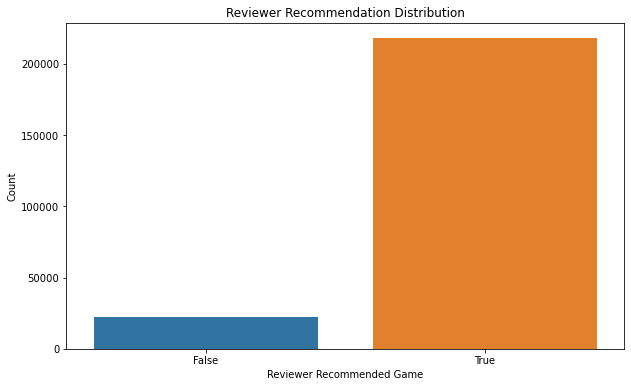

In [23]:
plt.figure(figsize=(10, 6))
sns.countplot(elden_ring_reviews['voted_up'])
plt.xlabel('Reviewer Recommended Game')
plt.ylabel('Count')
plt.title('Reviewer Recommendation Distribution')
plt.show()

In [24]:
elden_ring_reviews['voted_up'].value_counts() / len(elden_ring_reviews)

True     0.908088
False    0.091912
Name: voted_up, dtype: float64

Nearly 91% of the reviews left were voted up (reviewer recommended the game), while about 9% of the remaining viewers down voted the game (did not recommend the game).

Let's check the lengths of each reviews for quality control purposes of them:

In [41]:
elden_ring_reviews['review_length'] = [len(str(rev)) for rev in elden_ring_reviews['review']]

for i in range(1, 16):
    print('Reviews under length: {}'.format(i))
    print(len(np.where(elden_ring_reviews['review_length'] < i)[0]))
    #print()

Reviews under length: 1
0
Reviews under length: 2
1745
Reviews under length: 3
3441
Reviews under length: 4
10524
Reviews under length: 5
18618
Reviews under length: 6
22660
Reviews under length: 7
25233
Reviews under length: 8
29990
Reviews under length: 9
34309
Reviews under length: 10
41456
Reviews under length: 11
47008
Reviews under length: 12
51915
Reviews under length: 13
55927
Reviews under length: 14
59002
Reviews under length: 15
62671


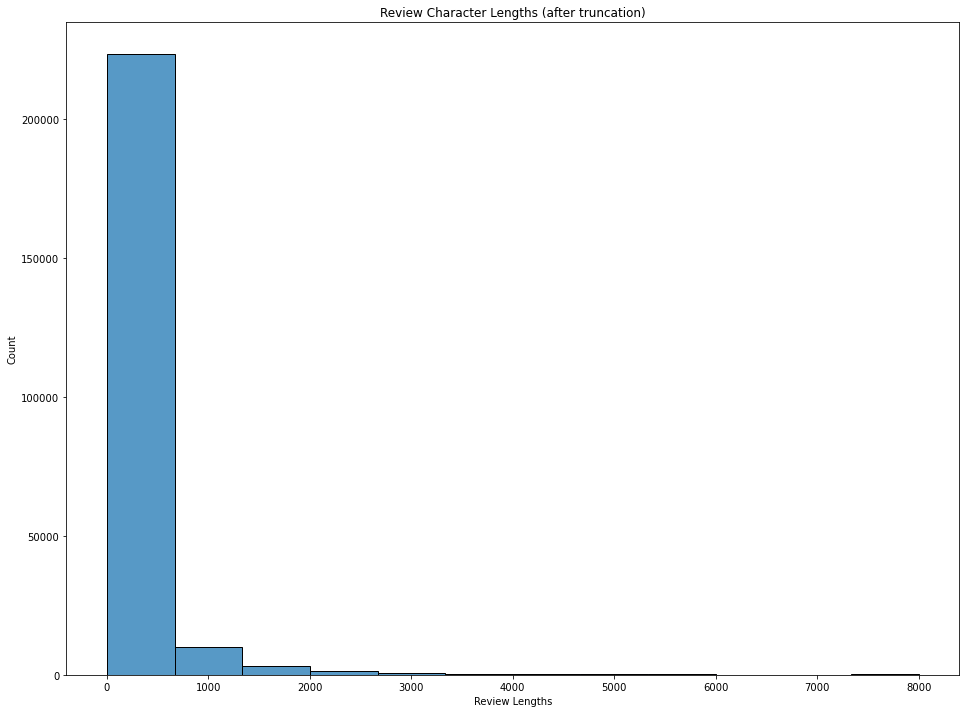

In [43]:
plt.figure(figsize=(16,12))
sns.histplot([len(str(rev)) for rev in elden_ring_reviews['review']], bins=12)
plt.title('Review Character Lengths (after truncation)')
plt.xlabel('Review Lengths')
plt.show()

We have many records where the length of the reviews are very short. We should remove these records in order to analyze the words amongst the reviews coming from genuine comments. We also should truncate reviews that are beyond 512 as creating a classifier using PyTorch & HuggingFace models can't process sequences greater than 512 characters.

In [46]:
#First, we'll look at how many records go beyond 512 characters as well as records less than a length of 15.

elden_ring_reviews[elden_ring_reviews['review_length']>=512].shape

(22110, 16)

In [47]:
elden_ring_reviews[elden_ring_reviews['review_length']<=15].shape

(66030, 16)

These are how many records we have which have review lengths greater than 512 characters.

In [48]:
elden_ring_reviews = elden_ring_reviews[elden_ring_reviews['review_length']>=15]
elden_ring_reviews = elden_ring_reviews[elden_ring_reviews['review_length']<=512]

elden_ring_reviews.reset_index(drop=True, inplace=True)
elden_ring_reviews.head()

,recommendationid,author,language,review,timestamp_created,timestamp_updated,voted_up,votes_up,votes_funny,weighted_vote_score,comment_count,steam_purchase,received_for_free,written_during_early_access,tokenized_texts,review_length
0,112052982,"{'steamid': '76561197971854668', 'num_games_ow...",english,First time with a Dark Souls type game and lov...,1647106589,1647106589,True,13373,1063,0.969001,0,True,False,False,"[time, dark, souls, type, game, love, 52, appa...",108
1,111180228,"{'steamid': '76561198142415989', 'num_games_ow...",english,"The note said ""chest ahead"" at the edge of a c...",1645984692,1645984692,True,10448,6200,0.968309,144,True,False,False,"[note, say, chest, ahead, edge, cliff, sight, ...",161
2,111834761,"{'steamid': '76561197996565477', 'num_games_ow...",english,you can hug a woman,1646786974,1646786974,True,7580,2737,0.965731,81,False,False,False,"[hug, woman]",19
3,111321870,"{'steamid': '76561197977618010', 'num_games_ow...",english,If you rush you can make it the hardest Souls ...,1646160050,1646160090,True,4839,63,0.965078,0,True,False,False,"[rush, hard, souls, game, play, bit, slow, sim...",496
4,111347314,"{'steamid': '76561198101636446', 'num_games_ow...",english,"""Try jumping""\n*20 bloodstains surrounding the...",1646188418,1646188418,True,7403,3884,0.961223,0,True,False,False,"[try, jump, 20, bloodstain, surround, message]",54


In [49]:
elden_ring_reviews.shape

(155367, 16)

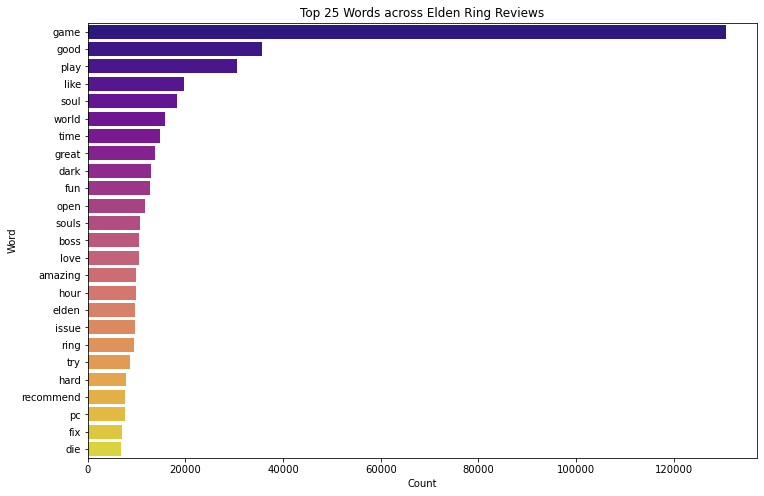

In [50]:
merged_tokenized_list = []
for tokens in elden_ring_reviews['tokenized_texts']:
    merged_tokenized_list += tokens
    
all_tokens = Counter(merged_tokenized_list) 

token_counts = all_tokens.most_common()

words = [tup[0] for tup in token_counts[:25]]
counts = [tup[1] for tup in token_counts[:25]]

plt.figure(figsize=(12,8))
g = sns.barplot(x=counts, y=words, palette='plasma')
g.set_title('Top 25 Words across Elden Ring Reviews')
g.set_xlabel('Count')
g.set_ylabel('Word')
plt.show(g)

These are the top 25 words that appear across all the reviews for Elden Ring. We can't gather much from this alone, but we can connect some dots with a little game knowledge. Players often comment about the enemies and bosses and how difficult they are. Therefore, we can see those words along with <i>'die'</i> and we can infer these are hot topics about the game. 

Of course, we can see some general positive adjectives, such as good, love, fun, amazing, even hard since these games are known for their difficulty.

Let's now create a stylecloud containing all tokenized words fro mrecords that were voted up (recommended)

In [51]:
#Getting all tokenized words into a single list

voted_up_df = elden_ring_reviews[elden_ring_reviews['voted_up']==True].copy()

merged_tokenized_list = []
for tokens in voted_up_df['tokenized_texts']:
    merged_tokenized_list += tokens

In [52]:
up_voted_tokens = Counter(merged_tokenized_list)

In [53]:
up_voted_tokens.most_common()

[('game', 114307),
 ('good', 33982),
 ('play', 26365),
 ('soul', 17248),
 ('like', 17178),
 ('world', 15004),
 ('time', 12853),
 ('great', 12716),
 ('dark', 11947),
 ('fun', 11665),
 ('open', 10986),
 ('souls', 10036),
 ('love', 9875),
 ('amazing', 9536),
 ('elden', 9210),
 ('ring', 9032),
 ('boss', 9032),
 ('hour', 8514),
 ('issue', 7643),
 ('try', 7328),
 ('hard', 7130),
 ('recommend', 6217),
 ('die', 6214),
 ('year', 5524),
 ('feel', 5386),
 ('far', 5012),
 ('want', 4879),
 ('hole', 4815),
 ('performance', 4776),
 ('get', 4762),
 ('lot', 4716),
 ('new', 4706),
 ('not', 4616),
 ('masterpiece', 4551),
 ('finger', 4541),
 ('buy', 4440),
 ('experience', 4420),
 ('run', 4408),
 ('well', 4317),
 ('explore', 4182),
 ('pc', 4181),
 ('enjoy', 4048),
 ('worth', 4011),
 ('fix', 3868),
 ('right', 3806),
 ('need', 3604),
 ('thing', 3544),
 ('way', 3437),
 ('fromsoft', 3415),
 ('beautiful', 3409),
 ('pretty', 3292),
 ('think', 3285),
 ('bad', 3211),
 ('big', 3185),
 ('come', 3143),
 ('beat', 3140

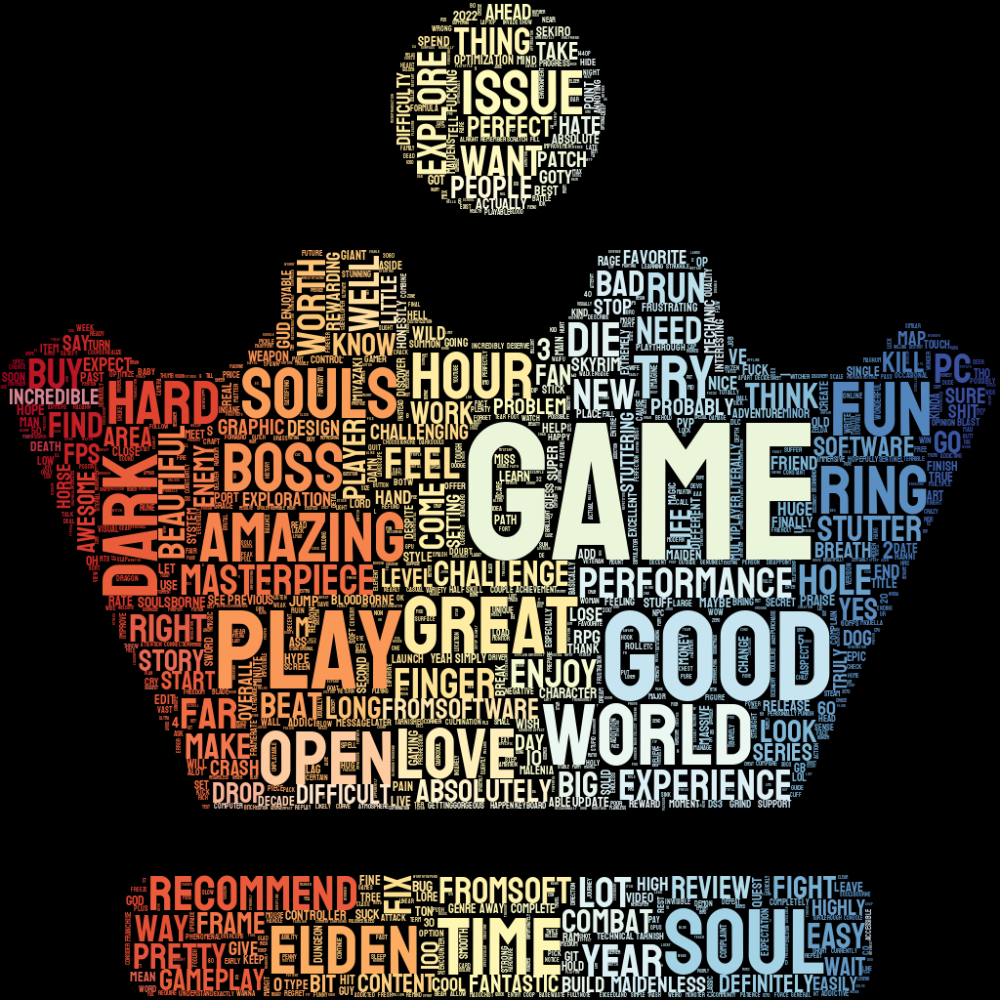

In [54]:
stylecloud.gen_stylecloud(text=up_voted_tokens,
                          icon_name='fas fa-chess-queen',
                          palette="colorbrewer.diverging.RdYlBu_11",
                          background_color='black',
                          gradient='horizontal',
                          size=1024)


Image(filename="./stylecloud.png", width=1024, height=1024)

Since these are only single words, we can make inferences on more specific words. 

The words <b>'Open' & 'World'</b> can be referred to the game's open-world concept, and <b>'Hard' & 'Boss'</b> refer to the game's difficulty. If you read some of the reviews that are the highest rated in terms of helpfulness, you can see that in the more thorough comments, players vaunt the game for these details. Despite the difficult bosses, people cite it as one of the game's strengths.

However, we are a little limited on what we can gather here since these are only single words. I believe N-Gram analysis on the data will reveal more accurate and representative data for us.

Let's now do the same but with only down voted records (records where the reviewer did not recommend the game)

In [55]:
voted_down_df = elden_ring_reviews[elden_ring_reviews['voted_up']==False].copy()

merged_tokenized_list = []
for tokens in voted_down_df['tokenized_texts']:
    merged_tokenized_list += tokens

In [56]:
down_voted_tokens = Counter(merged_tokenized_list)

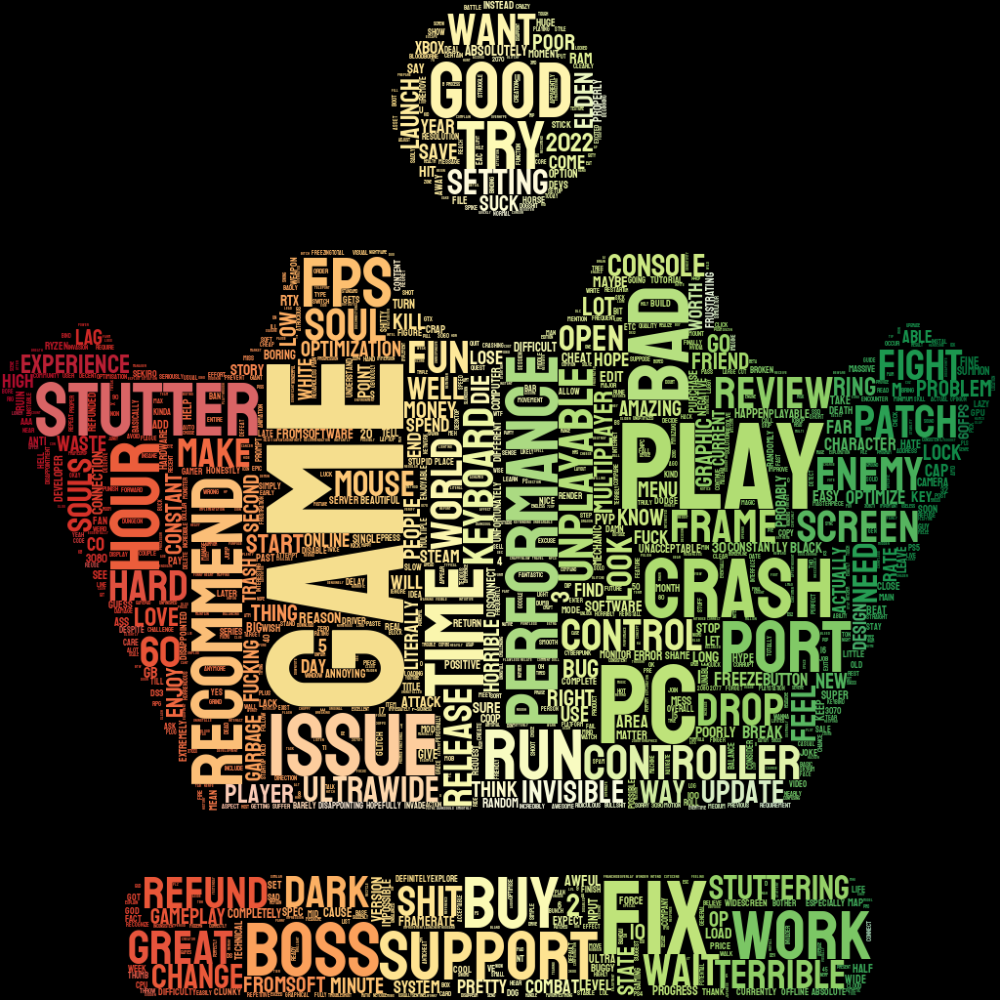

In [57]:
stylecloud.gen_stylecloud(text=down_voted_tokens,
                          icon_name='fas fa-chess-queen',
                          palette="colorbrewer.diverging.RdYlGn_11",
                          background_color='black',
                          gradient='horizontal',
                          size=1024)


Image(filename="./stylecloud.png", width=1024, height=1024)

'Stutter', 'Crash', 'fps', looking at only some of the down voted reviews, players may encounter these performance issues since this is a very heavy game on the computer. 'Enempy' inclinces me to think there are a lot of antipathy towards the game's enemies.

Again, while these styleclouds look pretty, I don't think they give an incisive look into the information behind all of the text. We can try N-gram analysis to take a look at those sequences. We'll use the NLTK library to perform this.

In [60]:
elden_ring_reviews.loc[:5, 'tokenized_texts']

0    [time, dark, souls, type, game, love, 52, appa...
1    [note, say, chest, ahead, edge, cliff, sight, ...
2                                         [hug, woman]
3    [rush, hard, souls, game, play, bit, slow, sim...
4       [try, jump, 20, bloodstain, surround, message]
5    [write, indepth, review, m, busy, play, elden,...
Name: tokenized_texts, dtype: object

We can start with uni-grams, then bi-grams, etc.

In [61]:
elden_ring_sentences = elden_ring_reviews.loc[:, 'tokenized_texts'].tolist()

elden_ring_sentences[0]

['time',
 'dark',
 'souls',
 'type',
 'game',
 'love',
 '52',
 'apparently',
 'late',
 'good']

In [62]:
start = time.time()

bi_grams = Counter(chain(*[nltk.ngrams(sentence, 2) for sentence in elden_ring_sentences]))

end = time.time()

print('Time taken to create bi-grams: {}'.format(end-start))

Time taken to create bi-grams: 2.1017751693725586


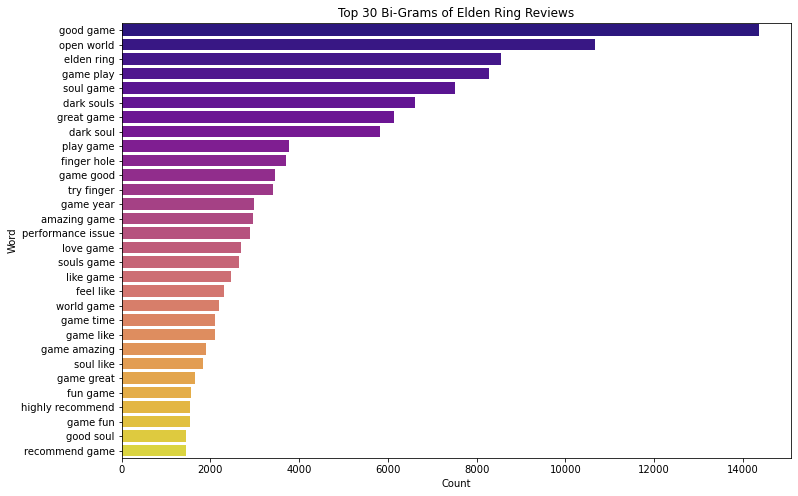

In [63]:
bi_gram_counts = bi_grams.most_common(30)

words = [' '.join(tup[0]) for tup in bi_gram_counts]
counts = [tup[1] for tup in bi_gram_counts]

plt.figure(figsize=(12,8))
g = sns.barplot(x=counts, y=words, palette='plasma')
g.set_title('Top 30 Bi-Grams of Elden Ring Reviews')
g.set_xlabel('Count')
g.set_ylabel('Word')
plt.show(g)

Alright, we can pick out a few things here. First, we can see a lot of 'great game', 'amazong game' compliments. We can also see more negative ones like 'performance issue'. But for the most part, these seem to be more general if not somwhat positive. 

Let's next go for Tri-Grams:

In [64]:
start = time.time()

tri_grams = Counter(chain(*[nltk.ngrams(sentence, 3) for sentence in elden_ring_sentences]))

end = time.time()

print('Time taken to create bi-grams: {}'.format(end-start))

Time taken to create bi-grams: 1.635587215423584


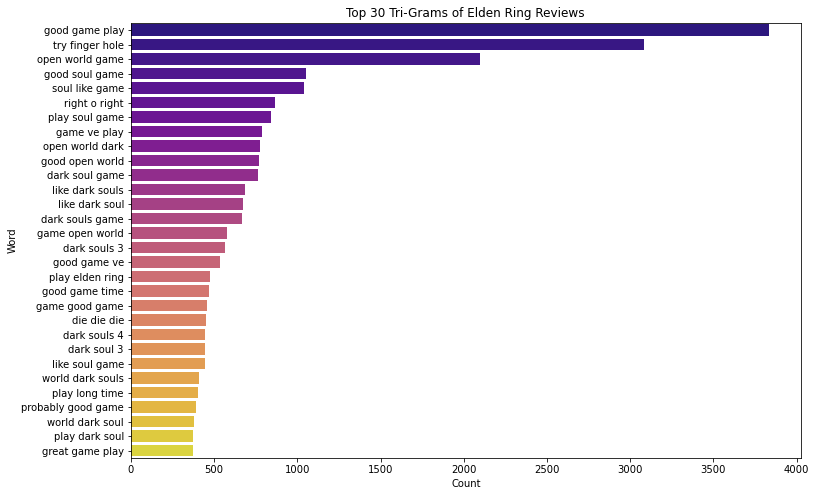

In [65]:
#After this finishes, we can try to do latent semantic analysis on this data. Can accomplish this with Gensim.

tri_gram_counts = tri_grams.most_common(30)

words = [' '.join(tup[0]) for tup in tri_gram_counts]
counts = [tup[1] for tup in tri_gram_counts]

plt.figure(figsize=(12,8))
g = sns.barplot(x=counts, y=words, palette='plasma')
g.set_title('Top 30 Tri-Grams of Elden Ring Reviews')
g.set_xlabel('Count')
g.set_ylabel('Word')
plt.show(g)

The longer our sequences, the more fine-grained we get here. We can spot some comparison sequences with 'like dark soul', and can infer some people are comparing this game to Dark Souls 3. The top one, 'open world game', seems to be something that is highlighted as one of the game's strong points. If you read a few reviews from video game media outlets like IGN, they report this element of the game as one of its biggest positives.

Let's now impute the missing review values and look at some other attrbiutes.

In [66]:
elden_ring_reviews['review'].fillna('NO REVIEW', inplace=True)

In [67]:
elden_ring_reviews.isnull().sum()

recommendationid               0
author                         0
language                       0
review                         0
timestamp_created              0
timestamp_updated              0
voted_up                       0
votes_up                       0
votes_funny                    0
weighted_vote_score            0
comment_count                  0
steam_purchase                 0
received_for_free              0
written_during_early_access    0
tokenized_texts                0
review_length                  0
dtype: int64

Let's see if we can identify some of the hot topics of the game below:

<b>How are the reviews with the most comments? What would their most common words be?</b>

In [68]:
highest_comment_df = elden_ring_reviews.sort_values(by='comment_count', ascending=False).iloc[:1000]

In [69]:
highest_comment_df

,recommendationid,author,language,review,timestamp_created,timestamp_updated,voted_up,votes_up,votes_funny,weighted_vote_score,comment_count,steam_purchase,received_for_free,written_during_early_access,tokenized_texts,review_length
39,110924671,"{'steamid': '76561198214013265', 'num_games_ow...",english,"[b] if you're stuttering, consider turning the...",1645755116,1645767652,True,6361,207,0.871587,368,False,False,False,"[b, stutter, consider, turn, setting, complete...",358
31,110909110,"{'steamid': '76561198303119637', 'num_games_ow...",english,H U M A N I T Y ....... R E S T O R E D,1645747116,1645895266,True,118,5,0.894538,181,True,False,False,"[h, u, m, n, t, y, r, e, s, t, o, r, e, d]",45
1,111180228,"{'steamid': '76561198142415989', 'num_games_ow...",english,"The note said ""chest ahead"" at the edge of a c...",1645984692,1645984692,True,10448,6200,0.968309,144,True,False,False,"[note, say, chest, ahead, edge, cliff, sight, ...",161
25,111699296,"{'steamid': '76561198137042170', 'num_games_ow...",english,[h1]---------No maidens?---------[/h1]\n⠸⡸⠜⠕⠕⠁...,1646595298,1646595515,True,3757,3657,0.903398,142,True,False,False,[],331
75,111176951,"{'steamid': '76561198067065303', 'num_games_ow...",english,"Game improved a lot since release date, no mor...",1645981719,1648855175,True,0,0,0.702388,127,True,False,False,"[game, improve, lot, release, date, stutter, c...",200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5226,110910513,"{'steamid': '76561197996797029', 'num_games_ow...",english,One of the best!\n\nUnfortunately I have some ...,1645750254,1646452537,True,1,0,0.529570,1,True,False,False,"[good, unfortunately, performance, issue, marc...",362
108119,111651589,"{'steamid': '76561198425708252', 'num_games_ow...",english,Game used to run like crap but after a few pat...,1646543841,1648696857,True,0,0,0.000000,1,False,False,False,"[game, run, like, crap, patch, anymore, issue,...",186
153724,110938711,"{'steamid': '76561198057784026', 'num_games_ow...",english,This game BIG\n\nFramerate stutters are the on...,1645765867,1648241888,True,0,0,0.000000,1,True,False,False,"[game, big, framerate, stutter, complaint, tbh...",92
66964,112658434,"{'steamid': '76561198070644835', 'num_games_ow...",english,this game is good i had a blast,1647976548,1647976548,True,0,0,0.000000,1,True,False,False,"[game, good, blast]",31


In [70]:
highest_comment_df['tokenized_texts']

39        [b, stutter, consider, turn, setting, complete...
31               [h, u, m, n, t, y, r, e, s, t, o, r, e, d]
1         [note, say, chest, ahead, edge, cliff, sight, ...
25                                                       []
75        [game, improve, lot, release, date, stutter, c...
                                ...                        
5226      [good, unfortunately, performance, issue, marc...
108119    [game, run, like, crap, patch, anymore, issue,...
153724    [game, big, framerate, stutter, complaint, tbh...
66964                                   [game, good, blast]
48861                                    [goddamn, amazing]
Name: tokenized_texts, Length: 1000, dtype: object

In [71]:
highest_comment_tokens = []

for tokens in highest_comment_df['tokenized_texts']:
    highest_comment_tokens.extend(tokens)

In [72]:
hc_counts = Counter(highest_comment_tokens).most_common()

hc_words = [hc[0] for hc in hc_counts]
hc_counts = [hc[1] for hc in hc_counts]

hc_df = pd.DataFrame({'Words':hc_words, 'Counts':hc_counts})

In [73]:
colors=['#ED33FF','#C233FF','#8D33FF','#6F33FF','#4033FF','#3395FF','#33D8FF']
import plotly.express as px

fig = px.treemap(hc_df.iloc[:50], path=['Words'],values='Counts', width=800, height=400, title='Reviews w/ Most Comments Top Words')
fig.update_layout(
    treemapcolorway = colors, #defines the colors in the treemap
    margin = dict(t=50, l=30, r=30, b=30))

fig.show()

In [74]:
highest_comment_df['review'].iloc[:10].tolist()

["[b] if you're stuttering, consider turning these settings down or even off completely: [/b]\n\n\n- Depth of Field\n- Motion Blur\n- Volumetric Quality\n- Global Illumination Quality\n- Grass Quality\n[hr][/hr]I had stuttering issues before I completely disabled DoF and Motion Blur. Game runs perfect now aside from short FPS-drops when a new region is being loaded.",
 'H U M A N I T Y      .......  R E S T O R E D',
 'The note said "chest ahead" at the edge of a cliff with nothing in sight...there were plenty of bloodstains but they must\'ve missed the jump... I had to be sure\n',
 '[h1]---------No maidens?---------[/h1]\n⠸⡸⠜⠕⠕⠁⢁⢇⢏⢽⢺⣪⡳⡝⣎⣏⢯⢞⡿⣟⣷⣳⢯⡷⣽⢽⢯⣳⣫⠇\n⠀⠀⢀⢀⢄⢬⢪⡪⡎⣆⡈⠚⠜⠕⠇⠗⠝⢕⢯⢫⣞⣯⣿⣻⡽⣏⢗⣗⠏⠀\n⠀⠪⡪⡪⣪⢪⢺⢸⢢⢓⢆⢤⢀⠀⠀⠀⠀⠈⢊⢞⡾⣿⡯⣏⢮⠷⠁\n⠀⠀⠀⠈⠊⠆⡃⠕⢕⢇⢇⢇⢇⢇⢏⢎⢎⢆⢄⠀⢑⣽⣿⢝⠲⠉\n⠀⠀⠀⠀⠀⡿⠂⠠⠀⡇⢇⠕⢈⣀⠀⠁⠡⠣⡣⡫⣂⣿⠯⢪⠰⠂\n⠀⠀⠀⠀⡦⡙⡂⢀⢤⢣⠣⡈⣾⡃⠠⠄⠀⡄⢱⣌⣶⢏⢊⠂\n⠀⠀⠀⠀⢝⡲⣜⡮⡏⢎⢌⢂⠙⠢⠐⢀⢘⢵⣽⣿⡿⠁⠁\n⠀⠀⠀⠀⠨⣺⡺⡕⡕⡱⡑⡆⡕⡅⡕⡜⡼⢽⡻⠏⠀\n⠀⠀⠀⠀⣼⣳⣫⣾⣵⣗⡵⡱⡡⢣⢑⢕⢜⢕⡝⠀\n⠀⠀⠀⣴⣿⣾⣿⣿⣿⡿⡽⡑⢌⠪⡢⡣⣣⡟⠀\n⠀⠀⠀⡟⡾⣿⢿⢿⢵⣽⣾⣼⣘⢸⢸⣞⡟⠀\n⠀⠀⠀⠀⠁⠇⠡⠩⡫⢿⣝⡻⡮⣒⢽⠋⠀',
 "Game improved a lot since release date, no more stutters or c

They seem to be fairly consistent with the top words. Looking at the reviews with the most comments, it is very top heavy (in terms of number of comments), and it tappers off quickly in terms of how many comments are on the review. These top 10 comments seem to be regarding the performance of the game, which we know is a heavily used word across the reviews.

<b>How about the comments with the most up votes?</b>

In [75]:
highest_votes_df = elden_ring_reviews.sort_values(by='votes_up', ascending=False).iloc[:1000]

In [76]:
highest_votes_tokens = []

for tokens in highest_votes_df['tokenized_texts']:
    highest_votes_tokens.extend(tokens)

In [77]:
highest_votes_df.head()

,recommendationid,author,language,review,timestamp_created,timestamp_updated,voted_up,votes_up,votes_funny,weighted_vote_score,comment_count,steam_purchase,received_for_free,written_during_early_access,tokenized_texts,review_length
0,112052982,"{'steamid': '76561197971854668', 'num_games_ow...",english,First time with a Dark Souls type game and lov...,1647106589,1647106589,True,13373,1063,0.969001,0,True,False,False,"[time, dark, souls, type, game, love, 52, appa...",108
1,111180228,"{'steamid': '76561198142415989', 'num_games_ow...",english,"The note said ""chest ahead"" at the edge of a c...",1645984692,1645984692,True,10448,6200,0.968309,144,True,False,False,"[note, say, chest, ahead, edge, cliff, sight, ...",161
60,110922981,"{'steamid': '76561198042661879', 'num_games_ow...",english,"Struggling to maintain 60FPS/1080p on a 3080, ...",1645753740,1645756397,False,9974,968,0.771891,0,True,False,False,"[struggle, maintain, 3080, massive, stuttering...",317
5,111353963,"{'steamid': '76561198040394534', 'num_games_ow...",english,"I would write a more indepth review, but im to...",1646195718,1646195718,True,8261,2195,0.955951,0,True,False,False,"[write, indepth, review, m, busy, play, elden,...",72
2,111834761,"{'steamid': '76561197996565477', 'num_games_ow...",english,you can hug a woman,1646786974,1646786974,True,7580,2737,0.965731,81,False,False,False,"[hug, woman]",19


In [78]:
votes_counts = Counter(highest_votes_tokens).most_common()

votes_words = [v[0] for v in votes_counts]
votes_counts = [v[1] for v in votes_counts]

votes_df = pd.DataFrame({'Words':votes_words, 'Counts':votes_counts})

In [79]:
fig = px.treemap(votes_df.iloc[:50], path=['Words'],values='Counts', width=800, height=400, title='Reviews w/ Most Up-Votes Top Words')
fig.update_layout(
    treemapcolorway = colors, #defines the colors in the treemap
    margin = dict(t=50, l=30, r=30, b=30))

fig.show()

In [80]:
highest_votes_df['review'].iloc[:10].tolist()

["First time with a Dark Souls type game and loving it. I am 52 so apparently it's never too late to get good.",
 'The note said "chest ahead" at the edge of a cliff with nothing in sight...there were plenty of bloodstains but they must\'ve missed the jump... I had to be sure\n',
 'Struggling to maintain 60FPS/1080p on a 3080, massive stuttering and drops to the mid 20s, crashed 4 times within 2 hours of game time, 60 FPS cap, and no ultrawide support.\n\nOn top of all that, Easy-Anti cheat will prevent any unofficial fixes or mods for this game, even when playing offline.\n\nThis is unacceptable.',
 'I would write a more indepth review, but im too busy playing Elden Ring.',
 'you can hug a woman',
 '"Try jumping"\n*20 bloodstains surrounding the message*',
 "[b] if you're stuttering, consider turning these settings down or even off completely: [/b]\n\n\n- Depth of Field\n- Motion Blur\n- Volumetric Quality\n- Global Illumination Quality\n- Grass Quality\n[hr][/hr]I had stuttering issu

It seems the most common topic among these top 10 reviews with the most up-votes also regard the performance of the game. Outside of this topic though, the reviews talk about an aspect of the game or vaunt it.

In [81]:
elden_ring_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155367 entries, 0 to 155366
Data columns (total 16 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   recommendationid             155367 non-null  int64  
 1   author                       155367 non-null  object 
 2   language                     155367 non-null  object 
 3   review                       155367 non-null  object 
 4   timestamp_created            155367 non-null  int64  
 5   timestamp_updated            155367 non-null  int64  
 6   voted_up                     155367 non-null  bool   
 7   votes_up                     155367 non-null  int64  
 8   votes_funny                  155367 non-null  int64  
 9   weighted_vote_score          155367 non-null  float64
 10  comment_count                155367 non-null  int64  
 11  steam_purchase               155367 non-null  bool   
 12  received_for_free            155367 non-null  bool   
 13 

I believe using styleclouds and plotly charts, we've seen what we can with individual words. In the next notebook, we'll proceed with further processing and sentiment analysis by trying to predict whether a reviewer will recommend the game or not.

In [84]:
for lis in elden_ring_reviews.loc[:10, 'tokenized_texts']:
    print(lis[0])

time
note
hug
rush
try
write
time
near
play
tf
hug


In [85]:
elden_ring_reviews.dtypes

recommendationid                 int64
author                          object
language                        object
review                          object
timestamp_created                int64
timestamp_updated                int64
voted_up                          bool
votes_up                         int64
votes_funny                      int64
weighted_vote_score            float64
comment_count                    int64
steam_purchase                    bool
received_for_free                 bool
written_during_early_access       bool
tokenized_texts                 object
review_length                    int64
dtype: object

In [86]:
elden_ring_reviews.to_csv("elden_ring_reviews_processed.csv")

We now have a more consistent and cleaned up dataframe of reviews. Next, we'll try to use them and classify the reviews' sentiment for whether they were recommended or non-recommended.